# Prognosticating Dwelling Cost

Problem statement:
A house value is simply more than location and square footage. Like the features that make up a person, an educated party would want to know all aspects that give a house its value. For example, you want to sell a house and you don’t know the price which you can take — it can’t be too low or too high. To find house price you usually try to find similar properties in your neighbourhood and based on gathered data you will try to assess your house price.

Objective:
Take advantage of all of the feature variables available below, use it to analyse and predict house prices. 1. cid: a notation for a house 2. dayhours: Date house was sold 3. price: Price is prediction target 4. room_bed: Number of Bedrooms/House 5. room_bath: Number of bathrooms/bedrooms 6. living_measure: square footage of the home 7. lot_measure: quare footage of the lot 8. ceil: Total floors (levels) in house 9. coast: House which has a view to a waterfront 10. sight: Has been viewed 11. condition: How good the condition is (Overall) 12. quality: grade given to the housing unit, based on grading system 13. ceil_measure: square footage of house apart from basement 14. basement_measure: square footage of the basement 15. yr_built: Built Year 16. yr_renovated: Year when house was renovated 17. zipcode: zip 18. lat: Latitude coordinate 19. long: Longitude coordinate 20. living_measure15: Living room area in 2015(implies-- some renovations) This might or might not have affected the lotsize area 21. lot_measure15: lotSize area in 2015(implies-- some renovations) 22. furnished: Based on the quality of room 23: total_area: Measure of both living and lot.

## Importing the Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

## Loading the Data and checking some basic information

In [3]:
city = pd.read_csv('innercity.csv')

In [4]:
pd.set_option('display.max_columns',None)

In [5]:
city.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3034200666,20141107T000000,808100,4,3.25,3020,13457,1.0,0,0,5,9,3020,0,1956,0,98133,47.7174,-122.336,2120,7553,1,16477
1,8731981640,20141204T000000,277500,4,2.50,2550,7500,1.0,0,0,3,8,1750,800,1976,0,98023,47.3165,-122.386,2260,8800,0,10050
2,5104530220,20150420T000000,404000,3,2.50,2370,4324,2.0,0,0,3,8,2370,0,2006,0,98038,47.3515,-121.999,2370,4348,0,6694
3,6145600285,20140529T000000,300000,2,1.00,820,3844,1.0,0,0,4,6,820,0,1916,0,98133,47.7049,-122.349,1520,3844,0,4664
4,8924100111,20150424T000000,699000,2,1.50,1400,4050,1.0,0,0,4,8,1400,0,1954,0,98115,47.6768,-122.269,1900,5940,0,5450


In [6]:
city.shape

(21613, 23)

In [7]:
city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
cid                 21613 non-null int64
dayhours            21613 non-null object
price               21613 non-null int64
room_bed            21613 non-null int64
room_bath           21613 non-null float64
living_measure      21613 non-null int64
lot_measure         21613 non-null int64
ceil                21613 non-null float64
coast               21613 non-null int64
sight               21613 non-null int64
condition           21613 non-null int64
quality             21613 non-null int64
ceil_measure        21613 non-null int64
basement            21613 non-null int64
yr_built            21613 non-null int64
yr_renovated        21613 non-null int64
zipcode             21613 non-null int64
lat                 21613 non-null float64
long                21613 non-null float64
living_measure15    21613 non-null int64
lot_measure15       21613 non-null int64
furnished           2

In [8]:
city.describe()

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,2.161300e+04
mean,4.580302e+09,5.401822e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652,0.196687,1.718687e+04
std,2.876566e+09,3.673622e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631,0.397503,4.158908e+04
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,0.000000,1.423000e+03
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000,0.000000,7.035000e+03
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000,0.000000,9.575000e+03
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,0.000000,1.300000e+04
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,1.000000,1.652659e+06


In [9]:
city.isnull().sum()

cid                 0
dayhours            0
price               0
room_bed            0
room_bath           0
living_measure      0
lot_measure         0
ceil                0
coast               0
sight               0
condition           0
quality             0
ceil_measure        0
basement            0
yr_built            0
yr_renovated        0
zipcode             0
lat                 0
long                0
living_measure15    0
lot_measure15       0
furnished           0
total_area          0
dtype: int64

In [10]:
city.nunique()

cid                 21436
dayhours              372
price                3625
room_bed               13
room_bath              30
living_measure       1038
lot_measure          9782
ceil                    6
coast                   2
sight                   5
condition               5
quality                12
ceil_measure          946
basement              306
yr_built              116
yr_renovated           70
zipcode                70
lat                  5034
long                  752
living_measure15      777
lot_measure15        8689
furnished               2
total_area          11163
dtype: int64

## Dealing with Dayhours column.

In [11]:
## We can convert this into 3 separate columns:

# 1. Year
city['year'] = city.dayhours.str[0:4]

In [12]:
## 2. Month
city['month'] = city.dayhours.str[4:6]

In [13]:
## 3. Date
city['day'] = city.dayhours.str[6:8]

In [14]:
## The Time stamp data is redundant as it doesn't have any uniue values. So there is no need to find the find the timestamp 
## column
city['dayhours'].str[8:].value_counts()

T000000    21613
Name: dayhours, dtype: int64

In [15]:
## Now we can remove the 'dayhours' columns as it is redundant now:
city = city.drop('dayhours', axis=1)

### Let's change the datatype of these three columns from object to integer.

In [16]:
city['day'] = city.day.astype(int)

In [17]:
city['month'] = city.month.astype(int)

In [18]:
city['year'] = city.year.astype(int)

In [19]:
city.head()

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,year,month,day
0,3034200666,808100,4,3.25,3020,13457,1.0,0,0,5,9,3020,0,1956,0,98133,47.7174,-122.336,2120,7553,1,16477,2014,11,7
1,8731981640,277500,4,2.50,2550,7500,1.0,0,0,3,8,1750,800,1976,0,98023,47.3165,-122.386,2260,8800,0,10050,2014,12,4
2,5104530220,404000,3,2.50,2370,4324,2.0,0,0,3,8,2370,0,2006,0,98038,47.3515,-121.999,2370,4348,0,6694,2015,4,20
3,6145600285,300000,2,1.00,820,3844,1.0,0,0,4,6,820,0,1916,0,98133,47.7049,-122.349,1520,3844,0,4664,2014,5,29
4,8924100111,699000,2,1.50,1400,4050,1.0,0,0,4,8,1400,0,1954,0,98115,47.6768,-122.269,1900,5940,0,5450,2015,4,24


## Plotting Heatmap of the data to check the correlation between the columns.

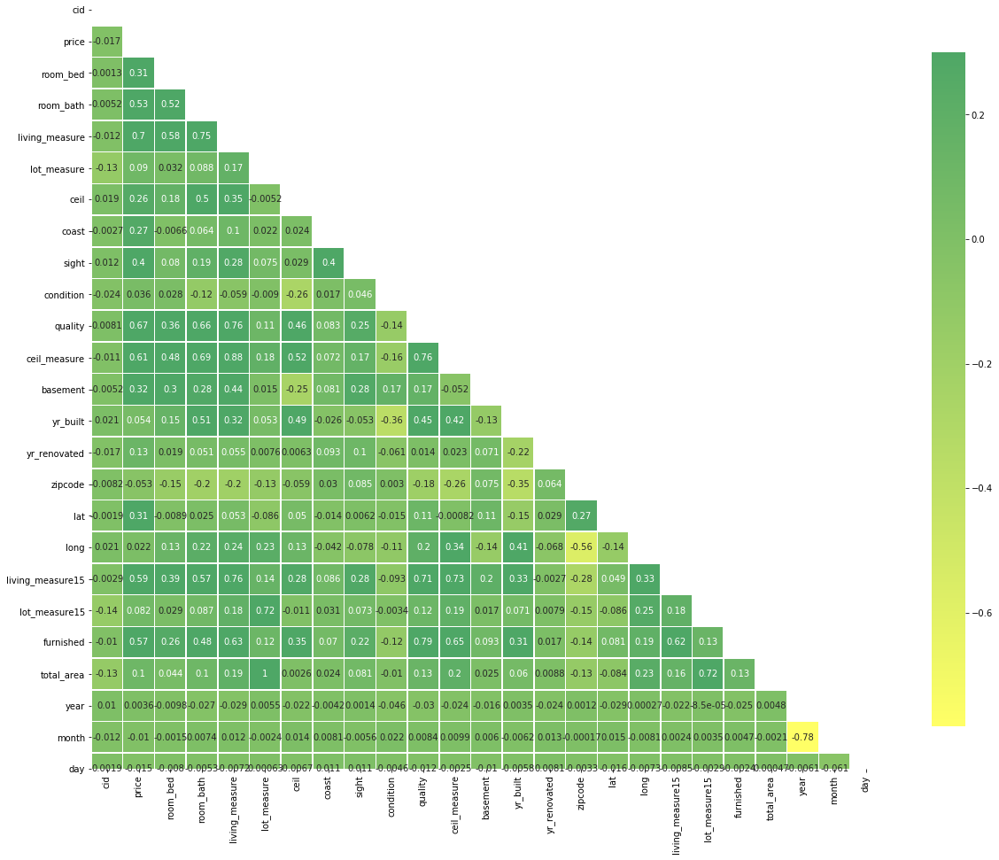

In [20]:
mask = np.zeros_like(city.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(20,20))
sns.heatmap(data = city.corr(), annot = True,cmap='summer_r',vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .7}, mask = mask)
plt.show()

## Inferences:

1. Price column has good positive coorelation with the "living_measure" column and also with "quality" column.


2. "lot_measure" has perfect coorelation with "total_area" column

## Since the correlation between lot_measure and total_area is 1, so we'll remove total_area column to prevent multicollinearity between them.

In [21]:
city = city.drop('total_area',axis=1)

## Let's do the Univariate Analysis of the columns.

In [22]:
def univariate(column):
    print('Description \n', column.describe(), '\n')
    if (len(column.unique()) > 30):
        print('**********************************************************************************')
        IQR = column.quantile(0.75) - column.quantile(0.25)
        print('Upper Limit:-', column.quantile(0.75)+ 1.5*IQR)
        print('Lower Limit:-', column.quantile(0.25)- 1.5*IQR)
        print('**********************************************************************************')
        print("Skewness:-",column.skew())
    else:
        print('****************************Value Counts******************************************')
        print(column.value_counts())
    print('\n *****************************Some Plots******************************************')
    fig, ax = plt.subplots(2,2,figsize=(30,30))
    if (len(column.unique()) > 30):
        ax[0,0].set_title('Distplot')
        sns.distplot(column, ax=ax[0,0])
    else:
        ax[0,0].set_title('Countplot')
        sns.countplot(column, ax=ax[0,0])
    ax[0,1].set_title('Boxplot')
    sns.boxplot(column, ax=ax[0,1])
    ax[1,0].set_title('Violinplot')
    sns.violinplot(column, ax=ax[1,0])
    ax[1,1].set_title('Stripplot')
    sns.stripplot(column, ax=ax[1,1])
    plt.show()

In [23]:
def transform(column):
    plt.figure(figsize = (8,6))
    sns.kdeplot(np.log(column))
    plt.xticks(rotation = 'vertical')
    plt.title('After applying the log transformation')
    plt.show()

# 1. Price

Description 
 count    2.161300e+04
mean     5.401822e+05
std      3.673622e+05
min      7.500000e+04
25%      3.219500e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64 

**********************************************************************************
Upper Limit:- 1129575.0
Lower Limit:- -162625.0
**********************************************************************************
Skewness:- 4.021715573048684

 *****************************Some Plots******************************************


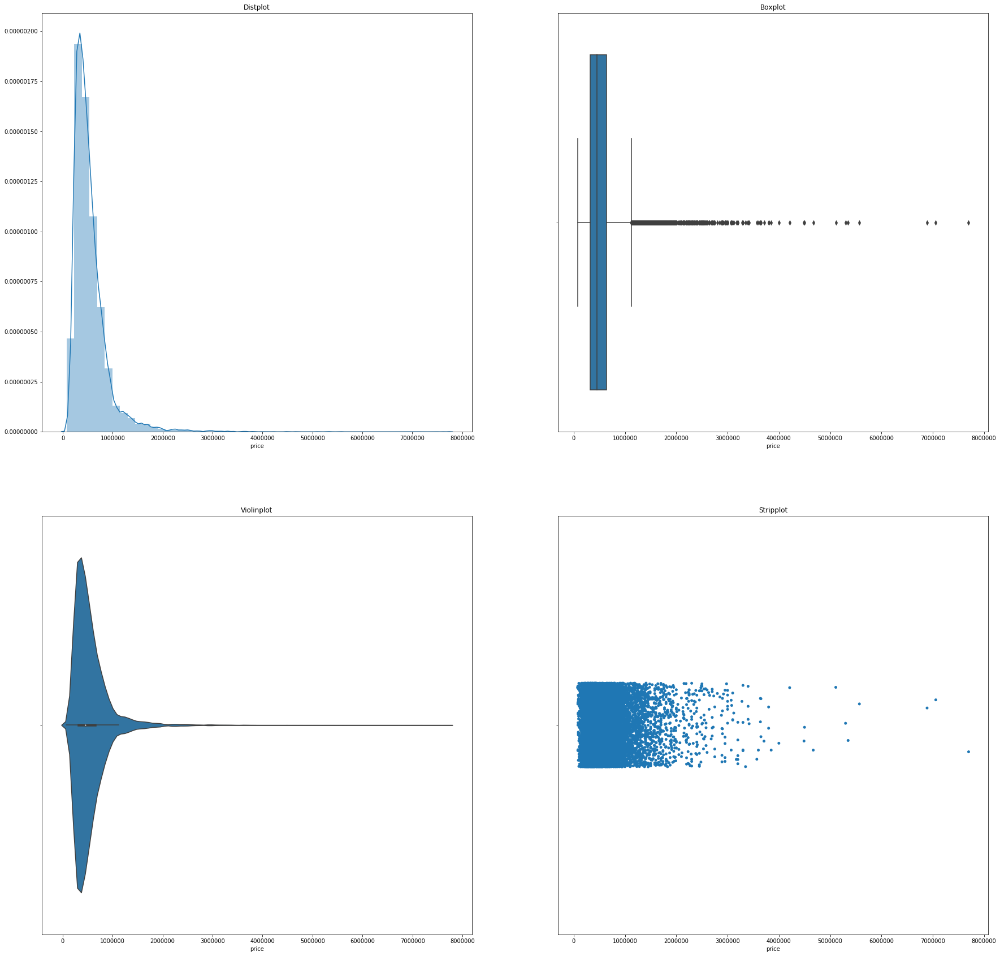

In [24]:
univariate(city.price)

### This data is right skewed. Let's do a log transformation

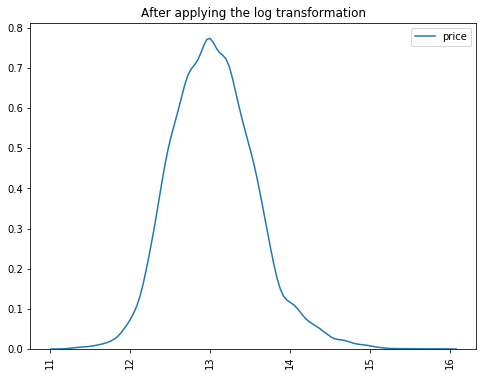

In [25]:
transform(city.price)

### Now the data is somewhat normally distributed.

# 2. Room_Bed

Description 
 count    21613.000000
mean         3.370842
std          0.930062
min          0.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         33.000000
Name: room_bed, dtype: float64 

****************************Value Counts******************************************
3     9824
4     6882
2     2760
5     1601
6      272
1      199
7       38
8       13
0       13
9        6
10       3
11       1
33       1
Name: room_bed, dtype: int64

 *****************************Some Plots******************************************


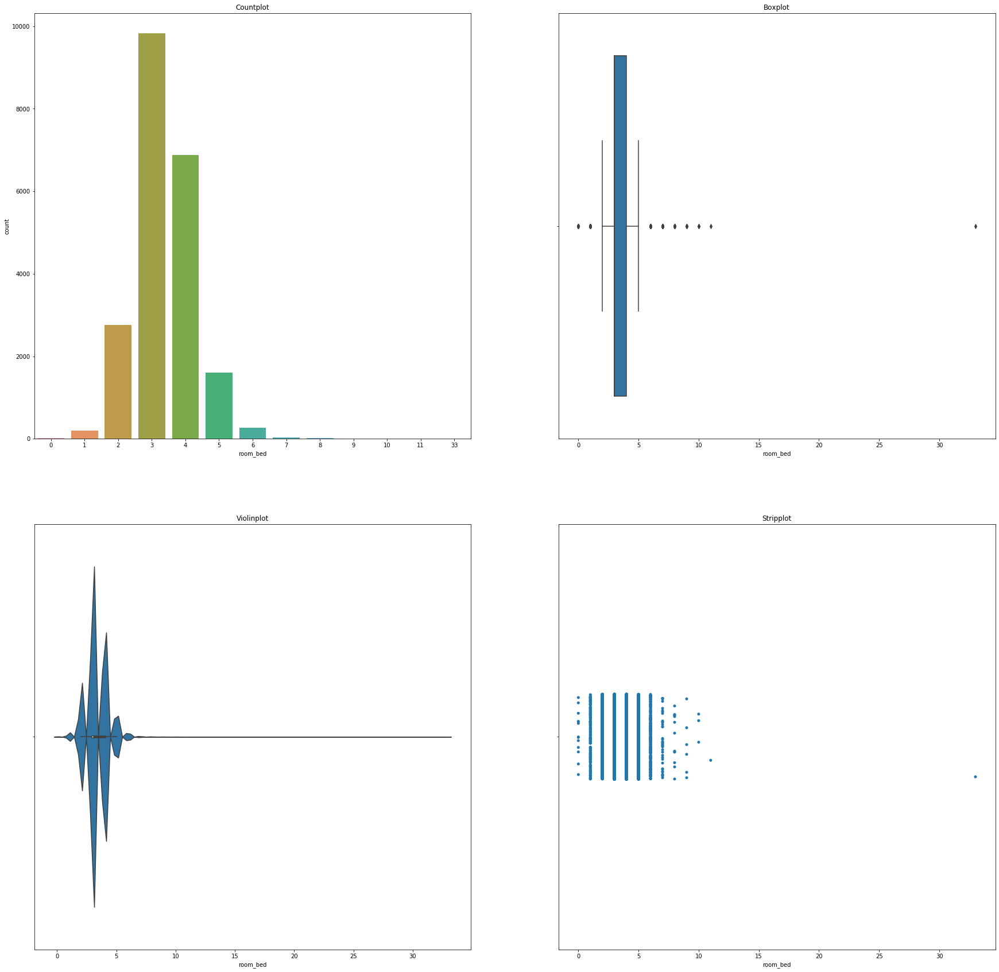

In [26]:
univariate(city.room_bed)

In [27]:
No_of_bedrooms = city['room_bed'].value_counts().reset_index()

In [28]:
No_of_bedrooms.columns = ['No_of_Bedrooms','Number_of_Houses']

In [29]:
No_of_bedrooms

,No_of_Bedrooms,Number_of_Houses
0,3,9824
1,4,6882
2,2,2760
3,5,1601
4,6,272
5,1,199
6,7,38
7,8,13
8,0,13
9,9,6


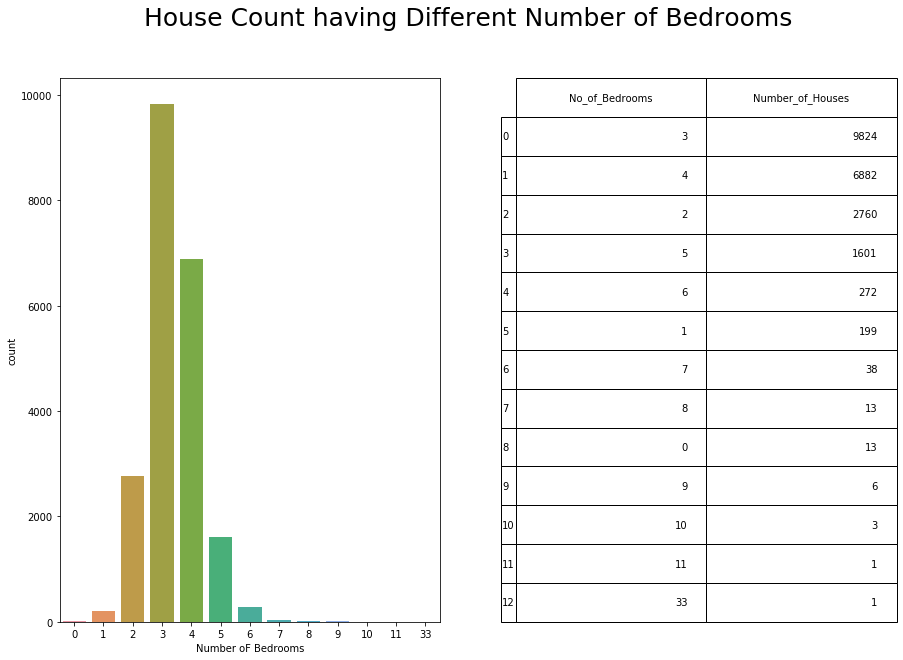

In [30]:
figure,ax = plt.subplots(1,2, figsize = (15,10))
bbox=[0, 0, 1, 1]
sns.countplot(x = city['room_bed'] ,ax = ax[0])
figure.suptitle(' House Count having Different Number of Bedrooms', fontsize=25)
ax[1].axis('off')
ax[0].set_xlabel("Number oF Bedrooms")
ax[1].table(cellText = No_of_bedrooms.values, rowLabels = No_of_bedrooms.index, colLabels=No_of_bedrooms.columns,bbox=bbox)
plt.show()

# 3. Room_Bath

Description 
 count    21613.000000
mean         2.114757
std          0.770163
min          0.000000
25%          1.750000
50%          2.250000
75%          2.500000
max          8.000000
Name: room_bath, dtype: float64 

****************************Value Counts******************************************
2.50    5380
1.00    3852
1.75    3048
2.25    2047
2.00    1930
1.50    1446
2.75    1185
3.00     753
3.50     731
3.25     589
3.75     155
4.00     136
4.50     100
4.25      79
0.75      72
4.75      23
5.00      21
5.25      13
5.50      10
0.00      10
1.25       9
6.00       6
5.75       4
0.50       4
6.25       2
8.00       2
6.75       2
6.50       2
7.50       1
7.75       1
Name: room_bath, dtype: int64

 *****************************Some Plots******************************************


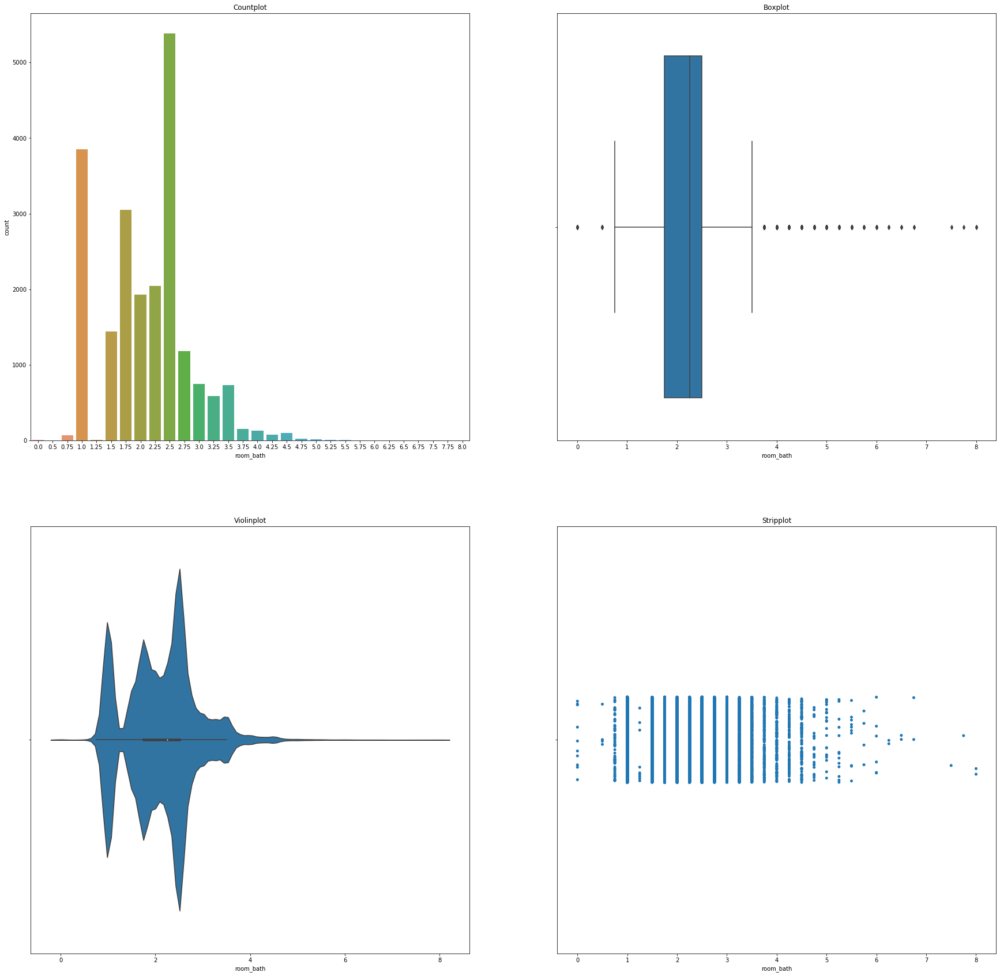

In [31]:
univariate(city.room_bath)

# 4. Living_Measure

Description 
 count    21613.000000
mean      2079.899736
std        918.440897
min        290.000000
25%       1427.000000
50%       1910.000000
75%       2550.000000
max      13540.000000
Name: living_measure, dtype: float64 

**********************************************************************************
Upper Limit:- 4234.5
Lower Limit:- -257.5
**********************************************************************************
Skewness:- 1.471555426802092

 *****************************Some Plots******************************************


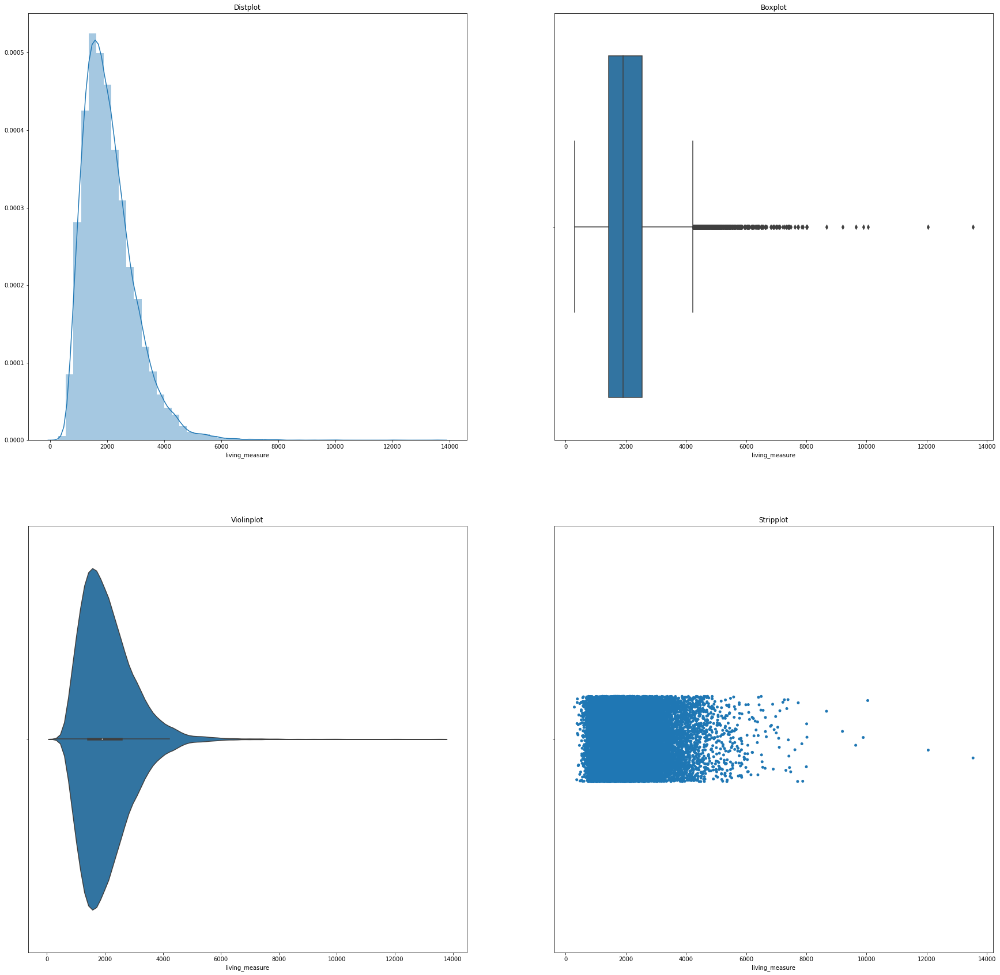

In [32]:
univariate(city.living_measure)

### This data is right skewed. Let's do a log transformation

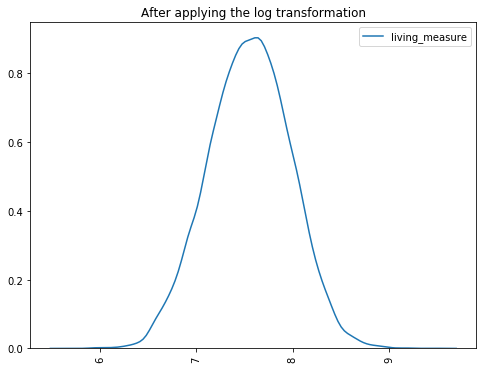

In [33]:
transform(city.living_measure)

### Now the data is normally distributed.

# 5. Lot_Measure

Description 
 count    2.161300e+04
mean     1.510697e+04
std      4.142051e+04
min      5.200000e+02
25%      5.040000e+03
50%      7.618000e+03
75%      1.068800e+04
max      1.651359e+06
Name: lot_measure, dtype: float64 

**********************************************************************************
Upper Limit:- 19160.0
Lower Limit:- -3432.0
**********************************************************************************
Skewness:- 13.06001895903175

 *****************************Some Plots******************************************


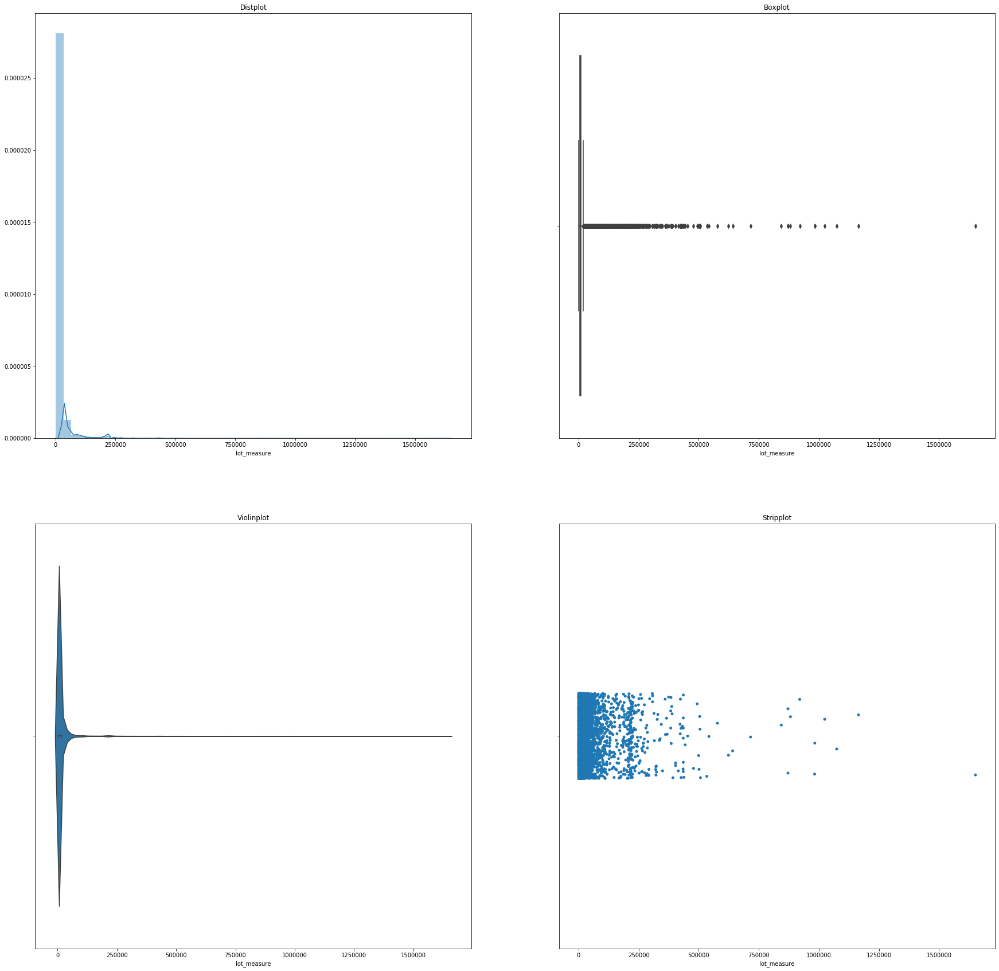

In [34]:
univariate(city.lot_measure)

### This data is heavily right skewed. Let's do a log transformation

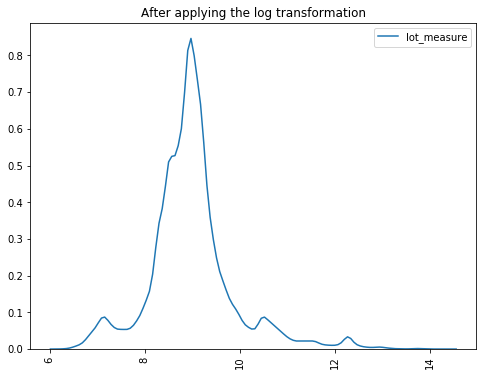

In [35]:
transform(city.lot_measure)

### Now the data's distribution is improved

# 6. Ceil

Description 
 count    21613.000000
mean         1.494309
std          0.539989
min          1.000000
25%          1.000000
50%          1.500000
75%          2.000000
max          3.500000
Name: ceil, dtype: float64 

****************************Value Counts******************************************
1.0    10680
2.0     8241
1.5     1910
3.0      613
2.5      161
3.5        8
Name: ceil, dtype: int64

 *****************************Some Plots******************************************


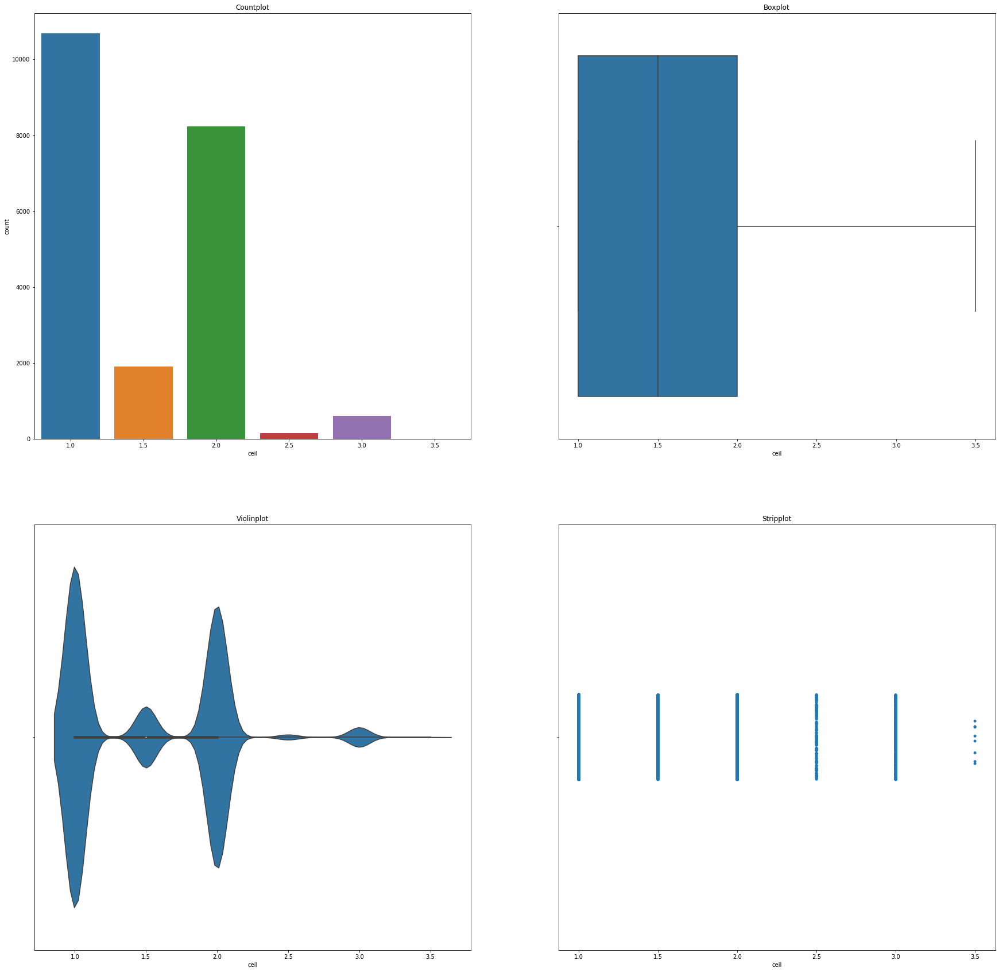

In [36]:
univariate(city.ceil)

# 7. Coast

Description 
 count    21613.000000
mean         0.007542
std          0.086517
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: coast, dtype: float64 

****************************Value Counts******************************************
0    21450
1      163
Name: coast, dtype: int64

 *****************************Some Plots******************************************


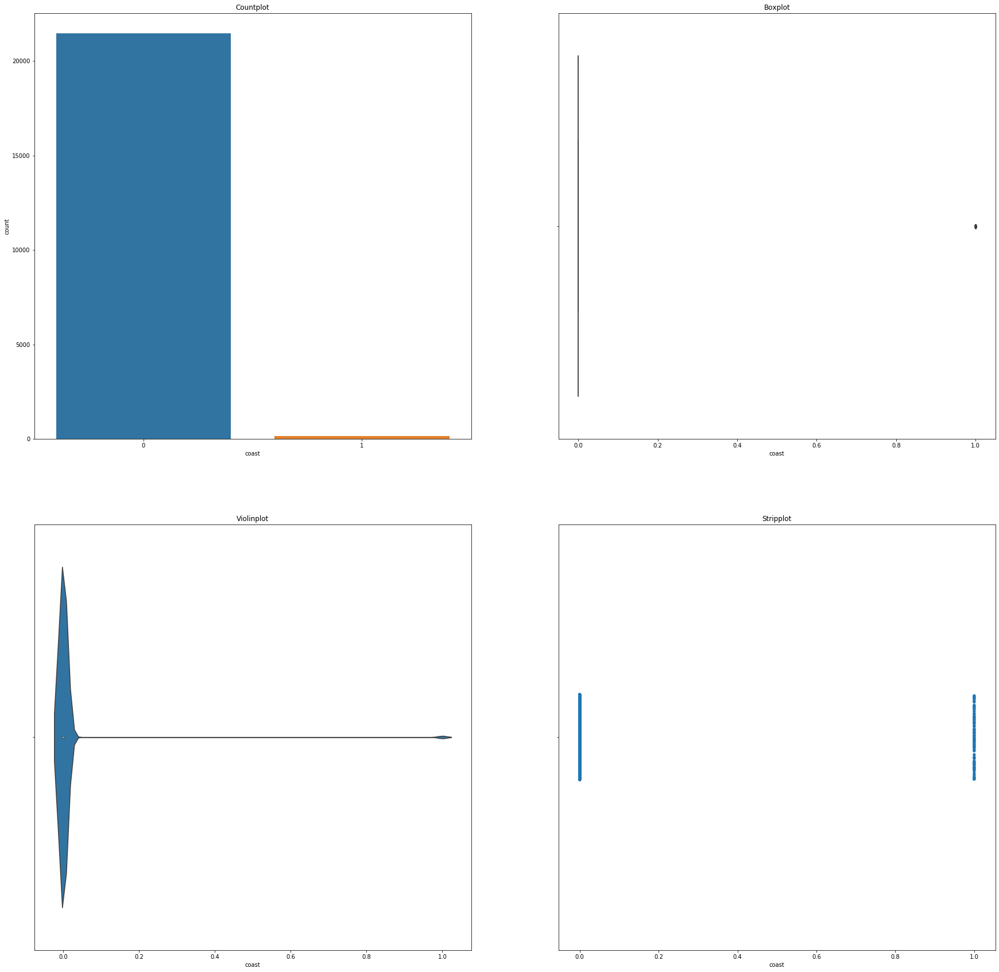

In [37]:
univariate(city.coast)

# 8. Sight

Description 
 count    21613.000000
mean         0.234303
std          0.766318
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          4.000000
Name: sight, dtype: float64 

****************************Value Counts******************************************
0    19489
2      963
3      510
1      332
4      319
Name: sight, dtype: int64

 *****************************Some Plots******************************************


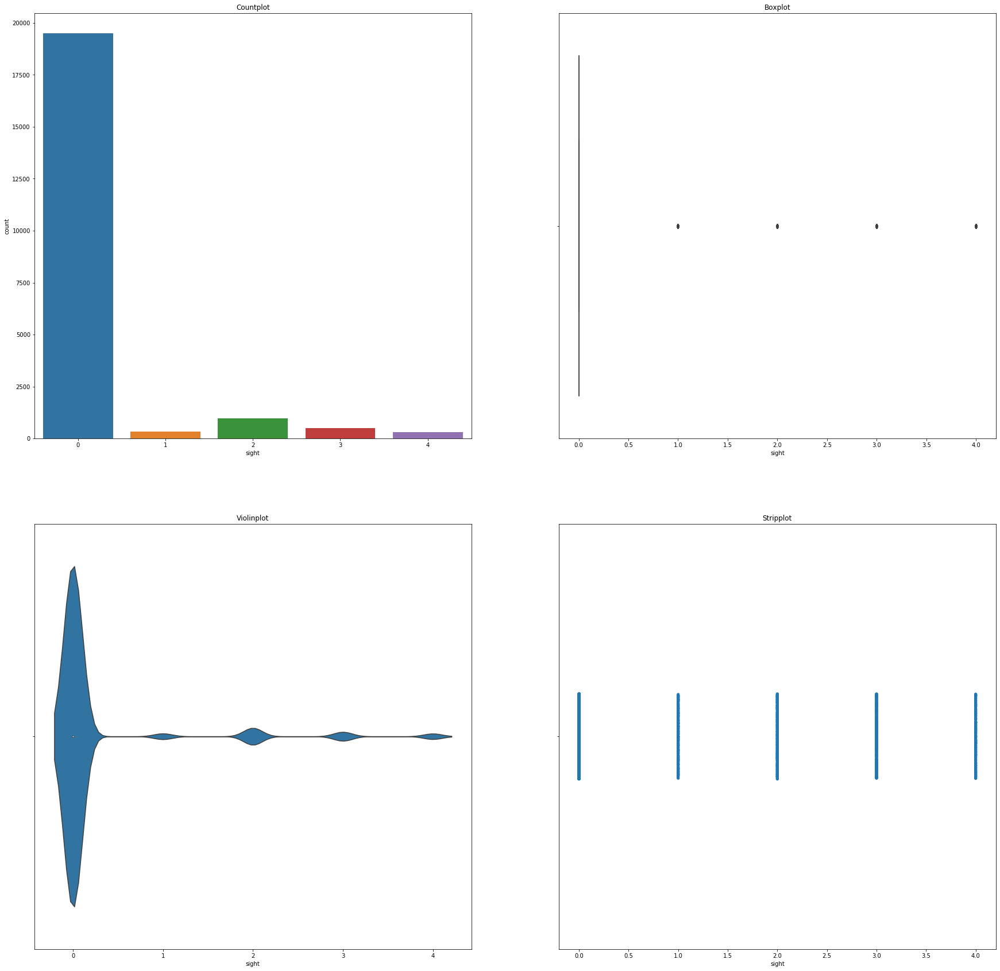

In [38]:
univariate(city.sight)

# 9. Condition

Description 
 count    21613.000000
mean         3.409430
std          0.650743
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: condition, dtype: float64 

****************************Value Counts******************************************
3    14031
4     5679
5     1701
2      172
1       30
Name: condition, dtype: int64

 *****************************Some Plots******************************************


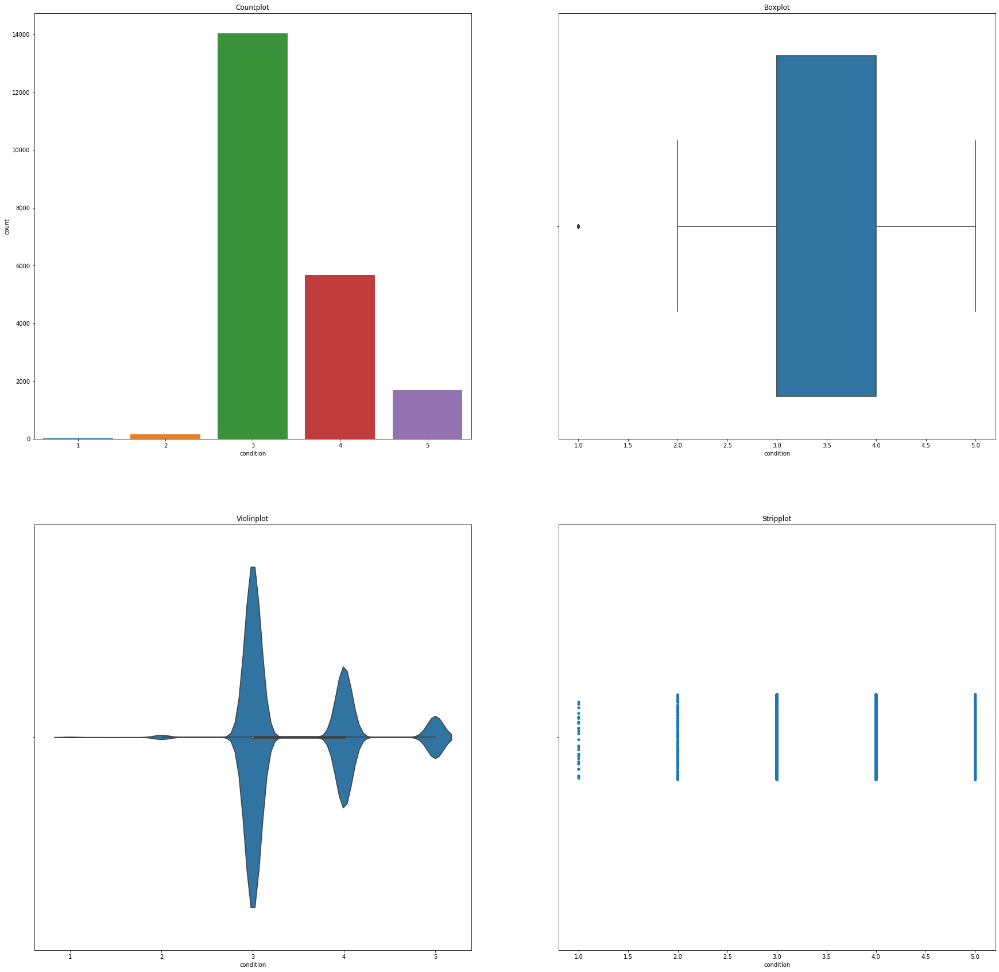

In [39]:
univariate(city.condition)

# 10. Quality

Description 
 count    21613.000000
mean         7.656873
std          1.175459
min          1.000000
25%          7.000000
50%          7.000000
75%          8.000000
max         13.000000
Name: quality, dtype: float64 

****************************Value Counts******************************************
7     8981
8     6068
9     2615
6     2038
10    1134
11     399
5      242
12      90
4       29
13      13
3        3
1        1
Name: quality, dtype: int64

 *****************************Some Plots******************************************


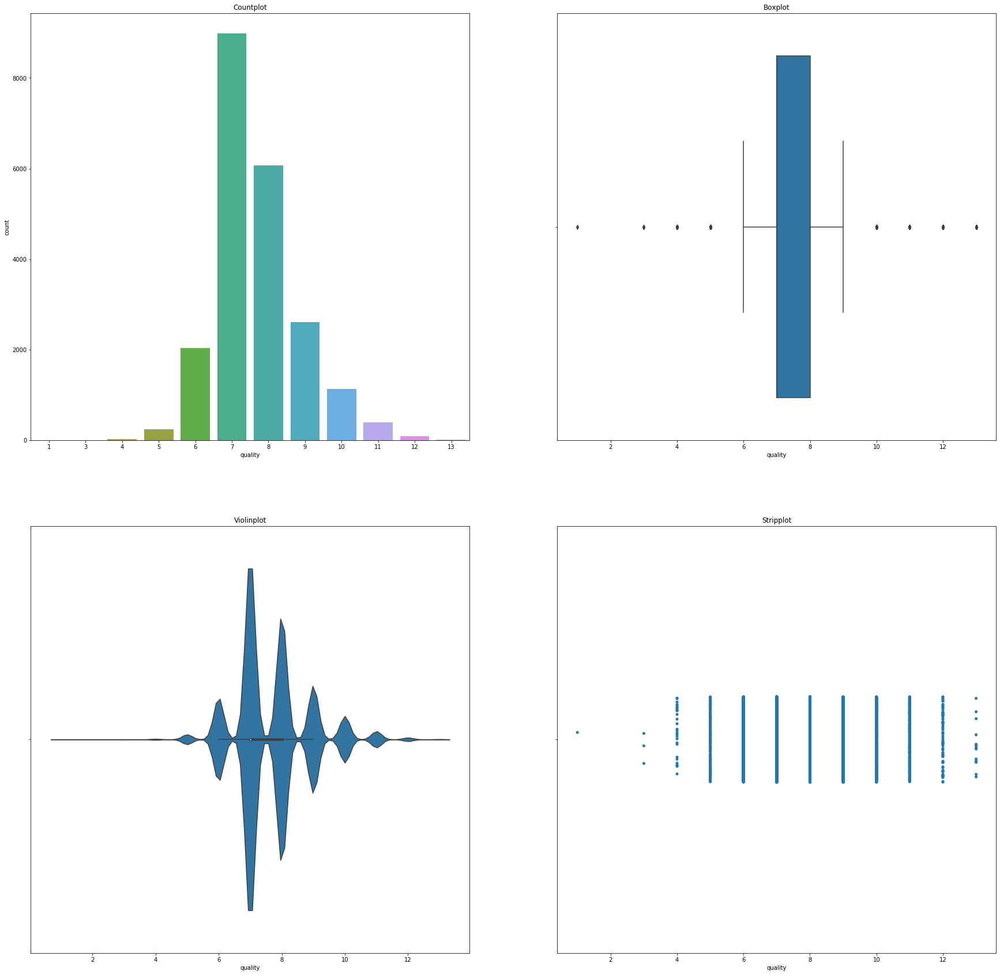

In [40]:
univariate(city.quality)

# 11. Ceil_Measure

Description 
 count    21613.000000
mean      1788.390691
std        828.090978
min        290.000000
25%       1190.000000
50%       1560.000000
75%       2210.000000
max       9410.000000
Name: ceil_measure, dtype: float64 

**********************************************************************************
Upper Limit:- 3740.0
Lower Limit:- -340.0
**********************************************************************************
Skewness:- 1.4466644733818372

 *****************************Some Plots******************************************


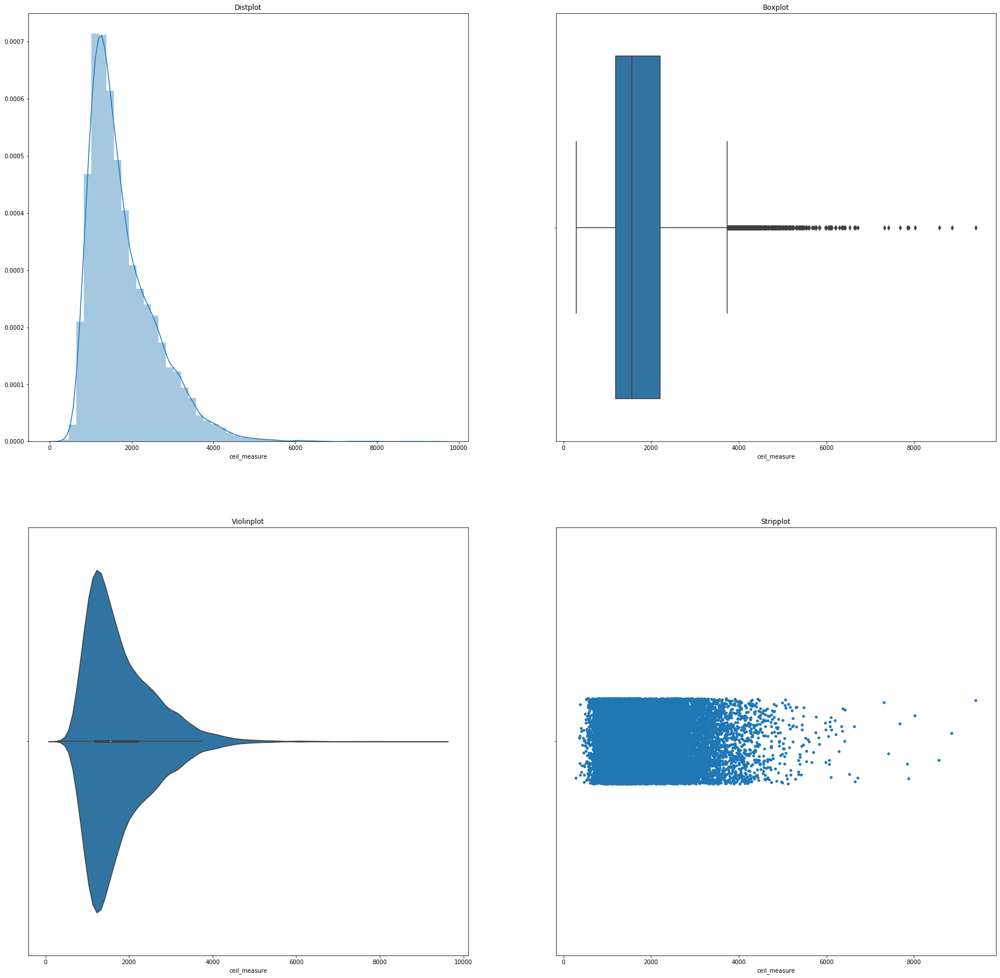

In [41]:
univariate(city.ceil_measure)

### The data is right skewed. Let's do a log transformation.

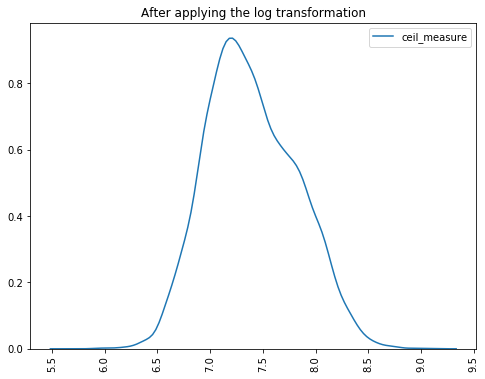

In [42]:
transform(city.ceil_measure)

### Now the data is normally distributed.

# 12. Basement

Description 
 count    21613.000000
mean       291.509045
std        442.575043
min          0.000000
25%          0.000000
50%          0.000000
75%        560.000000
max       4820.000000
Name: basement, dtype: float64 

**********************************************************************************
Upper Limit:- 1400.0
Lower Limit:- -840.0
**********************************************************************************
Skewness:- 1.5779650555996247

 *****************************Some Plots******************************************


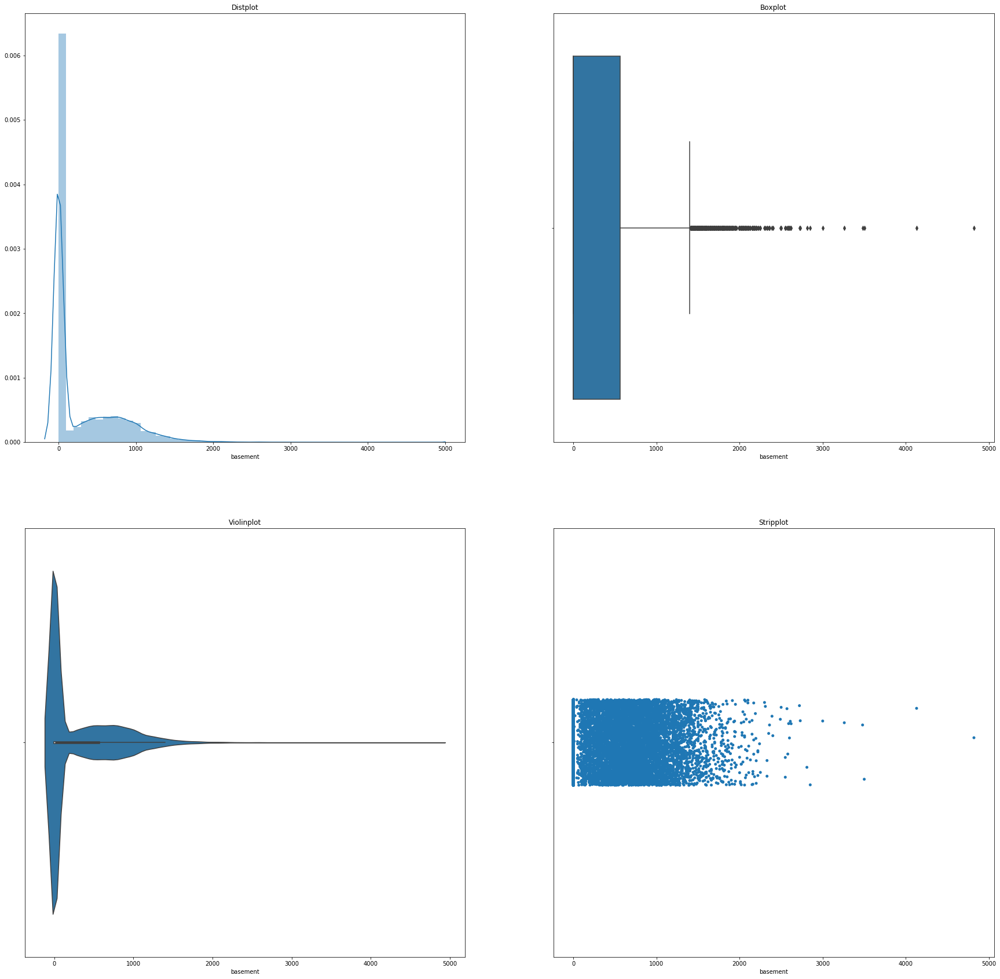

In [43]:
univariate(city.basement)

### The data is right skewed. Let's do a log transformation.

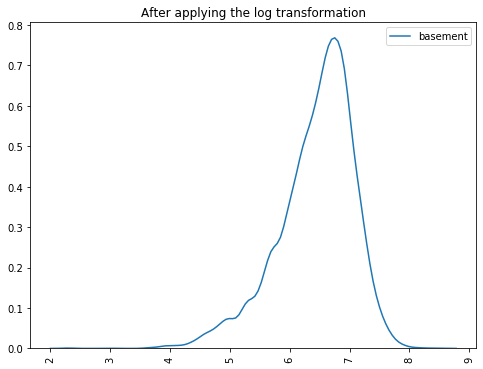

In [44]:
transform(city.basement)

### Now the data's distribution is improved.

# 13. Living_measure15

Description 
 count    21613.000000
mean      1986.552492
std        685.391304
min        399.000000
25%       1490.000000
50%       1840.000000
75%       2360.000000
max       6210.000000
Name: living_measure15, dtype: float64 

**********************************************************************************
Upper Limit:- 3665.0
Lower Limit:- 185.0
**********************************************************************************
Skewness:- 1.1081812758966965

 *****************************Some Plots******************************************


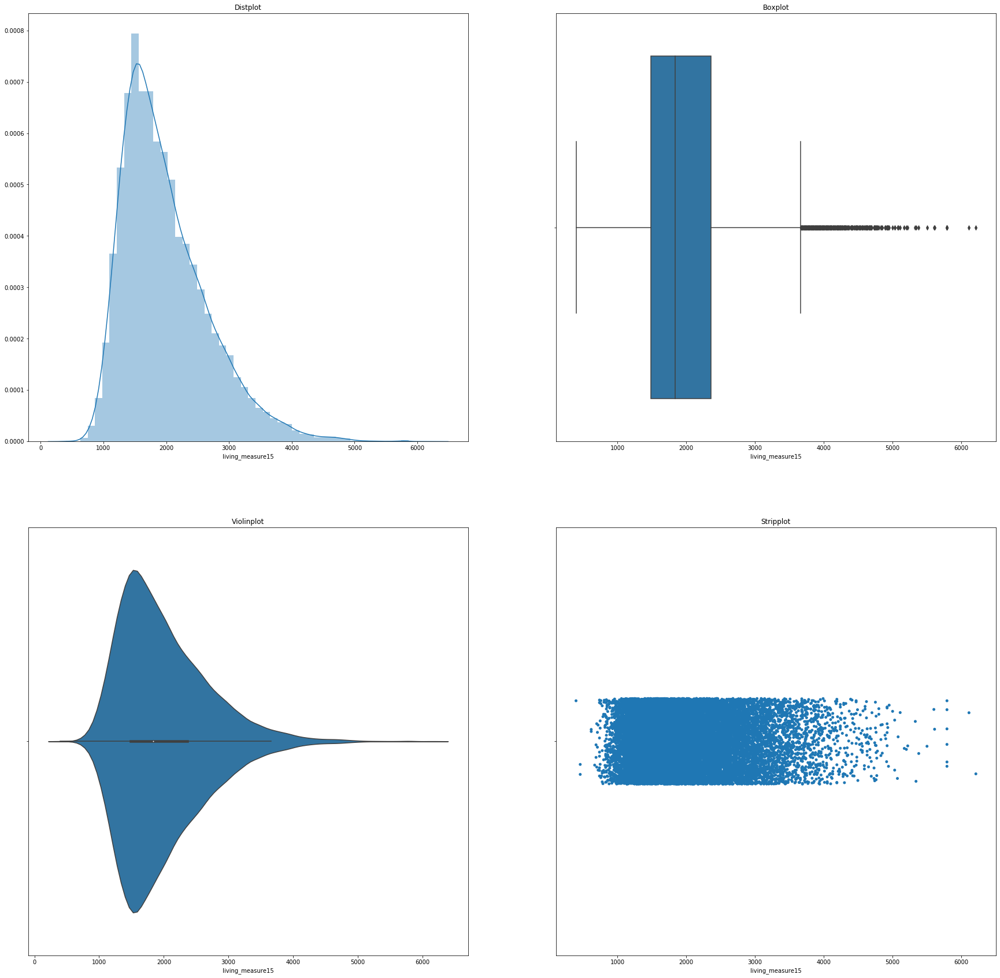

In [45]:
univariate(city.living_measure15)

### The data is right skewed. Let's do a log transformation.

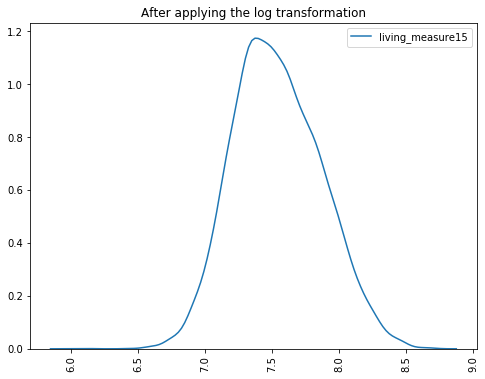

In [46]:
transform(city.living_measure15)

### Now the data is normally distributed.

# 14. Lot_measure15

Description 
 count     21613.000000
mean      12768.455652
std       27304.179631
min         651.000000
25%        5100.000000
50%        7620.000000
75%       10083.000000
max      871200.000000
Name: lot_measure15, dtype: float64 

**********************************************************************************
Upper Limit:- 17557.5
Lower Limit:- -2374.5
**********************************************************************************
Skewness:- 9.506743246764398

 *****************************Some Plots******************************************


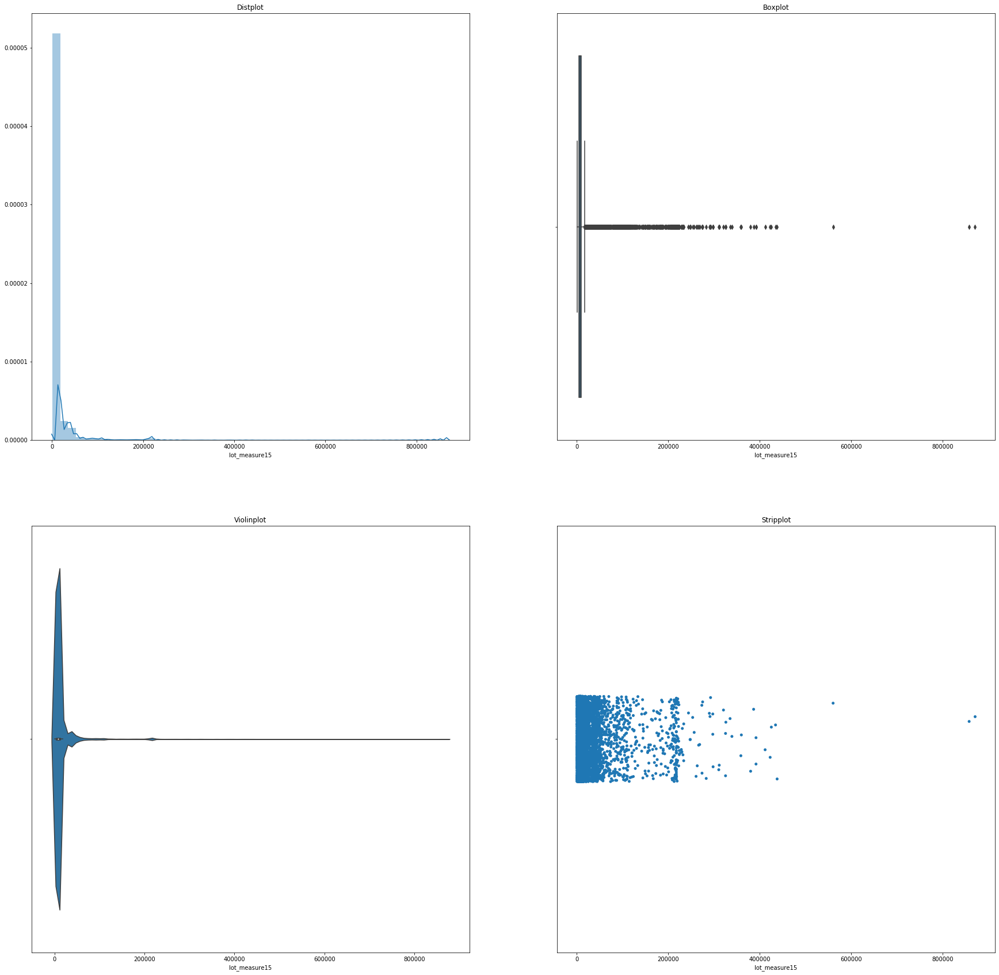

In [47]:
univariate(city.lot_measure15)

### The data is right skewed. Let's do a log transformation.

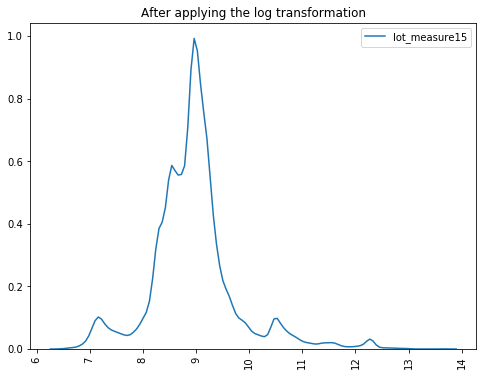

In [48]:
transform(city.lot_measure15)

### Now the data's distribution is improved.

# 15. Furnished

Description 
 count    21613.000000
mean         0.196687
std          0.397503
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: furnished, dtype: float64 

****************************Value Counts******************************************
0    17362
1     4251
Name: furnished, dtype: int64

 *****************************Some Plots******************************************


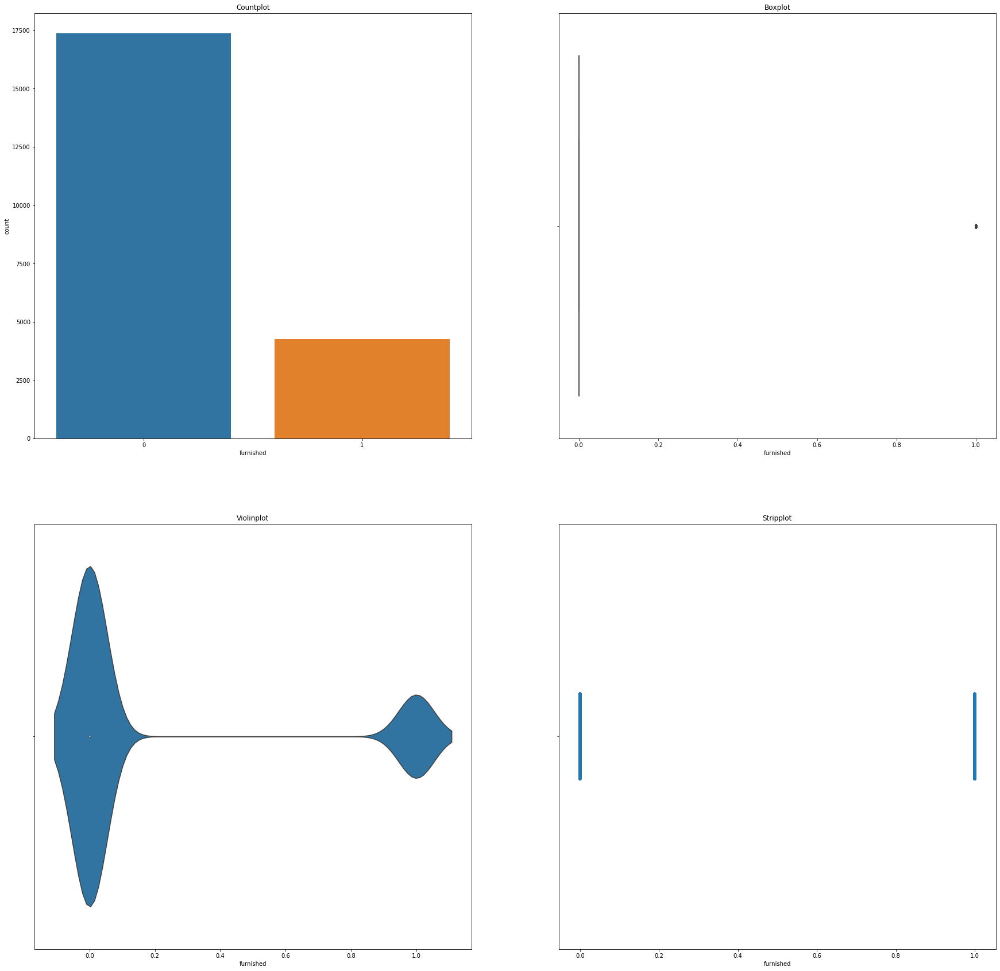

In [49]:
univariate(city.furnished)

# Bivariate Analysis

## 1. Room_bed vs Price

In [50]:
room_bed_price = city[['room_bed','price']].groupby('room_bed').mean().reset_index()

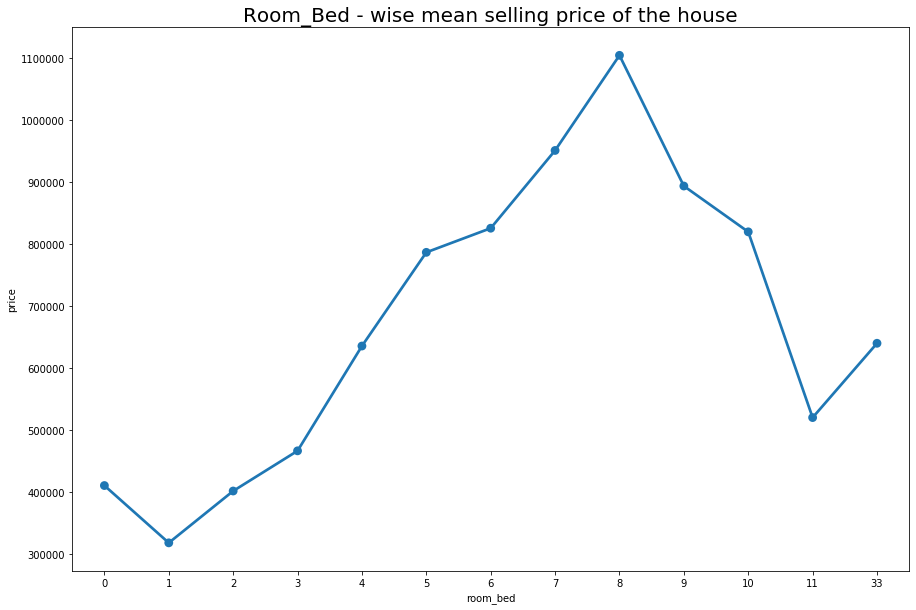

In [51]:
plt.figure(figsize = (15,10))
sns.pointplot(room_bed_price['room_bed'], room_bed_price['price'])
plt.title("Room_Bed - wise mean selling price of the house", size = 20)
plt.show()

### Inferences:- 

It is observed that houses having 8 bedrooms are having max mean selling price and houses having 1 bedrooms is having the least mean selling price.

## 2. Room_bath vs Price

In [52]:
room_bath_price = city[['room_bath','price']].groupby('room_bath').mean().reset_index()

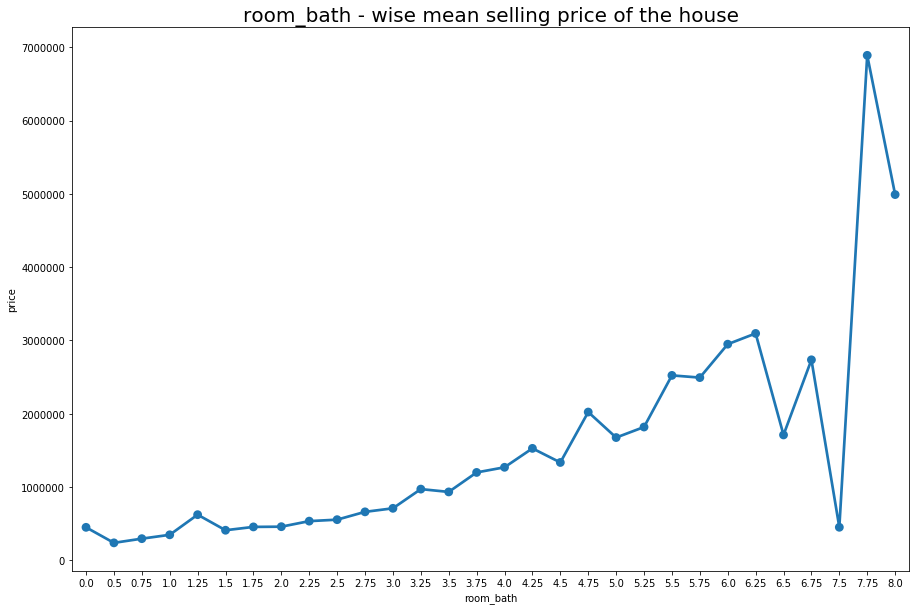

In [53]:
plt.figure(figsize = (15,10))
sns.pointplot(room_bath_price['room_bath'], room_bath_price['price'])
plt.title("room_bath - wise mean selling price of the house", size = 20)
plt.show()

### Inferences

It is observed that houses having 7.75 room_bath are having max mean selling price and houses having 0.5 room_bath is having 
the least mean selling price.

## 3. Living Measure vs Price

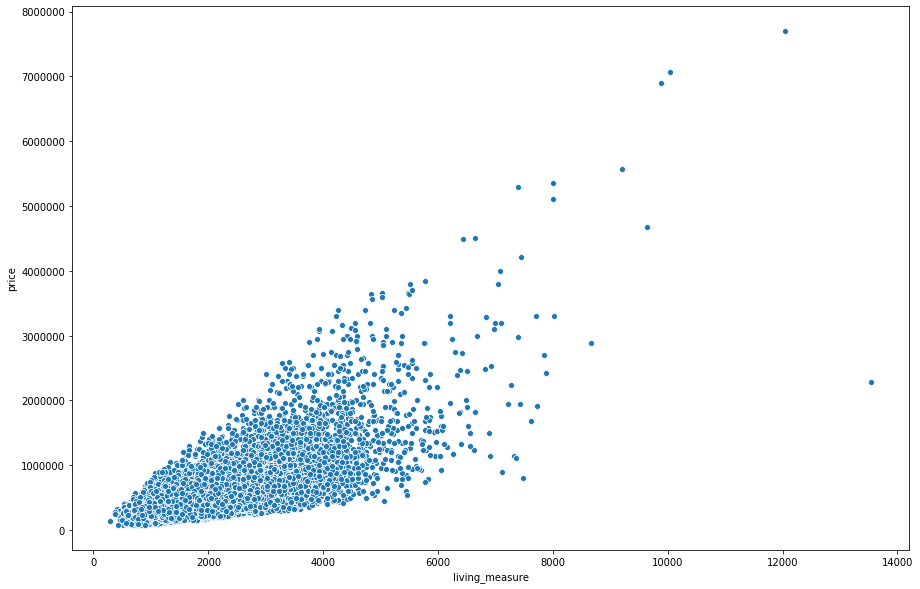

In [54]:
plt.figure(figsize = (15,10))
sns.scatterplot(city['living_measure'], city['price'])
plt.show()

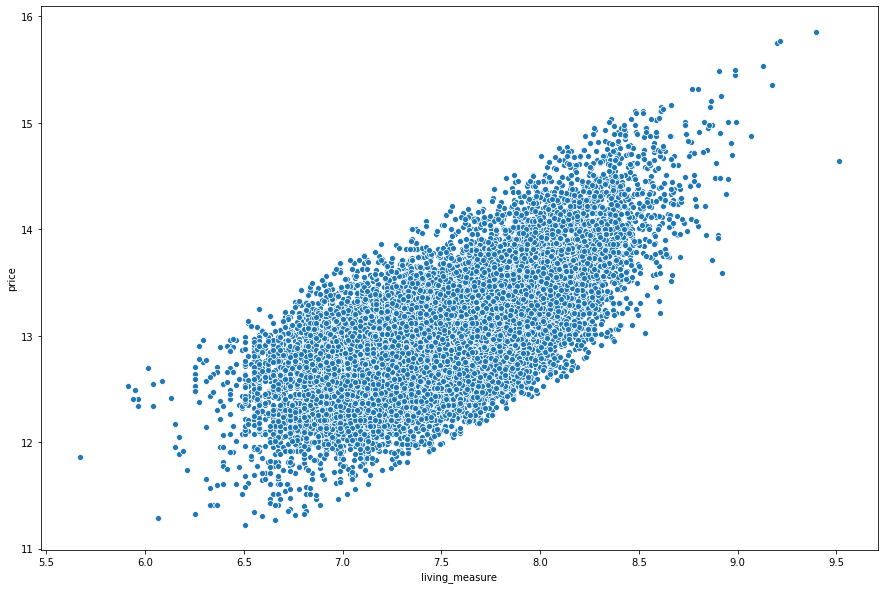

In [55]:
plt.figure(figsize = (15,10))
sns.scatterplot(np.log(city['living_measure']), np.log(city['price']))
plt.show()

### Inferences

The Data is heteroscedastic in nature.
After the log transformation  of the price and living_measure the heteroscedasticity is removed and we could see a linear
relationship between them.

## 4. Lot Measure vs Price

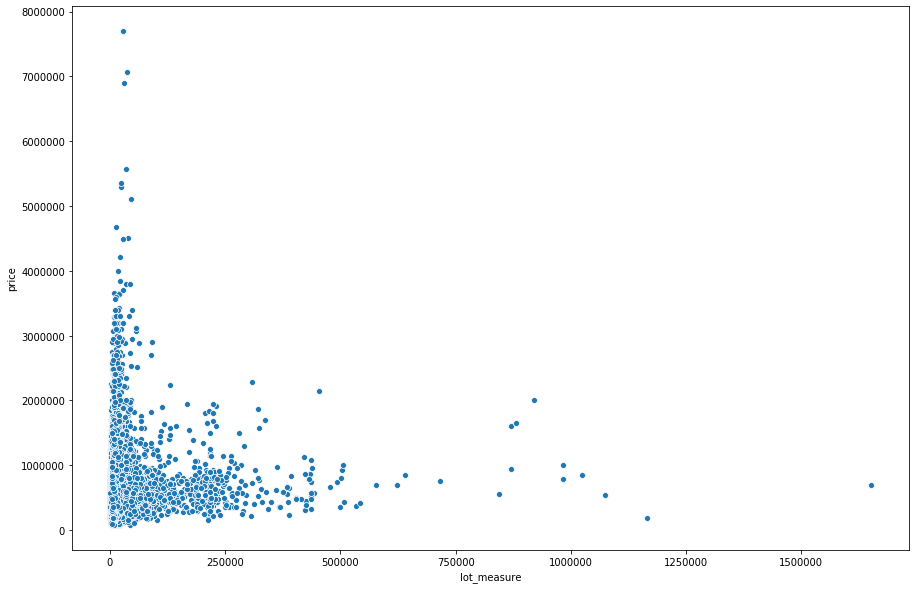

In [56]:
plt.figure(figsize = (15,10))
sns.scatterplot(city['lot_measure'], city['price'])
plt.show()

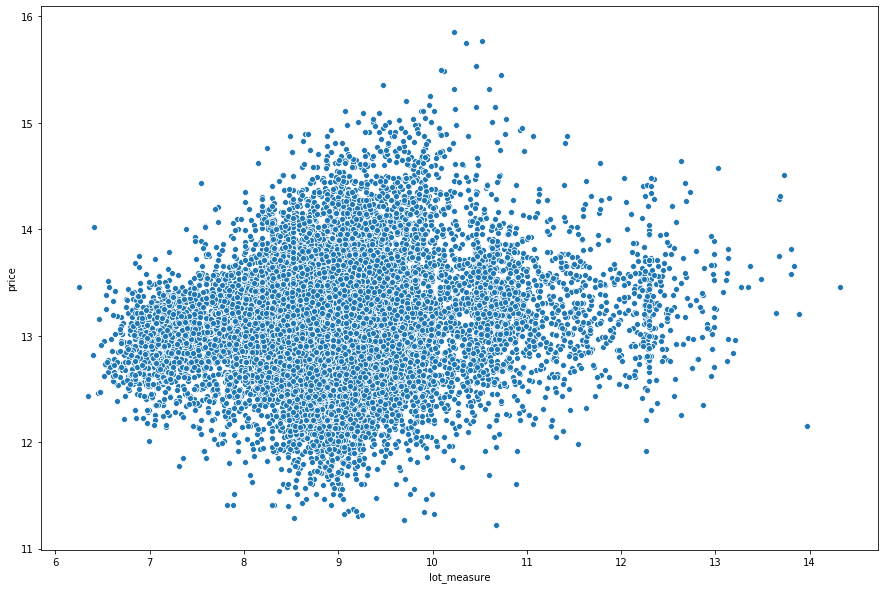

In [57]:
plt.figure(figsize = (15,10))
sns.scatterplot(np.log(city['lot_measure']), np.log(city['price']))
plt.show()

### Inferences

The First graph rejects our common misconception that higher the lot size on which the house is made, more higher will be the selling price. we could see that houses with much lower lot area are sold at more higher prices as compared to the houses with higher lot area. It could be due to various reasons like zipcode, sight etc.
In Second graph we applied the log transformation on both the fields to see a better relation.

## 5. Ceil Measure vs Price

In [58]:
ceil_price = city[['ceil','price']].groupby('ceil').mean().reset_index()

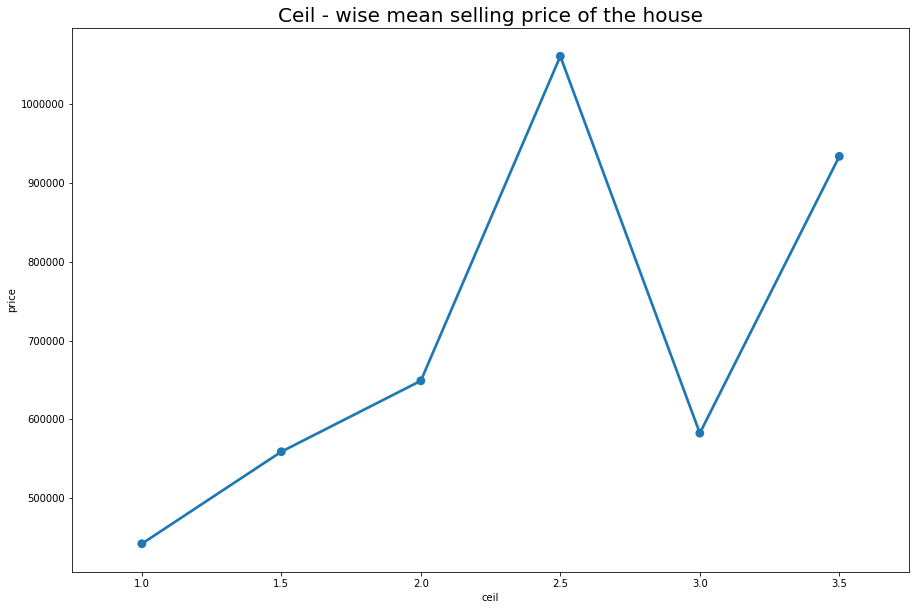

In [59]:
plt.figure(figsize = (15,10))
sns.pointplot(ceil_price['ceil'], ceil_price['price'])
plt.title("Ceil - wise mean selling price of the house", size = 20)
plt.show()

### Inferences

It is observed that houses having 2.5 ceil are having max mean selling price and houses having 1 ceil is having 
the least mean selling price.

## 6. Zipcode vs Price

In [60]:
zipcode_price = city[['zipcode','price']].groupby('zipcode').mean().reset_index()

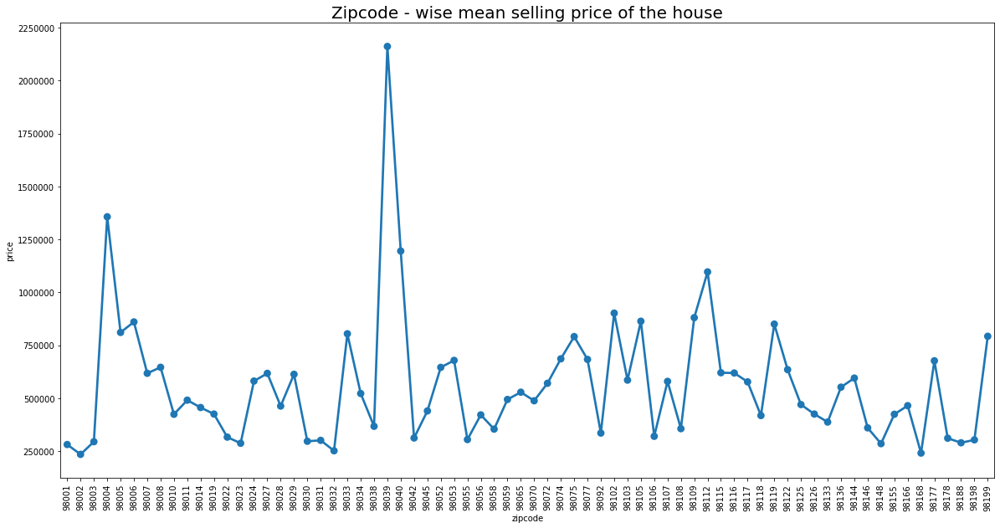

In [61]:
plt.figure(figsize =(20,10))
sns.pointplot(zipcode_price['zipcode'], zipcode_price['price'])
plt.xticks(rotation = 'vertical')
plt.title("Zipcode - wise mean selling price of the house", size = 20)
plt.show()

### Inferences

It is observed that the zipcode 98039 is having the maximum highest mean selling price for the house. It could indicate that the region with this zipcode is a posh region. Whereas the region like 98002 which has the lowest mean selling price for a house could indicate a poor locality in comparison to others.

## 7. Coast vs Price

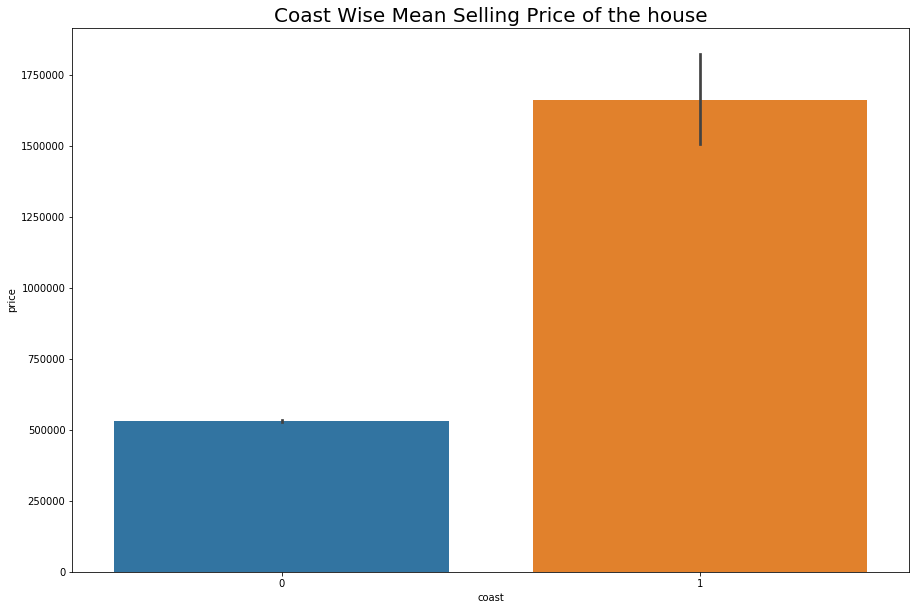

In [62]:
plt.figure(figsize = (15,10))
sns.barplot(city['coast'], city['price'])
plt.title('Coast Wise Mean Selling Price of the house', size = 20)
plt.show()

### Inferences

It is observed that houses which are facing the coast are having a greater selling price than the house which are not facing the coast.

## 8. Sight vs Price

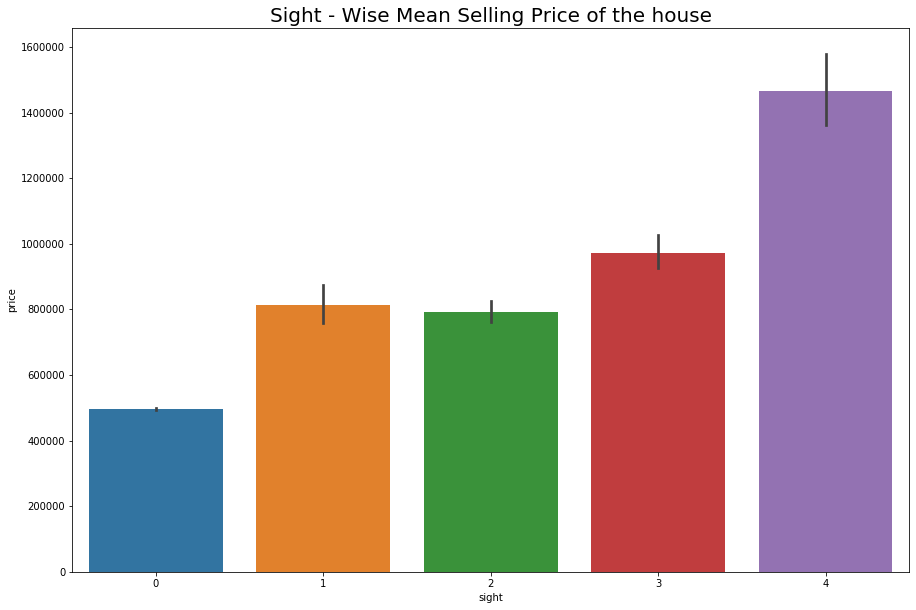

In [63]:
plt.figure(figsize = (15,10))
sns.barplot(city['sight'], city['price'])
plt.title('Sight - Wise Mean Selling Price of the house', size = 20)
plt.show()

### Inferences

It is observed that the mean selling price of the house were increasing with the increase in the number of potential buyers reviewing the house on sale.

## 9. Condition vs Price

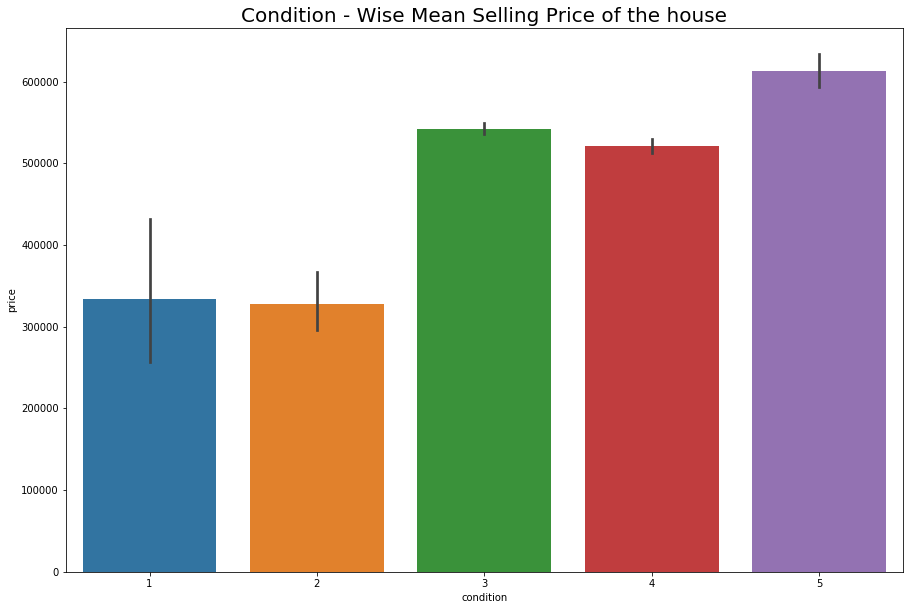

In [64]:
plt.figure(figsize = (15,10))
sns.barplot(city['condition'], city['price'])
plt.title('Condition - Wise Mean Selling Price of the house', size = 20)
plt.show()

### Inferences

As the condition of the houses improves the mean selling price of the house also increases. We could see that houses with condition '1' and '2' are having much lower mean selling price with repsepct to the houses with condtion rating as '3', '4' and '5'.

## 10. Quality vs Price

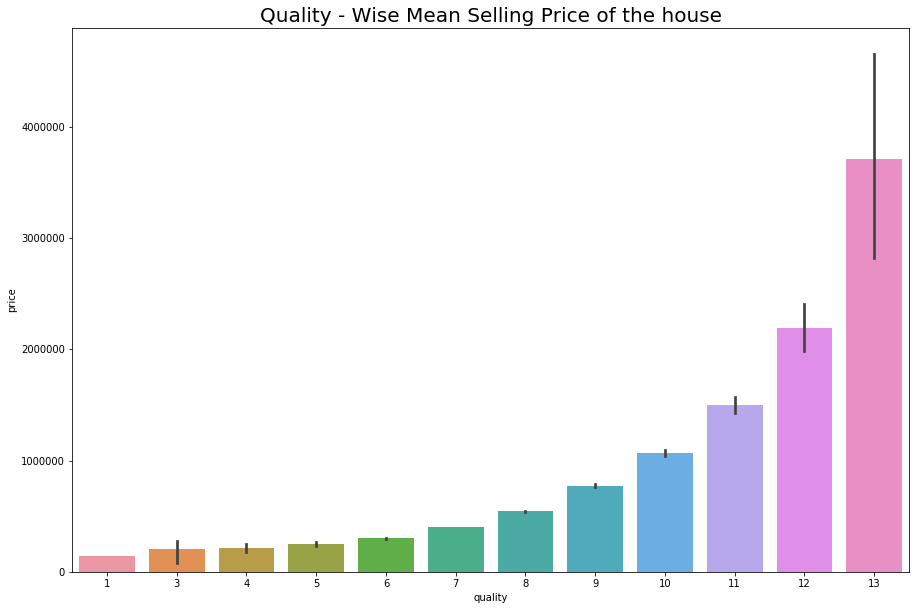

In [65]:
plt.figure(figsize = (15,10))
sns.barplot(city['quality'], city['price'])
plt.title('Quality - Wise Mean Selling Price of the house', size = 20)
plt.show()

### Inferences

As the quality of the house increases the selling price of the house also increases too.

## 11. Ceil Measure vs Price

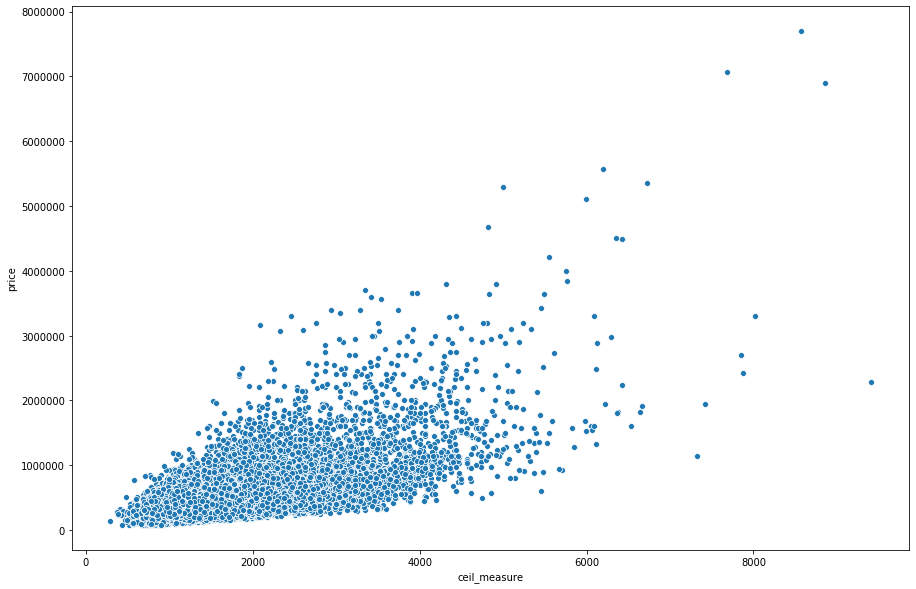

In [66]:
plt.figure(figsize = (15,10))
sns.scatterplot(city['ceil_measure'], city['price'])
plt.show()

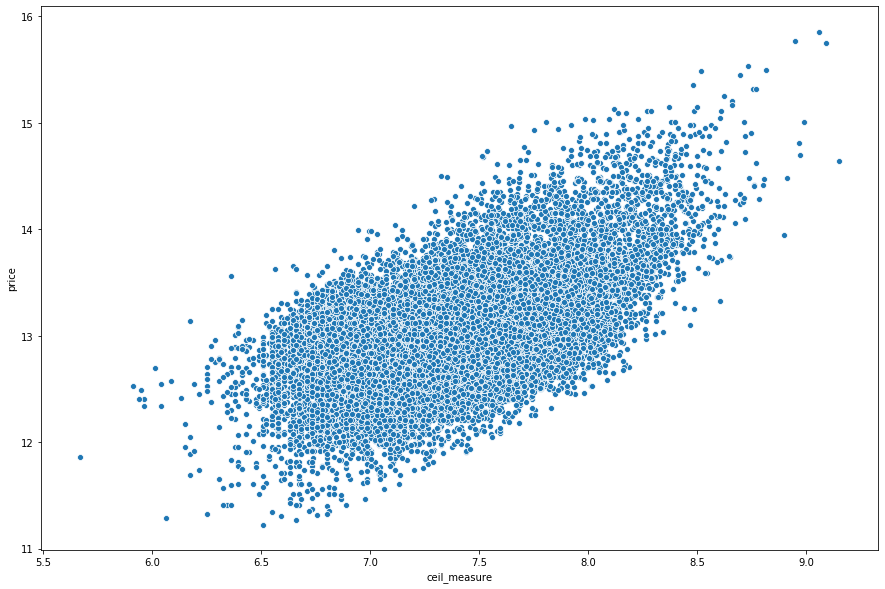

In [67]:
plt.figure(figsize = (15,10))
sns.scatterplot(np.log(city['ceil_measure']), np.log(city['price']))
plt.show()

### Inferences

The Data is heteroscedastic in nature.
After the log transformation  of the price and ceil_measure the heteroscedasticity is removed and we could see a linear
relationship between them.

## 12. Basement vs Price

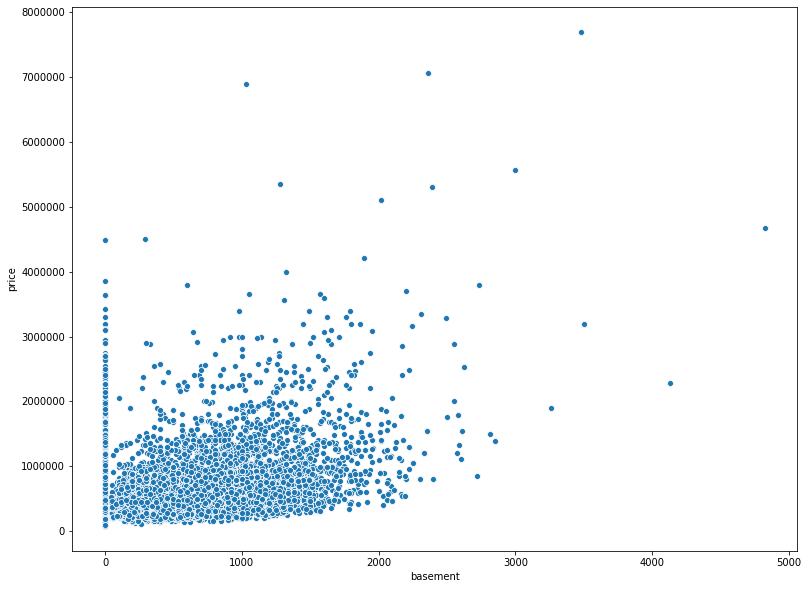

In [68]:
plt.figure(figsize =(13,10))

sns.scatterplot(city['basement'], city['price'])
plt.show()

### Infereneces

We could see that having a basement is not factor which would lead to higher selling price as they are many houses which have no basement but are still sold at higher prices than the houses which are having basements.

## 13. Furnished vs Price

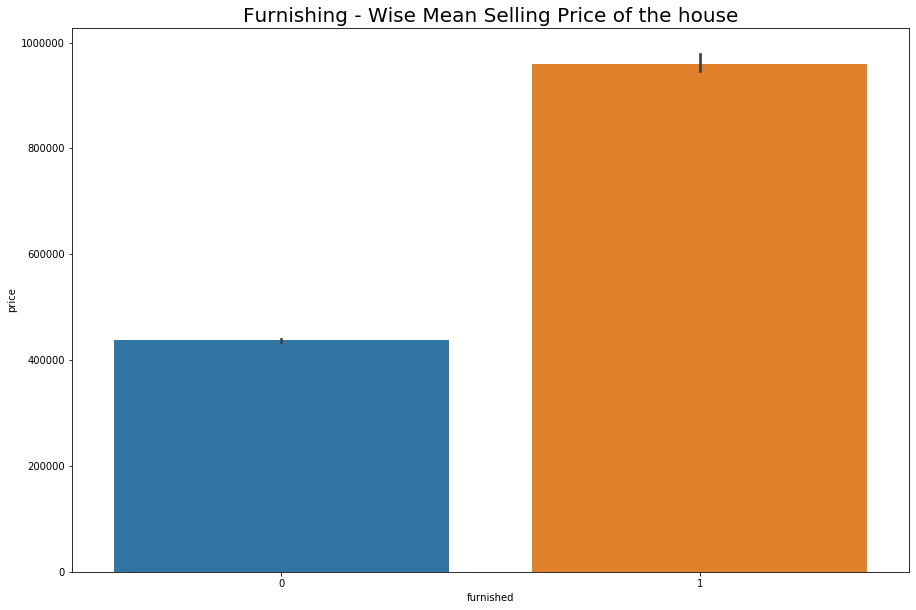

In [69]:
plt.figure(figsize = (15,10))
sns.barplot(city['furnished'], city['price'])
plt.title('Furnishing - Wise Mean Selling Price of the house', size = 20)
plt.show()

### Inferences

The furnished homes are sold at a higher price than the houses with no furnishing.

## 14. Year vs Price

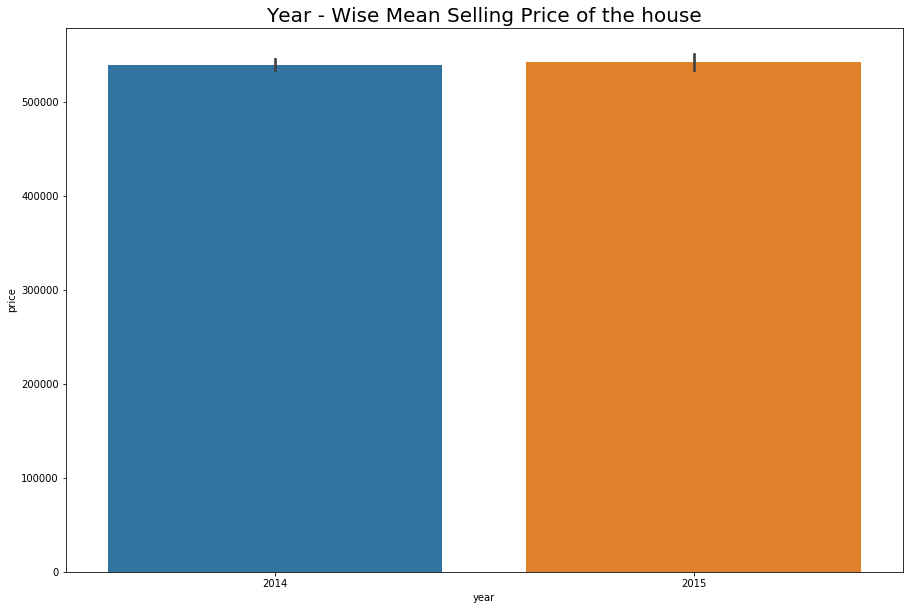

In [70]:
plt.figure(figsize = (15,10))
sns.barplot(city['year'], city['price'])
plt.title('Year - Wise Mean Selling Price of the house', size = 20)
plt.show()

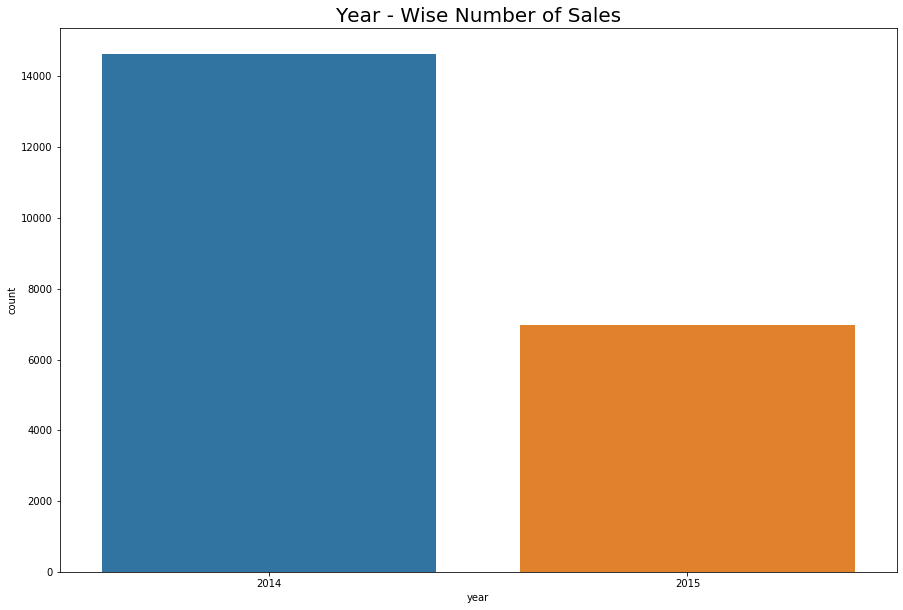

In [71]:
plt.figure(figsize = (15,10))
sns.countplot(city['year'])
plt.title('Year - Wise Number of Sales', size = 20)
plt.show()

### Inferences

The First graph shows that the mean selling price of the houses are nearly the same with the respect to the year it is sold in.
The Second graph shows that the number of houses which were sold in 2014 were higher as compared to 2015.

## 15. Month vs Price irrespective of year

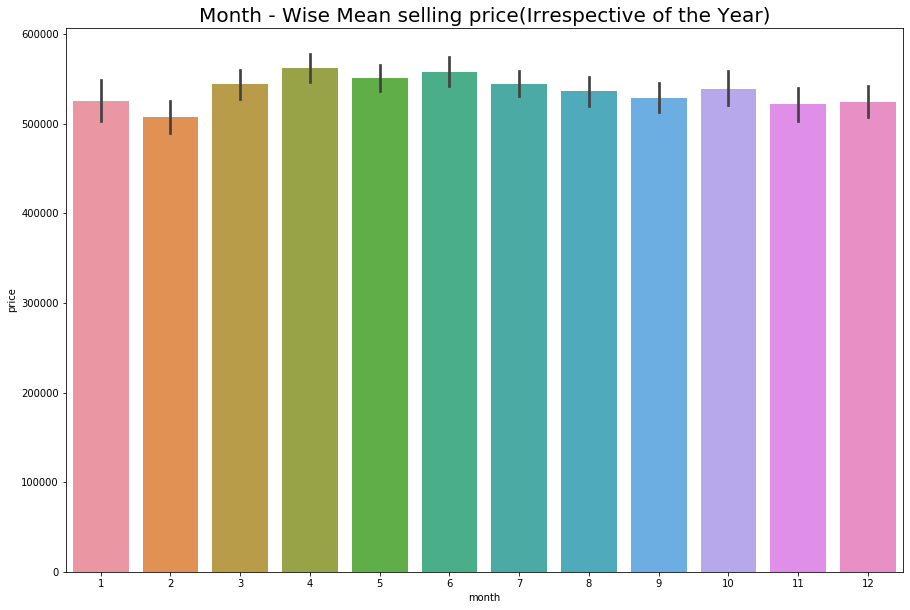

In [72]:
plt.figure(figsize = (15,10))
sns.barplot(city['month'], city['price'])
plt.title('Month - Wise Mean selling price(Irrespective of the Year)', size = 20)
plt.show()

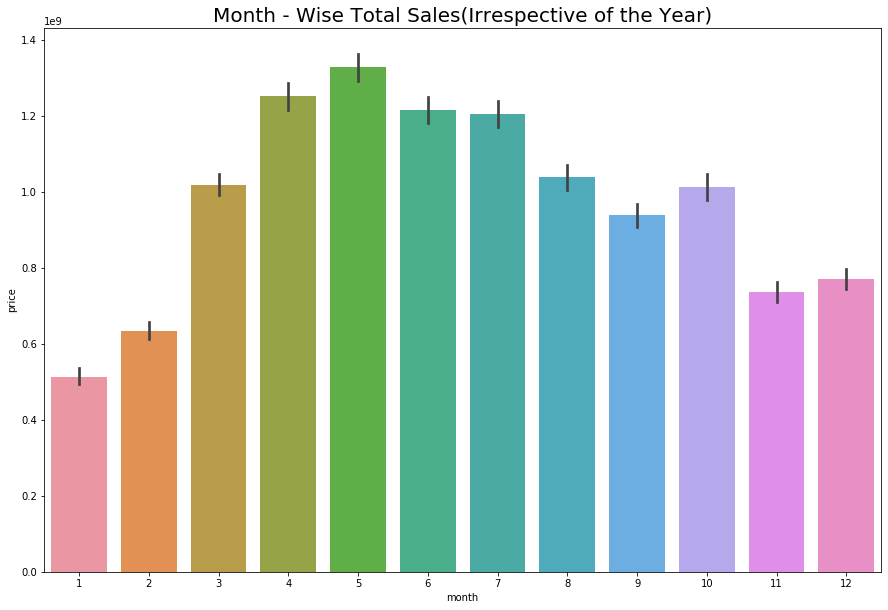

In [73]:
plt.figure(figsize = (15,10))
sns.barplot(city['month'], city['price'], estimator= sum,)
plt.title('Month - Wise Total Sales(Irrespective of the Year)', size = 20)
plt.show()

### Inferences

The First Graph shows that the mean selling selling price in the all the months are somewhat same.
The Second Graph shows that 'May' has the max number of sales and 'January' has the least amount of sales.

## 16. Total number of sales in a particular month.

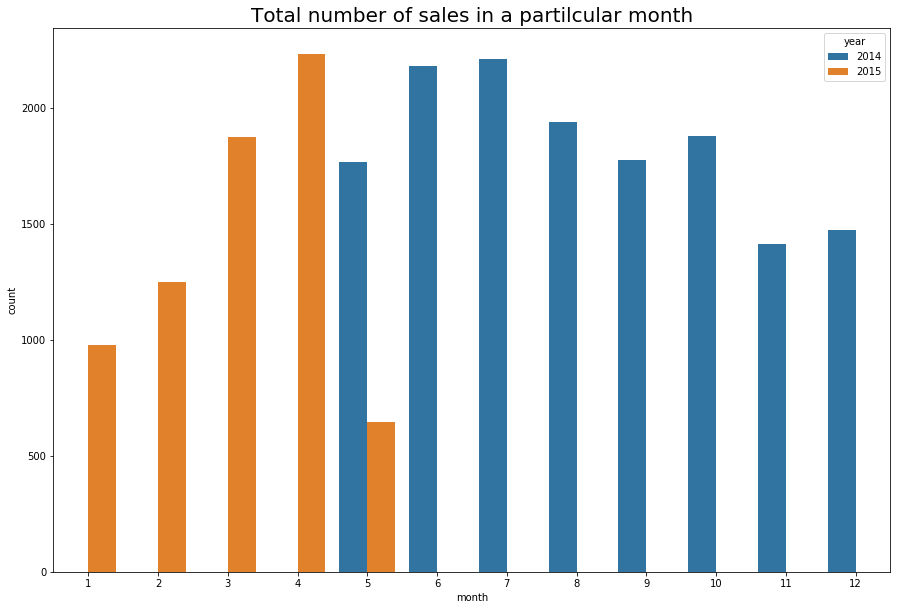

In [74]:
plt.figure(figsize = (15,10))
sns.countplot(city['month'], hue = city['year'])
plt.title('Total number of sales in a partilcular month', size = 20)
plt.show()

## Inferences

In year 2014 maximum number of houses were sold in the month of 'April' and least in 'May'.

In year 2015 maximum number of houses were done in the month of 'July' and least in 'November'.

## 17. Year-Month vs Price

In [75]:
year_month_price = city[['year','month','price']].groupby(['year','month']).sum().reset_index()

In [76]:
year_2014 = year_month_price[year_month_price['year'] == 2014]

In [77]:
year_2014.replace({5:'May',6:'June',7:'July',8:'August',9:'September',10:'October',
                   11:'November',12:'Decemeber'}, inplace=True)

In [78]:
year_2015 = year_month_price[year_month_price['year'] == 2015]

In [79]:
year_2015

,year,month,price
8,2015,1,514392060
9,2015,2,634899504
10,2015,3,1020108156
11,2015,4,1253673556
12,2015,5,360592740


In [80]:
year_2015.replace({5:'May',6:'June',7:'July',8:'August',9:'September',10:'October',
                   11:'November',12:'Decemeber'}, inplace=True)

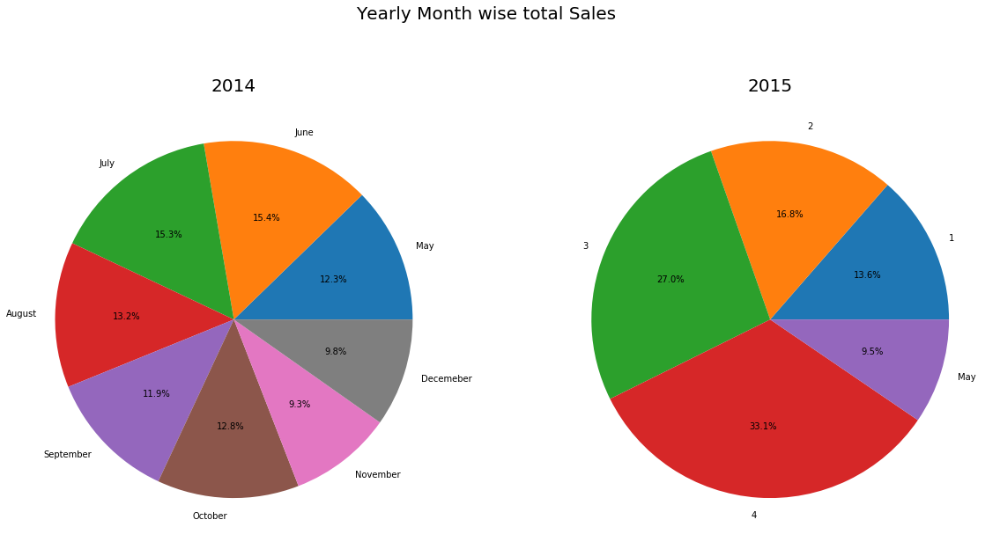

In [81]:
figure,ax = plt.subplots(1,2,figsize = (20,20))
plt.suptitle( t=  'Yearly Month wise total Sales', y = 0.75, fontsize = 20)
ax[0].pie(x = year_2014['price'], labels= year_2014['month'], autopct = "%.1f%%")
ax[0].set_title('2014', size = 20)
ax[1].pie(x = year_2015['price'], labels= year_2015['month'], autopct = "%.1f%%")
ax[1].set_title('2015', size = 20)
plt.show()

## Inferences

In year 2014 maximum sales(in terms of revenue) were done in the month of 'June' and least in 'November'.

In year 2015 maximum sales(in terms of revenue) were done in the month of 'April' and least in 'May'.

## 18. Yr_built vs Price

In [82]:
# We take 2015 as the reference year as the data is given till the year  2015.
city['Age_of_house'] = 2015 - city['yr_built']

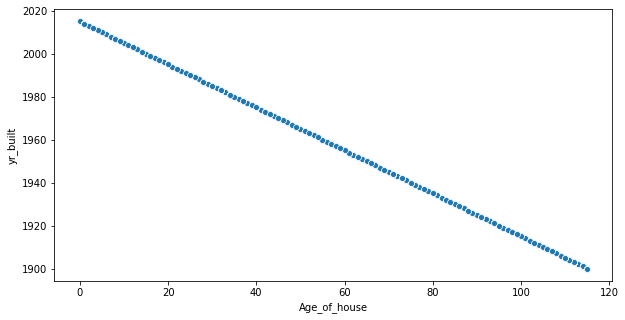

In [83]:
plt.figure(figsize = (10,5))
sns.scatterplot(city['Age_of_house'],city['yr_built'])
plt.show()

### Inferences

As the feature 'Age_of_house' is derived from the 'yr_built' column so we will remove the yr_built column to remove multicollinearity.

In [84]:
city.drop('yr_built', axis =1 , inplace  = True)

In [85]:
## creating a dataframe which has the mean prices the houses based on the Age_of_house.
age_vs_price = city[['Age_of_house','price']].groupby('Age_of_house').mean().reset_index()

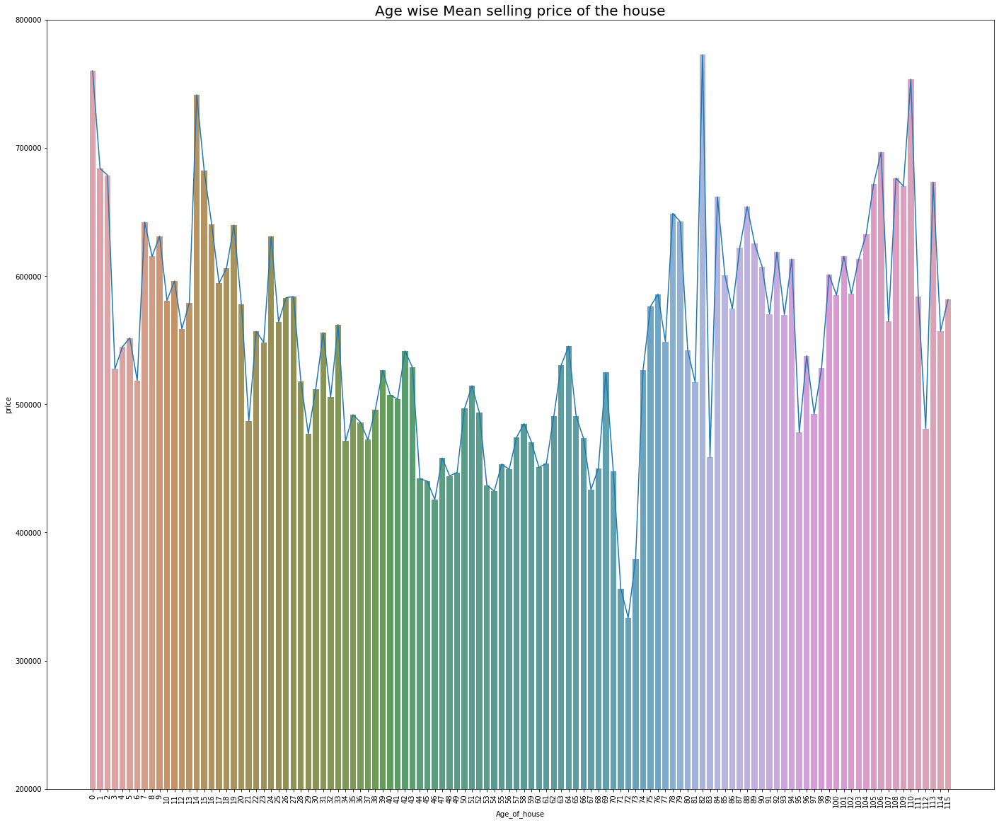

In [86]:
plt.figure(figsize = (24,20))
sns.barplot(age_vs_price['Age_of_house'], age_vs_price['price'],saturation= 0.5)  #palette = 'coolwarm')
sns.lineplot(age_vs_price['Age_of_house'], age_vs_price['price'], markers= '+')
plt.ylim(200000,800000)
plt.xticks(rotation = 'vertical')
plt.title('Age wise Mean selling price of the house', size = 20)
plt.show()

### Inferences

It is observed that the newer houses are sold at higher prices and the prices decreases as the age of the house decresases.
But as the age of the house crosses the threshhold of '72' it is observed that the prices has increased maybe due to it's historic
value.

## 19. Yr_renovated vs Price

In [87]:
city['Recency_of_Renovation']  = 2015 -  city['yr_renovated']

In [88]:
city['Recency_of_Renovation'].value_counts().head()

2015    20699
1          91
2          37
12         36
8          35
Name: Recency_of_Renovation, dtype: int64

In [89]:
# As we can see that we have lot of records as 2015 which means that it hasn't been renovated yet,
# So we will replace the column having 2015 with '0'.
city.Recency_of_Renovation.replace(to_replace=2015,value=0, inplace = True)

In [90]:
city['Recency_of_Renovation'].value_counts().head()

0     20715
1        91
2        37
12       36
15       35
Name: Recency_of_Renovation, dtype: int64

In [91]:
renovation_vs_price = city[['Recency_of_Renovation','price']].groupby('Recency_of_Renovation').mean().reset_index()

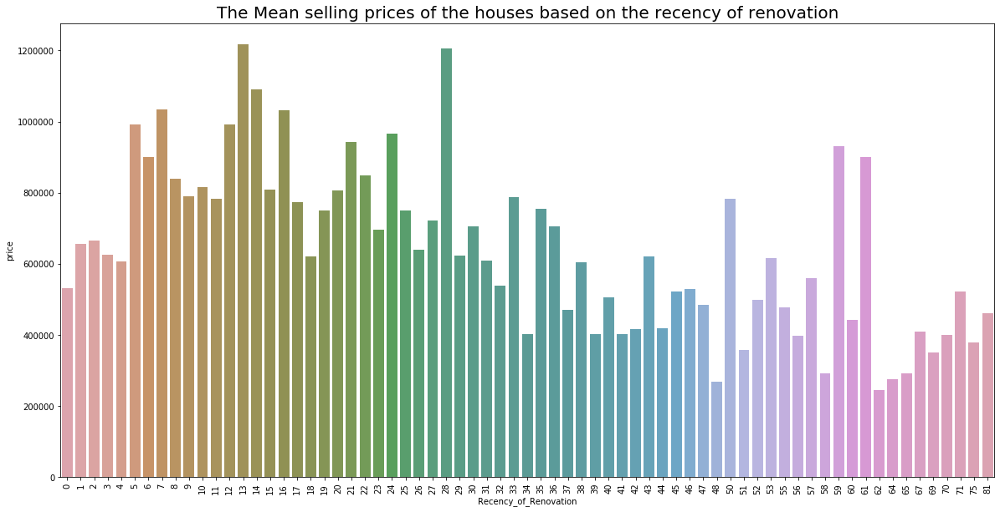

In [92]:
plt.figure(figsize = (20,10))
sns.barplot(renovation_vs_price['Recency_of_Renovation'], renovation_vs_price['price'],saturation= 0.5)  #palette = 'coolwarm')
plt.xticks(rotation = 'vertical')
plt.title('The Mean selling prices of the houses based on the recency of renovation', size = 20)
plt.show()

### Inferences

We can't see any particular trend between the mean price of the houses vs the recency of the renovation.

In [93]:
city.head()

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,year,month,day,Age_of_house,Recency_of_Renovation
0,3034200666,808100,4,3.25,3020,13457,1.0,0,0,5,9,3020,0,0,98133,47.7174,-122.336,2120,7553,1,2014,11,7,59,0
1,8731981640,277500,4,2.50,2550,7500,1.0,0,0,3,8,1750,800,0,98023,47.3165,-122.386,2260,8800,0,2014,12,4,39,0
2,5104530220,404000,3,2.50,2370,4324,2.0,0,0,3,8,2370,0,0,98038,47.3515,-121.999,2370,4348,0,2015,4,20,9,0
3,6145600285,300000,2,1.00,820,3844,1.0,0,0,4,6,820,0,0,98133,47.7049,-122.349,1520,3844,0,2014,5,29,99,0
4,8924100111,699000,2,1.50,1400,4050,1.0,0,0,4,8,1400,0,0,98115,47.6768,-122.269,1900,5940,0,2015,4,24,61,0


## Let's transform some columns to make their distribution normal.

In [94]:
# Making a copy of the dataframe
innercity = city.copy()

In [95]:
innercity.head()

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,year,month,day,Age_of_house,Recency_of_Renovation
0,3034200666,808100,4,3.25,3020,13457,1.0,0,0,5,9,3020,0,0,98133,47.7174,-122.336,2120,7553,1,2014,11,7,59,0
1,8731981640,277500,4,2.50,2550,7500,1.0,0,0,3,8,1750,800,0,98023,47.3165,-122.386,2260,8800,0,2014,12,4,39,0
2,5104530220,404000,3,2.50,2370,4324,2.0,0,0,3,8,2370,0,0,98038,47.3515,-121.999,2370,4348,0,2015,4,20,9,0
3,6145600285,300000,2,1.00,820,3844,1.0,0,0,4,6,820,0,0,98133,47.7049,-122.349,1520,3844,0,2014,5,29,99,0
4,8924100111,699000,2,1.50,1400,4050,1.0,0,0,4,8,1400,0,0,98115,47.6768,-122.269,1900,5940,0,2015,4,24,61,0


In [96]:
innercity['price'] = np.log(innercity['price'])
innercity['living_measure'] = np.log(innercity['living_measure'])
innercity['lot_measure'] = np.log(innercity['lot_measure'])
innercity['ceil_measure'] = np.log(innercity['ceil_measure'])
innercity['living_measure15'] = np.log(innercity['living_measure15'])
innercity['lot_measure15'] = np.log(innercity['lot_measure15'])

## Inferential Statistics

In [97]:
city.head()

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,year,month,day,Age_of_house,Recency_of_Renovation
0,3034200666,808100,4,3.25,3020,13457,1.0,0,0,5,9,3020,0,0,98133,47.7174,-122.336,2120,7553,1,2014,11,7,59,0
1,8731981640,277500,4,2.50,2550,7500,1.0,0,0,3,8,1750,800,0,98023,47.3165,-122.386,2260,8800,0,2014,12,4,39,0
2,5104530220,404000,3,2.50,2370,4324,2.0,0,0,3,8,2370,0,0,98038,47.3515,-121.999,2370,4348,0,2015,4,20,9,0
3,6145600285,300000,2,1.00,820,3844,1.0,0,0,4,6,820,0,0,98133,47.7049,-122.349,1520,3844,0,2014,5,29,99,0
4,8924100111,699000,2,1.50,1400,4050,1.0,0,0,4,8,1400,0,0,98115,47.6768,-122.269,1900,5940,0,2015,4,24,61,0


## 1. Is Price of the Home affected by it's no. of bedrooms??

We will first phrase the null and alternate hypothesis for the claim.
Let the two Hypothesis is as following:

H0 (Null Hypothesis): The Price of the home is not affected by the no. of bedrooms in the home
                                              or
                      The Mean Price of the home will be same across all the different no. of bedrooms.

H1 (Alternate Hypothesis): The Price of the home is affected by the no. of bedrooms in the home
                                              or
                           The Mean Price of the home will be different across all the different no. of bedrooms.
        

We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [98]:
import statsmodels.api         as     sm
from   statsmodels.formula.api import ols
 
mod = ols('price ~ room_bed', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                sum_sq       df            F  PR(>F)
room_bed  2.772931e+14      1.0  2270.472477     0.0
Residual  2.639355e+15  21611.0          NaN     NaN


###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that the Price of the home is affected by the no. of bedrooms in the home.

## 2. Is Price of the Home affected by it's no. of bathrooms??

We will first phrase the null and alternate hypothesis for the claim.
Let the two Hypothesis is as following:

H0 (Null Hypothesis): The Price of the home is not affected by the no. of bathrooms in the home
                                              or
                      The Mean Price of the home will be same across all the different no. of bathrooms.

H1 (Alternate Hypothesis): The Price of the home is affected by the no. of bathrooms in the home
                                              or
                           The Mean Price of the home will be different across all the different no. of bathrooms.

We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [99]:
import statsmodels.api         as     sm
from   statsmodels.formula.api import ols
 
mod = ols('price ~ room_bath', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                 sum_sq       df            F  PR(>F)
room_bath  8.043117e+14      1.0  8228.794685     0.0
Residual   2.112336e+15  21611.0          NaN     NaN


###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that the Price of the home is affected by the no. of bathrooms in the home.

In [100]:
city.living_measure.nunique()

1038

## 3. Is Price of the Home affected by it's measure of living area?

We will first phrase the null and alternate hypothesis for the claim.
Let the two Hypothesis is as following:

H0 (Null Hypothesis): The Price of the home is not affected by the measure of living area.

H1 (Alternate Hypothesis): The Price of the home is affected by the measure of living area.
    

We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [101]:
# import formula api as alias smf
import statsmodels.formula.api as smf

# formula: response ~ predictors
est = smf.ols(formula='price ~ living_measure', data=city).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.493
Model:                            OLS   Adj. R-squared:                  0.493
Method:                 Least Squares   F-statistic:                 2.100e+04
Date:                Mon, 25 Nov 2019   Prob (F-statistic):               0.00
Time:                        02:01:47   Log-Likelihood:            -3.0028e+05
No. Observations:               21613   AIC:                         6.006e+05
Df Residuals:                   21611   BIC:                         6.006e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -4.387e+04   4405.455     -9.958      0.000   -5.25e+04   -3.52e+04
living_measure   280.8067      1.938    144.924      0.000     277.009     284.605
==============================================================================
Omnibus:                    14815.593   Durbin-Watson:                   2.012
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           543533.863
Skew:                           2.820   Prob(JB):                         0.00
Kurtosis:                      26.911   Cond. No.                     5.63e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.63e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that the Price of the home is affected by the measure of living area.

## 4. Is Price of the Home affected by it's measure of lot area?

We will first phrase the null and alternate hypothesis for the claim.
Let the two Hypothesis is as following:
    
H0 (Null Hypothesis): The Price of the home is not affected by the measure of lot area.

H1 (Alternate Hypothesis): The Price of the home is affected by the measure of lot area.
    
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [102]:
est = smf.ols(formula='price ~ lot_measure', data=city).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     175.1
Date:                Mon, 25 Nov 2019   Prob (F-statistic):           8.06e-40
Time:                        02:01:48   Log-Likelihood:            -3.0753e+05
No. Observations:               21613   AIC:                         6.151e+05
Df Residuals:                   21611   BIC:                         6.151e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept    5.282e+05   2649.201    199.369      0.000    5.23e+05    5.33e+05
lot_measure     0.7952      0.060     13.233      0.000       0.677       0.913
==============================================================================
Omnibus:                    19144.266   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1147191.104
Skew:                           4.028   Prob(JB):                         0.00
Kurtosis:                      37.771   Cond. No.                     4.69e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.69e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that the Price of the home is affected by the measure of lot area.

## 5. Is Price of the Home affected by it's no. of floors?

H0 (Null Hypothesis): The Price of the home is not affected by the no. of floors of the home
                                              or
                      The Mean Price of the home will be same across all the different no. of floors.

H1 (Alternate Hypothesis): The Price of the home is affected by the no. of floors of the home
                                              or
                           The Mean Price of the home will be different across all the different no. of floors.
            
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [103]:
mod = ols('price ~ ceil', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                sum_sq       df            F         PR(>F)
ceil      1.923205e+14      1.0  1525.602049  1.630417e-322
Residual  2.724327e+15  21611.0          NaN            NaN


###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that the Price of the home is affected by the no. of floors of the home.

## 6. Is Price of the Home affected by having its view to a waterfront ?

H0 (Null Hypothesis): The Price of the home is not affected by the fact that the home has its view to a waterfront or not.
                                     
H1 (Alternate Hypothesis): The Price of the home is affected by the fact that the home has its view to a waterfront or not.
                                
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [104]:
mod = ols('price ~ coast', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                sum_sq       df            F  PR(>F)
coast     2.068835e+14      1.0  1649.943896     0.0
Residual  2.709764e+15  21611.0          NaN     NaN


###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that The Price of the home is affected by the fact that the home has its view to a waterfront or not.

## 7. Is Price of the Home affected by the no. of time the home has been viewed by the potential buyers?

H0 (Null Hypothesis): The Price of the home is not affected by the no. times the home has been viewed by the potential buyers
                                              or
                      The Mean Price of the home will be same across all the no. times the home has been viewed by the potential buyers

H1 (Alternate Hypothesis): The Price of the home is affected by the no. times the home has been viewed by the potential buyers
                                              or
                           The Mean Price of the home will be different across all the no. times the home has been viewed by the potential buyers
            
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [105]:
mod = ols('price ~ sight', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                sum_sq       df            F  PR(>F)
sight     4.604926e+14      1.0  4051.742026     0.0
Residual  2.456155e+15  21611.0          NaN     NaN


###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that The Price of the home is affected by the no. times the home has been viewed by the potential buyers

## 8. Is Price of the Home affected by the overall condition of the home?

H0 (Null Hypothesis): The Price of the home is not affected by the overall condition of the home.
                                     
H1 (Alternate Hypothesis): The Price of the home is affected by the overall condition of the home.
                                
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [106]:
mod = ols('price ~ condition', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                 sum_sq       df          F        PR(>F)
condition  3.862726e+12      1.0  28.658957  8.719407e-08
Residual   2.912785e+15  21611.0        NaN           NaN


###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that The Price of the home is affected by the overall condition of the home.

## 9. Is Price of the Home affected by the grades given to the housing unit?

H0 (Null Hypothesis): The Price of the home is not affected by the grades given to the housing unit.
                                     
H1 (Alternate Hypothesis): The Price of the home is affected by the grades given to the housing unit.
                                
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [107]:
mod = ols('price ~ quality', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                sum_sq       df             F  PR(>F)
quality   1.299386e+15      1.0  17363.307856     0.0
Residual  1.617262e+15  21611.0           NaN     NaN


###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that The Price of the home is affected by the grades given to the housing unit.

## 10. Is Price of the Home affected by the measure of area of house apart from basement?


We will first phrase the null and alternate hypothesis for the claim. Let the two Hypothesis is as following:
    
H0 (Null Hypothesis): The Price of the home is not affected by the measure of area of house apart from basement.
    
H1 (Alternate Hypothesis): The Price of the home is affected by the measure of area of house apart from basement.
    
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [108]:
est = smf.ols(formula='price ~ ceil_measure', data=city).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.367
Model:                            OLS   Adj. R-squared:                  0.367
Method:                 Least Squares   F-statistic:                 1.251e+04
Date:                Mon, 25 Nov 2019   Prob (F-statistic):               0.00
Time:                        02:01:59   Log-Likelihood:            -3.0268e+05
No. Observations:               21613   AIC:                         6.054e+05
Df Residuals:                   21611   BIC:                         6.054e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     5.974e+04   4732.848     12.623      0.000    5.05e+04     6.9e+04
ceil_measure   268.6443      2.401    111.866      0.000     263.937     273.351
==============================================================================
Omnibus:                    16505.934   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           729337.804
Skew:                           3.265   Prob(JB):                         0.00
Kurtosis:                      30.699   Cond. No.                     4.69e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.69e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that The Price of the home is affected by the measure of area of house apart from basement.

## 11. Is Price of the Home affected by the measure of basement area of the home?

We will first phrase the null and alternate hypothesis for the claim. Let the two Hypothesis is as following:
    
H0 (Null Hypothesis): The Price of the home is not affected by the measure of basement area.
    
H1 (Alternate Hypothesis): The Price of the home is affected by the measure of basement area.
    
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [109]:
est = smf.ols(formula='price ~ basement', data=city).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.105
Model:                            OLS   Adj. R-squared:                  0.105
Method:                 Least Squares   F-statistic:                     2532.
Date:                Mon, 25 Nov 2019   Prob (F-statistic):               0.00
Time:                        02:02:01   Log-Likelihood:            -3.0642e+05
No. Observations:               21613   AIC:                         6.128e+05
Df Residuals:                   21611   BIC:                         6.129e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.618e+05   2831.023    163.130      0.000    4.56e+05    4.67e+05
basement     268.8033      5.342     50.318      0.000     258.332     279.274
==============================================================================
Omnibus:                    17958.261   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           889286.574
Skew:                           3.695   Prob(JB):                         0.00
Kurtosis:                      33.543   Cond. No.                         635.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that The Price of the home is affected by the measure of basement area of the home.

## 12. Is Price of the Home affected by the fact that the home is furnished or not?

We will first phrase the null and alternate hypothesis for the claim. Let the two Hypothesis is as following:
    
H0 (Null Hypothesis): The Price of the home is not affected by the fact that the home is furnished or not.
    
H1 (Alternate Hypothesis): The Price of the home is affected by the fact that the home is furnished or not.
    
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.

In [110]:
mod = ols('price ~ furnished', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                 sum_sq       df             F  PR(>F)
furnished  9.343347e+14      1.0  10186.034582     0.0
Residual   1.982313e+15  21611.0           NaN     NaN


###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that The Price of the home is affected by the fact that the home is furnished or not.

## 13. Is Price of the Home affected by the year in which it was sold ?

H0 (Null Hypothesis): The Price of the home is not affected by the year in which it was sold
                                              or
                      The Mean Price of the home will be same across all the different years in which they were sold.

H1 (Alternate Hypothesis): The Price of the home is affected by the year in which it was sold
                                              or
                           The Mean Price of the home will be different across all the different years in which they were sold.
            
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.  

In [111]:
mod = ols('price ~ year', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                sum_sq       df         F    PR(>F)
year      3.683963e+10      1.0  0.272968  0.601353
Residual  2.916611e+15  21611.0       NaN       NaN


###  Inferences:

Since the P value is more than 5% , we accept the null hypothesis thus we can say that The Price of the home is not affected by the year in which it was sold

## 14. Is Price of the Home affected by the month in which it was sold ?

H0 (Null Hypothesis): The Price of the home is not affected by the month in which it was sold
                                              or
                      The Mean Price of the home will be same across all the different months in which they were sold.

H1 (Alternate Hypothesis): The Price of the home is affected by the month in which it was sold
                                              or
                           The Mean Price of the home will be different across all the different months in which they were sold.
            
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.  

In [112]:
mod = ols('price ~ month', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                sum_sq       df         F    PR(>F)
month     2.947586e+11      1.0  2.184245  0.139444
Residual  2.916353e+15  21611.0       NaN       NaN


###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that The Price of the home is affected by the month in which it was sold.

## 15. Is Price of the Home affected by the days on which they were sold ?


H0 (Null Hypothesis): The Price of the home is not affected by the day on which it was sold
                                              or
                      The Mean Price of the home will be same across all the different days on which they were sold.

H1 (Alternate Hypothesis): The Price of the home is affected by the days on which they were sold
                                              or
                           The Mean Price of the home will be different across all the different days on which they were sold.
            
We will use Anova test to check the hypothesis. We will choose 5% as the significance level.  

In [113]:
mod = ols('price ~ day', data = city).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                sum_sq       df         F    PR(>F)
day       6.276354e+11      1.0  4.651487  0.031038
Residual  2.916020e+15  21611.0       NaN       NaN


###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that The Price of the home is affected by the days on which they were sold.

## 16. Is Price of the Home affected by the age of the home?


H0 (Null Hypothesis): The Price of the home is not affected by the age of the home.
                                              or
                      The Mean Price of the home will be same across all the different age of the homes.

H1 (Alternate Hypothesis): The Price of the home is affected by the age of the home.
                                              or
                           The Mean Price of the home will be different across all the different age of the homes.
            
We will use Anova test to check the hypothesis. We will choose 5% as the significance level. 

In [114]:
est = smf.ols(formula='price ~ Age_of_house', data=city).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     63.16
Date:                Mon, 25 Nov 2019   Prob (F-statistic):           2.00e-15
Time:                        02:02:08   Log-Likelihood:            -3.0759e+05
No. Observations:               21613   AIC:                         6.152e+05
Df Residuals:                   21611   BIC:                         6.152e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     5.699e+05   4493.829    126.815      0.000    5.61e+05    5.79e+05
Age_of_house  -675.1304     84.951     -7.947      0.000    -841.641    -508.620
==============================================================================
Omnibus:                    19144.526   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1142142.076
Skew:                           4.030   Prob(JB):                         0.00
Kurtosis:                      37.689   Cond. No.                         95.3
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

###  Inferences:

Since the P value is less than 5% , we reject the null hypothesis thus we can say that The Price of the home is affected by the age of the home.

# Model Building: Base

In [115]:
#import os
#os.chdir('C:\\Users\\ASUS\\Downloads\\Capstone Group B')

In [116]:
data_refined = pd.read_csv('refined_data.csv')

In [117]:
# Checking the number of uniques values from the data:
data_refined.nunique()

cid                     21436
price                    3625
room_bed                   13
room_bath                  30
living_measure           1038
lot_measure              9782
ceil                        6
coast                       2
sight                       5
condition                   5
quality                    12
ceil_measure              946
basement                  306
yr_renovated               70
zipcode                    70
lat                      5034
long                      752
living_measure15          777
lot_measure15            8689
furnished                   2
year                        2
month                      12
day                        31
Age_of_house              116
Receny_of_Renovation       69
dtype: int64

In [118]:
## We will drop the cid column since it has more than 99% of unique values:
data_refined.drop('cid', axis =1 , inplace = True)

## Checking the Correlation HeatMap:

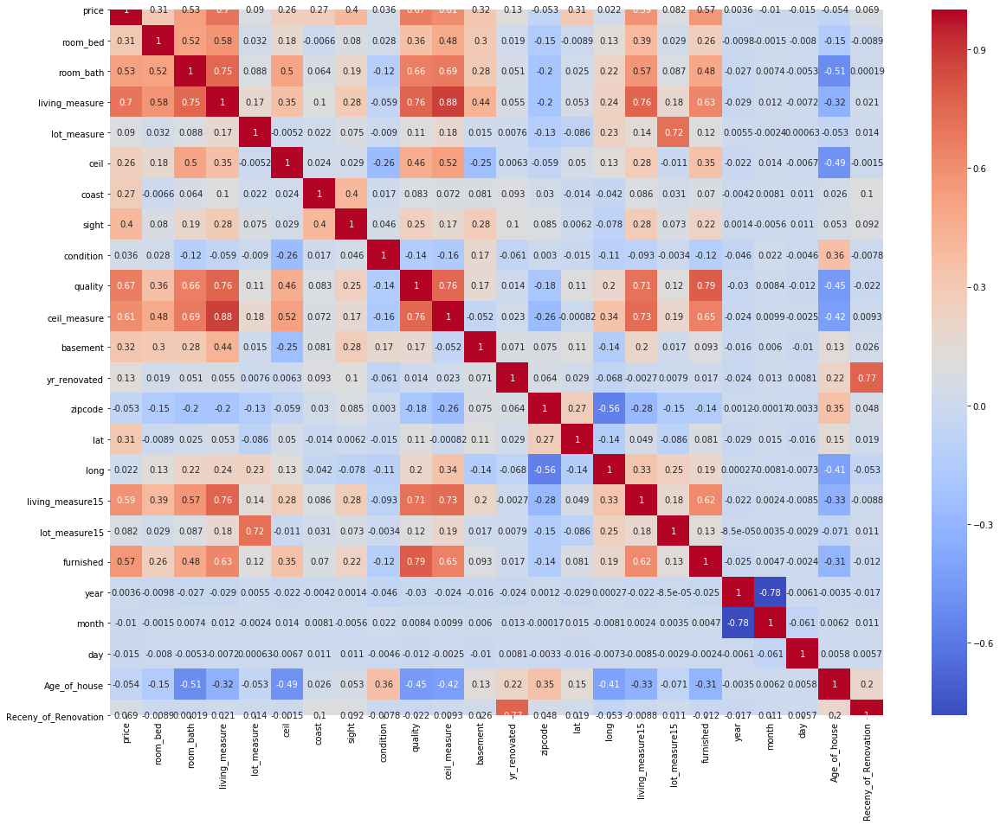

In [119]:
plt.figure(figsize = (20,15))
sns.heatmap(data_refined.corr(), annot = True, cmap='coolwarm')
plt.show()

We could see that 'total area' and 'lot_measure' has  a correlation of '1' so we can remove one of the column.

In [120]:
## Removing the lot_meaure column:
data_refined.drop('lot_measure', axis = 1, inplace = True)

## 1. Linear Regression

### We will first check all the assumptions of Linear Regression

In [121]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()

In [122]:
regressor.fit(data_refined.drop('price', axis = 1), data_refined['price'])

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [123]:
y_pred = regressor.predict(data_refined.drop('price', axis = 1))

### 1. Residuals:

In [124]:
residuals = data_refined['price'] - y_pred

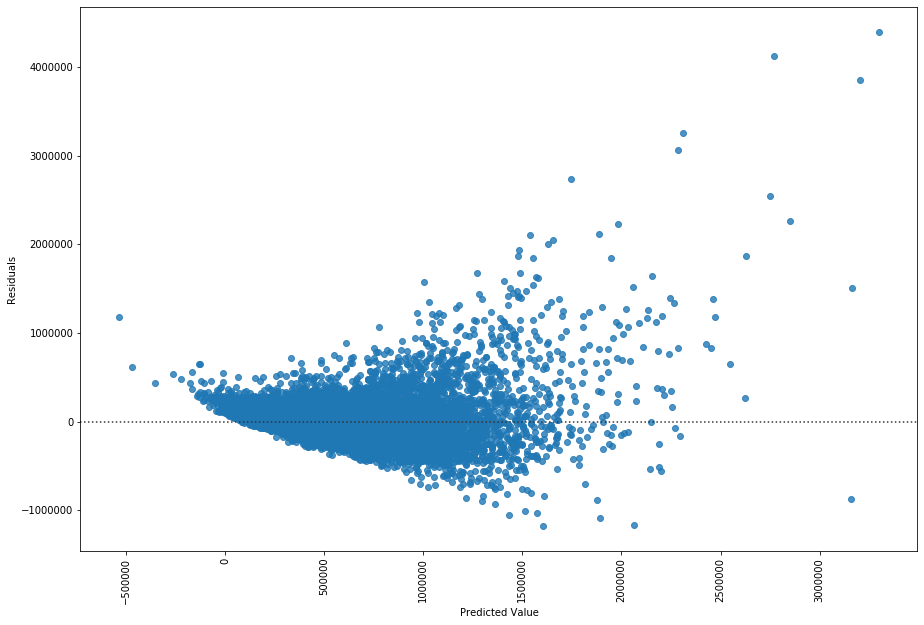

In [125]:
plt.figure(figsize = (15,10))
sns.residplot(y_pred,residuals)
plt.xlabel('Predicted Value')
plt.ylabel('Residuals')
plt.xticks(rotation = 90)
plt.show()

###  2. Normality 

### 2.1 Using QQPLOT

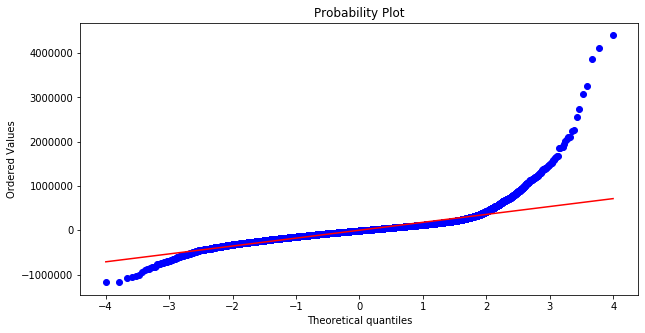

In [126]:
from scipy import stats
import pylab
plt.figure(figsize = (10,5))
stats.probplot(residuals,plot=pylab)
plt.show()

### 2.2 Using Shapiro Wilk Test of Normality

Our Hypothesis is as following:
    
H0: Data/Residual is Normal in nature

H1: Data/Residual is not Normal

In [127]:
from scipy.stats import shapiro
teststats,pvalue=shapiro(residuals)

In [128]:
pvalue

0.0

Since Pvalue is less than 0.5 we can't accept the null hypothesis. So we could say that the Residuals are not normal in nature

###  3. Multicollinearity check

In [129]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
data_refined['Constant'] = 1
vif  = [variance_inflation_factor(data_refined.drop('price',axis =1).values, i) for i in range(data_refined.drop('price',axis =1).shape[1])]
pd.DataFrame({'vif':vif}, index= data_refined.drop('price',axis =1).columns)

,vif
room_bed,1.657358e+00
room_bath,3.378448e+00
living_measure,inf
ceil,2.013035e+00
coast,1.206210e+00
sight,1.434898e+00
condition,1.258838e+00
quality,4.863178e+00
ceil_measure,inf
basement,inf


### 4. Heteroscedasticity

Following are the hypothesis for the test:
H0: The Residuals are not Heteroscedastic in Nature
H1 :The Residuals are Heteroscedastic in nature

In [130]:
import statsmodels.stats.api as sms
sms.het_goldfeldquandt(residuals, data_refined)

(1.1724738356718278, 7.465562560396231e-17, 'increasing')

The Pvalues is less than 0.5 so we can't accept the null hypothesis thus we could say that residuals are heterscedastinc in nature

### 5. Auto Correlation between the errors

In [131]:
sms.durbin_watson(residuals)

2.002714236023433

### 6. Linearity 

Following are the hypothesis for the test:
H0: The Data is linear in nature
H1 :The Data is not linear in nature.

In [132]:
import statsmodels.api as stat
model = stat.OLS(endog = data_refined.price, exog= data_refined.drop('price', axis = 1)).fit()

In [133]:
stat.stats.linear_rainbow(model)

(1.2111219937980726, 1.3549464802727643e-23)

## Summary of Assumptions:

1. A trend is being observed in the residual plot.
2. From the QQplot and Shapiro Wilk Test we could see that the residuals are not normal in nature.
3. In VIF test, we saw that there are couple of variables for whom the VIF value was more than 10 indicating those variable        are vunerable in predicting the linear regression model and hence, Regression is not the best bet here.
4. In Heteroscedasticity, we realized that GolffendQaunt Test gives a P value < 0.05 which strongly indicates that error/data      is heteroscedastic and therefore we cannot deploy LR Model.
5. Durbin Watson Test of Correlation of Errors aka Auto correlation- Test Statistic is found to be 2.00 which indicates            there is no correlation in error.
6. From the Linear Rainbow test we could see that the pvalue < 0.5 so we can reject the null hpothesis thus we can conclude        that the data is not linear in nature.

Since Maximum assumptions of the Linear Regression is failing so applying linear regression will not yield good result.
But still we will apply the Linear Regression.

###  1.1 Application of Linear Regression without Backward Elimination

In [134]:
from sklearn.linear_model import LinearRegression
regressor_new = LinearRegression()

In [135]:
from sklearn.model_selection import cross_val_score

In [136]:
nmmse_linear = cross_val_score(regressor_new, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                       cv = 20)

In [137]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_linear = np.sqrt(abs(nmmse_linear))
rmse_linear

array([217132.58090405, 191030.40532856, 183153.6651076 , 190744.37149888,
       211666.95410486, 228616.27506539, 206063.83958472, 187242.28249341,
       177019.48337482, 187380.32553266, 183701.56374153, 190272.84848719,
       191645.63362478, 176344.82783399, 179533.79983602, 239929.23812018,
       199777.10640514, 201994.62543806, 223002.20542657, 230909.25074244])

In [138]:
r2_score_linear = cross_val_score(regressor_new, data_refined.drop('price', axis = 1), data_refined['price'],
                       cv = 20)

In [139]:
r2_score_linear

array([0.68564411, 0.73588348, 0.68539019, 0.72067986, 0.72431788,
       0.70126271, 0.66451033, 0.73938725, 0.72398022, 0.70308371,
       0.72608941, 0.71322583, 0.69582141, 0.69608947, 0.69106211,
       0.6721318 , 0.68893061, 0.68408067, 0.66973389, 0.70644378])

###  Inference:

In [140]:
print ("The Linear Regresion model has a mean accuracy of",rmse_linear.mean(),'with a standard devition of ',rmse_linear.std())

The Linear Regresion model has a mean accuracy of 199858.0641325416 with a standard devition of  18809.944861126143


### 1.2  Application of Linear Regression with Backward Elimination

In [141]:
predictors = data_refined.drop('price', axis = 1)
target = data_refined['price']

In [142]:
## We will add a constant to the predictors dataframe so that we can apply the ols model on it.
predictors['constant'] = 1

In [143]:
predictors_columns = list(predictors.columns)

In [144]:
# Automating the selection of optimal features using backward elimination, here probability threshold is 0.05.
while(True):
    model = stat.OLS(endog = target, exog = predictors[predictors_columns]).fit()
    pvals = model.pvalues
    max_pval = pvals[(pvals == pvals.max()) & (pvals > 0.05)]
    if(max_pval.empty == False):
        predictors_columns.remove(max_pval.index[0])
        continue
    else:
        break
        
predictors_columns

['room_bed',
 'room_bath',
 'living_measure',
 'ceil',
 'coast',
 'sight',
 'condition',
 'quality',
 'ceil_measure',
 'basement',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'living_measure15',
 'lot_measure15',
 'furnished',
 'year',
 'day',
 'Age_of_house',
 'Receny_of_Renovation',
 'Constant',
 'constant']

In [145]:
# These are the column which we got from backward elimination.
predictors_columns

['room_bed',
 'room_bath',
 'living_measure',
 'ceil',
 'coast',
 'sight',
 'condition',
 'quality',
 'ceil_measure',
 'basement',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'living_measure15',
 'lot_measure15',
 'furnished',
 'year',
 'day',
 'Age_of_house',
 'Receny_of_Renovation',
 'Constant',
 'constant']

In [146]:
# we will remove the constant column since we don't need it anymore.
predictors_columns.remove('constant')

In [147]:
nmmse_backward =cross_val_score(regressor_new, data_refined[predictors_columns], data_refined['price'], scoring= 'neg_mean_squared_error',
                                cv = 20)

In [148]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_backward = np.sqrt(abs(nmmse_backward))
rmse_backward

array([217100.43675964, 190971.56090213, 183219.5381949 , 190535.31193651,
       211740.0360588 , 228671.62447591, 206147.126773  , 187224.1369108 ,
       176935.08553452, 187318.96220596, 183559.9009549 , 190291.61855188,
       191727.71847899, 176299.70715406, 179657.24383228, 239982.36049004,
       199843.02232364, 202084.19267806, 222923.48836942, 230925.44496485])

In [149]:
r2_score_backward = cross_val_score(regressor_new, data_refined[predictors_columns], data_refined['price'],
                                cv = 20)

In [150]:
r2_score_backward

array([0.68573718, 0.73604617, 0.68516384, 0.72129181, 0.72412748,
       0.70111804, 0.66423908, 0.73943776, 0.72424336, 0.70327815,
       0.72651171, 0.71316925, 0.69556078, 0.69624497, 0.69063713,
       0.6719866 , 0.6887253 , 0.68380044, 0.669967  , 0.7064026 ])

### Inference

In [151]:
print ("The Linear Regresion model after backward elimination has a mean accuracy of",
       rmse_backward.mean(),'with a standard devition of ',rmse_backward.std())

The Linear Regresion model after backward elimination has a mean accuracy of 199857.92587751514 with a standard devition of  18830.44928155508


## Lets Apply some regularization techniques:

### 1.3 Ridge Regression ( L2 Regularization )

In [152]:
from sklearn.linear_model import Ridge
regressor_ridge = Ridge()

In [153]:
nmse_ridge =cross_val_score(regressor_ridge, data_refined[predictors_columns], data_refined['price'], scoring= 'neg_mean_squared_error',
                                cv = 20)

In [154]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_ridge = np.sqrt(abs(nmse_ridge))
rmse_ridge

array([217076.11867692, 191032.38534759, 183199.92880185, 190515.89749909,
       211790.71160526, 228732.22791199, 206123.6069076 , 187257.8283336 ,
       176928.8647235 , 187269.23658094, 183545.06952824, 190267.98047869,
       191690.76176578, 176222.64606295, 179579.07919332, 239962.851122  ,
       199858.06033814, 202083.80999396, 222974.36258777, 230994.36145767])

In [155]:
r2_score_ridge =cross_val_score(regressor_ridge, data_refined[predictors_columns], data_refined['price'],
                                cv = 20)

In [156]:
r2_score_ridge

array([0.68580758, 0.73587801, 0.68523123, 0.7213486 , 0.72399542,
       0.7009596 , 0.66431569, 0.73934398, 0.72426275, 0.70343566,
       0.7265559 , 0.7132405 , 0.69567813, 0.69651046, 0.69090626,
       0.67203993, 0.68867845, 0.68380163, 0.66981635, 0.70622733])

### Inferences

In [157]:
print ("The Linear Regresion model after L2 Regulariztion has a mean accuracy of",
       rmse_ridge.mean(),'with a standard devition of ',rmse_ridge.std())

The Linear Regresion model after L2 Regulariztion has a mean accuracy of 199855.2894458436 with a standard devition of  18853.8023215599


### Lets see co - efficients that we got in Ridge Regression

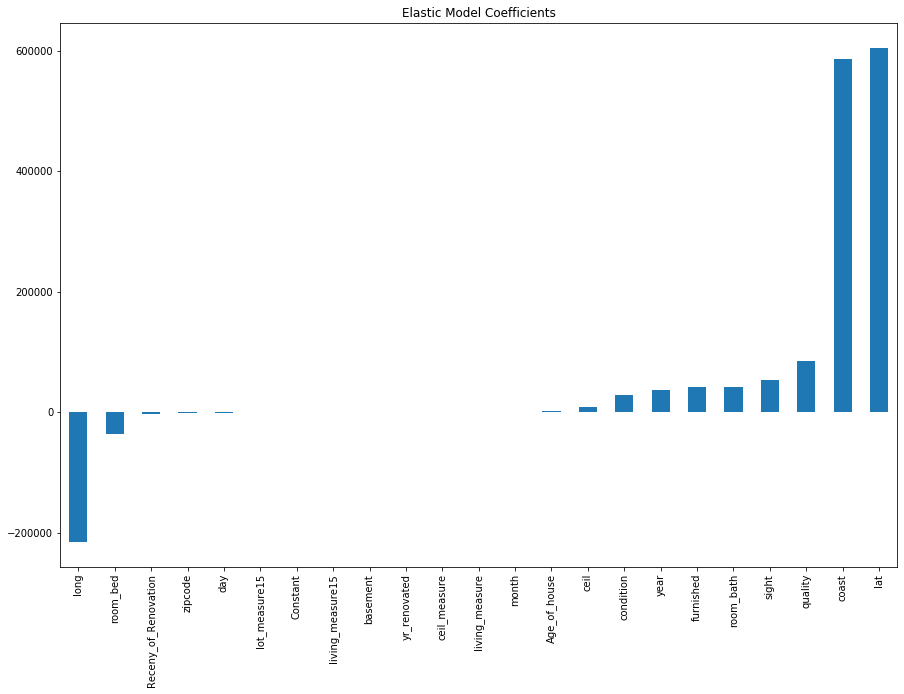

In [158]:
regressor_ridge.fit(data_refined.drop('price', axis = 1), data_refined['price'])
predictors_ridge = data_refined.drop('price', axis = 1).columns
coef_ridge = pd.Series(regressor_ridge.coef_,predictors_ridge).sort_values()
plt.figure(figsize = (15,10))
coef_ridge.plot(kind='bar', title='Elastic Model Coefficients')
plt.show()

### 1.4  Lasso Regression ( L1 Regularization )

In [159]:
from sklearn.linear_model import Lasso
regressor_lasso = Lasso()

In [160]:
nmse_Lasso =cross_val_score(regressor_lasso, data_refined[predictors_columns], data_refined['price'], scoring= 'neg_mean_squared_error',
                                cv = 20)

In [161]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_lasso = np.sqrt(abs(nmse_Lasso))
rmse_lasso

array([217099.4173806 , 190973.69129239, 183218.67439827, 190535.06061994,
       211741.44038987, 228673.96461664, 206146.38678049, 187225.27669867,
       176934.70333258, 187316.96061398, 183559.30552736, 190290.75996957,
       191726.74006212, 176297.08653995, 179654.64837749, 239981.86083723,
       199843.8331736 , 202084.5664987 , 222925.23504848, 230927.55683861])

In [162]:
r2_score_Lasso =cross_val_score(regressor_lasso, data_refined[predictors_columns], data_refined['price'],
                                cv = 20)

In [163]:
r2_score_Lasso

array([0.68574013, 0.73604029, 0.68516681, 0.72129254, 0.72412382,
       0.70111192, 0.66424149, 0.73943459, 0.72424455, 0.70328449,
       0.72651348, 0.71317183, 0.69556389, 0.69625401, 0.69064606,
       0.67198796, 0.68872278, 0.68379927, 0.66996183, 0.70639723])

## Inferences:

In [164]:
print ("The Linear Regresion model after L1 Regulariztion has a mean accuracy of",
       rmse_lasso.mean(),'with a standard devition of ',rmse_lasso.std())

The Linear Regresion model after L1 Regulariztion has a mean accuracy of 199857.8584498277 with a standard devition of  18831.261403156634


### Lets see co - efficients that we got in Lasso Regression

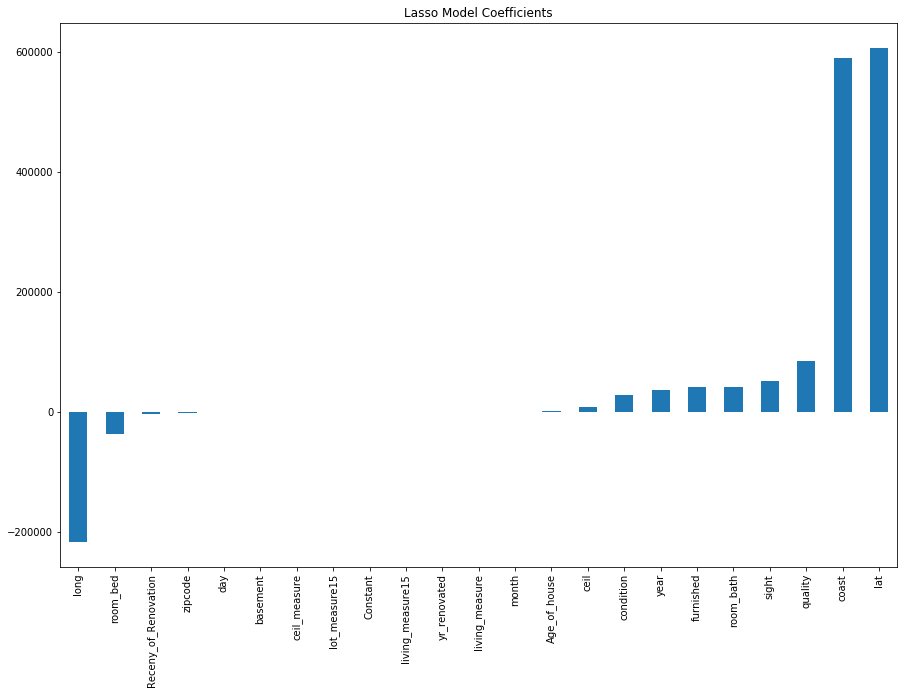

In [165]:
regressor_lasso.fit(data_refined.drop('price', axis = 1), data_refined['price'])
predictors_lasso = data_refined.drop('price', axis = 1).columns
coef_lasso = pd.Series(regressor_lasso.coef_,predictors_lasso).sort_values()
plt.figure(figsize = (15,10))
coef_lasso.plot(kind='bar', title='Lasso Model Coefficients')
plt.show()

### 1.5 Elastic Net

In [166]:
from sklearn.linear_model import ElasticNet
regressor_elastic = ElasticNet()

In [167]:
nmse_elastic =cross_val_score(regressor_elastic, data_refined[predictors_columns], data_refined['price'], scoring= 'neg_mean_squared_error',
                              cv = 20)

In [168]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_elastic = np.sqrt(abs(nmse_elastic))
rmse_elastic

array([235715.30134123, 226443.60997711, 201720.06771114, 218953.46162778,
       245927.78311364, 257020.05366576, 226703.30434271, 218104.79058738,
       203139.94175595, 206286.65684507, 207101.09092477, 215757.81562501,
       207668.86873756, 195774.37458779, 203917.68760602, 259350.95249626,
       226648.64753421, 229425.89965427, 248613.91141464, 267278.59913802])

In [169]:
r2_score_elastic =cross_val_score(regressor_elastic, data_refined[predictors_columns], data_refined['price'],
                              cv = 20)
r2_score_elastic

array([0.62953502, 0.62888312, 0.61837287, 0.63195374, 0.62785031,
       0.62241984, 0.593939  , 0.64639515, 0.63651315, 0.64014435,
       0.65186484, 0.63126066, 0.64283114, 0.62543087, 0.60144476,
       0.6169031 , 0.59962025, 0.59244947, 0.5895157 , 0.60668818])

## Inferences:

In [170]:
print ("The Elastic Model has a mean accuracy of",
       rmse_elastic.mean(),'with a standard devition of ',rmse_elastic.std())

The Elastic Model has a mean accuracy of 225077.64093431612 with a standard devition of  20723.415368294573


### Lets see co - efficients that we got in Elastic Regression

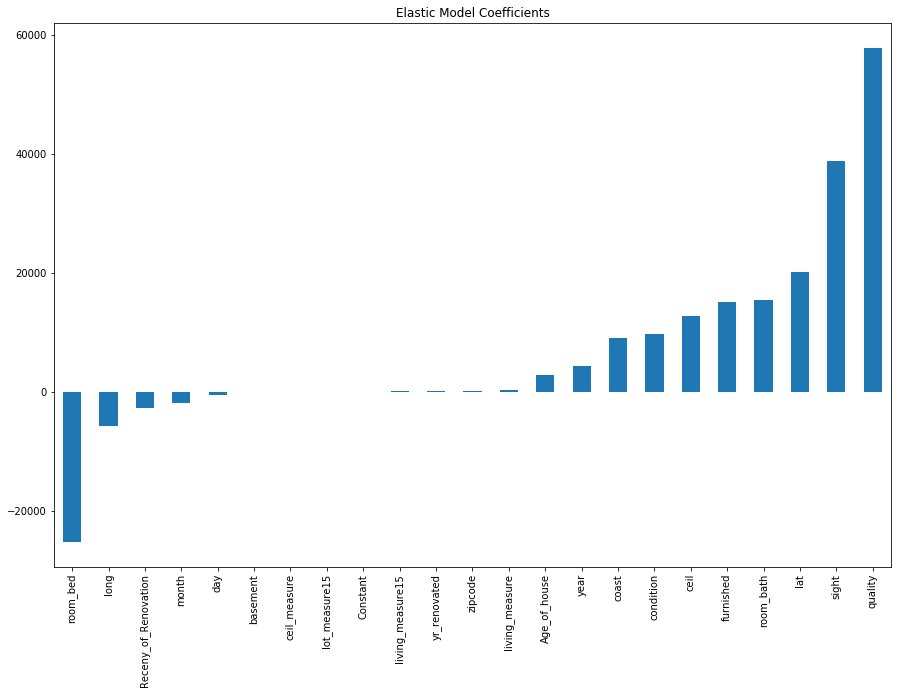

In [171]:
regressor_elastic.fit(data_refined.drop('price', axis = 1), data_refined['price'])
predictors_elastic = data_refined.drop('price', axis = 1).columns
coef_elastic = pd.Series(regressor_elastic.coef_,predictors_elastic).sort_values()
plt.figure(figsize = (15,10))
coef_elastic.plot(kind='bar', title='Elastic Model Coefficients')
plt.show()

In [172]:
model_accuracies1 = {}

In [174]:
model_accuracies1['Model_Name']  = ['Linear Regression', 'LinearRegression with Backward Elimination',' Ridge Regression',
                                  'Lasso Regression','Elastic Net Regression'] 
model_accuracies1['Accuracies']  = [np.mean(rmse_linear),np.mean(rmse_backward),np.mean(rmse_ridge), np.mean(rmse_ridge), np.mean(rmse_elastic)]

In [175]:
model_accuracies_simple = pd.DataFrame(model_accuracies1)

## 2. Polynomial Regression with Degree 2

In [176]:
from sklearn.preprocessing import PolynomialFeatures 
poly = PolynomialFeatures(degree = 2) 
X_poly = poly.fit_transform(data_refined.drop('price', axis = 1))   

In [177]:
from sklearn.linear_model import LinearRegression
regressor_Poly = LinearRegression()

In [178]:
from sklearn.model_selection import cross_val_score
nmse_poly_2 =cross_val_score(regressor_Poly, X_poly, data_refined['price'], scoring= 'neg_mean_squared_error',
                                cv = 20)

In [179]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_poly_2 = np.sqrt(abs(nmse_poly_2))
rmse_poly_2

array([162255.1113271 , 158099.38980571, 145147.2709731 , 154704.92476147,
       153481.28454402, 167456.18187796, 158382.70685368, 156705.46689257,
       142633.94502652, 168242.53843649, 150109.21508502, 154356.66833035,
       149468.45133595, 147990.4984595 , 146307.37972224, 159938.98380344,
       156316.80406897, 156890.70153804, 153311.06709912, 183797.90532856])

In [180]:
r2_score_poly_2 =cross_val_score(regressor_Poly, X_poly, data_refined['price'],
                                cv = 20)
r2_score_poly_2

array([0.82446312, 0.81909484, 0.80241281, 0.81625858, 0.85505163,
       0.83972067, 0.80180573, 0.81746082, 0.82079759, 0.76063664,
       0.81710669, 0.81127163, 0.81497524, 0.78596344, 0.79483126,
       0.85430602, 0.80955167, 0.809414  , 0.84390366, 0.81400994])

### Inferences

In [181]:
print ("The Polynomial Regresion model  with degree 2 has a mean accuracy of",
       rmse_poly_2.mean(),'with a standard devition of ',rmse_poly_2.std())

The Polynomial Regresion model  with degree 2 has a mean accuracy of 156279.82476349003 with a standard devition of  9133.033911466793


## 2. Polynomial Regression with Degree 3

poly = PolynomialFeatures(degree = 3) 
X_poly = poly.fit_transform(data_refined.drop('price', axis = 1))   

In [182]:
nmse_poly_3 =cross_val_score(regressor, X_poly, data_refined['price'], scoring= 'neg_mean_squared_error',
                                cv = 20)

In [183]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_poly_3 = np.sqrt(abs(nmse_poly_3))
rmse_poly_3

array([162255.1113271 , 158099.38980571, 145147.2709731 , 154704.92476147,
       153481.28454402, 167456.18187796, 158382.70685368, 156705.46689257,
       142633.94502652, 168242.53843649, 150109.21508502, 154356.66833035,
       149468.45133595, 147990.4984595 , 146307.37972224, 159938.98380344,
       156316.80406897, 156890.70153804, 153311.06709912, 183797.90532856])

In [184]:
r2_score_poly_3 =cross_val_score(regressor, X_poly, data_refined['price'],
                                cv = 20)
r2_score_poly_3

array([0.82446312, 0.81909484, 0.80241281, 0.81625858, 0.85505163,
       0.83972067, 0.80180573, 0.81746082, 0.82079759, 0.76063664,
       0.81710669, 0.81127163, 0.81497524, 0.78596344, 0.79483126,
       0.85430602, 0.80955167, 0.809414  , 0.84390366, 0.81400994])

###  Inferences

In [185]:
print ("The Polynomial Regresion model has a mean accuracy of",
       rmse_poly_3.mean(),'with a standard devition of ',rmse_poly_3.std())

The Polynomial Regresion model has a mean accuracy of 156279.82476349003 with a standard devition of  9133.033911466793


We could see that by increasing the degree the RMSE is also increasin, so we refrain from increasing the degree of features.

## 3. SVR

In [186]:
from sklearn.svm import SVR
regressor_SVR = SVR()

In [187]:
nmse_SVR = cross_val_score(regressor_SVR, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)

In [188]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_SVR = np.sqrt(abs(nmse_SVR))
rmse_SVR

array([398579.79906757, 381924.6468715 , 337059.6867411 , 370965.80411675,
       415038.7011545 , 431686.80381659, 369160.90785958, 380558.08544886,
       345436.90343418, 354969.16108483, 364304.67888568, 366917.0092529 ,
       358149.5715036 , 331144.40948673, 331324.06265452, 429508.43800152,
       367196.54871833, 369910.36682063, 396533.03669865, 438426.59002286])

In [189]:
r2_score_SVR = cross_val_score(regressor_SVR, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2_score_SVR

array([-0.05925904, -0.05571316, -0.06550296, -0.05649279, -0.05993606,
       -0.06515472, -0.07673044, -0.07653885, -0.0510794 , -0.06553396,
       -0.07724035, -0.06640479, -0.06233053, -0.07165537, -0.05216702,
       -0.05069423, -0.05090395, -0.05947224, -0.04424993, -0.05828442])

## Inferences

In [190]:
print ("The Support Vector Regressor model has a mean accuracy of",
       rmse_SVR.mean(),'with a standard devition of ',rmse_SVR.std())

The Support Vector Regressor model has a mean accuracy of 376939.7605820432 with a standard devition of  31607.174877969843


## 4.KNR

In [191]:
from sklearn.neighbors import KNeighborsRegressor
regressor_KNR = KNeighborsRegressor()

In [192]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [193]:
nmse_KNR = cross_val_score(regressor_KNR, sc.fit_transform(data_refined.drop('price', axis = 1)), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_KNR = np.sqrt(abs(nmse_KNR))
rmse_KNR

array([191847.2322317 , 167242.3071464 , 161852.22084518, 170796.1360457 ,
       176061.56359858, 186192.88820319, 180784.80026791, 157950.48428472,
       156309.22392743, 181894.91039186, 165904.78686667, 179688.98032621,
       169459.50288234, 154507.25843698, 156659.97537093, 196630.83297123,
       183996.78512219, 193856.17174231, 177917.69376996, 210111.48976154])

In [194]:
r2_score_KNR = cross_val_score(regressor_KNR, sc.fit_transform(data_refined.drop('price', axis = 1)), data_refined['price'],
                           cv = 20)
r2_score_KNR

array([0.75459541, 0.79756628, 0.75431516, 0.77604804, 0.80926448,
       0.80184669, 0.74177433, 0.81454877, 0.78478761, 0.72021325,
       0.77659085, 0.74424197, 0.76217218, 0.76669821, 0.76476885,
       0.77979043, 0.73613225, 0.70902489, 0.78977518, 0.75694294])

## Inferences

In [195]:
print ("The K-NN Regressor model has a mean accuracy of",
       rmse_KNR.mean(),'with a standard devition of',rmse_KNR.std())

The K-NN Regressor model has a mean accuracy of 175983.26220965228 with a standard devition of 14832.547691665011


In [196]:
model_accuracies2 = {}

In [198]:
model_accuracies2['Model_Name'] = ['Polynomial Regression(Degree:2)','Polynomial Regression(Degree:3)','SVR','KNR']
model_accuracies2['Accuracies'] = [np.mean(rmse_poly_2), rmse_poly_3.mean(),np.mean(rmse_SVR),np.mean(rmse_KNR)]

In [199]:
model_accuracies_poly = pd.DataFrame(model_accuracies2)

## 5. Decision Tree (Unrestricted)

In [201]:
from sklearn.tree import DecisionTreeRegressor
regressor_Decision = DecisionTreeRegressor()

In [202]:
from sklearn.model_selection import cross_val_score
nmse_Decision = cross_val_score(regressor_Decision, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)

In [203]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_Decision = np.sqrt(abs(nmse_Decision))
rmse_Decision

array([184419.86050534, 187358.58898539, 145294.37885214, 167519.14531691,
       188485.13151609, 200837.38729265, 166464.1442692 , 188934.3071305 ,
       156945.1856693 , 172520.39455708, 171310.87819165, 182250.73990017,
       180325.84628144, 184621.91226876, 183350.09999142, 163017.86889677,
       185743.89596604, 178879.16620372, 198537.74101946, 295032.34236089])

In [204]:
r2_score_Decision = cross_val_score(regressor_Decision, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2_score_Decision

array([0.80991125, 0.7305479 , 0.78099475, 0.80475368, 0.78500279,
       0.76488814, 0.77563267, 0.72395618, 0.75714571, 0.75758966,
       0.76566092, 0.73365796, 0.72582752, 0.63612179, 0.65779098,
       0.72307446, 0.780238  , 0.68127119, 0.75442881, 0.5616185 ])

## Inferences

In [205]:
print ("The Decision Tree Regressor model has a mean accuracy of",
       rmse_Decision.mean(),'with a standard devition of ',rmse_Decision.std())

The Decision Tree Regressor model has a mean accuracy of 184092.45075874653 with a standard devition of  28694.654792269437


### Lets Check the Important Features selected by the Decision Tree

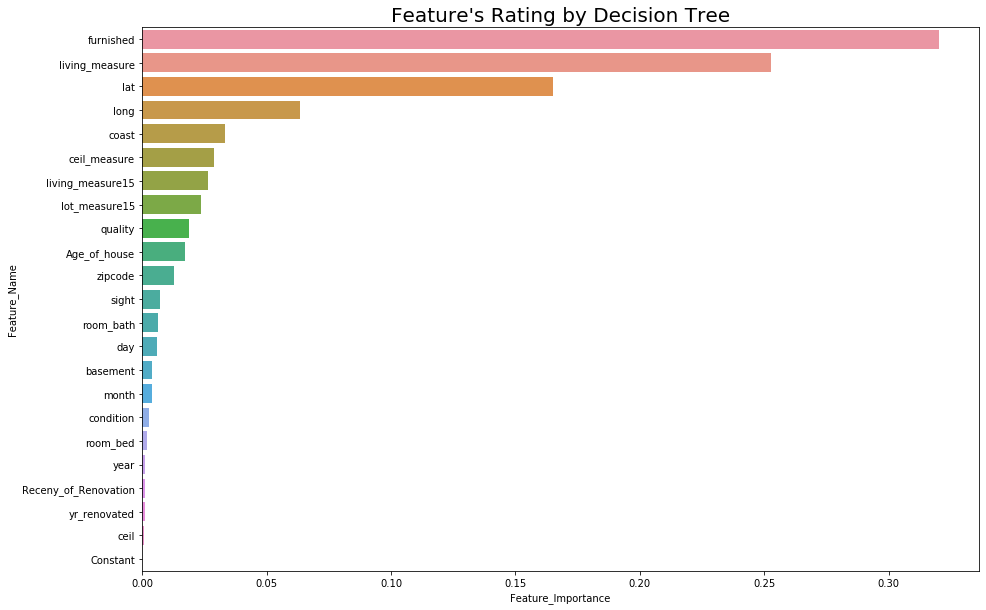

In [206]:
regressor_Decision.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_decision = pd.DataFrame(regressor_Decision.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_decision.columns = ['Feature_Name','Feature_Importance']
important_features_decision = important_features_decision.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_decision['Feature_Importance'], important_features_decision['Feature_Name'])
plt.title('Feature\'s Rating by Decision Tree', size = 20)
plt.show()

## Inferences:

Here we could see that 'Furnished' columns is having the highest feature importance followed by living measure and lat.

## 6. Random Forest( Unrestricted)

In [207]:
from sklearn.ensemble import RandomForestRegressor
regressor_forest = RandomForestRegressor()

In [208]:
nmse_forest = cross_val_score(regressor_forest, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)

In [209]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_forest = np.sqrt(abs(nmse_forest))
rmse_forest

array([120730.48906701, 154537.00735976, 106079.64330351, 122203.05899423,
       126436.30741706, 147048.29166208, 126140.97237506, 134276.32338407,
       121153.66152016, 133021.54711981, 123253.70376553, 119609.55389882,
       132203.56576196, 127205.06910597, 126612.4400056 , 128165.73447903,
       126074.70557837, 138549.47471204, 152075.27681567, 191595.5286723 ])

In [210]:
r2_score_forest = cross_val_score(regressor_forest, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2_score_forest

array([0.87714693, 0.86809139, 0.90087603, 0.87496185, 0.89311936,
       0.85118895, 0.86788638, 0.87508501, 0.88137275, 0.8750057 ,
       0.88063035, 0.8779214 , 0.85995496, 0.83209298, 0.84837247,
       0.88643344, 0.86655925, 0.84917908, 0.84742607, 0.81620204])

## Inferences

In [211]:
print ("The Random Forest Regressor model has a mean accuracy of",
       rmse_forest.mean(),'with a standard devition of ',rmse_forest.std())

The Random Forest Regressor model has a mean accuracy of 132848.6177499026 with a standard devition of  17511.98484662111


### Lets Check the Important Features selected by the Random Forest

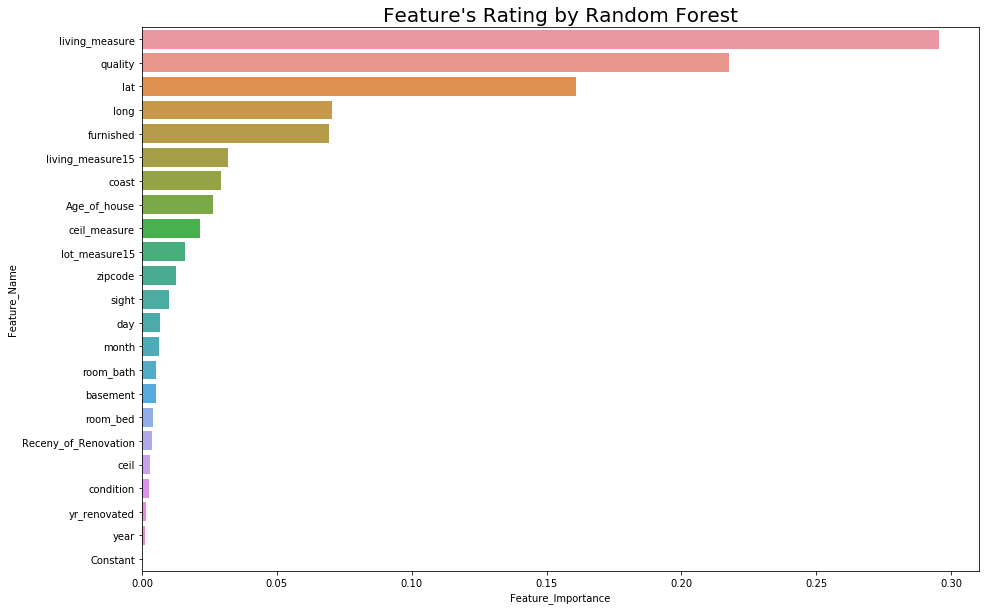

In [212]:
regressor_forest.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_forest = pd.DataFrame(regressor_forest.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_forest.columns = ['Feature_Name','Feature_Importance']
important_features_forest = important_features_forest.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_forest['Feature_Importance'], important_features_forest['Feature_Name'])
plt.title('Feature\'s Rating by Random Forest', size = 20)
plt.show()

## Inferences:

The Random Forest has Chosen  'Living Measure' as the top most important feature followed by 'quality' and 'lat'

## 7. Bagging Regressor

In [213]:
from sklearn.ensemble import BaggingRegressor
regressor_Bagging = BaggingRegressor()
# By default it will take Decision Tree as the deafult base estimator

In [214]:
nmse_Bagging = cross_val_score(regressor_Bagging, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_Bagging = np.sqrt(abs(nmse_Bagging))
rmse_Bagging

array([127420.75790914, 159876.43576159, 104392.70977713, 126074.09049785,
       131661.173359  , 152332.94085156, 128499.82574322, 124276.39011914,
       116144.90273489, 134251.73765717, 124975.40432041, 126764.46136513,
       130082.77175142, 122841.41908416, 128212.62456224, 150219.78154134,
       136799.35073201, 130613.82048648, 145353.78105437, 197825.01833419])

In [215]:
r2_score_Bagging = cross_val_score(regressor_Bagging, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2_score_Bagging

array([0.89755371, 0.8015146 , 0.89069471, 0.86804663, 0.90525945,
       0.84484539, 0.87394199, 0.87815922, 0.86879966, 0.83356867,
       0.87940326, 0.87203284, 0.85998776, 0.84525021, 0.82557636,
       0.89131132, 0.87036129, 0.86690264, 0.84560196, 0.83965886])

## Inferences:

In [216]:
print ("The Bagging Regressor model which uses Decision Tree as the base estimator has a mean accuracy of",
       rmse_Bagging.mean(),'with a standard devition of ',rmse_Bagging.std())

The Bagging Regressor model which uses Decision Tree as the base estimator has a mean accuracy of 134930.96988212276 with a standard devition of  18989.817012402065


## 8. AdaBoost Regressor

In [217]:
from sklearn.ensemble import AdaBoostRegressor
regressor_adaboost = AdaBoostRegressor()

In [218]:
nmse_Adaboost = cross_val_score(regressor_adaboost, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_Adaboost = np.sqrt(abs(nmse_Adaboost))
rmse_Adaboost

array([354192.34971075, 350058.03905542, 363712.06861913, 351582.18823451,
       335178.68526563, 346751.38073951, 337348.45083594, 316023.74920151,
       313511.86449993, 353874.43980448, 303918.53324306, 304927.92347809,
       300369.85623791, 345103.14308208, 308176.29570717, 331590.01661019,
       354083.93704696, 336112.17389209, 388578.9308827 , 387538.45997388])

In [219]:
r2_score_Adaboost = cross_val_score(regressor_adaboost, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2_score_Adaboost

array([ 0.32633663, -0.09481142, -0.0463337 ,  0.02593817,  0.30915595,
        0.02517703,  0.03866126,  0.12462052,  0.08042086,  0.03339259,
        0.15903102,  0.02596004,  0.17701356, -0.07514434, -0.00161956,
        0.36782919,  0.1691049 , -0.01509039,  0.20607041,  0.24880102])

## Inferences

In [220]:
print ("The Adaboost Regressor model has a mean accuracy of",
       rmse_Adaboost.mean(),'with a standard devition of ',rmse_Adaboost.std())

The Adaboost Regressor model has a mean accuracy of 339131.62430604675 with a standard devition of  25073.923647885225


### Lets Check the Important Features selected by the Adaboost

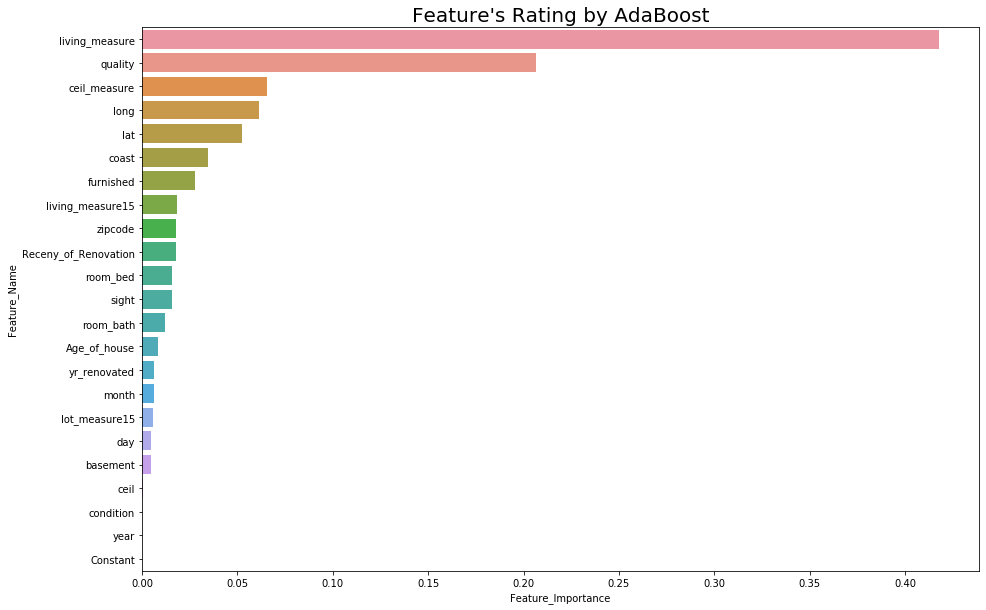

In [221]:
regressor_adaboost.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_adaboost = pd.DataFrame(regressor_adaboost.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_adaboost.columns = ['Feature_Name','Feature_Importance']
important_features_adaboost = important_features_adaboost.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_adaboost['Feature_Importance'], important_features_adaboost['Feature_Name'])
plt.title('Feature\'s Rating by AdaBoost', size = 20)
plt.show()

## Inferences

'living_measure' has been chosen as the most relevnt feature followed by 'quality' and 'ceil_measure'

## 9.Gradient Boosting Regressor

In [222]:
from sklearn.ensemble import GradientBoostingRegressor
regressor_Gradient = GradientBoostingRegressor()

In [223]:
nmse_Gradient = cross_val_score(regressor_Gradient, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_Gradient = np.sqrt(abs(nmse_Gradient))
rmse_Gradient

array([129257.11895613, 150159.12627427, 112311.02259706, 128288.8029767 ,
       129334.49984603, 156735.6541938 , 128584.62362465, 126415.90462827,
       114432.72583521, 131236.54618548, 123766.5035054 , 123860.80771876,
       128877.63302323, 127389.6854154 , 123834.77854202, 148704.1436667 ,
       129677.14214151, 129527.04430368, 138557.35963028, 178577.28684107])

In [224]:
r2_score_Gradient = cross_val_score(regressor_Gradient, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2_score_Gradient

array([0.88860119, 0.83632139, 0.88169971, 0.8736497 , 0.8968674 ,
       0.85962437, 0.86936677, 0.8812069 , 0.88500326, 0.85435498,
       0.87566616, 0.87801639, 0.86244199, 0.84146849, 0.85233041,
       0.87203088, 0.86930877, 0.87009751, 0.86458727, 0.82119353])

## Inferences

In [225]:
print ("The Gradient Boosting Regressor model has a mean accuracy of",
       rmse_Gradient.mean(),'with a standard devition of ',rmse_Gradient.std())

The Gradient Boosting Regressor model has a mean accuracy of 132976.4204952828 with a standard devition of  14875.0271596647


### Lets Check the Important Features selected by the Gradeint Boosing Regressor

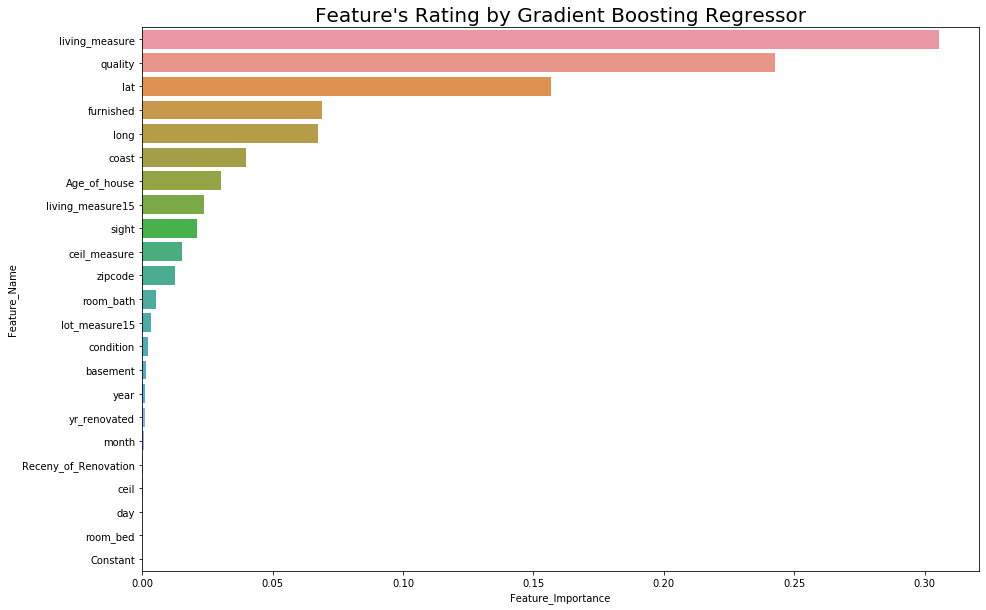

In [226]:
regressor_Gradient.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_gradient = pd.DataFrame(regressor_Gradient.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_gradient.columns = ['Feature_Name','Feature_Importance']
important_features_gradient = important_features_gradient.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_gradient['Feature_Importance'], important_features_gradient['Feature_Name'])
plt.title('Feature\'s Rating by Gradient Boosting Regressor', size = 20)
plt.show()

## Inferences:

'living_measure' has been chosen as the most relevant feature followed by 'quality' and 'lat'

## 10. XGBoost

In [227]:
from xgboost import XGBRegressor
regressor_Xgboost = XGBRegressor()

In [228]:
nmse_Xgboost = cross_val_score(regressor_Xgboost, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_Xgboost = np.sqrt(abs(nmse_Xgboost))
rmse_Xgboost

[02:37:43] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:37:46] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:37:48] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:37:50] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:37:52] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:37:53] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:37:55] WARNI

array([122522.68236767, 167113.96989521, 114364.20594821, 127474.04597091,
       133879.39567891, 156851.08316945, 131020.70310339, 125534.93414256,
       114342.81505661, 132553.30023933, 124090.2645818 , 126271.03232738,
       129892.83384153, 128760.35654035, 124306.1748517 , 153089.19678396,
       128910.60901886, 129022.3971675 , 144938.47591427, 169359.14841712])

In [229]:
r2_score_Xgboost = cross_val_score(regressor_Xgboost, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2_score_Xgboost

[02:38:21] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:38:23] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:38:24] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:38:26] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:38:28] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:38:30] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[02:38:32] WARNI

array([0.89990679, 0.79787684, 0.87733483, 0.87524949, 0.88971157,
       0.859379  , 0.8643701 , 0.88285682, 0.88483624, 0.85141768,
       0.87501482, 0.87370276, 0.8602663 , 0.83797403, 0.85189691,
       0.86651821, 0.87047811, 0.87110775, 0.86048751, 0.84208407])

## Inferences

In [230]:
print ("The XGBoost Regressor model has a mean accuracy of",
       rmse_Xgboost.mean(),'with a standard devition of ',rmse_Xgboost.std())

The XGBoost Regressor model has a mean accuracy of 134214.88125083718 with a standard devition of  15375.205692941674


### Lets Check the Important Features selected by the XGBoost Regressor

[02:38:58] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


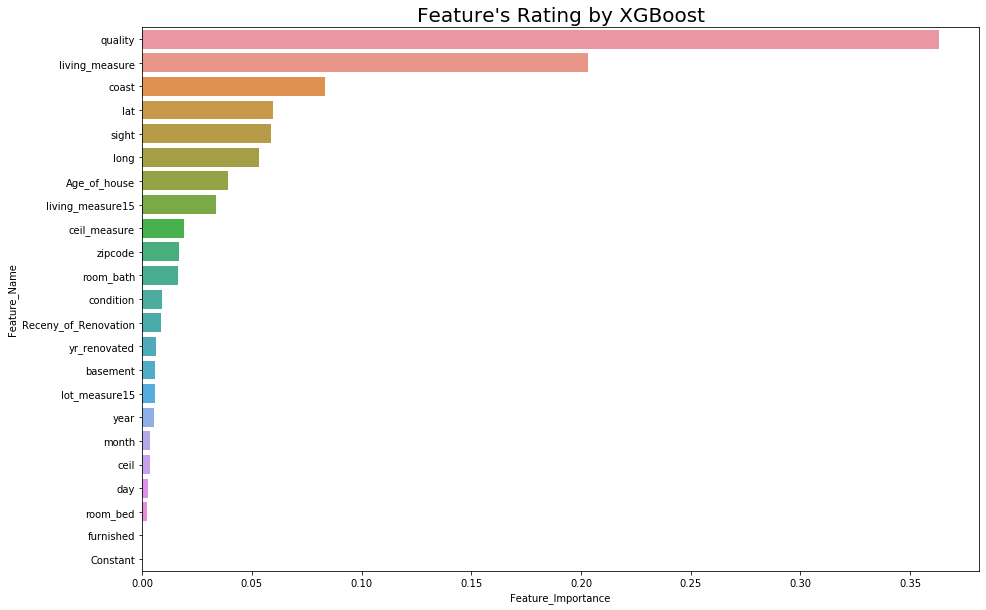

In [231]:
regressor_Xgboost.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_XGBoost = pd.DataFrame(regressor_Xgboost.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_XGBoost.columns = ['Feature_Name','Feature_Importance']
important_features_XGBoost = important_features_XGBoost.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_XGBoost['Feature_Importance'], important_features_XGBoost['Feature_Name'])
plt.title('Feature\'s Rating by XGBoost', size = 20)
plt.show()

## Inference

'quality' has been chosen as the most relevant feature followed by 'living_measure' and 'coast'

## 11. CatBoost

In [232]:
#!pip install catboost

In [233]:
from catboost import CatBoostRegressor
regressor_catboost = CatBoostRegressor()

In [234]:
nmse_catboost = cross_val_score(regressor_catboost, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_catboost = np.sqrt(abs(nmse_catboost))
rmse_catboost

0:	learn: 359614.7040007	total: 58.8ms	remaining: 58.8s
1:	learn: 352811.8447935	total: 66ms	remaining: 32.9s
2:	learn: 346382.8681151	total: 71.9ms	remaining: 23.9s
3:	learn: 339718.0791744	total: 77.7ms	remaining: 19.4s
4:	learn: 333579.3330829	total: 84ms	remaining: 16.7s
5:	learn: 327581.5860693	total: 89.8ms	remaining: 14.9s
6:	learn: 321854.5605504	total: 95.8ms	remaining: 13.6s
7:	learn: 316175.6858131	total: 103ms	remaining: 12.8s
8:	learn: 310576.5974747	total: 109ms	remaining: 12s
9:	learn: 305111.9019246	total: 116ms	remaining: 11.5s
10:	learn: 300054.3973862	total: 122ms	remaining: 10.9s
11:	learn: 294921.6119872	total: 129ms	remaining: 10.6s
12:	learn: 290051.4502506	total: 136ms	remaining: 10.3s
13:	learn: 285280.2247223	total: 143ms	remaining: 10s
14:	learn: 280936.2126286	total: 148ms	remaining: 9.74s
15:	learn: 276792.5968531	total: 154ms	remaining: 9.47s
16:	learn: 272449.3779222	total: 160ms	remaining: 9.23s
17:	learn: 268376.6920486	total: 165ms	remaining: 9s
18:	le

166:	learn: 122988.7566393	total: 1.1s	remaining: 5.49s
167:	learn: 122857.5546510	total: 1.11s	remaining: 5.48s
168:	learn: 122747.1753996	total: 1.11s	remaining: 5.47s
169:	learn: 122662.7579752	total: 1.12s	remaining: 5.46s
170:	learn: 122586.4750642	total: 1.12s	remaining: 5.45s
171:	learn: 122324.4104894	total: 1.13s	remaining: 5.44s
172:	learn: 122311.8421153	total: 1.14s	remaining: 5.43s
173:	learn: 121972.6694723	total: 1.14s	remaining: 5.42s
174:	learn: 121759.8406268	total: 1.15s	remaining: 5.41s
175:	learn: 121711.9964182	total: 1.15s	remaining: 5.4s
176:	learn: 121530.7609436	total: 1.16s	remaining: 5.39s
177:	learn: 121409.3559862	total: 1.17s	remaining: 5.38s
178:	learn: 121283.2651552	total: 1.17s	remaining: 5.38s
179:	learn: 121204.0956139	total: 1.18s	remaining: 5.37s
180:	learn: 121092.8886954	total: 1.18s	remaining: 5.35s
181:	learn: 120961.1041540	total: 1.19s	remaining: 5.35s
182:	learn: 120857.2904540	total: 1.2s	remaining: 5.34s
183:	learn: 120745.1047292	total: 

336:	learn: 107894.5725967	total: 2.14s	remaining: 4.22s
337:	learn: 107823.5906899	total: 2.15s	remaining: 4.21s
338:	learn: 107781.6832871	total: 2.16s	remaining: 4.21s
339:	learn: 107723.1175976	total: 2.16s	remaining: 4.2s
340:	learn: 107689.9052286	total: 2.17s	remaining: 4.19s
341:	learn: 107646.3643848	total: 2.17s	remaining: 4.18s
342:	learn: 107591.1734711	total: 2.18s	remaining: 4.18s
343:	learn: 107511.3324762	total: 2.19s	remaining: 4.17s
344:	learn: 107445.6888181	total: 2.19s	remaining: 4.16s
345:	learn: 107394.1666916	total: 2.2s	remaining: 4.15s
346:	learn: 107343.7001291	total: 2.2s	remaining: 4.15s
347:	learn: 107292.6945528	total: 2.21s	remaining: 4.14s
348:	learn: 107217.0063477	total: 2.22s	remaining: 4.13s
349:	learn: 107115.5511750	total: 2.22s	remaining: 4.13s
350:	learn: 107059.6672514	total: 2.23s	remaining: 4.12s
351:	learn: 107007.0618111	total: 2.23s	remaining: 4.12s
352:	learn: 106935.7212782	total: 2.24s	remaining: 4.11s
353:	learn: 106879.1199668	total: 

499:	learn: 99122.6269146	total: 3.18s	remaining: 3.18s
500:	learn: 99084.2800930	total: 3.18s	remaining: 3.17s
501:	learn: 99035.1090356	total: 3.19s	remaining: 3.17s
502:	learn: 99008.0498639	total: 3.2s	remaining: 3.16s
503:	learn: 98970.4401527	total: 3.2s	remaining: 3.15s
504:	learn: 98936.9347449	total: 3.21s	remaining: 3.15s
505:	learn: 98894.1409380	total: 3.21s	remaining: 3.14s
506:	learn: 98861.1700973	total: 3.22s	remaining: 3.13s
507:	learn: 98819.9478273	total: 3.23s	remaining: 3.13s
508:	learn: 98774.4659339	total: 3.23s	remaining: 3.12s
509:	learn: 98721.2698548	total: 3.24s	remaining: 3.11s
510:	learn: 98663.2578170	total: 3.24s	remaining: 3.1s
511:	learn: 98621.1169328	total: 3.25s	remaining: 3.1s
512:	learn: 98583.4032274	total: 3.26s	remaining: 3.09s
513:	learn: 98537.6258296	total: 3.26s	remaining: 3.09s
514:	learn: 98503.2591533	total: 3.27s	remaining: 3.08s
515:	learn: 98459.1342036	total: 3.27s	remaining: 3.07s
516:	learn: 98429.6807161	total: 3.28s	remaining: 3.

657:	learn: 93777.1655704	total: 4.22s	remaining: 2.19s
658:	learn: 93738.0295056	total: 4.22s	remaining: 2.18s
659:	learn: 93693.6173059	total: 4.23s	remaining: 2.18s
660:	learn: 93661.2110379	total: 4.24s	remaining: 2.17s
661:	learn: 93651.8962625	total: 4.24s	remaining: 2.17s
662:	learn: 93605.5910687	total: 4.25s	remaining: 2.16s
663:	learn: 93580.3356147	total: 4.25s	remaining: 2.15s
664:	learn: 93521.1844005	total: 4.26s	remaining: 2.15s
665:	learn: 93514.6849292	total: 4.26s	remaining: 2.14s
666:	learn: 93495.9856399	total: 4.27s	remaining: 2.13s
667:	learn: 93465.3517413	total: 4.28s	remaining: 2.13s
668:	learn: 93436.7637314	total: 4.28s	remaining: 2.12s
669:	learn: 93427.1645031	total: 4.29s	remaining: 2.11s
670:	learn: 93388.8771449	total: 4.3s	remaining: 2.11s
671:	learn: 93365.7344213	total: 4.3s	remaining: 2.1s
672:	learn: 93346.8166684	total: 4.31s	remaining: 2.09s
673:	learn: 93321.7461421	total: 4.32s	remaining: 2.09s
674:	learn: 93292.5077108	total: 4.32s	remaining: 2

818:	learn: 89330.0234770	total: 5.25s	remaining: 1.16s
819:	learn: 89320.8589314	total: 5.26s	remaining: 1.15s
820:	learn: 89293.3312688	total: 5.27s	remaining: 1.15s
821:	learn: 89266.9026152	total: 5.27s	remaining: 1.14s
822:	learn: 89237.2836874	total: 5.28s	remaining: 1.14s
823:	learn: 89198.3330240	total: 5.29s	remaining: 1.13s
824:	learn: 89171.0719417	total: 5.29s	remaining: 1.12s
825:	learn: 89142.5981893	total: 5.3s	remaining: 1.12s
826:	learn: 89128.3747242	total: 5.3s	remaining: 1.11s
827:	learn: 89113.5171934	total: 5.31s	remaining: 1.1s
828:	learn: 89094.6768250	total: 5.32s	remaining: 1.1s
829:	learn: 89083.0247805	total: 5.32s	remaining: 1.09s
830:	learn: 89066.4059767	total: 5.33s	remaining: 1.08s
831:	learn: 89053.6046468	total: 5.34s	remaining: 1.08s
832:	learn: 89021.9452276	total: 5.34s	remaining: 1.07s
833:	learn: 88992.6787300	total: 5.35s	remaining: 1.06s
834:	learn: 88971.0027261	total: 5.36s	remaining: 1.06s
835:	learn: 88955.1138240	total: 5.36s	remaining: 1.

981:	learn: 85747.9607211	total: 6.3s	remaining: 115ms
982:	learn: 85725.6572328	total: 6.3s	remaining: 109ms
983:	learn: 85709.6013130	total: 6.31s	remaining: 103ms
984:	learn: 85685.2424941	total: 6.32s	remaining: 96.2ms
985:	learn: 85663.7890780	total: 6.33s	remaining: 89.8ms
986:	learn: 85652.4998050	total: 6.33s	remaining: 83.4ms
987:	learn: 85633.6448247	total: 6.34s	remaining: 77ms
988:	learn: 85617.2811674	total: 6.34s	remaining: 70.6ms
989:	learn: 85601.9526583	total: 6.35s	remaining: 64.1ms
990:	learn: 85590.0445959	total: 6.36s	remaining: 57.7ms
991:	learn: 85577.6502810	total: 6.36s	remaining: 51.3ms
992:	learn: 85563.3041908	total: 6.37s	remaining: 44.9ms
993:	learn: 85547.6818226	total: 6.37s	remaining: 38.5ms
994:	learn: 85520.2455710	total: 6.38s	remaining: 32.1ms
995:	learn: 85502.0539826	total: 6.39s	remaining: 25.7ms
996:	learn: 85487.1597926	total: 6.39s	remaining: 19.2ms
997:	learn: 85463.7146555	total: 6.4s	remaining: 12.8ms
998:	learn: 85447.0049812	total: 6.41s	

135:	learn: 128987.8776245	total: 875ms	remaining: 5.56s
136:	learn: 128773.8908314	total: 881ms	remaining: 5.55s
137:	learn: 128531.1986936	total: 888ms	remaining: 5.55s
138:	learn: 128177.8838832	total: 894ms	remaining: 5.54s
139:	learn: 127944.4414776	total: 900ms	remaining: 5.53s
140:	learn: 127657.6803979	total: 905ms	remaining: 5.51s
141:	learn: 127451.8874730	total: 911ms	remaining: 5.51s
142:	learn: 127224.4329683	total: 916ms	remaining: 5.49s
143:	learn: 127001.8909252	total: 922ms	remaining: 5.48s
144:	learn: 126758.4061772	total: 928ms	remaining: 5.47s
145:	learn: 126527.2398800	total: 934ms	remaining: 5.46s
146:	learn: 126357.1250733	total: 941ms	remaining: 5.46s
147:	learn: 126208.3855583	total: 947ms	remaining: 5.45s
148:	learn: 126048.3673790	total: 953ms	remaining: 5.44s
149:	learn: 125876.1947841	total: 959ms	remaining: 5.43s
150:	learn: 125742.4727510	total: 964ms	remaining: 5.42s
151:	learn: 125391.0087057	total: 970ms	remaining: 5.41s
152:	learn: 125258.2646186	tota

299:	learn: 109663.1029796	total: 1.91s	remaining: 4.46s
300:	learn: 109594.2325053	total: 1.92s	remaining: 4.45s
301:	learn: 109545.5083537	total: 1.92s	remaining: 4.44s
302:	learn: 109474.7784049	total: 1.93s	remaining: 4.43s
303:	learn: 109421.5188617	total: 1.93s	remaining: 4.43s
304:	learn: 109335.0591397	total: 1.94s	remaining: 4.42s
305:	learn: 109287.3871843	total: 1.94s	remaining: 4.41s
306:	learn: 109225.6347601	total: 1.95s	remaining: 4.4s
307:	learn: 109130.8513272	total: 1.96s	remaining: 4.39s
308:	learn: 109070.1117273	total: 1.96s	remaining: 4.38s
309:	learn: 109022.2596797	total: 1.97s	remaining: 4.38s
310:	learn: 108975.7367283	total: 1.97s	remaining: 4.37s
311:	learn: 108889.1388540	total: 1.98s	remaining: 4.36s
312:	learn: 108764.0649777	total: 1.98s	remaining: 4.35s
313:	learn: 108653.2428393	total: 1.99s	remaining: 4.34s
314:	learn: 108589.6179931	total: 2s	remaining: 4.34s
315:	learn: 108525.8146668	total: 2s	remaining: 4.33s
316:	learn: 108451.8291079	total: 2.01

444:	learn: 100824.4361236	total: 2.77s	remaining: 3.46s
445:	learn: 100776.4342852	total: 2.78s	remaining: 3.45s
446:	learn: 100719.9471657	total: 2.78s	remaining: 3.44s
447:	learn: 100691.3237777	total: 2.79s	remaining: 3.44s
448:	learn: 100633.0999046	total: 2.8s	remaining: 3.43s
449:	learn: 100594.2518614	total: 2.8s	remaining: 3.42s
450:	learn: 100537.0462091	total: 2.81s	remaining: 3.42s
451:	learn: 100494.2468585	total: 2.81s	remaining: 3.41s
452:	learn: 100452.2613873	total: 2.82s	remaining: 3.4s
453:	learn: 100400.3177136	total: 2.83s	remaining: 3.4s
454:	learn: 100346.7186869	total: 2.83s	remaining: 3.39s
455:	learn: 100308.9393553	total: 2.84s	remaining: 3.38s
456:	learn: 100277.4075761	total: 2.84s	remaining: 3.38s
457:	learn: 100193.3651644	total: 2.85s	remaining: 3.37s
458:	learn: 100142.1364798	total: 2.85s	remaining: 3.37s
459:	learn: 100100.3334401	total: 2.86s	remaining: 3.36s
460:	learn: 100044.8271649	total: 2.87s	remaining: 3.35s
461:	learn: 99992.4113848	total: 2.

620:	learn: 94017.6972974	total: 3.81s	remaining: 2.32s
621:	learn: 93994.3222857	total: 3.81s	remaining: 2.32s
622:	learn: 93963.9929351	total: 3.82s	remaining: 2.31s
623:	learn: 93936.7940707	total: 3.82s	remaining: 2.3s
624:	learn: 93898.0333105	total: 3.83s	remaining: 2.3s
625:	learn: 93861.6939869	total: 3.84s	remaining: 2.29s
626:	learn: 93833.4956533	total: 3.84s	remaining: 2.29s
627:	learn: 93812.8989900	total: 3.85s	remaining: 2.28s
628:	learn: 93781.8918283	total: 3.85s	remaining: 2.27s
629:	learn: 93761.5087050	total: 3.86s	remaining: 2.27s
630:	learn: 93728.9192638	total: 3.86s	remaining: 2.26s
631:	learn: 93706.8551867	total: 3.87s	remaining: 2.25s
632:	learn: 93672.8134224	total: 3.88s	remaining: 2.25s
633:	learn: 93644.3314405	total: 3.88s	remaining: 2.24s
634:	learn: 93618.2466802	total: 3.89s	remaining: 2.23s
635:	learn: 93582.3255650	total: 3.89s	remaining: 2.23s
636:	learn: 93538.3696376	total: 3.9s	remaining: 2.22s
637:	learn: 93504.2947242	total: 3.91s	remaining: 2

793:	learn: 89143.3207671	total: 4.84s	remaining: 1.25s
794:	learn: 89107.6688864	total: 4.84s	remaining: 1.25s
795:	learn: 89086.8256022	total: 4.85s	remaining: 1.24s
796:	learn: 89053.2381869	total: 4.86s	remaining: 1.24s
797:	learn: 89018.7608245	total: 4.86s	remaining: 1.23s
798:	learn: 89002.4334072	total: 4.87s	remaining: 1.22s
799:	learn: 88970.7108070	total: 4.88s	remaining: 1.22s
800:	learn: 88955.9173356	total: 4.88s	remaining: 1.21s
801:	learn: 88918.9923179	total: 4.89s	remaining: 1.21s
802:	learn: 88884.4640732	total: 4.89s	remaining: 1.2s
803:	learn: 88858.7382737	total: 4.9s	remaining: 1.19s
804:	learn: 88843.0067993	total: 4.9s	remaining: 1.19s
805:	learn: 88814.7992006	total: 4.91s	remaining: 1.18s
806:	learn: 88791.6068121	total: 4.92s	remaining: 1.18s
807:	learn: 88766.7194867	total: 4.92s	remaining: 1.17s
808:	learn: 88741.1369286	total: 4.93s	remaining: 1.16s
809:	learn: 88722.3545762	total: 4.93s	remaining: 1.16s
810:	learn: 88684.9566178	total: 4.94s	remaining: 1

951:	learn: 85632.6014970	total: 5.88s	remaining: 296ms
952:	learn: 85611.2896930	total: 5.89s	remaining: 290ms
953:	learn: 85594.7107290	total: 5.89s	remaining: 284ms
954:	learn: 85576.9530222	total: 5.9s	remaining: 278ms
955:	learn: 85560.8094987	total: 5.91s	remaining: 272ms
956:	learn: 85541.3178855	total: 5.91s	remaining: 266ms
957:	learn: 85526.2528712	total: 5.92s	remaining: 260ms
958:	learn: 85504.9961366	total: 5.92s	remaining: 253ms
959:	learn: 85489.2419033	total: 5.93s	remaining: 247ms
960:	learn: 85473.4637476	total: 5.94s	remaining: 241ms
961:	learn: 85450.5967435	total: 5.94s	remaining: 235ms
962:	learn: 85426.7852958	total: 5.95s	remaining: 229ms
963:	learn: 85408.0197064	total: 5.96s	remaining: 222ms
964:	learn: 85386.3188087	total: 5.97s	remaining: 216ms
965:	learn: 85375.8501272	total: 5.97s	remaining: 210ms
966:	learn: 85353.9391747	total: 5.98s	remaining: 204ms
967:	learn: 85329.7327636	total: 5.99s	remaining: 198ms
968:	learn: 85311.9239923	total: 5.99s	remaining:

118:	learn: 134827.6313378	total: 953ms	remaining: 7.05s
119:	learn: 134306.2798509	total: 962ms	remaining: 7.05s
120:	learn: 134019.1998348	total: 968ms	remaining: 7.03s
121:	learn: 133444.0796860	total: 981ms	remaining: 7.06s
122:	learn: 133150.2358751	total: 988ms	remaining: 7.05s
123:	learn: 132657.1564909	total: 996ms	remaining: 7.04s
124:	learn: 132452.3155383	total: 1.01s	remaining: 7.05s
125:	learn: 132209.9367003	total: 1.02s	remaining: 7.07s
126:	learn: 131954.5625759	total: 1.03s	remaining: 7.06s
127:	learn: 131720.0447288	total: 1.03s	remaining: 7.06s
128:	learn: 131479.9878136	total: 1.04s	remaining: 7.04s
129:	learn: 131242.8158987	total: 1.05s	remaining: 7.04s
130:	learn: 131047.0794070	total: 1.06s	remaining: 7.03s
131:	learn: 130891.0116954	total: 1.07s	remaining: 7.02s
132:	learn: 130588.9328824	total: 1.07s	remaining: 7.01s
133:	learn: 130345.8622510	total: 1.09s	remaining: 7.04s
134:	learn: 130119.9438638	total: 1.1s	remaining: 7.03s
135:	learn: 129925.2378745	total

267:	learn: 113011.8446987	total: 2.18s	remaining: 5.94s
268:	learn: 112922.0548021	total: 2.19s	remaining: 5.94s
269:	learn: 112875.1835479	total: 2.19s	remaining: 5.93s
270:	learn: 112777.7282268	total: 2.2s	remaining: 5.92s
271:	learn: 112622.7233179	total: 2.21s	remaining: 5.91s
272:	learn: 112552.4962602	total: 2.22s	remaining: 5.91s
273:	learn: 112454.0192168	total: 2.22s	remaining: 5.89s
274:	learn: 112369.7683893	total: 2.23s	remaining: 5.88s
275:	learn: 112301.5751447	total: 2.24s	remaining: 5.88s
276:	learn: 112239.6192469	total: 2.25s	remaining: 5.87s
277:	learn: 112177.2301897	total: 2.25s	remaining: 5.86s
278:	learn: 112113.1141663	total: 2.26s	remaining: 5.85s
279:	learn: 112066.0672663	total: 2.27s	remaining: 5.84s
280:	learn: 111992.3512274	total: 2.28s	remaining: 5.83s
281:	learn: 111815.7770493	total: 2.28s	remaining: 5.82s
282:	learn: 111735.0845740	total: 2.29s	remaining: 5.81s
283:	learn: 111699.4549892	total: 2.3s	remaining: 5.8s
284:	learn: 111622.6112451	total: 

423:	learn: 102513.3760290	total: 3.39s	remaining: 4.6s
424:	learn: 102437.3208895	total: 3.39s	remaining: 4.59s
425:	learn: 102387.8441520	total: 3.4s	remaining: 4.58s
426:	learn: 102332.1487011	total: 3.41s	remaining: 4.58s
427:	learn: 102289.3927632	total: 3.42s	remaining: 4.57s
428:	learn: 102243.9974418	total: 3.42s	remaining: 4.56s
429:	learn: 102201.7939128	total: 3.43s	remaining: 4.55s
430:	learn: 102135.5652614	total: 3.44s	remaining: 4.54s
431:	learn: 102098.9577957	total: 3.45s	remaining: 4.53s
432:	learn: 102030.7428720	total: 3.46s	remaining: 4.52s
433:	learn: 101984.2774516	total: 3.46s	remaining: 4.52s
434:	learn: 101935.6615607	total: 3.47s	remaining: 4.51s
435:	learn: 101895.0399007	total: 3.48s	remaining: 4.5s
436:	learn: 101847.3813167	total: 3.49s	remaining: 4.49s
437:	learn: 101801.9948731	total: 3.5s	remaining: 4.48s
438:	learn: 101755.6282870	total: 3.5s	remaining: 4.47s
439:	learn: 101688.2415310	total: 3.51s	remaining: 4.47s
440:	learn: 101596.5118925	total: 3.

579:	learn: 95804.8740628	total: 4.59s	remaining: 3.32s
580:	learn: 95755.8059399	total: 4.59s	remaining: 3.31s
581:	learn: 95713.9945968	total: 4.6s	remaining: 3.31s
582:	learn: 95675.3234576	total: 4.61s	remaining: 3.3s
583:	learn: 95633.2490798	total: 4.62s	remaining: 3.29s
584:	learn: 95583.4500981	total: 4.63s	remaining: 3.28s
585:	learn: 95551.0128491	total: 4.63s	remaining: 3.27s
586:	learn: 95520.4539781	total: 4.64s	remaining: 3.27s
587:	learn: 95470.0989443	total: 4.65s	remaining: 3.26s
588:	learn: 95441.3047785	total: 4.66s	remaining: 3.25s
589:	learn: 95404.6872792	total: 4.66s	remaining: 3.24s
590:	learn: 95369.0238879	total: 4.67s	remaining: 3.23s
591:	learn: 95339.2035045	total: 4.68s	remaining: 3.22s
592:	learn: 95304.9122023	total: 4.69s	remaining: 3.22s
593:	learn: 95286.6781060	total: 4.69s	remaining: 3.21s
594:	learn: 95246.2673835	total: 4.7s	remaining: 3.2s
595:	learn: 95210.5503708	total: 4.71s	remaining: 3.19s
596:	learn: 95178.2545947	total: 4.71s	remaining: 3.

740:	learn: 90868.0344425	total: 5.44s	remaining: 1.9s
741:	learn: 90844.6699564	total: 5.45s	remaining: 1.89s
742:	learn: 90824.8052180	total: 5.45s	remaining: 1.88s
743:	learn: 90804.6676489	total: 5.45s	remaining: 1.88s
744:	learn: 90782.3150952	total: 5.46s	remaining: 1.87s
745:	learn: 90741.0276108	total: 5.46s	remaining: 1.86s
746:	learn: 90721.2581324	total: 5.46s	remaining: 1.85s
747:	learn: 90693.7341003	total: 5.47s	remaining: 1.84s
748:	learn: 90653.3428718	total: 5.47s	remaining: 1.83s
749:	learn: 90612.4282976	total: 5.48s	remaining: 1.82s
750:	learn: 90585.9015809	total: 5.48s	remaining: 1.82s
751:	learn: 90552.2866455	total: 5.49s	remaining: 1.81s
752:	learn: 90526.4259334	total: 5.49s	remaining: 1.8s
753:	learn: 90500.1045673	total: 5.49s	remaining: 1.79s
754:	learn: 90475.5819671	total: 5.5s	remaining: 1.78s
755:	learn: 90461.1210087	total: 5.5s	remaining: 1.77s
756:	learn: 90425.9245548	total: 5.5s	remaining: 1.77s
757:	learn: 90405.0674094	total: 5.51s	remaining: 1.7

904:	learn: 86996.9596788	total: 6.13s	remaining: 643ms
905:	learn: 86980.7723805	total: 6.13s	remaining: 636ms
906:	learn: 86953.6835792	total: 6.13s	remaining: 629ms
907:	learn: 86942.5014966	total: 6.14s	remaining: 622ms
908:	learn: 86922.4523546	total: 6.14s	remaining: 615ms
909:	learn: 86898.3124819	total: 6.15s	remaining: 608ms
910:	learn: 86883.2515690	total: 6.15s	remaining: 601ms
911:	learn: 86863.9793948	total: 6.15s	remaining: 594ms
912:	learn: 86828.4550776	total: 6.16s	remaining: 587ms
913:	learn: 86799.3073375	total: 6.16s	remaining: 580ms
914:	learn: 86785.1375281	total: 6.17s	remaining: 573ms
915:	learn: 86765.0534249	total: 6.17s	remaining: 566ms
916:	learn: 86750.5763191	total: 6.17s	remaining: 559ms
917:	learn: 86733.6647210	total: 6.18s	remaining: 552ms
918:	learn: 86708.4422825	total: 6.18s	remaining: 545ms
919:	learn: 86685.1581541	total: 6.19s	remaining: 538ms
920:	learn: 86659.4315096	total: 6.19s	remaining: 531ms
921:	learn: 86639.9527624	total: 6.2s	remaining:

78:	learn: 153497.7141757	total: 371ms	remaining: 4.33s
79:	learn: 152459.8118550	total: 376ms	remaining: 4.33s
80:	learn: 151861.8797729	total: 381ms	remaining: 4.32s
81:	learn: 151220.2869090	total: 386ms	remaining: 4.33s
82:	learn: 150392.1763258	total: 392ms	remaining: 4.33s
83:	learn: 149892.9669734	total: 397ms	remaining: 4.33s
84:	learn: 149241.9027222	total: 402ms	remaining: 4.33s
85:	learn: 148698.2166046	total: 407ms	remaining: 4.32s
86:	learn: 147962.7442503	total: 411ms	remaining: 4.31s
87:	learn: 147377.1789841	total: 416ms	remaining: 4.31s
88:	learn: 146683.0649710	total: 420ms	remaining: 4.3s
89:	learn: 145962.7110072	total: 425ms	remaining: 4.3s
90:	learn: 145269.8286130	total: 429ms	remaining: 4.29s
91:	learn: 144804.0130639	total: 434ms	remaining: 4.28s
92:	learn: 144284.2934819	total: 438ms	remaining: 4.27s
93:	learn: 143705.2234333	total: 442ms	remaining: 4.26s
94:	learn: 143163.1603463	total: 447ms	remaining: 4.26s
95:	learn: 142671.9187563	total: 451ms	remaining: 

232:	learn: 115599.6064615	total: 1.05s	remaining: 3.46s
233:	learn: 115473.9575052	total: 1.05s	remaining: 3.46s
234:	learn: 115406.7747332	total: 1.06s	remaining: 3.45s
235:	learn: 115301.1293380	total: 1.07s	remaining: 3.45s
236:	learn: 115227.5195328	total: 1.07s	remaining: 3.45s
237:	learn: 115154.9353796	total: 1.07s	remaining: 3.44s
238:	learn: 115086.3328039	total: 1.08s	remaining: 3.44s
239:	learn: 115007.4031255	total: 1.08s	remaining: 3.43s
240:	learn: 114944.7955042	total: 1.09s	remaining: 3.43s
241:	learn: 114863.7779199	total: 1.09s	remaining: 3.42s
242:	learn: 114794.3952983	total: 1.1s	remaining: 3.42s
243:	learn: 114700.3131699	total: 1.1s	remaining: 3.41s
244:	learn: 114625.3961712	total: 1.11s	remaining: 3.41s
245:	learn: 114579.8202355	total: 1.11s	remaining: 3.4s
246:	learn: 114511.7161238	total: 1.12s	remaining: 3.4s
247:	learn: 114425.2803400	total: 1.12s	remaining: 3.4s
248:	learn: 114221.4215334	total: 1.12s	remaining: 3.39s
249:	learn: 114146.8873639	total: 1.

383:	learn: 104467.7413677	total: 1.73s	remaining: 2.78s
384:	learn: 104431.2912665	total: 1.74s	remaining: 2.78s
385:	learn: 104356.7653742	total: 1.74s	remaining: 2.77s
386:	learn: 104297.9330612	total: 1.75s	remaining: 2.77s
387:	learn: 104218.4767460	total: 1.75s	remaining: 2.76s
388:	learn: 104144.3814299	total: 1.76s	remaining: 2.76s
389:	learn: 104091.6150213	total: 1.76s	remaining: 2.75s
390:	learn: 104018.9994783	total: 1.77s	remaining: 2.75s
391:	learn: 103971.1733707	total: 1.77s	remaining: 2.75s
392:	learn: 103908.7184627	total: 1.77s	remaining: 2.74s
393:	learn: 103870.6759041	total: 1.78s	remaining: 2.73s
394:	learn: 103804.5248336	total: 1.78s	remaining: 2.73s
395:	learn: 103741.4800757	total: 1.79s	remaining: 2.73s
396:	learn: 103690.5174093	total: 1.79s	remaining: 2.72s
397:	learn: 103650.5027200	total: 1.8s	remaining: 2.72s
398:	learn: 103613.3263329	total: 1.8s	remaining: 2.71s
399:	learn: 103560.8475630	total: 1.81s	remaining: 2.71s
400:	learn: 103515.8176877	total:

536:	learn: 97193.5111041	total: 2.42s	remaining: 2.08s
537:	learn: 97156.1956662	total: 2.42s	remaining: 2.08s
538:	learn: 97107.6958913	total: 2.43s	remaining: 2.08s
539:	learn: 97085.2817046	total: 2.43s	remaining: 2.07s
540:	learn: 97053.1123209	total: 2.44s	remaining: 2.07s
541:	learn: 97019.8771737	total: 2.44s	remaining: 2.06s
542:	learn: 96993.1791577	total: 2.45s	remaining: 2.06s
543:	learn: 96973.7225030	total: 2.45s	remaining: 2.06s
544:	learn: 96942.4583947	total: 2.46s	remaining: 2.05s
545:	learn: 96905.7967284	total: 2.46s	remaining: 2.04s
546:	learn: 96876.1848154	total: 2.46s	remaining: 2.04s
547:	learn: 96846.4699912	total: 2.47s	remaining: 2.04s
548:	learn: 96808.8641567	total: 2.47s	remaining: 2.03s
549:	learn: 96773.7308245	total: 2.48s	remaining: 2.03s
550:	learn: 96730.1994521	total: 2.48s	remaining: 2.02s
551:	learn: 96698.7136347	total: 2.48s	remaining: 2.02s
552:	learn: 96661.3210459	total: 2.49s	remaining: 2.01s
553:	learn: 96621.6849302	total: 2.49s	remaining

691:	learn: 92194.1112557	total: 3.1s	remaining: 1.38s
692:	learn: 92150.8711259	total: 3.1s	remaining: 1.37s
693:	learn: 92116.5457057	total: 3.1s	remaining: 1.37s
694:	learn: 92076.8280940	total: 3.11s	remaining: 1.36s
695:	learn: 92047.3778512	total: 3.12s	remaining: 1.36s
696:	learn: 92014.3918679	total: 3.12s	remaining: 1.36s
697:	learn: 91978.8495501	total: 3.12s	remaining: 1.35s
698:	learn: 91920.2550128	total: 3.13s	remaining: 1.35s
699:	learn: 91889.2135380	total: 3.13s	remaining: 1.34s
700:	learn: 91851.5831937	total: 3.14s	remaining: 1.34s
701:	learn: 91823.9215735	total: 3.14s	remaining: 1.33s
702:	learn: 91798.0403691	total: 3.15s	remaining: 1.33s
703:	learn: 91773.8673540	total: 3.15s	remaining: 1.32s
704:	learn: 91751.7636729	total: 3.15s	remaining: 1.32s
705:	learn: 91721.9412196	total: 3.16s	remaining: 1.31s
706:	learn: 91684.0291587	total: 3.16s	remaining: 1.31s
707:	learn: 91654.9977240	total: 3.17s	remaining: 1.31s
708:	learn: 91607.7380638	total: 3.17s	remaining: 1

846:	learn: 88135.4243539	total: 3.78s	remaining: 682ms
847:	learn: 88120.1559434	total: 3.78s	remaining: 678ms
848:	learn: 88101.4479702	total: 3.79s	remaining: 674ms
849:	learn: 88081.5387068	total: 3.79s	remaining: 669ms
850:	learn: 88064.9619126	total: 3.8s	remaining: 665ms
851:	learn: 88032.2351134	total: 3.8s	remaining: 660ms
852:	learn: 87999.2579794	total: 3.81s	remaining: 656ms
853:	learn: 87977.1785432	total: 3.81s	remaining: 651ms
854:	learn: 87942.2499213	total: 3.81s	remaining: 647ms
855:	learn: 87928.5161086	total: 3.82s	remaining: 643ms
856:	learn: 87906.6251371	total: 3.82s	remaining: 638ms
857:	learn: 87881.7112080	total: 3.83s	remaining: 634ms
858:	learn: 87860.6649873	total: 3.83s	remaining: 629ms
859:	learn: 87845.8080626	total: 3.84s	remaining: 625ms
860:	learn: 87819.0960882	total: 3.84s	remaining: 620ms
861:	learn: 87787.4068992	total: 3.85s	remaining: 616ms
862:	learn: 87768.8234776	total: 3.85s	remaining: 611ms
863:	learn: 87748.6609058	total: 3.85s	remaining: 

993:	learn: 84979.8880107	total: 4.46s	remaining: 26.9ms
994:	learn: 84963.2199216	total: 4.46s	remaining: 22.4ms
995:	learn: 84934.9247496	total: 4.47s	remaining: 17.9ms
996:	learn: 84913.0251272	total: 4.47s	remaining: 13.5ms
997:	learn: 84895.5562015	total: 4.48s	remaining: 8.97ms
998:	learn: 84882.3328992	total: 4.48s	remaining: 4.49ms
999:	learn: 84866.1440428	total: 4.49s	remaining: 0us
0:	learn: 358601.1106469	total: 6.21ms	remaining: 6.2s
1:	learn: 351793.9175919	total: 11ms	remaining: 5.47s
2:	learn: 345604.4410373	total: 15.1ms	remaining: 5.02s
3:	learn: 339106.9276285	total: 19.1ms	remaining: 4.75s
4:	learn: 333291.9220074	total: 23.3ms	remaining: 4.63s
5:	learn: 327382.2095965	total: 27ms	remaining: 4.47s
6:	learn: 321854.4219907	total: 30.5ms	remaining: 4.32s
7:	learn: 316144.5273628	total: 34.6ms	remaining: 4.29s
8:	learn: 310599.8602843	total: 38.9ms	remaining: 4.28s
9:	learn: 305218.1436664	total: 43ms	remaining: 4.26s
10:	learn: 300326.3774624	total: 46.8ms	remaining: 

177:	learn: 121147.1114356	total: 738ms	remaining: 3.41s
178:	learn: 121019.4610773	total: 743ms	remaining: 3.41s
179:	learn: 120878.7372339	total: 747ms	remaining: 3.4s
180:	learn: 120749.3596050	total: 751ms	remaining: 3.4s
181:	learn: 120638.6172544	total: 756ms	remaining: 3.4s
182:	learn: 120511.4870009	total: 760ms	remaining: 3.39s
183:	learn: 120376.5358753	total: 764ms	remaining: 3.39s
184:	learn: 120226.9553140	total: 768ms	remaining: 3.38s
185:	learn: 120142.3118219	total: 771ms	remaining: 3.38s
186:	learn: 119990.6037860	total: 775ms	remaining: 3.37s
187:	learn: 119871.4690177	total: 780ms	remaining: 3.37s
188:	learn: 119757.3749522	total: 784ms	remaining: 3.37s
189:	learn: 119643.8476547	total: 789ms	remaining: 3.36s
190:	learn: 119539.9150455	total: 792ms	remaining: 3.36s
191:	learn: 119476.1532588	total: 796ms	remaining: 3.35s
192:	learn: 119339.5544763	total: 800ms	remaining: 3.35s
193:	learn: 119269.1924488	total: 804ms	remaining: 3.34s
194:	learn: 118969.5697566	total: 

341:	learn: 106933.5684520	total: 1.42s	remaining: 2.72s
342:	learn: 106889.6548842	total: 1.42s	remaining: 2.72s
343:	learn: 106780.5178548	total: 1.43s	remaining: 2.72s
344:	learn: 106721.3990221	total: 1.43s	remaining: 2.71s
345:	learn: 106671.0708613	total: 1.43s	remaining: 2.71s
346:	learn: 106615.2927220	total: 1.44s	remaining: 2.7s
347:	learn: 106549.4025042	total: 1.44s	remaining: 2.7s
348:	learn: 106511.0565265	total: 1.45s	remaining: 2.7s
349:	learn: 106473.3204720	total: 1.45s	remaining: 2.69s
350:	learn: 106416.6339251	total: 1.45s	remaining: 2.69s
351:	learn: 106379.1501182	total: 1.46s	remaining: 2.68s
352:	learn: 106322.4304067	total: 1.46s	remaining: 2.68s
353:	learn: 106281.9526208	total: 1.47s	remaining: 2.67s
354:	learn: 106217.4752878	total: 1.47s	remaining: 2.67s
355:	learn: 106140.2597837	total: 1.47s	remaining: 2.67s
356:	learn: 106046.5811254	total: 1.48s	remaining: 2.66s
357:	learn: 105938.3962521	total: 1.48s	remaining: 2.66s
358:	learn: 105894.6289627	total: 

504:	learn: 98286.2297502	total: 2.1s	remaining: 2.06s
505:	learn: 98255.3626185	total: 2.1s	remaining: 2.05s
506:	learn: 98218.8460576	total: 2.1s	remaining: 2.05s
507:	learn: 98171.4557262	total: 2.11s	remaining: 2.04s
508:	learn: 98138.1598943	total: 2.11s	remaining: 2.04s
509:	learn: 98101.7896745	total: 2.12s	remaining: 2.03s
510:	learn: 98072.2155887	total: 2.12s	remaining: 2.03s
511:	learn: 98034.6633375	total: 2.13s	remaining: 2.02s
512:	learn: 97998.8308621	total: 2.13s	remaining: 2.02s
513:	learn: 97961.9015355	total: 2.13s	remaining: 2.02s
514:	learn: 97924.2738260	total: 2.14s	remaining: 2.01s
515:	learn: 97887.0390709	total: 2.14s	remaining: 2.01s
516:	learn: 97847.7036528	total: 2.14s	remaining: 2s
517:	learn: 97814.1348717	total: 2.15s	remaining: 2s
518:	learn: 97779.5779093	total: 2.15s	remaining: 2s
519:	learn: 97738.8075896	total: 2.16s	remaining: 1.99s
520:	learn: 97708.9744804	total: 2.16s	remaining: 1.99s
521:	learn: 97679.0577275	total: 2.16s	remaining: 1.98s
522:

669:	learn: 92618.0842869	total: 2.77s	remaining: 1.37s
670:	learn: 92587.5421372	total: 2.78s	remaining: 1.36s
671:	learn: 92558.1052227	total: 2.78s	remaining: 1.36s
672:	learn: 92533.2914456	total: 2.79s	remaining: 1.35s
673:	learn: 92513.2131189	total: 2.79s	remaining: 1.35s
674:	learn: 92467.0618493	total: 2.8s	remaining: 1.35s
675:	learn: 92415.5896589	total: 2.8s	remaining: 1.34s
676:	learn: 92370.4497891	total: 2.8s	remaining: 1.34s
677:	learn: 92348.7871470	total: 2.81s	remaining: 1.33s
678:	learn: 92321.2927740	total: 2.81s	remaining: 1.33s
679:	learn: 92290.7276440	total: 2.82s	remaining: 1.32s
680:	learn: 92271.0583252	total: 2.82s	remaining: 1.32s
681:	learn: 92239.8251731	total: 2.83s	remaining: 1.32s
682:	learn: 92209.1638616	total: 2.83s	remaining: 1.31s
683:	learn: 92196.9687035	total: 2.83s	remaining: 1.31s
684:	learn: 92173.6576228	total: 2.84s	remaining: 1.3s
685:	learn: 92145.4621065	total: 2.84s	remaining: 1.3s
686:	learn: 92116.9630087	total: 2.85s	remaining: 1.3

833:	learn: 88238.2683714	total: 3.46s	remaining: 688ms
834:	learn: 88213.9321005	total: 3.46s	remaining: 684ms
835:	learn: 88197.5546765	total: 3.46s	remaining: 680ms
836:	learn: 88154.9755751	total: 3.47s	remaining: 676ms
837:	learn: 88132.1538714	total: 3.47s	remaining: 672ms
838:	learn: 88122.1456556	total: 3.48s	remaining: 667ms
839:	learn: 88093.8469725	total: 3.48s	remaining: 663ms
840:	learn: 88078.7151942	total: 3.49s	remaining: 659ms
841:	learn: 88045.1424707	total: 3.49s	remaining: 655ms
842:	learn: 88028.9846285	total: 3.49s	remaining: 651ms
843:	learn: 88011.8850467	total: 3.5s	remaining: 647ms
844:	learn: 87967.2896977	total: 3.5s	remaining: 643ms
845:	learn: 87955.8053477	total: 3.51s	remaining: 639ms
846:	learn: 87925.9308092	total: 3.51s	remaining: 634ms
847:	learn: 87916.1291245	total: 3.52s	remaining: 630ms
848:	learn: 87900.7052919	total: 3.52s	remaining: 626ms
849:	learn: 87880.1174427	total: 3.52s	remaining: 622ms
850:	learn: 87860.4914014	total: 3.53s	remaining: 

997:	learn: 84797.4502841	total: 4.13s	remaining: 8.29ms
998:	learn: 84776.7925166	total: 4.14s	remaining: 4.14ms
999:	learn: 84761.4180914	total: 4.14s	remaining: 0us
0:	learn: 357670.2309648	total: 8.8ms	remaining: 8.79s
1:	learn: 351025.4389895	total: 14.9ms	remaining: 7.43s
2:	learn: 344852.3075450	total: 19.7ms	remaining: 6.54s
3:	learn: 338431.7419573	total: 24.2ms	remaining: 6.02s
4:	learn: 332631.1239920	total: 28ms	remaining: 5.56s
5:	learn: 326703.4393420	total: 31.9ms	remaining: 5.29s
6:	learn: 320984.6145636	total: 35.8ms	remaining: 5.08s
7:	learn: 315388.0041133	total: 40ms	remaining: 4.96s
8:	learn: 309915.0375494	total: 44.2ms	remaining: 4.87s
9:	learn: 304742.1301434	total: 48.7ms	remaining: 4.82s
10:	learn: 299763.4222118	total: 52.5ms	remaining: 4.72s
11:	learn: 294697.0482025	total: 57.3ms	remaining: 4.72s
12:	learn: 289849.8289040	total: 61.7ms	remaining: 4.68s
13:	learn: 285139.4772863	total: 66.5ms	remaining: 4.68s
14:	learn: 280914.2638129	total: 70.8ms	remaining

181:	learn: 120985.0822603	total: 764ms	remaining: 3.43s
182:	learn: 120814.5802433	total: 768ms	remaining: 3.43s
183:	learn: 120702.6305057	total: 771ms	remaining: 3.42s
184:	learn: 120596.0233918	total: 775ms	remaining: 3.42s
185:	learn: 120506.8900231	total: 779ms	remaining: 3.41s
186:	learn: 120343.3667638	total: 784ms	remaining: 3.41s
187:	learn: 120200.4560239	total: 789ms	remaining: 3.41s
188:	learn: 120092.2642395	total: 793ms	remaining: 3.4s
189:	learn: 119980.5602936	total: 797ms	remaining: 3.4s
190:	learn: 119869.0803518	total: 801ms	remaining: 3.39s
191:	learn: 119788.5607672	total: 805ms	remaining: 3.39s
192:	learn: 119654.8136605	total: 809ms	remaining: 3.38s
193:	learn: 119579.0558277	total: 814ms	remaining: 3.38s
194:	learn: 119458.6787313	total: 819ms	remaining: 3.38s
195:	learn: 119314.5862097	total: 824ms	remaining: 3.38s
196:	learn: 119246.8049379	total: 828ms	remaining: 3.37s
197:	learn: 119107.6016276	total: 832ms	remaining: 3.37s
198:	learn: 119009.2634763	total:

343:	learn: 106810.3116203	total: 1.44s	remaining: 2.75s
344:	learn: 106746.3931071	total: 1.44s	remaining: 2.74s
345:	learn: 106704.3528492	total: 1.45s	remaining: 2.74s
346:	learn: 106646.0945723	total: 1.45s	remaining: 2.74s
347:	learn: 106582.3049237	total: 1.46s	remaining: 2.73s
348:	learn: 106486.9729933	total: 1.46s	remaining: 2.73s
349:	learn: 106368.9235026	total: 1.47s	remaining: 2.72s
350:	learn: 106262.3255688	total: 1.47s	remaining: 2.72s
351:	learn: 106209.2686257	total: 1.47s	remaining: 2.71s
352:	learn: 106144.1219076	total: 1.48s	remaining: 2.71s
353:	learn: 106096.9605242	total: 1.48s	remaining: 2.71s
354:	learn: 106019.3863071	total: 1.49s	remaining: 2.7s
355:	learn: 105955.2463265	total: 1.49s	remaining: 2.7s
356:	learn: 105873.6486633	total: 1.5s	remaining: 2.69s
357:	learn: 105824.9283323	total: 1.5s	remaining: 2.69s
358:	learn: 105751.3222501	total: 1.5s	remaining: 2.69s
359:	learn: 105713.9022467	total: 1.51s	remaining: 2.68s
360:	learn: 105643.9880565	total: 1.

507:	learn: 97893.7111784	total: 2.12s	remaining: 2.05s
508:	learn: 97855.7662273	total: 2.12s	remaining: 2.05s
509:	learn: 97828.0214366	total: 2.13s	remaining: 2.04s
510:	learn: 97779.0231118	total: 2.13s	remaining: 2.04s
511:	learn: 97711.2252978	total: 2.13s	remaining: 2.03s
512:	learn: 97656.5676609	total: 2.14s	remaining: 2.03s
513:	learn: 97626.3836957	total: 2.14s	remaining: 2.02s
514:	learn: 97601.3200221	total: 2.15s	remaining: 2.02s
515:	learn: 97554.7891799	total: 2.15s	remaining: 2.02s
516:	learn: 97518.6945943	total: 2.15s	remaining: 2.01s
517:	learn: 97492.2407250	total: 2.16s	remaining: 2.01s
518:	learn: 97440.3533492	total: 2.16s	remaining: 2s
519:	learn: 97402.0847214	total: 2.17s	remaining: 2s
520:	learn: 97364.4933845	total: 2.17s	remaining: 2s
521:	learn: 97335.7714517	total: 2.17s	remaining: 1.99s
522:	learn: 97294.7033602	total: 2.18s	remaining: 1.99s
523:	learn: 97250.5224019	total: 2.18s	remaining: 1.98s
524:	learn: 97204.2264695	total: 2.19s	remaining: 1.98s
5

669:	learn: 92281.8085957	total: 2.8s	remaining: 1.38s
670:	learn: 92250.8009386	total: 2.8s	remaining: 1.37s
671:	learn: 92210.6525067	total: 2.81s	remaining: 1.37s
672:	learn: 92178.7096940	total: 2.81s	remaining: 1.36s
673:	learn: 92151.5754637	total: 2.81s	remaining: 1.36s
674:	learn: 92105.3671022	total: 2.82s	remaining: 1.36s
675:	learn: 92073.0089577	total: 2.82s	remaining: 1.35s
676:	learn: 92036.6292488	total: 2.83s	remaining: 1.35s
677:	learn: 92003.6523511	total: 2.83s	remaining: 1.34s
678:	learn: 91974.9198876	total: 2.83s	remaining: 1.34s
679:	learn: 91935.9183925	total: 2.84s	remaining: 1.34s
680:	learn: 91903.2877523	total: 2.84s	remaining: 1.33s
681:	learn: 91871.9387293	total: 2.85s	remaining: 1.33s
682:	learn: 91827.8727787	total: 2.85s	remaining: 1.32s
683:	learn: 91796.3435091	total: 2.85s	remaining: 1.32s
684:	learn: 91763.6618393	total: 2.86s	remaining: 1.31s
685:	learn: 91744.1879132	total: 2.86s	remaining: 1.31s
686:	learn: 91724.4269374	total: 2.87s	remaining: 

826:	learn: 88118.1670464	total: 3.48s	remaining: 727ms
827:	learn: 88096.4220320	total: 3.48s	remaining: 723ms
828:	learn: 88071.2483048	total: 3.48s	remaining: 719ms
829:	learn: 88046.6469613	total: 3.49s	remaining: 714ms
830:	learn: 88019.1966664	total: 3.49s	remaining: 710ms
831:	learn: 88003.1735156	total: 3.5s	remaining: 706ms
832:	learn: 87984.4523156	total: 3.5s	remaining: 702ms
833:	learn: 87960.0159243	total: 3.5s	remaining: 698ms
834:	learn: 87936.8321514	total: 3.51s	remaining: 694ms
835:	learn: 87903.1947779	total: 3.51s	remaining: 689ms
836:	learn: 87878.3695459	total: 3.52s	remaining: 685ms
837:	learn: 87851.0715993	total: 3.52s	remaining: 681ms
838:	learn: 87831.3392676	total: 3.53s	remaining: 677ms
839:	learn: 87816.8600044	total: 3.53s	remaining: 672ms
840:	learn: 87791.5862353	total: 3.53s	remaining: 668ms
841:	learn: 87772.6879977	total: 3.54s	remaining: 664ms
842:	learn: 87742.1697401	total: 3.54s	remaining: 660ms
843:	learn: 87712.8877223	total: 3.55s	remaining: 6

987:	learn: 84677.1753238	total: 4.15s	remaining: 50.4ms
988:	learn: 84656.6969874	total: 4.16s	remaining: 46.2ms
989:	learn: 84634.5994579	total: 4.16s	remaining: 42ms
990:	learn: 84611.0138191	total: 4.17s	remaining: 37.8ms
991:	learn: 84586.4207893	total: 4.17s	remaining: 33.6ms
992:	learn: 84557.1932171	total: 4.17s	remaining: 29.4ms
993:	learn: 84545.2065385	total: 4.18s	remaining: 25.2ms
994:	learn: 84531.8873767	total: 4.18s	remaining: 21ms
995:	learn: 84513.7563163	total: 4.19s	remaining: 16.8ms
996:	learn: 84485.8505395	total: 4.19s	remaining: 12.6ms
997:	learn: 84466.9142572	total: 4.19s	remaining: 8.41ms
998:	learn: 84450.6622806	total: 4.2s	remaining: 4.2ms
999:	learn: 84425.8232053	total: 4.2s	remaining: 0us
0:	learn: 361236.0049022	total: 4.52ms	remaining: 4.52s
1:	learn: 354538.0362248	total: 9.76ms	remaining: 4.87s
2:	learn: 348081.3630333	total: 14ms	remaining: 4.65s
3:	learn: 341610.6219546	total: 18.2ms	remaining: 4.53s
4:	learn: 335260.2764706	total: 22.4ms	remainin

165:	learn: 123423.1265936	total: 706ms	remaining: 3.54s
166:	learn: 123314.6046277	total: 710ms	remaining: 3.54s
167:	learn: 123097.2922864	total: 714ms	remaining: 3.54s
168:	learn: 122956.4119707	total: 719ms	remaining: 3.54s
169:	learn: 122728.1120880	total: 724ms	remaining: 3.53s
170:	learn: 122616.6484408	total: 728ms	remaining: 3.53s
171:	learn: 122440.8882122	total: 732ms	remaining: 3.52s
172:	learn: 122353.6719688	total: 736ms	remaining: 3.52s
173:	learn: 122131.4901947	total: 739ms	remaining: 3.51s
174:	learn: 121859.1903329	total: 744ms	remaining: 3.5s
175:	learn: 121778.1786626	total: 748ms	remaining: 3.5s
176:	learn: 121660.8949956	total: 752ms	remaining: 3.5s
177:	learn: 121532.0085266	total: 756ms	remaining: 3.49s
178:	learn: 121399.8984337	total: 760ms	remaining: 3.49s
179:	learn: 121307.5877783	total: 764ms	remaining: 3.48s
180:	learn: 121151.6579165	total: 769ms	remaining: 3.48s
181:	learn: 121037.5300879	total: 774ms	remaining: 3.48s
182:	learn: 120901.3715095	total: 

325:	learn: 108403.0276894	total: 1.39s	remaining: 2.87s
326:	learn: 108351.2365059	total: 1.39s	remaining: 2.87s
327:	learn: 108277.9598467	total: 1.4s	remaining: 2.86s
328:	learn: 108217.5891295	total: 1.4s	remaining: 2.86s
329:	learn: 108171.1593177	total: 1.41s	remaining: 2.85s
330:	learn: 108089.6148393	total: 1.41s	remaining: 2.85s
331:	learn: 108025.9182352	total: 1.41s	remaining: 2.84s
332:	learn: 107974.6862429	total: 1.42s	remaining: 2.84s
333:	learn: 107892.8830444	total: 1.42s	remaining: 2.83s
334:	learn: 107836.5401355	total: 1.43s	remaining: 2.83s
335:	learn: 107718.6189062	total: 1.43s	remaining: 2.83s
336:	learn: 107661.0191412	total: 1.44s	remaining: 2.82s
337:	learn: 107600.4301025	total: 1.44s	remaining: 2.82s
338:	learn: 107470.2824500	total: 1.44s	remaining: 2.81s
339:	learn: 107397.4048335	total: 1.45s	remaining: 2.81s
340:	learn: 107344.8807997	total: 1.45s	remaining: 2.81s
341:	learn: 107289.3719524	total: 1.46s	remaining: 2.8s
342:	learn: 107210.0714370	total: 

485:	learn: 99403.0247973	total: 2.06s	remaining: 2.18s
486:	learn: 99345.4587711	total: 2.07s	remaining: 2.18s
487:	learn: 99311.0237654	total: 2.07s	remaining: 2.17s
488:	learn: 99241.1288158	total: 2.08s	remaining: 2.17s
489:	learn: 99189.2599411	total: 2.08s	remaining: 2.17s
490:	learn: 99135.2663375	total: 2.09s	remaining: 2.16s
491:	learn: 99103.0004646	total: 2.09s	remaining: 2.16s
492:	learn: 99068.7608232	total: 2.1s	remaining: 2.15s
493:	learn: 99015.2007765	total: 2.1s	remaining: 2.15s
494:	learn: 98958.7511526	total: 2.1s	remaining: 2.15s
495:	learn: 98905.3400360	total: 2.11s	remaining: 2.14s
496:	learn: 98863.3843461	total: 2.11s	remaining: 2.14s
497:	learn: 98818.6175434	total: 2.12s	remaining: 2.13s
498:	learn: 98785.2922844	total: 2.12s	remaining: 2.13s
499:	learn: 98741.0587188	total: 2.13s	remaining: 2.13s
500:	learn: 98705.3367136	total: 2.13s	remaining: 2.12s
501:	learn: 98641.3810116	total: 2.13s	remaining: 2.12s
502:	learn: 98603.3388766	total: 2.14s	remaining: 2

643:	learn: 93664.6113444	total: 2.75s	remaining: 1.52s
644:	learn: 93611.2575625	total: 2.75s	remaining: 1.51s
645:	learn: 93583.9198063	total: 2.76s	remaining: 1.51s
646:	learn: 93559.9988852	total: 2.76s	remaining: 1.51s
647:	learn: 93526.3998016	total: 2.77s	remaining: 1.5s
648:	learn: 93463.4628133	total: 2.77s	remaining: 1.5s
649:	learn: 93442.1558211	total: 2.77s	remaining: 1.49s
650:	learn: 93410.8502535	total: 2.78s	remaining: 1.49s
651:	learn: 93361.0141731	total: 2.78s	remaining: 1.49s
652:	learn: 93328.8725465	total: 2.79s	remaining: 1.48s
653:	learn: 93318.3541021	total: 2.79s	remaining: 1.48s
654:	learn: 93275.9105757	total: 2.79s	remaining: 1.47s
655:	learn: 93236.6185987	total: 2.8s	remaining: 1.47s
656:	learn: 93214.7288870	total: 2.8s	remaining: 1.46s
657:	learn: 93196.7809824	total: 2.81s	remaining: 1.46s
658:	learn: 93161.9173628	total: 2.81s	remaining: 1.46s
659:	learn: 93143.1661768	total: 2.82s	remaining: 1.45s
660:	learn: 93112.2099934	total: 2.82s	remaining: 1.

801:	learn: 89231.7606653	total: 3.43s	remaining: 846ms
802:	learn: 89214.0445685	total: 3.43s	remaining: 842ms
803:	learn: 89187.5120103	total: 3.44s	remaining: 838ms
804:	learn: 89163.6625749	total: 3.44s	remaining: 833ms
805:	learn: 89144.0206361	total: 3.44s	remaining: 829ms
806:	learn: 89121.3423902	total: 3.45s	remaining: 825ms
807:	learn: 89100.1586472	total: 3.45s	remaining: 821ms
808:	learn: 89073.2548711	total: 3.46s	remaining: 816ms
809:	learn: 89043.0855881	total: 3.46s	remaining: 812ms
810:	learn: 88998.0365250	total: 3.46s	remaining: 808ms
811:	learn: 88971.9210610	total: 3.47s	remaining: 803ms
812:	learn: 88956.7401209	total: 3.47s	remaining: 799ms
813:	learn: 88932.0869585	total: 3.48s	remaining: 795ms
814:	learn: 88904.3441528	total: 3.48s	remaining: 790ms
815:	learn: 88881.3599771	total: 3.48s	remaining: 786ms
816:	learn: 88864.8398071	total: 3.49s	remaining: 782ms
817:	learn: 88837.9154766	total: 3.49s	remaining: 778ms
818:	learn: 88815.5108039	total: 3.5s	remaining:

960:	learn: 85720.6346220	total: 4.11s	remaining: 167ms
961:	learn: 85702.7071788	total: 4.11s	remaining: 162ms
962:	learn: 85679.3391974	total: 4.12s	remaining: 158ms
963:	learn: 85659.9705565	total: 4.12s	remaining: 154ms
964:	learn: 85629.4259589	total: 4.12s	remaining: 150ms
965:	learn: 85609.7069102	total: 4.13s	remaining: 145ms
966:	learn: 85592.9801068	total: 4.13s	remaining: 141ms
967:	learn: 85576.4539454	total: 4.14s	remaining: 137ms
968:	learn: 85536.6789179	total: 4.14s	remaining: 132ms
969:	learn: 85520.3384448	total: 4.14s	remaining: 128ms
970:	learn: 85503.6669511	total: 4.15s	remaining: 124ms
971:	learn: 85483.7213029	total: 4.15s	remaining: 120ms
972:	learn: 85463.1913232	total: 4.16s	remaining: 115ms
973:	learn: 85447.3550391	total: 4.16s	remaining: 111ms
974:	learn: 85426.8253861	total: 4.17s	remaining: 107ms
975:	learn: 85409.3471889	total: 4.17s	remaining: 103ms
976:	learn: 85384.4169440	total: 4.17s	remaining: 98.3ms
977:	learn: 85369.3859516	total: 4.18s	remainin

137:	learn: 129512.1214935	total: 613ms	remaining: 3.83s
138:	learn: 129477.1868839	total: 617ms	remaining: 3.82s
139:	learn: 129326.5347757	total: 621ms	remaining: 3.81s
140:	learn: 129163.0498789	total: 625ms	remaining: 3.81s
141:	learn: 128894.2600550	total: 629ms	remaining: 3.8s
142:	learn: 128751.4249017	total: 634ms	remaining: 3.8s
143:	learn: 128538.8494037	total: 638ms	remaining: 3.79s
144:	learn: 128323.4346955	total: 642ms	remaining: 3.79s
145:	learn: 128088.5966077	total: 646ms	remaining: 3.78s
146:	learn: 127760.5303112	total: 651ms	remaining: 3.77s
147:	learn: 127580.1744890	total: 655ms	remaining: 3.77s
148:	learn: 127348.1161449	total: 660ms	remaining: 3.77s
149:	learn: 127201.4496310	total: 665ms	remaining: 3.77s
150:	learn: 127012.6523359	total: 669ms	remaining: 3.76s
151:	learn: 126816.4504060	total: 674ms	remaining: 3.76s
152:	learn: 126508.8161562	total: 678ms	remaining: 3.75s
153:	learn: 126299.7202629	total: 682ms	remaining: 3.75s
154:	learn: 126069.2799472	total:

291:	learn: 111010.3710642	total: 1.29s	remaining: 3.14s
292:	learn: 110959.5011499	total: 1.3s	remaining: 3.13s
293:	learn: 110882.4434276	total: 1.3s	remaining: 3.13s
294:	learn: 110824.5129654	total: 1.31s	remaining: 3.13s
295:	learn: 110715.2258612	total: 1.31s	remaining: 3.13s
296:	learn: 110626.5309869	total: 1.32s	remaining: 3.12s
297:	learn: 110525.5405463	total: 1.32s	remaining: 3.12s
298:	learn: 110465.2837910	total: 1.33s	remaining: 3.12s
299:	learn: 110402.4417364	total: 1.33s	remaining: 3.11s
300:	learn: 110343.6473910	total: 1.34s	remaining: 3.11s
301:	learn: 110280.9164741	total: 1.34s	remaining: 3.1s
302:	learn: 110215.1059050	total: 1.34s	remaining: 3.1s
303:	learn: 110122.1051918	total: 1.35s	remaining: 3.09s
304:	learn: 110048.2239857	total: 1.35s	remaining: 3.09s
305:	learn: 109984.9097815	total: 1.36s	remaining: 3.08s
306:	learn: 109924.4700676	total: 1.36s	remaining: 3.08s
307:	learn: 109845.6479899	total: 1.37s	remaining: 3.07s
308:	learn: 109788.4062645	total: 1

445:	learn: 101294.6118603	total: 1.97s	remaining: 2.45s
446:	learn: 101224.2275010	total: 1.98s	remaining: 2.45s
447:	learn: 101183.9633892	total: 1.98s	remaining: 2.44s
448:	learn: 101133.8746298	total: 1.99s	remaining: 2.44s
449:	learn: 101055.1966230	total: 1.99s	remaining: 2.43s
450:	learn: 101007.7686050	total: 2s	remaining: 2.43s
451:	learn: 100962.8308842	total: 2s	remaining: 2.43s
452:	learn: 100890.2848473	total: 2.01s	remaining: 2.42s
453:	learn: 100852.4444740	total: 2.01s	remaining: 2.42s
454:	learn: 100804.2630616	total: 2.02s	remaining: 2.41s
455:	learn: 100760.0219773	total: 2.02s	remaining: 2.41s
456:	learn: 100707.0211396	total: 2.02s	remaining: 2.4s
457:	learn: 100653.4455399	total: 2.03s	remaining: 2.4s
458:	learn: 100595.1025489	total: 2.03s	remaining: 2.4s
459:	learn: 100536.8144100	total: 2.04s	remaining: 2.39s
460:	learn: 100498.8496287	total: 2.04s	remaining: 2.39s
461:	learn: 100450.4232535	total: 2.04s	remaining: 2.38s
462:	learn: 100404.1067691	total: 2.05s	

600:	learn: 94928.5131075	total: 2.66s	remaining: 1.76s
601:	learn: 94887.1078113	total: 2.66s	remaining: 1.76s
602:	learn: 94845.5575779	total: 2.67s	remaining: 1.76s
603:	learn: 94803.1513119	total: 2.67s	remaining: 1.75s
604:	learn: 94783.4644061	total: 2.68s	remaining: 1.75s
605:	learn: 94752.4394359	total: 2.68s	remaining: 1.74s
606:	learn: 94724.3668310	total: 2.69s	remaining: 1.74s
607:	learn: 94691.3855776	total: 2.69s	remaining: 1.74s
608:	learn: 94660.3247742	total: 2.7s	remaining: 1.73s
609:	learn: 94643.2702878	total: 2.7s	remaining: 1.73s
610:	learn: 94602.4239324	total: 2.71s	remaining: 1.72s
611:	learn: 94574.3707396	total: 2.71s	remaining: 1.72s
612:	learn: 94550.2033232	total: 2.71s	remaining: 1.71s
613:	learn: 94514.1993166	total: 2.72s	remaining: 1.71s
614:	learn: 94478.9102374	total: 2.72s	remaining: 1.7s
615:	learn: 94436.2091778	total: 2.73s	remaining: 1.7s
616:	learn: 94394.2702833	total: 2.73s	remaining: 1.7s
617:	learn: 94353.8201305	total: 2.74s	remaining: 1.6

753:	learn: 90227.8972986	total: 3.34s	remaining: 1.09s
754:	learn: 90202.8729942	total: 3.35s	remaining: 1.09s
755:	learn: 90172.4865445	total: 3.35s	remaining: 1.08s
756:	learn: 90147.8352778	total: 3.35s	remaining: 1.08s
757:	learn: 90122.3766285	total: 3.36s	remaining: 1.07s
758:	learn: 90109.5686662	total: 3.37s	remaining: 1.07s
759:	learn: 90079.3636163	total: 3.37s	remaining: 1.06s
760:	learn: 90060.4270693	total: 3.37s	remaining: 1.06s
761:	learn: 90023.8671395	total: 3.38s	remaining: 1.05s
762:	learn: 90001.7583807	total: 3.38s	remaining: 1.05s
763:	learn: 89987.2712176	total: 3.39s	remaining: 1.05s
764:	learn: 89968.6691226	total: 3.39s	remaining: 1.04s
765:	learn: 89937.7009710	total: 3.4s	remaining: 1.04s
766:	learn: 89915.7892145	total: 3.4s	remaining: 1.03s
767:	learn: 89897.8695668	total: 3.41s	remaining: 1.03s
768:	learn: 89871.9318778	total: 3.41s	remaining: 1.02s
769:	learn: 89854.4831068	total: 3.41s	remaining: 1.02s
770:	learn: 89827.0195493	total: 3.42s	remaining: 

905:	learn: 86720.7562683	total: 4.02s	remaining: 418ms
906:	learn: 86703.6618782	total: 4.03s	remaining: 413ms
907:	learn: 86687.4442134	total: 4.03s	remaining: 409ms
908:	learn: 86673.9379855	total: 4.04s	remaining: 404ms
909:	learn: 86651.0510877	total: 4.04s	remaining: 400ms
910:	learn: 86627.7916445	total: 4.05s	remaining: 395ms
911:	learn: 86614.6146336	total: 4.05s	remaining: 391ms
912:	learn: 86596.2812007	total: 4.06s	remaining: 387ms
913:	learn: 86567.0617079	total: 4.06s	remaining: 382ms
914:	learn: 86536.2285354	total: 4.07s	remaining: 378ms
915:	learn: 86517.4516410	total: 4.07s	remaining: 373ms
916:	learn: 86501.5748934	total: 4.08s	remaining: 369ms
917:	learn: 86474.3297484	total: 4.08s	remaining: 364ms
918:	learn: 86451.6229393	total: 4.08s	remaining: 360ms
919:	learn: 86422.2166423	total: 4.09s	remaining: 355ms
920:	learn: 86412.2366494	total: 4.09s	remaining: 351ms
921:	learn: 86394.3684929	total: 4.1s	remaining: 347ms
922:	learn: 86365.5347701	total: 4.1s	remaining: 

85:	learn: 149442.3550519	total: 366ms	remaining: 3.89s
86:	learn: 148782.2740254	total: 371ms	remaining: 3.9s
87:	learn: 148245.5145476	total: 375ms	remaining: 3.89s
88:	learn: 147299.2648861	total: 379ms	remaining: 3.88s
89:	learn: 146544.7247933	total: 384ms	remaining: 3.88s
90:	learn: 145899.1497685	total: 387ms	remaining: 3.87s
91:	learn: 145483.9336584	total: 392ms	remaining: 3.86s
92:	learn: 145007.9866065	total: 396ms	remaining: 3.86s
93:	learn: 144437.4521822	total: 400ms	remaining: 3.86s
94:	learn: 143956.8528660	total: 404ms	remaining: 3.85s
95:	learn: 143346.5123893	total: 409ms	remaining: 3.85s
96:	learn: 142854.5486646	total: 412ms	remaining: 3.84s
97:	learn: 142399.1074612	total: 417ms	remaining: 3.83s
98:	learn: 141908.7013439	total: 421ms	remaining: 3.83s
99:	learn: 141506.1459290	total: 425ms	remaining: 3.82s
100:	learn: 141139.6209928	total: 430ms	remaining: 3.83s
101:	learn: 140647.9159237	total: 435ms	remaining: 3.83s
102:	learn: 140307.5848179	total: 441ms	remaini

244:	learn: 114730.8105390	total: 1.04s	remaining: 3.22s
245:	learn: 114686.0551743	total: 1.05s	remaining: 3.22s
246:	learn: 114631.1463955	total: 1.05s	remaining: 3.21s
247:	learn: 114535.2789619	total: 1.06s	remaining: 3.21s
248:	learn: 114356.6019087	total: 1.06s	remaining: 3.21s
249:	learn: 114287.5244158	total: 1.07s	remaining: 3.2s
250:	learn: 114246.5896657	total: 1.07s	remaining: 3.2s
251:	learn: 114159.3303378	total: 1.07s	remaining: 3.19s
252:	learn: 114079.6757344	total: 1.08s	remaining: 3.19s
253:	learn: 114005.5839964	total: 1.08s	remaining: 3.19s
254:	learn: 113917.6284806	total: 1.09s	remaining: 3.18s
255:	learn: 113831.3692294	total: 1.09s	remaining: 3.17s
256:	learn: 113789.0147261	total: 1.1s	remaining: 3.17s
257:	learn: 113697.5503736	total: 1.1s	remaining: 3.17s
258:	learn: 113627.2767557	total: 1.1s	remaining: 3.16s
259:	learn: 113534.6984418	total: 1.11s	remaining: 3.16s
260:	learn: 113470.4513476	total: 1.11s	remaining: 3.15s
261:	learn: 113331.2764550	total: 1.

404:	learn: 103212.2087516	total: 1.72s	remaining: 2.53s
405:	learn: 103132.1040058	total: 1.73s	remaining: 2.53s
406:	learn: 103048.2707936	total: 1.73s	remaining: 2.53s
407:	learn: 103000.6874462	total: 1.74s	remaining: 2.52s
408:	learn: 102948.4194832	total: 1.74s	remaining: 2.52s
409:	learn: 102896.2949907	total: 1.75s	remaining: 2.52s
410:	learn: 102840.7052208	total: 1.75s	remaining: 2.51s
411:	learn: 102788.2486856	total: 1.76s	remaining: 2.51s
412:	learn: 102753.4186919	total: 1.76s	remaining: 2.5s
413:	learn: 102703.1183009	total: 1.77s	remaining: 2.5s
414:	learn: 102634.8449693	total: 1.77s	remaining: 2.5s
415:	learn: 102587.7472662	total: 1.77s	remaining: 2.49s
416:	learn: 102511.0162925	total: 1.78s	remaining: 2.49s
417:	learn: 102451.7044820	total: 1.78s	remaining: 2.48s
418:	learn: 102396.9741536	total: 1.79s	remaining: 2.48s
419:	learn: 102336.6645960	total: 1.79s	remaining: 2.48s
420:	learn: 102270.0249830	total: 1.8s	remaining: 2.47s
421:	learn: 102218.0478795	total: 1

555:	learn: 96263.3006989	total: 2.4s	remaining: 1.92s
556:	learn: 96204.7875308	total: 2.41s	remaining: 1.92s
557:	learn: 96168.6510037	total: 2.41s	remaining: 1.91s
558:	learn: 96140.6246341	total: 2.42s	remaining: 1.91s
559:	learn: 96100.2821450	total: 2.42s	remaining: 1.9s
560:	learn: 96064.8694378	total: 2.42s	remaining: 1.9s
561:	learn: 96027.4881067	total: 2.43s	remaining: 1.89s
562:	learn: 96004.5235833	total: 2.43s	remaining: 1.89s
563:	learn: 95966.7828875	total: 2.44s	remaining: 1.88s
564:	learn: 95945.3069490	total: 2.44s	remaining: 1.88s
565:	learn: 95914.3448547	total: 2.45s	remaining: 1.88s
566:	learn: 95870.4472416	total: 2.45s	remaining: 1.87s
567:	learn: 95825.2362063	total: 2.46s	remaining: 1.87s
568:	learn: 95795.4162290	total: 2.46s	remaining: 1.86s
569:	learn: 95749.3113599	total: 2.46s	remaining: 1.86s
570:	learn: 95729.6774178	total: 2.47s	remaining: 1.85s
571:	learn: 95683.4806069	total: 2.47s	remaining: 1.85s
572:	learn: 95646.6433610	total: 2.48s	remaining: 1

716:	learn: 91119.9814114	total: 3.08s	remaining: 1.22s
717:	learn: 91099.5054364	total: 3.08s	remaining: 1.21s
718:	learn: 91068.8298224	total: 3.09s	remaining: 1.21s
719:	learn: 91040.0062660	total: 3.09s	remaining: 1.2s
720:	learn: 91006.9917924	total: 3.1s	remaining: 1.2s
721:	learn: 90990.1700641	total: 3.1s	remaining: 1.19s
722:	learn: 90958.4205543	total: 3.1s	remaining: 1.19s
723:	learn: 90927.4635139	total: 3.11s	remaining: 1.19s
724:	learn: 90905.9927273	total: 3.11s	remaining: 1.18s
725:	learn: 90885.8091523	total: 3.12s	remaining: 1.18s
726:	learn: 90850.4952188	total: 3.12s	remaining: 1.17s
727:	learn: 90822.4648155	total: 3.13s	remaining: 1.17s
728:	learn: 90793.4250825	total: 3.13s	remaining: 1.16s
729:	learn: 90763.0033936	total: 3.13s	remaining: 1.16s
730:	learn: 90733.3144249	total: 3.14s	remaining: 1.15s
731:	learn: 90705.1584124	total: 3.14s	remaining: 1.15s
732:	learn: 90671.0041567	total: 3.15s	remaining: 1.15s
733:	learn: 90643.5666832	total: 3.15s	remaining: 1.1

875:	learn: 87264.8081570	total: 3.76s	remaining: 532ms
876:	learn: 87252.4018412	total: 3.77s	remaining: 528ms
877:	learn: 87235.0395836	total: 3.77s	remaining: 524ms
878:	learn: 87219.8285647	total: 3.77s	remaining: 520ms
879:	learn: 87183.8179919	total: 3.78s	remaining: 515ms
880:	learn: 87153.5863593	total: 3.78s	remaining: 511ms
881:	learn: 87130.4266733	total: 3.79s	remaining: 507ms
882:	learn: 87120.4221315	total: 3.79s	remaining: 502ms
883:	learn: 87107.3187467	total: 3.79s	remaining: 498ms
884:	learn: 87091.5826812	total: 3.8s	remaining: 494ms
885:	learn: 87076.0207599	total: 3.8s	remaining: 489ms
886:	learn: 87061.5628508	total: 3.81s	remaining: 485ms
887:	learn: 87041.0779478	total: 3.81s	remaining: 481ms
888:	learn: 87017.6556332	total: 3.81s	remaining: 476ms
889:	learn: 86990.3262606	total: 3.82s	remaining: 472ms
890:	learn: 86977.2410096	total: 3.82s	remaining: 468ms
891:	learn: 86962.0106615	total: 3.83s	remaining: 463ms
892:	learn: 86945.9547294	total: 3.83s	remaining: 

53:	learn: 179773.2434592	total: 235ms	remaining: 4.12s
54:	learn: 178339.5459014	total: 239ms	remaining: 4.11s
55:	learn: 176853.4344337	total: 245ms	remaining: 4.12s
56:	learn: 175556.4486472	total: 249ms	remaining: 4.12s
57:	learn: 174209.0532513	total: 253ms	remaining: 4.11s
58:	learn: 173069.0247650	total: 257ms	remaining: 4.1s
59:	learn: 171939.7439936	total: 261ms	remaining: 4.09s
60:	learn: 170496.2203676	total: 265ms	remaining: 4.08s
61:	learn: 169409.4487656	total: 269ms	remaining: 4.07s
62:	learn: 168279.2810142	total: 273ms	remaining: 4.06s
63:	learn: 167087.1479197	total: 277ms	remaining: 4.05s
64:	learn: 165904.4081955	total: 281ms	remaining: 4.04s
65:	learn: 164941.3652479	total: 285ms	remaining: 4.03s
66:	learn: 163916.0656710	total: 289ms	remaining: 4.03s
67:	learn: 163076.3953130	total: 293ms	remaining: 4.02s
68:	learn: 162032.0178553	total: 297ms	remaining: 4.01s
69:	learn: 160912.7213118	total: 301ms	remaining: 4s
70:	learn: 159889.3369182	total: 306ms	remaining: 4s

212:	learn: 117538.0477028	total: 917ms	remaining: 3.39s
213:	learn: 117410.1063558	total: 922ms	remaining: 3.38s
214:	learn: 117342.2092179	total: 926ms	remaining: 3.38s
215:	learn: 117240.0054987	total: 930ms	remaining: 3.38s
216:	learn: 117079.1720786	total: 934ms	remaining: 3.37s
217:	learn: 116958.3350547	total: 938ms	remaining: 3.37s
218:	learn: 116866.0911833	total: 942ms	remaining: 3.36s
219:	learn: 116758.6419164	total: 947ms	remaining: 3.36s
220:	learn: 116659.6711566	total: 951ms	remaining: 3.35s
221:	learn: 116588.7887889	total: 955ms	remaining: 3.35s
222:	learn: 116502.6755491	total: 959ms	remaining: 3.34s
223:	learn: 116468.5052873	total: 963ms	remaining: 3.33s
224:	learn: 116355.9536223	total: 967ms	remaining: 3.33s
225:	learn: 116263.4333259	total: 972ms	remaining: 3.33s
226:	learn: 116162.0142637	total: 976ms	remaining: 3.32s
227:	learn: 116101.1555466	total: 980ms	remaining: 3.32s
228:	learn: 116001.5112449	total: 984ms	remaining: 3.31s
229:	learn: 115879.5064194	tota

369:	learn: 105287.6773563	total: 1.59s	remaining: 2.71s
370:	learn: 105235.5221008	total: 1.6s	remaining: 2.71s
371:	learn: 105183.0247668	total: 1.6s	remaining: 2.71s
372:	learn: 105125.4835675	total: 1.61s	remaining: 2.7s
373:	learn: 105053.8418467	total: 1.61s	remaining: 2.7s
374:	learn: 104992.0763746	total: 1.61s	remaining: 2.69s
375:	learn: 104934.8007609	total: 1.62s	remaining: 2.69s
376:	learn: 104885.2299403	total: 1.62s	remaining: 2.68s
377:	learn: 104836.0699637	total: 1.63s	remaining: 2.68s
378:	learn: 104780.4850817	total: 1.63s	remaining: 2.67s
379:	learn: 104732.0019894	total: 1.64s	remaining: 2.67s
380:	learn: 104679.6125336	total: 1.64s	remaining: 2.66s
381:	learn: 104626.4311637	total: 1.64s	remaining: 2.66s
382:	learn: 104526.3102653	total: 1.65s	remaining: 2.65s
383:	learn: 104479.9269870	total: 1.65s	remaining: 2.65s
384:	learn: 104442.7617099	total: 1.66s	remaining: 2.65s
385:	learn: 104383.0431509	total: 1.66s	remaining: 2.64s
386:	learn: 104338.4082080	total: 1

528:	learn: 97349.3180270	total: 2.27s	remaining: 2.02s
529:	learn: 97315.1631091	total: 2.28s	remaining: 2.02s
530:	learn: 97255.7916756	total: 2.28s	remaining: 2.02s
531:	learn: 97220.8059071	total: 2.29s	remaining: 2.01s
532:	learn: 97185.7921176	total: 2.29s	remaining: 2.01s
533:	learn: 97135.3935253	total: 2.29s	remaining: 2s
534:	learn: 97091.4950657	total: 2.3s	remaining: 2s
535:	learn: 97057.5791882	total: 2.3s	remaining: 1.99s
536:	learn: 97022.2808081	total: 2.31s	remaining: 1.99s
537:	learn: 96991.3657681	total: 2.31s	remaining: 1.99s
538:	learn: 96944.5153120	total: 2.31s	remaining: 1.98s
539:	learn: 96918.0733772	total: 2.32s	remaining: 1.98s
540:	learn: 96876.6901598	total: 2.32s	remaining: 1.97s
541:	learn: 96851.5649470	total: 2.33s	remaining: 1.97s
542:	learn: 96808.4900981	total: 2.33s	remaining: 1.96s
543:	learn: 96771.0235362	total: 2.34s	remaining: 1.96s
544:	learn: 96736.2265848	total: 2.34s	remaining: 1.95s
545:	learn: 96701.3427387	total: 2.34s	remaining: 1.95s


688:	learn: 91838.9548024	total: 2.95s	remaining: 1.33s
689:	learn: 91811.9360344	total: 2.96s	remaining: 1.33s
690:	learn: 91782.3063285	total: 2.96s	remaining: 1.32s
691:	learn: 91759.2750858	total: 2.97s	remaining: 1.32s
692:	learn: 91740.1669866	total: 2.97s	remaining: 1.32s
693:	learn: 91720.9052514	total: 2.98s	remaining: 1.31s
694:	learn: 91694.7460750	total: 2.98s	remaining: 1.31s
695:	learn: 91666.5186010	total: 2.98s	remaining: 1.3s
696:	learn: 91649.5820411	total: 2.99s	remaining: 1.3s
697:	learn: 91617.9533450	total: 2.99s	remaining: 1.29s
698:	learn: 91577.9057434	total: 3s	remaining: 1.29s
699:	learn: 91545.1856718	total: 3s	remaining: 1.29s
700:	learn: 91513.4876082	total: 3s	remaining: 1.28s
701:	learn: 91480.2447623	total: 3.01s	remaining: 1.28s
702:	learn: 91447.5359315	total: 3.01s	remaining: 1.27s
703:	learn: 91421.2869664	total: 3.02s	remaining: 1.27s
704:	learn: 91394.5982254	total: 3.02s	remaining: 1.26s
705:	learn: 91363.6593491	total: 3.03s	remaining: 1.26s
706

846:	learn: 87863.7480467	total: 3.63s	remaining: 656ms
847:	learn: 87838.9914910	total: 3.63s	remaining: 651ms
848:	learn: 87800.9362229	total: 3.64s	remaining: 647ms
849:	learn: 87788.7354837	total: 3.64s	remaining: 643ms
850:	learn: 87767.8116701	total: 3.65s	remaining: 638ms
851:	learn: 87751.1264569	total: 3.65s	remaining: 634ms
852:	learn: 87735.6203570	total: 3.65s	remaining: 630ms
853:	learn: 87719.2127028	total: 3.66s	remaining: 625ms
854:	learn: 87702.0325902	total: 3.66s	remaining: 621ms
855:	learn: 87681.5781531	total: 3.67s	remaining: 617ms
856:	learn: 87659.1751826	total: 3.67s	remaining: 612ms
857:	learn: 87640.2557286	total: 3.67s	remaining: 608ms
858:	learn: 87627.7241009	total: 3.68s	remaining: 604ms
859:	learn: 87603.2842995	total: 3.68s	remaining: 599ms
860:	learn: 87584.0282409	total: 3.69s	remaining: 595ms
861:	learn: 87561.4115691	total: 3.69s	remaining: 591ms
862:	learn: 87537.2391549	total: 3.69s	remaining: 587ms
863:	learn: 87517.4529404	total: 3.7s	remaining:

0:	learn: 361372.5122854	total: 4.81ms	remaining: 4.8s
1:	learn: 354485.4192009	total: 8.77ms	remaining: 4.38s
2:	learn: 348024.8882785	total: 12.7ms	remaining: 4.23s
3:	learn: 341530.6454653	total: 16.6ms	remaining: 4.14s
4:	learn: 335535.4175488	total: 20.9ms	remaining: 4.16s
5:	learn: 329527.1978335	total: 24.9ms	remaining: 4.12s
6:	learn: 323763.3954494	total: 28.7ms	remaining: 4.07s
7:	learn: 318087.3972547	total: 32.7ms	remaining: 4.06s
8:	learn: 312530.4340421	total: 36.6ms	remaining: 4.03s
9:	learn: 307032.7562321	total: 40.5ms	remaining: 4s
10:	learn: 302090.5920302	total: 45ms	remaining: 4.05s
11:	learn: 296901.0415137	total: 48.8ms	remaining: 4.02s
12:	learn: 292311.2671410	total: 53.1ms	remaining: 4.03s
13:	learn: 287623.7156571	total: 57.2ms	remaining: 4.03s
14:	learn: 283184.9055798	total: 61ms	remaining: 4.01s
15:	learn: 279186.1106257	total: 65ms	remaining: 4s
16:	learn: 274665.8058781	total: 68.8ms	remaining: 3.98s
17:	learn: 270551.3069517	total: 72.8ms	remaining: 3.9

163:	learn: 123713.7853646	total: 684ms	remaining: 3.49s
164:	learn: 123513.9759661	total: 688ms	remaining: 3.48s
165:	learn: 123310.4970978	total: 692ms	remaining: 3.48s
166:	learn: 123195.1503299	total: 696ms	remaining: 3.47s
167:	learn: 123046.7172608	total: 700ms	remaining: 3.47s
168:	learn: 122924.5232288	total: 704ms	remaining: 3.46s
169:	learn: 122756.1140846	total: 709ms	remaining: 3.46s
170:	learn: 122634.6959719	total: 713ms	remaining: 3.46s
171:	learn: 122459.5356047	total: 719ms	remaining: 3.46s
172:	learn: 122353.3625597	total: 723ms	remaining: 3.46s
173:	learn: 122180.6721416	total: 728ms	remaining: 3.45s
174:	learn: 121906.8243113	total: 732ms	remaining: 3.45s
175:	learn: 121788.2379814	total: 736ms	remaining: 3.45s
176:	learn: 121664.7951616	total: 740ms	remaining: 3.44s
177:	learn: 121529.3532399	total: 745ms	remaining: 3.44s
178:	learn: 121377.5208367	total: 750ms	remaining: 3.44s
179:	learn: 121214.8061009	total: 754ms	remaining: 3.43s
180:	learn: 121083.4678859	tota

315:	learn: 108786.8718002	total: 1.36s	remaining: 2.95s
316:	learn: 108726.6516923	total: 1.37s	remaining: 2.94s
317:	learn: 108664.7803589	total: 1.37s	remaining: 2.94s
318:	learn: 108599.4233932	total: 1.37s	remaining: 2.94s
319:	learn: 108546.6566780	total: 1.38s	remaining: 2.93s
320:	learn: 108470.8800305	total: 1.38s	remaining: 2.93s
321:	learn: 108424.9130333	total: 1.39s	remaining: 2.92s
322:	learn: 108361.8460429	total: 1.39s	remaining: 2.92s
323:	learn: 108284.2648562	total: 1.4s	remaining: 2.91s
324:	learn: 108242.0595313	total: 1.4s	remaining: 2.91s
325:	learn: 108188.2078269	total: 1.41s	remaining: 2.9s
326:	learn: 108058.3959439	total: 1.41s	remaining: 2.9s
327:	learn: 107991.9874773	total: 1.41s	remaining: 2.9s
328:	learn: 107927.3208822	total: 1.42s	remaining: 2.89s
329:	learn: 107833.5968787	total: 1.42s	remaining: 2.89s
330:	learn: 107756.8136773	total: 1.43s	remaining: 2.88s
331:	learn: 107686.3631709	total: 1.43s	remaining: 2.88s
332:	learn: 107646.6790165	total: 1.

465:	learn: 99834.1711194	total: 2.04s	remaining: 2.34s
466:	learn: 99783.1423610	total: 2.05s	remaining: 2.34s
467:	learn: 99741.8695467	total: 2.05s	remaining: 2.33s
468:	learn: 99704.4698143	total: 2.06s	remaining: 2.33s
469:	learn: 99659.2395858	total: 2.06s	remaining: 2.33s
470:	learn: 99614.6673051	total: 2.07s	remaining: 2.32s
471:	learn: 99576.1078129	total: 2.07s	remaining: 2.32s
472:	learn: 99538.6154657	total: 2.08s	remaining: 2.31s
473:	learn: 99476.0879265	total: 2.08s	remaining: 2.31s
474:	learn: 99431.8165126	total: 2.08s	remaining: 2.3s
475:	learn: 99390.3419024	total: 2.09s	remaining: 2.3s
476:	learn: 99346.2505704	total: 2.09s	remaining: 2.3s
477:	learn: 99303.2716825	total: 2.1s	remaining: 2.29s
478:	learn: 99254.0408328	total: 2.1s	remaining: 2.29s
479:	learn: 99209.6234776	total: 2.11s	remaining: 2.28s
480:	learn: 99160.9297954	total: 2.12s	remaining: 2.28s
481:	learn: 99114.0863109	total: 2.12s	remaining: 2.28s
482:	learn: 99071.5142097	total: 2.12s	remaining: 2.2

617:	learn: 94177.1359639	total: 2.73s	remaining: 1.69s
618:	learn: 94147.1693446	total: 2.73s	remaining: 1.68s
619:	learn: 94123.9794078	total: 2.73s	remaining: 1.68s
620:	learn: 94089.7828123	total: 2.74s	remaining: 1.67s
621:	learn: 94067.7500582	total: 2.74s	remaining: 1.67s
622:	learn: 94037.4727582	total: 2.75s	remaining: 1.66s
623:	learn: 94007.5978515	total: 2.75s	remaining: 1.66s
624:	learn: 93950.1343819	total: 2.76s	remaining: 1.66s
625:	learn: 93924.9614237	total: 2.76s	remaining: 1.65s
626:	learn: 93865.3160803	total: 2.77s	remaining: 1.65s
627:	learn: 93835.2764039	total: 2.77s	remaining: 1.64s
628:	learn: 93802.4021820	total: 2.78s	remaining: 1.64s
629:	learn: 93759.8297926	total: 2.78s	remaining: 1.63s
630:	learn: 93721.7844821	total: 2.79s	remaining: 1.63s
631:	learn: 93687.6979876	total: 2.79s	remaining: 1.62s
632:	learn: 93650.8898873	total: 2.79s	remaining: 1.62s
633:	learn: 93623.9341467	total: 2.8s	remaining: 1.61s
634:	learn: 93592.0010952	total: 2.8s	remaining: 

770:	learn: 89690.2669914	total: 3.41s	remaining: 1.01s
771:	learn: 89654.0021081	total: 3.41s	remaining: 1.01s
772:	learn: 89636.7672689	total: 3.42s	remaining: 1s
773:	learn: 89616.2870630	total: 3.42s	remaining: 999ms
774:	learn: 89595.3728356	total: 3.42s	remaining: 994ms
775:	learn: 89569.4257960	total: 3.43s	remaining: 990ms
776:	learn: 89526.1230219	total: 3.43s	remaining: 985ms
777:	learn: 89500.1057698	total: 3.44s	remaining: 981ms
778:	learn: 89471.9320175	total: 3.44s	remaining: 976ms
779:	learn: 89454.1156368	total: 3.45s	remaining: 972ms
780:	learn: 89416.5249637	total: 3.45s	remaining: 968ms
781:	learn: 89393.2432951	total: 3.46s	remaining: 963ms
782:	learn: 89356.5621158	total: 3.46s	remaining: 959ms
783:	learn: 89321.0315739	total: 3.46s	remaining: 954ms
784:	learn: 89296.0607176	total: 3.47s	remaining: 950ms
785:	learn: 89273.0935724	total: 3.47s	remaining: 946ms
786:	learn: 89251.5856923	total: 3.48s	remaining: 941ms
787:	learn: 89235.3747096	total: 3.48s	remaining: 9

924:	learn: 86188.3554334	total: 4.08s	remaining: 331ms
925:	learn: 86164.3140835	total: 4.09s	remaining: 327ms
926:	learn: 86138.4081583	total: 4.09s	remaining: 322ms
927:	learn: 86114.6963466	total: 4.1s	remaining: 318ms
928:	learn: 86090.1402461	total: 4.1s	remaining: 313ms
929:	learn: 86070.3855049	total: 4.11s	remaining: 309ms
930:	learn: 86059.5957472	total: 4.11s	remaining: 305ms
931:	learn: 86031.7358859	total: 4.11s	remaining: 300ms
932:	learn: 86012.9463432	total: 4.12s	remaining: 296ms
933:	learn: 85997.2862623	total: 4.12s	remaining: 291ms
934:	learn: 85976.9128280	total: 4.13s	remaining: 287ms
935:	learn: 85966.5839169	total: 4.13s	remaining: 282ms
936:	learn: 85946.2185801	total: 4.14s	remaining: 278ms
937:	learn: 85930.9691155	total: 4.14s	remaining: 274ms
938:	learn: 85903.9120616	total: 4.14s	remaining: 269ms
939:	learn: 85894.8519092	total: 4.15s	remaining: 265ms
940:	learn: 85880.2711504	total: 4.15s	remaining: 260ms
941:	learn: 85872.2553471	total: 4.16s	remaining: 

76:	learn: 154901.4579162	total: 353ms	remaining: 4.23s
77:	learn: 154205.9604736	total: 357ms	remaining: 4.22s
78:	learn: 153509.9750965	total: 362ms	remaining: 4.22s
79:	learn: 152706.3887517	total: 367ms	remaining: 4.22s
80:	learn: 152114.9547333	total: 372ms	remaining: 4.21s
81:	learn: 151474.0265959	total: 376ms	remaining: 4.21s
82:	learn: 150886.1264774	total: 380ms	remaining: 4.2s
83:	learn: 150086.0191326	total: 386ms	remaining: 4.21s
84:	learn: 149429.6461277	total: 391ms	remaining: 4.21s
85:	learn: 148822.8956230	total: 396ms	remaining: 4.2s
86:	learn: 148067.6957407	total: 400ms	remaining: 4.2s
87:	learn: 147582.8993244	total: 404ms	remaining: 4.19s
88:	learn: 147008.6639652	total: 409ms	remaining: 4.19s
89:	learn: 146394.3070790	total: 413ms	remaining: 4.18s
90:	learn: 145840.8399165	total: 418ms	remaining: 4.17s
91:	learn: 145336.8536566	total: 422ms	remaining: 4.17s
92:	learn: 144795.1976945	total: 427ms	remaining: 4.16s
93:	learn: 144241.3243762	total: 431ms	remaining: 4

221:	learn: 116740.1526901	total: 1.03s	remaining: 3.61s
222:	learn: 116647.0591105	total: 1.03s	remaining: 3.61s
223:	learn: 116553.7018049	total: 1.04s	remaining: 3.6s
224:	learn: 116484.6621877	total: 1.04s	remaining: 3.6s
225:	learn: 116400.8658207	total: 1.05s	remaining: 3.6s
226:	learn: 116273.8671334	total: 1.05s	remaining: 3.59s
227:	learn: 116109.2184009	total: 1.06s	remaining: 3.59s
228:	learn: 116018.0422811	total: 1.06s	remaining: 3.58s
229:	learn: 115921.5432955	total: 1.07s	remaining: 3.58s
230:	learn: 115837.4560180	total: 1.07s	remaining: 3.57s
231:	learn: 115753.5484875	total: 1.08s	remaining: 3.57s
232:	learn: 115666.9918218	total: 1.08s	remaining: 3.56s
233:	learn: 115600.6713599	total: 1.09s	remaining: 3.56s
234:	learn: 115529.3815188	total: 1.09s	remaining: 3.56s
235:	learn: 115448.6437542	total: 1.1s	remaining: 3.55s
236:	learn: 115300.6950803	total: 1.1s	remaining: 3.54s
237:	learn: 115219.4416942	total: 1.1s	remaining: 3.54s
238:	learn: 115126.6010484	total: 1.1

399:	learn: 103665.9052608	total: 1.88s	remaining: 2.82s
400:	learn: 103621.3092794	total: 1.89s	remaining: 2.82s
401:	learn: 103565.7742178	total: 1.89s	remaining: 2.81s
402:	learn: 103495.1686971	total: 1.9s	remaining: 2.81s
403:	learn: 103396.5818190	total: 1.9s	remaining: 2.8s
404:	learn: 103332.6940043	total: 1.91s	remaining: 2.8s
405:	learn: 103259.5364832	total: 1.91s	remaining: 2.79s
406:	learn: 103216.6182166	total: 1.92s	remaining: 2.79s
407:	learn: 103121.6307857	total: 1.92s	remaining: 2.79s
408:	learn: 103067.7667884	total: 1.92s	remaining: 2.78s
409:	learn: 103010.3432197	total: 1.93s	remaining: 2.77s
410:	learn: 102941.5627232	total: 1.93s	remaining: 2.77s
411:	learn: 102890.7240513	total: 1.94s	remaining: 2.77s
412:	learn: 102855.0857249	total: 1.94s	remaining: 2.76s
413:	learn: 102798.4643178	total: 1.95s	remaining: 2.76s
414:	learn: 102759.8101339	total: 1.95s	remaining: 2.75s
415:	learn: 102695.9541099	total: 1.96s	remaining: 2.75s
416:	learn: 102628.8693976	total: 1

580:	learn: 95502.1161393	total: 2.73s	remaining: 1.97s
581:	learn: 95479.0673384	total: 2.74s	remaining: 1.97s
582:	learn: 95447.5084022	total: 2.74s	remaining: 1.96s
583:	learn: 95428.8643261	total: 2.75s	remaining: 1.96s
584:	learn: 95388.6484244	total: 2.75s	remaining: 1.95s
585:	learn: 95364.1396638	total: 2.76s	remaining: 1.95s
586:	learn: 95306.7965538	total: 2.76s	remaining: 1.94s
587:	learn: 95288.7183180	total: 2.77s	remaining: 1.94s
588:	learn: 95263.8942167	total: 2.77s	remaining: 1.93s
589:	learn: 95241.4543050	total: 2.78s	remaining: 1.93s
590:	learn: 95218.5062431	total: 2.78s	remaining: 1.93s
591:	learn: 95178.8438367	total: 2.79s	remaining: 1.92s
592:	learn: 95147.0998940	total: 2.79s	remaining: 1.92s
593:	learn: 95111.8388251	total: 2.8s	remaining: 1.91s
594:	learn: 95091.3077058	total: 2.8s	remaining: 1.91s
595:	learn: 95041.0562263	total: 2.81s	remaining: 1.9s
596:	learn: 95015.2437739	total: 2.81s	remaining: 1.9s
597:	learn: 94989.5410388	total: 2.81s	remaining: 1.

759:	learn: 90257.5241544	total: 3.59s	remaining: 1.13s
760:	learn: 90224.9852654	total: 3.59s	remaining: 1.13s
761:	learn: 90200.9750685	total: 3.6s	remaining: 1.12s
762:	learn: 90174.4921814	total: 3.6s	remaining: 1.12s
763:	learn: 90151.1378277	total: 3.61s	remaining: 1.11s
764:	learn: 90119.9696430	total: 3.61s	remaining: 1.11s
765:	learn: 90099.8278099	total: 3.62s	remaining: 1.1s
766:	learn: 90076.0911410	total: 3.62s	remaining: 1.1s
767:	learn: 90052.7430344	total: 3.62s	remaining: 1.09s
768:	learn: 90034.2409377	total: 3.63s	remaining: 1.09s
769:	learn: 90010.7917974	total: 3.63s	remaining: 1.08s
770:	learn: 89980.9706276	total: 3.64s	remaining: 1.08s
771:	learn: 89954.7111578	total: 3.64s	remaining: 1.07s
772:	learn: 89935.9193121	total: 3.65s	remaining: 1.07s
773:	learn: 89894.9944698	total: 3.65s	remaining: 1.07s
774:	learn: 89879.5793389	total: 3.66s	remaining: 1.06s
775:	learn: 89844.1071247	total: 3.66s	remaining: 1.06s
776:	learn: 89829.4467688	total: 3.67s	remaining: 1.

907:	learn: 86935.3356643	total: 4.27s	remaining: 433ms
908:	learn: 86908.7009826	total: 4.28s	remaining: 428ms
909:	learn: 86891.1852356	total: 4.28s	remaining: 424ms
910:	learn: 86877.8752603	total: 4.29s	remaining: 419ms
911:	learn: 86838.6277838	total: 4.29s	remaining: 414ms
912:	learn: 86818.2382936	total: 4.3s	remaining: 409ms
913:	learn: 86800.1556682	total: 4.3s	remaining: 405ms
914:	learn: 86787.4999087	total: 4.3s	remaining: 400ms
915:	learn: 86756.7862243	total: 4.31s	remaining: 395ms
916:	learn: 86732.6980949	total: 4.31s	remaining: 391ms
917:	learn: 86698.6859705	total: 4.32s	remaining: 386ms
918:	learn: 86680.0420439	total: 4.32s	remaining: 381ms
919:	learn: 86660.0935634	total: 4.33s	remaining: 376ms
920:	learn: 86637.6498170	total: 4.33s	remaining: 372ms
921:	learn: 86614.3999909	total: 4.34s	remaining: 367ms
922:	learn: 86599.3371264	total: 4.34s	remaining: 362ms
923:	learn: 86580.4466587	total: 4.35s	remaining: 358ms
924:	learn: 86561.0721305	total: 4.35s	remaining: 3

77:	learn: 153471.0754052	total: 347ms	remaining: 4.1s
78:	learn: 152691.2784868	total: 351ms	remaining: 4.09s
79:	learn: 152088.9626881	total: 355ms	remaining: 4.08s
80:	learn: 151197.8483591	total: 359ms	remaining: 4.08s
81:	learn: 150573.4373550	total: 363ms	remaining: 4.07s
82:	learn: 149994.9690046	total: 368ms	remaining: 4.06s
83:	learn: 149323.1392789	total: 372ms	remaining: 4.06s
84:	learn: 148695.9467902	total: 377ms	remaining: 4.05s
85:	learn: 148192.9627656	total: 381ms	remaining: 4.05s
86:	learn: 147546.4228269	total: 385ms	remaining: 4.04s
87:	learn: 147071.9477332	total: 389ms	remaining: 4.04s
88:	learn: 146395.9311153	total: 394ms	remaining: 4.03s
89:	learn: 145834.5500635	total: 398ms	remaining: 4.03s
90:	learn: 145160.9857387	total: 403ms	remaining: 4.03s
91:	learn: 144707.3276523	total: 408ms	remaining: 4.03s
92:	learn: 144237.6904771	total: 412ms	remaining: 4.02s
93:	learn: 143712.2655719	total: 417ms	remaining: 4.01s
94:	learn: 143203.5489494	total: 421ms	remaining:

226:	learn: 116350.1111372	total: 1.03s	remaining: 3.52s
227:	learn: 116176.0326338	total: 1.04s	remaining: 3.52s
228:	learn: 116096.1792000	total: 1.04s	remaining: 3.52s
229:	learn: 115981.6468380	total: 1.05s	remaining: 3.51s
230:	learn: 115898.1802311	total: 1.05s	remaining: 3.51s
231:	learn: 115815.2961355	total: 1.06s	remaining: 3.51s
232:	learn: 115741.2458100	total: 1.06s	remaining: 3.51s
233:	learn: 115625.8608791	total: 1.07s	remaining: 3.51s
234:	learn: 115558.0812299	total: 1.08s	remaining: 3.5s
235:	learn: 115478.2257611	total: 1.08s	remaining: 3.5s
236:	learn: 115383.2391762	total: 1.09s	remaining: 3.5s
237:	learn: 115305.0480773	total: 1.09s	remaining: 3.49s
238:	learn: 115161.9760349	total: 1.09s	remaining: 3.49s
239:	learn: 115073.6360751	total: 1.1s	remaining: 3.48s
240:	learn: 114973.1397421	total: 1.1s	remaining: 3.48s
241:	learn: 114863.4862124	total: 1.11s	remaining: 3.48s
242:	learn: 114789.8556897	total: 1.12s	remaining: 3.48s
243:	learn: 114672.2568223	total: 1.

371:	learn: 105170.1263236	total: 1.71s	remaining: 2.89s
372:	learn: 105104.6392863	total: 1.72s	remaining: 2.88s
373:	learn: 105031.8928006	total: 1.72s	remaining: 2.88s
374:	learn: 104966.5708826	total: 1.72s	remaining: 2.87s
375:	learn: 104901.4119493	total: 1.73s	remaining: 2.87s
376:	learn: 104855.3045764	total: 1.73s	remaining: 2.87s
377:	learn: 104800.2834543	total: 1.74s	remaining: 2.86s
378:	learn: 104762.0314600	total: 1.74s	remaining: 2.86s
379:	learn: 104702.8975538	total: 1.75s	remaining: 2.85s
380:	learn: 104634.4582884	total: 1.75s	remaining: 2.85s
381:	learn: 104589.6498292	total: 1.76s	remaining: 2.84s
382:	learn: 104493.2216637	total: 1.76s	remaining: 2.84s
383:	learn: 104431.5644983	total: 1.77s	remaining: 2.83s
384:	learn: 104377.2823144	total: 1.77s	remaining: 2.83s
385:	learn: 104326.2965323	total: 1.78s	remaining: 2.83s
386:	learn: 104278.2616414	total: 1.78s	remaining: 2.82s
387:	learn: 104217.1962379	total: 1.78s	remaining: 2.82s
388:	learn: 104162.6314429	tota

522:	learn: 97609.7191961	total: 2.39s	remaining: 2.18s
523:	learn: 97561.5169678	total: 2.4s	remaining: 2.18s
524:	learn: 97518.9349910	total: 2.4s	remaining: 2.17s
525:	learn: 97483.3502715	total: 2.41s	remaining: 2.17s
526:	learn: 97451.1083290	total: 2.41s	remaining: 2.16s
527:	learn: 97412.4128185	total: 2.41s	remaining: 2.16s
528:	learn: 97381.5250375	total: 2.42s	remaining: 2.15s
529:	learn: 97327.3549928	total: 2.42s	remaining: 2.15s
530:	learn: 97275.1106667	total: 2.43s	remaining: 2.14s
531:	learn: 97224.5233765	total: 2.43s	remaining: 2.14s
532:	learn: 97163.2770113	total: 2.44s	remaining: 2.13s
533:	learn: 97115.6614556	total: 2.44s	remaining: 2.13s
534:	learn: 97064.7109649	total: 2.44s	remaining: 2.13s
535:	learn: 97026.8051032	total: 2.45s	remaining: 2.12s
536:	learn: 96989.2068381	total: 2.45s	remaining: 2.12s
537:	learn: 96931.1750151	total: 2.46s	remaining: 2.11s
538:	learn: 96893.9020244	total: 2.46s	remaining: 2.11s
539:	learn: 96847.8490346	total: 2.47s	remaining: 

673:	learn: 92411.7950604	total: 3.07s	remaining: 1.48s
674:	learn: 92387.8404429	total: 3.07s	remaining: 1.48s
675:	learn: 92349.1548204	total: 3.08s	remaining: 1.48s
676:	learn: 92318.5515244	total: 3.08s	remaining: 1.47s
677:	learn: 92272.3020454	total: 3.09s	remaining: 1.47s
678:	learn: 92233.8468442	total: 3.09s	remaining: 1.46s
679:	learn: 92208.5526526	total: 3.1s	remaining: 1.46s
680:	learn: 92181.2908521	total: 3.1s	remaining: 1.45s
681:	learn: 92165.8088294	total: 3.1s	remaining: 1.45s
682:	learn: 92147.7252475	total: 3.11s	remaining: 1.44s
683:	learn: 92130.5851667	total: 3.11s	remaining: 1.44s
684:	learn: 92097.7309775	total: 3.12s	remaining: 1.43s
685:	learn: 92072.2510131	total: 3.12s	remaining: 1.43s
686:	learn: 92033.6952327	total: 3.13s	remaining: 1.43s
687:	learn: 92000.6001751	total: 3.13s	remaining: 1.42s
688:	learn: 91976.0105611	total: 3.14s	remaining: 1.42s
689:	learn: 91951.6403222	total: 3.14s	remaining: 1.41s
690:	learn: 91917.6944844	total: 3.15s	remaining: 1

823:	learn: 88368.1334434	total: 3.75s	remaining: 801ms
824:	learn: 88344.4495579	total: 3.75s	remaining: 797ms
825:	learn: 88322.3560885	total: 3.76s	remaining: 792ms
826:	learn: 88289.2226241	total: 3.76s	remaining: 787ms
827:	learn: 88271.4083883	total: 3.77s	remaining: 783ms
828:	learn: 88251.3252290	total: 3.77s	remaining: 778ms
829:	learn: 88226.3513207	total: 3.78s	remaining: 774ms
830:	learn: 88198.9629616	total: 3.78s	remaining: 769ms
831:	learn: 88175.4506412	total: 3.79s	remaining: 764ms
832:	learn: 88159.6323749	total: 3.79s	remaining: 760ms
833:	learn: 88128.0623716	total: 3.79s	remaining: 756ms
834:	learn: 88106.1807419	total: 3.8s	remaining: 751ms
835:	learn: 88085.4525883	total: 3.8s	remaining: 746ms
836:	learn: 88066.0660470	total: 3.81s	remaining: 742ms
837:	learn: 88051.6877557	total: 3.81s	remaining: 737ms
838:	learn: 88023.8643975	total: 3.82s	remaining: 732ms
839:	learn: 87995.8878810	total: 3.82s	remaining: 728ms
840:	learn: 87972.8942270	total: 3.83s	remaining: 

975:	learn: 85050.2747327	total: 4.43s	remaining: 109ms
976:	learn: 85026.3528853	total: 4.44s	remaining: 104ms
977:	learn: 85008.1247139	total: 4.44s	remaining: 99.9ms
978:	learn: 84988.5597246	total: 4.44s	remaining: 95.3ms
979:	learn: 84973.0466435	total: 4.45s	remaining: 90.8ms
980:	learn: 84954.4569959	total: 4.45s	remaining: 86.3ms
981:	learn: 84936.3783586	total: 4.46s	remaining: 81.7ms
982:	learn: 84911.7923703	total: 4.46s	remaining: 77.2ms
983:	learn: 84900.8745666	total: 4.47s	remaining: 72.6ms
984:	learn: 84884.7908402	total: 4.47s	remaining: 68.1ms
985:	learn: 84856.5573234	total: 4.47s	remaining: 63.6ms
986:	learn: 84843.9182500	total: 4.48s	remaining: 59ms
987:	learn: 84810.5762804	total: 4.48s	remaining: 54.5ms
988:	learn: 84801.3569209	total: 4.49s	remaining: 49.9ms
989:	learn: 84784.6969478	total: 4.49s	remaining: 45.4ms
990:	learn: 84772.2236087	total: 4.5s	remaining: 40.9ms
991:	learn: 84763.6361070	total: 4.5s	remaining: 36.3ms
992:	learn: 84752.5098616	total: 4.51

147:	learn: 127488.0459157	total: 688ms	remaining: 3.96s
148:	learn: 127245.4724638	total: 692ms	remaining: 3.95s
149:	learn: 127102.4808469	total: 697ms	remaining: 3.95s
150:	learn: 126988.6128333	total: 702ms	remaining: 3.95s
151:	learn: 126793.7267858	total: 706ms	remaining: 3.94s
152:	learn: 126606.4484591	total: 711ms	remaining: 3.93s
153:	learn: 126356.4856666	total: 715ms	remaining: 3.93s
154:	learn: 126201.7155234	total: 720ms	remaining: 3.92s
155:	learn: 126099.3979898	total: 724ms	remaining: 3.92s
156:	learn: 125911.6565529	total: 729ms	remaining: 3.92s
157:	learn: 125740.5722671	total: 734ms	remaining: 3.91s
158:	learn: 125608.5435463	total: 738ms	remaining: 3.9s
159:	learn: 125459.8191375	total: 742ms	remaining: 3.9s
160:	learn: 125345.6817136	total: 747ms	remaining: 3.89s
161:	learn: 125188.4049775	total: 752ms	remaining: 3.89s
162:	learn: 125071.6599288	total: 756ms	remaining: 3.88s
163:	learn: 124899.9945096	total: 761ms	remaining: 3.88s
164:	learn: 124760.6965979	total:

293:	learn: 111318.1205950	total: 1.37s	remaining: 3.29s
294:	learn: 111186.0519369	total: 1.37s	remaining: 3.28s
295:	learn: 111103.0618462	total: 1.38s	remaining: 3.28s
296:	learn: 110988.4853428	total: 1.38s	remaining: 3.28s
297:	learn: 110920.7375080	total: 1.39s	remaining: 3.27s
298:	learn: 110851.0302173	total: 1.4s	remaining: 3.27s
299:	learn: 110777.2877414	total: 1.4s	remaining: 3.27s
300:	learn: 110650.5367780	total: 1.41s	remaining: 3.27s
301:	learn: 110589.4501524	total: 1.42s	remaining: 3.27s
302:	learn: 110543.8781815	total: 1.42s	remaining: 3.27s
303:	learn: 110485.9341955	total: 1.43s	remaining: 3.26s
304:	learn: 110386.9040346	total: 1.43s	remaining: 3.26s
305:	learn: 110291.4991961	total: 1.44s	remaining: 3.26s
306:	learn: 110201.2252340	total: 1.44s	remaining: 3.25s
307:	learn: 110129.4887826	total: 1.45s	remaining: 3.25s
308:	learn: 109997.5102602	total: 1.45s	remaining: 3.25s
309:	learn: 109918.5751367	total: 1.46s	remaining: 3.24s
310:	learn: 109856.5132935	total:

455:	learn: 101088.6482085	total: 2.22s	remaining: 2.65s
456:	learn: 101045.3266699	total: 2.22s	remaining: 2.64s
457:	learn: 101000.0358745	total: 2.23s	remaining: 2.63s
458:	learn: 100957.4013369	total: 2.23s	remaining: 2.63s
459:	learn: 100903.0966590	total: 2.24s	remaining: 2.63s
460:	learn: 100835.8998511	total: 2.24s	remaining: 2.62s
461:	learn: 100767.0196394	total: 2.25s	remaining: 2.61s
462:	learn: 100725.5526953	total: 2.25s	remaining: 2.61s
463:	learn: 100681.2973597	total: 2.25s	remaining: 2.6s
464:	learn: 100630.7606887	total: 2.26s	remaining: 2.6s
465:	learn: 100593.3455511	total: 2.26s	remaining: 2.59s
466:	learn: 100547.8891991	total: 2.27s	remaining: 2.59s
467:	learn: 100511.8553214	total: 2.27s	remaining: 2.58s
468:	learn: 100473.9924939	total: 2.28s	remaining: 2.58s
469:	learn: 100419.6981259	total: 2.28s	remaining: 2.57s
470:	learn: 100378.4301337	total: 2.29s	remaining: 2.57s
471:	learn: 100332.5205514	total: 2.29s	remaining: 2.56s
472:	learn: 100291.8685911	total:

603:	learn: 95052.6668985	total: 2.9s	remaining: 1.9s
604:	learn: 95013.1249818	total: 2.91s	remaining: 1.9s
605:	learn: 94985.4996900	total: 2.91s	remaining: 1.89s
606:	learn: 94960.9751319	total: 2.92s	remaining: 1.89s
607:	learn: 94925.5937777	total: 2.92s	remaining: 1.88s
608:	learn: 94907.4972242	total: 2.93s	remaining: 1.88s
609:	learn: 94852.4033875	total: 2.93s	remaining: 1.87s
610:	learn: 94838.3367794	total: 2.94s	remaining: 1.87s
611:	learn: 94796.9181987	total: 2.94s	remaining: 1.86s
612:	learn: 94743.9999946	total: 2.94s	remaining: 1.86s
613:	learn: 94689.3337441	total: 2.95s	remaining: 1.85s
614:	learn: 94642.1870196	total: 2.95s	remaining: 1.85s
615:	learn: 94611.7679178	total: 2.96s	remaining: 1.84s
616:	learn: 94594.9174086	total: 2.96s	remaining: 1.84s
617:	learn: 94567.2157652	total: 2.97s	remaining: 1.83s
618:	learn: 94553.8180200	total: 2.97s	remaining: 1.83s
619:	learn: 94523.1254189	total: 2.98s	remaining: 1.82s
620:	learn: 94489.3874275	total: 2.98s	remaining: 1

752:	learn: 90628.0614561	total: 3.59s	remaining: 1.18s
753:	learn: 90596.9523272	total: 3.59s	remaining: 1.17s
754:	learn: 90565.1080831	total: 3.6s	remaining: 1.17s
755:	learn: 90557.3444144	total: 3.6s	remaining: 1.16s
756:	learn: 90533.5103850	total: 3.61s	remaining: 1.16s
757:	learn: 90504.2773675	total: 3.61s	remaining: 1.15s
758:	learn: 90480.7693917	total: 3.62s	remaining: 1.15s
759:	learn: 90446.9527090	total: 3.62s	remaining: 1.14s
760:	learn: 90421.4894546	total: 3.62s	remaining: 1.14s
761:	learn: 90391.9642682	total: 3.63s	remaining: 1.13s
762:	learn: 90370.4385074	total: 3.63s	remaining: 1.13s
763:	learn: 90345.0320347	total: 3.64s	remaining: 1.12s
764:	learn: 90313.1573810	total: 3.64s	remaining: 1.12s
765:	learn: 90285.8235600	total: 3.65s	remaining: 1.11s
766:	learn: 90260.3477419	total: 3.65s	remaining: 1.11s
767:	learn: 90233.8292396	total: 3.66s	remaining: 1.1s
768:	learn: 90206.4494773	total: 3.66s	remaining: 1.1s
769:	learn: 90180.2764809	total: 3.67s	remaining: 1.

900:	learn: 87086.5700518	total: 4.27s	remaining: 469ms
901:	learn: 87070.9977892	total: 4.27s	remaining: 464ms
902:	learn: 87053.5568165	total: 4.28s	remaining: 460ms
903:	learn: 87039.1007748	total: 4.28s	remaining: 455ms
904:	learn: 87028.4994246	total: 4.29s	remaining: 450ms
905:	learn: 87018.4087961	total: 4.29s	remaining: 446ms
906:	learn: 86999.8915541	total: 4.3s	remaining: 441ms
907:	learn: 86991.8641052	total: 4.3s	remaining: 436ms
908:	learn: 86968.6769313	total: 4.31s	remaining: 432ms
909:	learn: 86936.2035196	total: 4.31s	remaining: 427ms
910:	learn: 86912.0190744	total: 4.32s	remaining: 422ms
911:	learn: 86901.8449153	total: 4.32s	remaining: 417ms
912:	learn: 86877.4888271	total: 4.33s	remaining: 412ms
913:	learn: 86857.8004776	total: 4.33s	remaining: 408ms
914:	learn: 86832.3406819	total: 4.34s	remaining: 403ms
915:	learn: 86810.2849314	total: 4.34s	remaining: 398ms
916:	learn: 86799.1979576	total: 4.35s	remaining: 393ms
917:	learn: 86768.9910308	total: 4.35s	remaining: 

76:	learn: 155374.8105159	total: 346ms	remaining: 4.15s
77:	learn: 154624.4244711	total: 351ms	remaining: 4.15s
78:	learn: 153930.4015181	total: 355ms	remaining: 4.14s
79:	learn: 153167.9949931	total: 360ms	remaining: 4.14s
80:	learn: 152323.1389720	total: 364ms	remaining: 4.13s
81:	learn: 151688.8353245	total: 369ms	remaining: 4.13s
82:	learn: 150964.4295379	total: 373ms	remaining: 4.12s
83:	learn: 150331.9203714	total: 377ms	remaining: 4.11s
84:	learn: 149541.8455018	total: 382ms	remaining: 4.11s
85:	learn: 148996.0671425	total: 386ms	remaining: 4.11s
86:	learn: 148408.8229466	total: 391ms	remaining: 4.1s
87:	learn: 147810.6905932	total: 396ms	remaining: 4.1s
88:	learn: 147215.0626168	total: 400ms	remaining: 4.09s
89:	learn: 146609.7644790	total: 404ms	remaining: 4.09s
90:	learn: 146033.4279487	total: 409ms	remaining: 4.08s
91:	learn: 145539.8584747	total: 413ms	remaining: 4.07s
92:	learn: 144970.1751722	total: 417ms	remaining: 4.07s
93:	learn: 144524.7214770	total: 422ms	remaining: 

224:	learn: 117234.3774041	total: 1.03s	remaining: 3.54s
225:	learn: 117102.8077546	total: 1.03s	remaining: 3.54s
226:	learn: 116972.2540462	total: 1.04s	remaining: 3.54s
227:	learn: 116892.7108852	total: 1.04s	remaining: 3.53s
228:	learn: 116799.6056061	total: 1.05s	remaining: 3.53s
229:	learn: 116687.4127050	total: 1.05s	remaining: 3.52s
230:	learn: 116610.0483276	total: 1.06s	remaining: 3.52s
231:	learn: 116497.4574896	total: 1.06s	remaining: 3.52s
232:	learn: 116294.0052382	total: 1.07s	remaining: 3.51s
233:	learn: 116221.5850856	total: 1.07s	remaining: 3.51s
234:	learn: 116163.4777139	total: 1.08s	remaining: 3.51s
235:	learn: 115952.4802939	total: 1.08s	remaining: 3.5s
236:	learn: 115856.6694606	total: 1.09s	remaining: 3.5s
237:	learn: 115779.4188975	total: 1.09s	remaining: 3.49s
238:	learn: 115722.8154396	total: 1.09s	remaining: 3.49s
239:	learn: 115625.2985275	total: 1.1s	remaining: 3.48s
240:	learn: 115535.8884724	total: 1.1s	remaining: 3.48s
241:	learn: 115449.8676825	total: 1

375:	learn: 105378.0024911	total: 1.71s	remaining: 2.83s
376:	learn: 105280.7188534	total: 1.71s	remaining: 2.82s
377:	learn: 105166.7624197	total: 1.71s	remaining: 2.82s
378:	learn: 105122.1305790	total: 1.72s	remaining: 2.82s
379:	learn: 105050.6065320	total: 1.72s	remaining: 2.81s
380:	learn: 105001.8656215	total: 1.73s	remaining: 2.81s
381:	learn: 104933.9517386	total: 1.73s	remaining: 2.8s
382:	learn: 104859.5049377	total: 1.74s	remaining: 2.79s
383:	learn: 104789.5832821	total: 1.74s	remaining: 2.79s
384:	learn: 104747.1123890	total: 1.74s	remaining: 2.79s
385:	learn: 104692.2976264	total: 1.75s	remaining: 2.78s
386:	learn: 104642.4976689	total: 1.75s	remaining: 2.78s
387:	learn: 104590.3060631	total: 1.76s	remaining: 2.77s
388:	learn: 104521.5507395	total: 1.76s	remaining: 2.77s
389:	learn: 104423.1811967	total: 1.77s	remaining: 2.77s
390:	learn: 104382.4710267	total: 1.77s	remaining: 2.76s
391:	learn: 104338.8245257	total: 1.78s	remaining: 2.76s
392:	learn: 104283.0819169	total

528:	learn: 97569.4409969	total: 2.39s	remaining: 2.13s
529:	learn: 97521.8726421	total: 2.4s	remaining: 2.12s
530:	learn: 97491.4426683	total: 2.4s	remaining: 2.12s
531:	learn: 97454.5517462	total: 2.4s	remaining: 2.12s
532:	learn: 97422.8360382	total: 2.41s	remaining: 2.11s
533:	learn: 97392.3076316	total: 2.41s	remaining: 2.1s
534:	learn: 97357.1553874	total: 2.42s	remaining: 2.1s
535:	learn: 97334.0892251	total: 2.42s	remaining: 2.1s
536:	learn: 97306.2508910	total: 2.43s	remaining: 2.09s
537:	learn: 97259.9318053	total: 2.43s	remaining: 2.09s
538:	learn: 97227.6034361	total: 2.44s	remaining: 2.08s
539:	learn: 97180.1566102	total: 2.44s	remaining: 2.08s
540:	learn: 97142.9272154	total: 2.44s	remaining: 2.07s
541:	learn: 97114.8049688	total: 2.45s	remaining: 2.07s
542:	learn: 97067.7162724	total: 2.45s	remaining: 2.06s
543:	learn: 97035.8586097	total: 2.46s	remaining: 2.06s
544:	learn: 96978.3150114	total: 2.46s	remaining: 2.06s
545:	learn: 96945.5178521	total: 2.47s	remaining: 2.05

679:	learn: 92511.3113467	total: 3.07s	remaining: 1.44s
680:	learn: 92496.1815617	total: 3.07s	remaining: 1.44s
681:	learn: 92476.7315364	total: 3.08s	remaining: 1.44s
682:	learn: 92462.5268364	total: 3.08s	remaining: 1.43s
683:	learn: 92437.0653808	total: 3.09s	remaining: 1.43s
684:	learn: 92403.7902216	total: 3.09s	remaining: 1.42s
685:	learn: 92363.7293166	total: 3.1s	remaining: 1.42s
686:	learn: 92331.5871995	total: 3.1s	remaining: 1.41s
687:	learn: 92310.8681877	total: 3.11s	remaining: 1.41s
688:	learn: 92272.9817984	total: 3.11s	remaining: 1.4s
689:	learn: 92247.6910302	total: 3.12s	remaining: 1.4s
690:	learn: 92213.4510346	total: 3.12s	remaining: 1.4s
691:	learn: 92186.2280775	total: 3.13s	remaining: 1.39s
692:	learn: 92163.5637938	total: 3.13s	remaining: 1.39s
693:	learn: 92129.4021199	total: 3.13s	remaining: 1.38s
694:	learn: 92091.5934979	total: 3.14s	remaining: 1.38s
695:	learn: 92037.5022514	total: 3.14s	remaining: 1.37s
696:	learn: 92011.1712110	total: 3.15s	remaining: 1.3

830:	learn: 88416.8394988	total: 3.75s	remaining: 763ms
831:	learn: 88394.5462724	total: 3.76s	remaining: 758ms
832:	learn: 88377.0171294	total: 3.76s	remaining: 754ms
833:	learn: 88361.9808596	total: 3.77s	remaining: 749ms
834:	learn: 88339.8292887	total: 3.77s	remaining: 745ms
835:	learn: 88300.4918249	total: 3.77s	remaining: 740ms
836:	learn: 88276.5460020	total: 3.78s	remaining: 736ms
837:	learn: 88244.2855356	total: 3.78s	remaining: 731ms
838:	learn: 88230.0915643	total: 3.79s	remaining: 727ms
839:	learn: 88201.4970381	total: 3.79s	remaining: 722ms
840:	learn: 88168.1799354	total: 3.8s	remaining: 718ms
841:	learn: 88123.6243728	total: 3.8s	remaining: 713ms
842:	learn: 88107.6885611	total: 3.81s	remaining: 709ms
843:	learn: 88088.1648002	total: 3.81s	remaining: 704ms
844:	learn: 88074.7957874	total: 3.81s	remaining: 700ms
845:	learn: 88056.1128166	total: 3.82s	remaining: 695ms
846:	learn: 88023.8487394	total: 3.82s	remaining: 691ms
847:	learn: 88002.6247777	total: 3.83s	remaining: 

981:	learn: 85153.8158943	total: 4.43s	remaining: 81.3ms
982:	learn: 85142.4821533	total: 4.44s	remaining: 76.8ms
983:	learn: 85101.8306112	total: 4.44s	remaining: 72.2ms
984:	learn: 85066.3597012	total: 4.45s	remaining: 67.7ms
985:	learn: 85044.9127516	total: 4.45s	remaining: 63.2ms
986:	learn: 85019.9325644	total: 4.46s	remaining: 58.7ms
987:	learn: 85000.4799697	total: 4.46s	remaining: 54.2ms
988:	learn: 84980.3274539	total: 4.46s	remaining: 49.7ms
989:	learn: 84951.2460653	total: 4.47s	remaining: 45.1ms
990:	learn: 84929.3701170	total: 4.47s	remaining: 40.6ms
991:	learn: 84907.5207622	total: 4.48s	remaining: 36.1ms
992:	learn: 84881.8630598	total: 4.48s	remaining: 31.6ms
993:	learn: 84871.8361960	total: 4.49s	remaining: 27.1ms
994:	learn: 84861.5466867	total: 4.49s	remaining: 22.6ms
995:	learn: 84849.0120246	total: 4.49s	remaining: 18.1ms
996:	learn: 84830.6271012	total: 4.5s	remaining: 13.5ms
997:	learn: 84804.5407886	total: 4.5s	remaining: 9.03ms
998:	learn: 84775.4958522	total: 

147:	learn: 124962.9612904	total: 697ms	remaining: 4.01s
148:	learn: 124695.0606857	total: 705ms	remaining: 4.03s
149:	learn: 124500.0089505	total: 711ms	remaining: 4.03s
150:	learn: 124258.2813341	total: 716ms	remaining: 4.03s
151:	learn: 124084.6620920	total: 722ms	remaining: 4.03s
152:	learn: 123902.3069403	total: 727ms	remaining: 4.03s
153:	learn: 123672.9745320	total: 733ms	remaining: 4.03s
154:	learn: 123556.9416195	total: 738ms	remaining: 4.03s
155:	learn: 123385.0366776	total: 743ms	remaining: 4.02s
156:	learn: 123253.4514911	total: 748ms	remaining: 4.02s
157:	learn: 123121.5974618	total: 753ms	remaining: 4.01s
158:	learn: 122958.6509399	total: 758ms	remaining: 4.01s
159:	learn: 122843.3800283	total: 765ms	remaining: 4.02s
160:	learn: 122582.8756977	total: 771ms	remaining: 4.02s
161:	learn: 122565.7671831	total: 776ms	remaining: 4.01s
162:	learn: 122373.3186928	total: 781ms	remaining: 4.01s
163:	learn: 122208.7254427	total: 786ms	remaining: 4s
164:	learn: 122093.0627177	total: 

326:	learn: 108209.6438802	total: 1.56s	remaining: 3.21s
327:	learn: 108087.8189941	total: 1.56s	remaining: 3.21s
328:	learn: 108002.9897606	total: 1.57s	remaining: 3.2s
329:	learn: 107956.9492305	total: 1.57s	remaining: 3.2s
330:	learn: 107894.3410043	total: 1.58s	remaining: 3.19s
331:	learn: 107827.0829767	total: 1.58s	remaining: 3.19s
332:	learn: 107780.7217857	total: 1.59s	remaining: 3.18s
333:	learn: 107730.8549840	total: 1.59s	remaining: 3.18s
334:	learn: 107727.9390328	total: 1.6s	remaining: 3.17s
335:	learn: 107665.1441364	total: 1.6s	remaining: 3.17s
336:	learn: 107608.7572017	total: 1.61s	remaining: 3.16s
337:	learn: 107544.3022967	total: 1.61s	remaining: 3.16s
338:	learn: 107492.7719644	total: 1.62s	remaining: 3.15s
339:	learn: 107454.1923675	total: 1.62s	remaining: 3.15s
340:	learn: 107361.1858426	total: 1.63s	remaining: 3.14s
341:	learn: 107310.4251954	total: 1.63s	remaining: 3.14s
342:	learn: 107272.9880712	total: 1.64s	remaining: 3.13s
343:	learn: 107151.9143558	total: 1

506:	learn: 98663.0953857	total: 2.41s	remaining: 2.35s
507:	learn: 98633.2485242	total: 2.42s	remaining: 2.34s
508:	learn: 98581.2993834	total: 2.42s	remaining: 2.34s
509:	learn: 98553.1144121	total: 2.43s	remaining: 2.33s
510:	learn: 98524.5712706	total: 2.43s	remaining: 2.33s
511:	learn: 98499.2602205	total: 2.44s	remaining: 2.32s
512:	learn: 98454.7054634	total: 2.44s	remaining: 2.32s
513:	learn: 98417.5998567	total: 2.45s	remaining: 2.31s
514:	learn: 98379.9584888	total: 2.45s	remaining: 2.31s
515:	learn: 98340.0966446	total: 2.46s	remaining: 2.3s
516:	learn: 98278.6440346	total: 2.46s	remaining: 2.3s
517:	learn: 98267.0827217	total: 2.46s	remaining: 2.29s
518:	learn: 98233.3425511	total: 2.47s	remaining: 2.29s
519:	learn: 98189.1931916	total: 2.48s	remaining: 2.28s
520:	learn: 98139.0906234	total: 2.48s	remaining: 2.28s
521:	learn: 98069.9713433	total: 2.48s	remaining: 2.27s
522:	learn: 98033.9413836	total: 2.49s	remaining: 2.27s
523:	learn: 97996.1968951	total: 2.5s	remaining: 2

689:	learn: 92569.6996468	total: 3.27s	remaining: 1.47s
690:	learn: 92548.7024055	total: 3.27s	remaining: 1.46s
691:	learn: 92517.4918210	total: 3.28s	remaining: 1.46s
692:	learn: 92493.7874904	total: 3.28s	remaining: 1.45s
693:	learn: 92466.5061225	total: 3.29s	remaining: 1.45s
694:	learn: 92445.7997637	total: 3.29s	remaining: 1.44s
695:	learn: 92444.9281003	total: 3.29s	remaining: 1.44s
696:	learn: 92407.8566480	total: 3.3s	remaining: 1.43s
697:	learn: 92365.7862713	total: 3.3s	remaining: 1.43s
698:	learn: 92339.8761479	total: 3.31s	remaining: 1.42s
699:	learn: 92339.0173804	total: 3.31s	remaining: 1.42s
700:	learn: 92312.9730798	total: 3.32s	remaining: 1.41s
701:	learn: 92288.4565397	total: 3.32s	remaining: 1.41s
702:	learn: 92287.6131649	total: 3.33s	remaining: 1.41s
703:	learn: 92254.4560876	total: 3.33s	remaining: 1.4s
704:	learn: 92226.6556555	total: 3.33s	remaining: 1.4s
705:	learn: 92190.2396915	total: 3.34s	remaining: 1.39s
706:	learn: 92170.5892816	total: 3.34s	remaining: 1.

871:	learn: 88168.6508536	total: 4.12s	remaining: 605ms
872:	learn: 88147.1396226	total: 4.13s	remaining: 601ms
873:	learn: 88127.3355149	total: 4.13s	remaining: 596ms
874:	learn: 88095.9928158	total: 4.14s	remaining: 591ms
875:	learn: 88072.7977884	total: 4.14s	remaining: 586ms
876:	learn: 88045.8767224	total: 4.15s	remaining: 581ms
877:	learn: 88016.4967195	total: 4.15s	remaining: 577ms
878:	learn: 87999.8177268	total: 4.16s	remaining: 572ms
879:	learn: 87984.7801662	total: 4.16s	remaining: 567ms
880:	learn: 87972.3076562	total: 4.16s	remaining: 563ms
881:	learn: 87957.5122018	total: 4.17s	remaining: 558ms
882:	learn: 87936.0334158	total: 4.17s	remaining: 553ms
883:	learn: 87912.5265999	total: 4.18s	remaining: 549ms
884:	learn: 87905.8864078	total: 4.18s	remaining: 544ms
885:	learn: 87869.6858524	total: 4.19s	remaining: 539ms
886:	learn: 87854.4330229	total: 4.19s	remaining: 534ms
887:	learn: 87838.3452080	total: 4.2s	remaining: 530ms
888:	learn: 87815.6092245	total: 4.2s	remaining: 

39:	learn: 205421.1407891	total: 174ms	remaining: 4.18s
40:	learn: 203253.3462171	total: 179ms	remaining: 4.18s
41:	learn: 201266.5756776	total: 183ms	remaining: 4.18s
42:	learn: 199217.9488279	total: 188ms	remaining: 4.17s
43:	learn: 197104.1159130	total: 192ms	remaining: 4.17s
44:	learn: 195222.2292498	total: 196ms	remaining: 4.16s
45:	learn: 193319.9954169	total: 201ms	remaining: 4.16s
46:	learn: 191655.5392260	total: 205ms	remaining: 4.16s
47:	learn: 189919.8157712	total: 209ms	remaining: 4.15s
48:	learn: 188458.4442158	total: 215ms	remaining: 4.17s
49:	learn: 186979.7271266	total: 219ms	remaining: 4.17s
50:	learn: 185609.0365942	total: 224ms	remaining: 4.18s
51:	learn: 183804.6623003	total: 229ms	remaining: 4.18s
52:	learn: 182395.1848624	total: 234ms	remaining: 4.18s
53:	learn: 180707.3339744	total: 240ms	remaining: 4.21s
54:	learn: 178879.0474010	total: 245ms	remaining: 4.21s
55:	learn: 177367.1544957	total: 249ms	remaining: 4.2s
56:	learn: 175859.6838725	total: 254ms	remaining:

219:	learn: 117279.8988546	total: 1.03s	remaining: 3.66s
220:	learn: 117173.1922070	total: 1.04s	remaining: 3.66s
221:	learn: 117102.2272277	total: 1.04s	remaining: 3.65s
222:	learn: 117007.0495402	total: 1.05s	remaining: 3.65s
223:	learn: 116945.8101754	total: 1.05s	remaining: 3.64s
224:	learn: 116814.9526633	total: 1.06s	remaining: 3.64s
225:	learn: 116699.1337662	total: 1.06s	remaining: 3.63s
226:	learn: 116607.2880161	total: 1.06s	remaining: 3.63s
227:	learn: 116408.9067777	total: 1.07s	remaining: 3.62s
228:	learn: 116321.4751601	total: 1.07s	remaining: 3.62s
229:	learn: 116238.1686636	total: 1.08s	remaining: 3.62s
230:	learn: 116144.1262841	total: 1.08s	remaining: 3.61s
231:	learn: 116067.0764994	total: 1.09s	remaining: 3.61s
232:	learn: 115976.9224701	total: 1.09s	remaining: 3.6s
233:	learn: 115869.8784037	total: 1.1s	remaining: 3.6s
234:	learn: 115748.2747179	total: 1.1s	remaining: 3.59s
235:	learn: 115670.7822582	total: 1.11s	remaining: 3.58s
236:	learn: 115577.5980740	total: 1

385:	learn: 104295.2337573	total: 1.89s	remaining: 3s
386:	learn: 104230.6465613	total: 1.89s	remaining: 3s
387:	learn: 104145.4258453	total: 1.9s	remaining: 3s
388:	learn: 104107.5561551	total: 1.9s	remaining: 2.99s
389:	learn: 104034.3648528	total: 1.91s	remaining: 2.98s
390:	learn: 103981.1448210	total: 1.91s	remaining: 2.98s
391:	learn: 103916.8615827	total: 1.92s	remaining: 2.97s
392:	learn: 103875.5499478	total: 1.92s	remaining: 2.97s
393:	learn: 103777.1910613	total: 1.93s	remaining: 2.96s
394:	learn: 103742.9198058	total: 1.93s	remaining: 2.96s
395:	learn: 103687.5102504	total: 1.94s	remaining: 2.95s
396:	learn: 103625.6613262	total: 1.94s	remaining: 2.95s
397:	learn: 103596.5516678	total: 1.95s	remaining: 2.94s
398:	learn: 103533.4800871	total: 1.95s	remaining: 2.94s
399:	learn: 103487.8296219	total: 1.95s	remaining: 2.93s
400:	learn: 103449.3569701	total: 1.96s	remaining: 2.93s
401:	learn: 103397.2709173	total: 1.96s	remaining: 2.92s
402:	learn: 103328.4404493	total: 1.97s	re

564:	learn: 96184.3620843	total: 2.74s	remaining: 2.11s
565:	learn: 96152.0854985	total: 2.75s	remaining: 2.1s
566:	learn: 96119.3804842	total: 2.75s	remaining: 2.1s
567:	learn: 96084.5012578	total: 2.75s	remaining: 2.1s
568:	learn: 96057.9609352	total: 2.76s	remaining: 2.09s
569:	learn: 96026.9460741	total: 2.76s	remaining: 2.08s
570:	learn: 95994.5394673	total: 2.77s	remaining: 2.08s
571:	learn: 95970.0963573	total: 2.77s	remaining: 2.07s
572:	learn: 95938.3048298	total: 2.78s	remaining: 2.07s
573:	learn: 95900.9839840	total: 2.78s	remaining: 2.06s
574:	learn: 95885.7737437	total: 2.79s	remaining: 2.06s
575:	learn: 95857.8331125	total: 2.79s	remaining: 2.06s
576:	learn: 95822.2450156	total: 2.8s	remaining: 2.05s
577:	learn: 95782.0016265	total: 2.8s	remaining: 2.04s
578:	learn: 95747.7110791	total: 2.81s	remaining: 2.04s
579:	learn: 95701.0724495	total: 2.81s	remaining: 2.04s
580:	learn: 95656.7307987	total: 2.81s	remaining: 2.03s
581:	learn: 95626.6575409	total: 2.82s	remaining: 2.0

745:	learn: 90748.0623879	total: 3.6s	remaining: 1.23s
746:	learn: 90707.4672105	total: 3.6s	remaining: 1.22s
747:	learn: 90686.1054595	total: 3.61s	remaining: 1.22s
748:	learn: 90668.1580729	total: 3.61s	remaining: 1.21s
749:	learn: 90645.7040592	total: 3.62s	remaining: 1.21s
750:	learn: 90621.8643929	total: 3.63s	remaining: 1.2s
751:	learn: 90604.2587507	total: 3.63s	remaining: 1.2s
752:	learn: 90576.2953423	total: 3.64s	remaining: 1.19s
753:	learn: 90546.8063753	total: 3.64s	remaining: 1.19s
754:	learn: 90539.0387477	total: 3.65s	remaining: 1.18s
755:	learn: 90523.4249097	total: 3.65s	remaining: 1.18s
756:	learn: 90495.6785445	total: 3.66s	remaining: 1.17s
757:	learn: 90472.5844273	total: 3.66s	remaining: 1.17s
758:	learn: 90446.7089518	total: 3.67s	remaining: 1.16s
759:	learn: 90416.3218146	total: 3.67s	remaining: 1.16s
760:	learn: 90401.3205488	total: 3.67s	remaining: 1.15s
761:	learn: 90385.0557934	total: 3.68s	remaining: 1.15s
762:	learn: 90364.3775981	total: 3.68s	remaining: 1.

924:	learn: 86535.1040174	total: 4.45s	remaining: 361ms
925:	learn: 86512.7973038	total: 4.46s	remaining: 356ms
926:	learn: 86486.8160860	total: 4.46s	remaining: 351ms
927:	learn: 86466.4710762	total: 4.47s	remaining: 347ms
928:	learn: 86437.8714935	total: 4.47s	remaining: 342ms
929:	learn: 86415.8302932	total: 4.48s	remaining: 337ms
930:	learn: 86387.9972018	total: 4.48s	remaining: 332ms
931:	learn: 86365.6533276	total: 4.49s	remaining: 328ms
932:	learn: 86341.6775389	total: 4.5s	remaining: 323ms
933:	learn: 86322.7050326	total: 4.5s	remaining: 318ms
934:	learn: 86291.4161000	total: 4.5s	remaining: 313ms
935:	learn: 86270.7602034	total: 4.51s	remaining: 308ms
936:	learn: 86253.2722960	total: 4.51s	remaining: 304ms
937:	learn: 86232.9369255	total: 4.52s	remaining: 299ms
938:	learn: 86210.4763076	total: 4.52s	remaining: 294ms
939:	learn: 86195.0775778	total: 4.53s	remaining: 289ms
940:	learn: 86171.2841329	total: 4.54s	remaining: 284ms
941:	learn: 86153.3794966	total: 4.54s	remaining: 2

88:	learn: 146417.4395505	total: 419ms	remaining: 4.29s
89:	learn: 145835.8977348	total: 424ms	remaining: 4.29s
90:	learn: 145283.3148032	total: 429ms	remaining: 4.28s
91:	learn: 144840.5241550	total: 433ms	remaining: 4.28s
92:	learn: 144258.4089358	total: 438ms	remaining: 4.28s
93:	learn: 143748.9594287	total: 444ms	remaining: 4.28s
94:	learn: 143295.9853396	total: 450ms	remaining: 4.28s
95:	learn: 142810.5927740	total: 455ms	remaining: 4.28s
96:	learn: 142367.7473798	total: 460ms	remaining: 4.28s
97:	learn: 141981.2179044	total: 464ms	remaining: 4.27s
98:	learn: 141424.7412450	total: 468ms	remaining: 4.26s
99:	learn: 141081.3438921	total: 474ms	remaining: 4.27s
100:	learn: 140504.9226416	total: 479ms	remaining: 4.26s
101:	learn: 140062.5113730	total: 484ms	remaining: 4.26s
102:	learn: 139660.2247260	total: 488ms	remaining: 4.25s
103:	learn: 139245.2980128	total: 493ms	remaining: 4.25s
104:	learn: 138919.5711046	total: 497ms	remaining: 4.24s
105:	learn: 138291.1238829	total: 502ms	rem

261:	learn: 113591.6654670	total: 1.28s	remaining: 3.61s
262:	learn: 113539.6200768	total: 1.29s	remaining: 3.6s
263:	learn: 113446.7545905	total: 1.29s	remaining: 3.6s
264:	learn: 113294.8289308	total: 1.3s	remaining: 3.6s
265:	learn: 113219.8240285	total: 1.3s	remaining: 3.59s
266:	learn: 113155.2852373	total: 1.31s	remaining: 3.59s
267:	learn: 113091.0331771	total: 1.31s	remaining: 3.58s
268:	learn: 113010.1581637	total: 1.32s	remaining: 3.58s
269:	learn: 112897.6262285	total: 1.32s	remaining: 3.57s
270:	learn: 112802.0620762	total: 1.32s	remaining: 3.56s
271:	learn: 112741.4520263	total: 1.33s	remaining: 3.56s
272:	learn: 112686.2396596	total: 1.33s	remaining: 3.55s
273:	learn: 112620.6605399	total: 1.34s	remaining: 3.55s
274:	learn: 112488.8113283	total: 1.34s	remaining: 3.54s
275:	learn: 112391.0821202	total: 1.35s	remaining: 3.54s
276:	learn: 112338.1365963	total: 1.35s	remaining: 3.53s
277:	learn: 112263.4534151	total: 1.36s	remaining: 3.53s
278:	learn: 112201.1621465	total: 1.

438:	learn: 101886.1896929	total: 2.12s	remaining: 2.71s
439:	learn: 101830.2819982	total: 2.13s	remaining: 2.71s
440:	learn: 101788.5295993	total: 2.13s	remaining: 2.7s
441:	learn: 101744.5235919	total: 2.14s	remaining: 2.7s
442:	learn: 101698.6696929	total: 2.14s	remaining: 2.69s
443:	learn: 101648.4070032	total: 2.15s	remaining: 2.69s
444:	learn: 101597.0763668	total: 2.15s	remaining: 2.68s
445:	learn: 101553.4213909	total: 2.16s	remaining: 2.68s
446:	learn: 101502.0862465	total: 2.16s	remaining: 2.67s
447:	learn: 101459.0603385	total: 2.17s	remaining: 2.67s
448:	learn: 101411.8123037	total: 2.17s	remaining: 2.66s
449:	learn: 101376.5293941	total: 2.17s	remaining: 2.66s
450:	learn: 101326.4687748	total: 2.18s	remaining: 2.65s
451:	learn: 101270.5948166	total: 2.18s	remaining: 2.65s
452:	learn: 101223.6823296	total: 2.19s	remaining: 2.64s
453:	learn: 101195.3946275	total: 2.19s	remaining: 2.64s
454:	learn: 101162.9544094	total: 2.2s	remaining: 2.63s
455:	learn: 101108.6591493	total: 

619:	learn: 94466.5589873	total: 2.98s	remaining: 1.82s
620:	learn: 94411.9519445	total: 2.98s	remaining: 1.82s
621:	learn: 94381.2366922	total: 2.98s	remaining: 1.81s
622:	learn: 94350.2367314	total: 2.99s	remaining: 1.81s
623:	learn: 94325.4222982	total: 3s	remaining: 1.8s
624:	learn: 94274.8710541	total: 3s	remaining: 1.8s
625:	learn: 94251.0268925	total: 3s	remaining: 1.79s
626:	learn: 94221.7734857	total: 3.01s	remaining: 1.79s
627:	learn: 94173.2397841	total: 3.01s	remaining: 1.78s
628:	learn: 94136.6738571	total: 3.02s	remaining: 1.78s
629:	learn: 94091.5363045	total: 3.02s	remaining: 1.77s
630:	learn: 94050.4383986	total: 3.03s	remaining: 1.77s
631:	learn: 94021.0223387	total: 3.03s	remaining: 1.77s
632:	learn: 93995.1757938	total: 3.04s	remaining: 1.76s
633:	learn: 93962.7051501	total: 3.04s	remaining: 1.76s
634:	learn: 93929.8310475	total: 3.05s	remaining: 1.75s
635:	learn: 93894.6577172	total: 3.05s	remaining: 1.75s
636:	learn: 93860.8931739	total: 3.06s	remaining: 1.74s
637

800:	learn: 89420.9668678	total: 3.83s	remaining: 951ms
801:	learn: 89388.4922268	total: 3.83s	remaining: 946ms
802:	learn: 89371.2103392	total: 3.84s	remaining: 941ms
803:	learn: 89340.7725823	total: 3.84s	remaining: 937ms
804:	learn: 89323.5122022	total: 3.85s	remaining: 932ms
805:	learn: 89309.2068364	total: 3.85s	remaining: 927ms
806:	learn: 89288.3996194	total: 3.85s	remaining: 922ms
807:	learn: 89262.5271229	total: 3.86s	remaining: 917ms
808:	learn: 89242.4800226	total: 3.86s	remaining: 912ms
809:	learn: 89208.8306703	total: 3.87s	remaining: 907ms
810:	learn: 89187.2794277	total: 3.87s	remaining: 903ms
811:	learn: 89155.3579550	total: 3.88s	remaining: 898ms
812:	learn: 89132.8184631	total: 3.88s	remaining: 893ms
813:	learn: 89103.9557955	total: 3.89s	remaining: 888ms
814:	learn: 89070.1241294	total: 3.89s	remaining: 884ms
815:	learn: 89057.4493105	total: 3.9s	remaining: 879ms
816:	learn: 89036.4736438	total: 3.9s	remaining: 874ms
817:	learn: 89016.2712567	total: 3.91s	remaining: 

982:	learn: 85589.6915489	total: 4.68s	remaining: 80.9ms
983:	learn: 85579.7326234	total: 4.68s	remaining: 76.2ms
984:	learn: 85558.2739711	total: 4.69s	remaining: 71.4ms
985:	learn: 85538.4882291	total: 4.7s	remaining: 66.7ms
986:	learn: 85517.4849217	total: 4.7s	remaining: 61.9ms
987:	learn: 85507.3480078	total: 4.7s	remaining: 57.1ms
988:	learn: 85492.0643610	total: 4.71s	remaining: 52.4ms
989:	learn: 85471.7452373	total: 4.71s	remaining: 47.6ms
990:	learn: 85464.9256643	total: 4.72s	remaining: 42.9ms
991:	learn: 85444.4544080	total: 4.72s	remaining: 38.1ms
992:	learn: 85433.7408302	total: 4.73s	remaining: 33.3ms
993:	learn: 85415.7233419	total: 4.73s	remaining: 28.6ms
994:	learn: 85395.2460377	total: 4.74s	remaining: 23.8ms
995:	learn: 85375.4159889	total: 4.74s	remaining: 19ms
996:	learn: 85362.0514792	total: 4.75s	remaining: 14.3ms
997:	learn: 85350.3687524	total: 4.75s	remaining: 9.52ms
998:	learn: 85325.7143888	total: 4.75s	remaining: 4.76ms
999:	learn: 85305.6129885	total: 4.7

152:	learn: 125731.0476144	total: 702ms	remaining: 3.88s
153:	learn: 125541.2032206	total: 706ms	remaining: 3.88s
154:	learn: 125406.5941182	total: 711ms	remaining: 3.87s
155:	learn: 125289.9054735	total: 717ms	remaining: 3.88s
156:	learn: 125162.6831786	total: 723ms	remaining: 3.88s
157:	learn: 125012.2296961	total: 729ms	remaining: 3.88s
158:	learn: 124874.5091271	total: 733ms	remaining: 3.88s
159:	learn: 124722.2514170	total: 738ms	remaining: 3.87s
160:	learn: 124563.8913064	total: 742ms	remaining: 3.87s
161:	learn: 124458.6472725	total: 746ms	remaining: 3.86s
162:	learn: 124307.8070140	total: 751ms	remaining: 3.85s
163:	learn: 124147.4920990	total: 755ms	remaining: 3.85s
164:	learn: 123993.6792856	total: 760ms	remaining: 3.84s
165:	learn: 123881.0834292	total: 764ms	remaining: 3.84s
166:	learn: 123627.3046761	total: 769ms	remaining: 3.83s
167:	learn: 123420.4665526	total: 773ms	remaining: 3.83s
168:	learn: 123286.7713800	total: 777ms	remaining: 3.82s
169:	learn: 123151.8385185	tota

297:	learn: 110735.6107983	total: 1.38s	remaining: 3.25s
298:	learn: 110667.9918037	total: 1.39s	remaining: 3.25s
299:	learn: 110596.7288670	total: 1.39s	remaining: 3.24s
300:	learn: 110485.9789925	total: 1.39s	remaining: 3.24s
301:	learn: 110425.5175009	total: 1.4s	remaining: 3.23s
302:	learn: 110386.0095894	total: 1.4s	remaining: 3.22s
303:	learn: 110331.0194725	total: 1.41s	remaining: 3.23s
304:	learn: 110267.6298004	total: 1.41s	remaining: 3.22s
305:	learn: 110218.0574824	total: 1.42s	remaining: 3.22s
306:	learn: 110169.3580254	total: 1.42s	remaining: 3.21s
307:	learn: 110127.4808885	total: 1.43s	remaining: 3.21s
308:	learn: 110062.6676959	total: 1.43s	remaining: 3.2s
309:	learn: 110006.5919385	total: 1.44s	remaining: 3.2s
310:	learn: 109913.4856258	total: 1.44s	remaining: 3.19s
311:	learn: 109864.8362948	total: 1.45s	remaining: 3.19s
312:	learn: 109809.2200993	total: 1.45s	remaining: 3.18s
313:	learn: 109692.8919707	total: 1.46s	remaining: 3.18s
314:	learn: 109623.7590164	total: 1

445:	learn: 101570.0924300	total: 2.06s	remaining: 2.56s
446:	learn: 101515.2496256	total: 2.07s	remaining: 2.56s
447:	learn: 101465.7711070	total: 2.07s	remaining: 2.55s
448:	learn: 101434.8634244	total: 2.08s	remaining: 2.55s
449:	learn: 101393.9814737	total: 2.08s	remaining: 2.54s
450:	learn: 101356.9562049	total: 2.09s	remaining: 2.54s
451:	learn: 101308.6059716	total: 2.09s	remaining: 2.54s
452:	learn: 101247.1613593	total: 2.1s	remaining: 2.53s
453:	learn: 101204.0204290	total: 2.1s	remaining: 2.53s
454:	learn: 101162.2521238	total: 2.11s	remaining: 2.52s
455:	learn: 101090.0904042	total: 2.11s	remaining: 2.52s
456:	learn: 101047.2272491	total: 2.12s	remaining: 2.51s
457:	learn: 101012.1591543	total: 2.12s	remaining: 2.51s
458:	learn: 100946.7796439	total: 2.12s	remaining: 2.5s
459:	learn: 100900.4378350	total: 2.13s	remaining: 2.5s
460:	learn: 100851.1343586	total: 2.13s	remaining: 2.5s
461:	learn: 100786.1980470	total: 2.14s	remaining: 2.49s
462:	learn: 100741.7717483	total: 2.

628:	learn: 94562.5041279	total: 2.91s	remaining: 1.72s
629:	learn: 94533.9921250	total: 2.92s	remaining: 1.71s
630:	learn: 94491.2056553	total: 2.92s	remaining: 1.71s
631:	learn: 94461.3407017	total: 2.93s	remaining: 1.71s
632:	learn: 94444.7349308	total: 2.93s	remaining: 1.7s
633:	learn: 94418.5425951	total: 2.94s	remaining: 1.7s
634:	learn: 94387.5898423	total: 2.94s	remaining: 1.69s
635:	learn: 94357.6436844	total: 2.95s	remaining: 1.69s
636:	learn: 94322.2755773	total: 2.95s	remaining: 1.68s
637:	learn: 94303.7043339	total: 2.96s	remaining: 1.68s
638:	learn: 94266.6674698	total: 2.96s	remaining: 1.67s
639:	learn: 94238.0737070	total: 2.97s	remaining: 1.67s
640:	learn: 94207.2004269	total: 2.97s	remaining: 1.66s
641:	learn: 94175.1592031	total: 2.98s	remaining: 1.66s
642:	learn: 94143.9560377	total: 2.98s	remaining: 1.65s
643:	learn: 94096.7502939	total: 2.98s	remaining: 1.65s
644:	learn: 94065.0524555	total: 2.99s	remaining: 1.65s
645:	learn: 94009.2801736	total: 3s	remaining: 1.6

807:	learn: 89681.1382543	total: 3.77s	remaining: 895ms
808:	learn: 89661.5202266	total: 3.77s	remaining: 890ms
809:	learn: 89637.8780348	total: 3.78s	remaining: 886ms
810:	learn: 89626.2261673	total: 3.78s	remaining: 881ms
811:	learn: 89602.2542018	total: 3.79s	remaining: 877ms
812:	learn: 89564.1571562	total: 3.79s	remaining: 872ms
813:	learn: 89538.8291410	total: 3.8s	remaining: 868ms
814:	learn: 89521.5305072	total: 3.8s	remaining: 863ms
815:	learn: 89482.8378190	total: 3.81s	remaining: 858ms
816:	learn: 89452.3437475	total: 3.81s	remaining: 854ms
817:	learn: 89418.2230656	total: 3.82s	remaining: 849ms
818:	learn: 89410.9182825	total: 3.82s	remaining: 845ms
819:	learn: 89363.6767442	total: 3.83s	remaining: 840ms
820:	learn: 89330.1691916	total: 3.83s	remaining: 836ms
821:	learn: 89301.3129663	total: 3.84s	remaining: 831ms
822:	learn: 89282.3331438	total: 3.84s	remaining: 827ms
823:	learn: 89260.5683651	total: 3.85s	remaining: 822ms
824:	learn: 89236.2306175	total: 3.85s	remaining: 

984:	learn: 85675.1220242	total: 4.62s	remaining: 70.3ms
985:	learn: 85651.1159246	total: 4.62s	remaining: 65.6ms
986:	learn: 85621.9399635	total: 4.63s	remaining: 61ms
987:	learn: 85594.5499980	total: 4.63s	remaining: 56.3ms
988:	learn: 85576.2784931	total: 4.64s	remaining: 51.6ms
989:	learn: 85561.4346143	total: 4.64s	remaining: 46.9ms
990:	learn: 85548.4108131	total: 4.65s	remaining: 42.2ms
991:	learn: 85534.0188715	total: 4.65s	remaining: 37.5ms
992:	learn: 85514.0953673	total: 4.66s	remaining: 32.8ms
993:	learn: 85499.2203985	total: 4.66s	remaining: 28.1ms
994:	learn: 85484.1588485	total: 4.66s	remaining: 23.4ms
995:	learn: 85465.9527058	total: 4.67s	remaining: 18.8ms
996:	learn: 85444.6752583	total: 4.67s	remaining: 14.1ms
997:	learn: 85438.1589265	total: 4.68s	remaining: 9.38ms
998:	learn: 85415.8014054	total: 4.68s	remaining: 4.69ms
999:	learn: 85407.8020399	total: 4.69s	remaining: 0us
0:	learn: 357020.1193883	total: 9.14ms	remaining: 9.13s
1:	learn: 350301.0286900	total: 19.9m

148:	learn: 126084.9142566	total: 698ms	remaining: 3.99s
149:	learn: 125907.7695220	total: 703ms	remaining: 3.98s
150:	learn: 125754.7027500	total: 708ms	remaining: 3.98s
151:	learn: 125565.8237731	total: 713ms	remaining: 3.98s
152:	learn: 125398.8769659	total: 717ms	remaining: 3.97s
153:	learn: 125208.9686261	total: 722ms	remaining: 3.96s
154:	learn: 125073.0599834	total: 727ms	remaining: 3.96s
155:	learn: 124921.8445169	total: 731ms	remaining: 3.96s
156:	learn: 124770.3680079	total: 736ms	remaining: 3.95s
157:	learn: 124457.3142529	total: 740ms	remaining: 3.94s
158:	learn: 124313.6945897	total: 744ms	remaining: 3.94s
159:	learn: 124153.8077028	total: 749ms	remaining: 3.93s
160:	learn: 124022.7929754	total: 753ms	remaining: 3.92s
161:	learn: 123851.2052344	total: 759ms	remaining: 3.93s
162:	learn: 123646.7165068	total: 764ms	remaining: 3.92s
163:	learn: 123464.8041034	total: 769ms	remaining: 3.92s
164:	learn: 123303.9235732	total: 773ms	remaining: 3.91s
165:	learn: 123175.6074005	tota

328:	learn: 108547.4983371	total: 1.55s	remaining: 3.16s
329:	learn: 108499.9139621	total: 1.55s	remaining: 3.15s
330:	learn: 108422.7969559	total: 1.56s	remaining: 3.15s
331:	learn: 108325.6777471	total: 1.56s	remaining: 3.14s
332:	learn: 108278.7804167	total: 1.57s	remaining: 3.14s
333:	learn: 108205.0141694	total: 1.57s	remaining: 3.13s
334:	learn: 108166.7774871	total: 1.58s	remaining: 3.13s
335:	learn: 108110.3707374	total: 1.58s	remaining: 3.13s
336:	learn: 108003.6706261	total: 1.59s	remaining: 3.12s
337:	learn: 107936.7408020	total: 1.59s	remaining: 3.12s
338:	learn: 107810.8153611	total: 1.59s	remaining: 3.11s
339:	learn: 107753.3438717	total: 1.6s	remaining: 3.1s
340:	learn: 107685.4877284	total: 1.6s	remaining: 3.1s
341:	learn: 107647.7069831	total: 1.61s	remaining: 3.1s
342:	learn: 107578.8402599	total: 1.61s	remaining: 3.09s
343:	learn: 107527.2768776	total: 1.62s	remaining: 3.09s
344:	learn: 107463.6566254	total: 1.62s	remaining: 3.08s
345:	learn: 107355.8477889	total: 1.

473:	learn: 100195.3488988	total: 2.23s	remaining: 2.47s
474:	learn: 100137.0393083	total: 2.23s	remaining: 2.47s
475:	learn: 100081.9364535	total: 2.24s	remaining: 2.46s
476:	learn: 100043.6519717	total: 2.24s	remaining: 2.46s
477:	learn: 99991.4376686	total: 2.25s	remaining: 2.45s
478:	learn: 99926.9834595	total: 2.25s	remaining: 2.45s
479:	learn: 99877.6796123	total: 2.25s	remaining: 2.44s
480:	learn: 99822.4966826	total: 2.26s	remaining: 2.44s
481:	learn: 99786.4105897	total: 2.26s	remaining: 2.43s
482:	learn: 99727.8377768	total: 2.27s	remaining: 2.43s
483:	learn: 99704.2845986	total: 2.27s	remaining: 2.42s
484:	learn: 99676.4107774	total: 2.28s	remaining: 2.42s
485:	learn: 99646.1621315	total: 2.28s	remaining: 2.42s
486:	learn: 99591.3103873	total: 2.29s	remaining: 2.41s
487:	learn: 99549.7831580	total: 2.29s	remaining: 2.41s
488:	learn: 99500.4000024	total: 2.3s	remaining: 2.4s
489:	learn: 99453.4982019	total: 2.3s	remaining: 2.4s
490:	learn: 99410.5516267	total: 2.31s	remaining

621:	learn: 94490.2805951	total: 2.91s	remaining: 1.77s
622:	learn: 94450.6247425	total: 2.92s	remaining: 1.76s
623:	learn: 94420.3603995	total: 2.92s	remaining: 1.76s
624:	learn: 94370.7180370	total: 2.92s	remaining: 1.75s
625:	learn: 94334.7917580	total: 2.93s	remaining: 1.75s
626:	learn: 94313.1968895	total: 2.93s	remaining: 1.75s
627:	learn: 94267.5259777	total: 2.94s	remaining: 1.74s
628:	learn: 94234.2880355	total: 2.94s	remaining: 1.74s
629:	learn: 94208.0740751	total: 2.95s	remaining: 1.73s
630:	learn: 94170.3596532	total: 2.95s	remaining: 1.73s
631:	learn: 94150.7128293	total: 2.96s	remaining: 1.72s
632:	learn: 94120.9965692	total: 2.96s	remaining: 1.72s
633:	learn: 94098.3691027	total: 2.97s	remaining: 1.71s
634:	learn: 94065.1687034	total: 2.97s	remaining: 1.71s
635:	learn: 94018.3876280	total: 2.98s	remaining: 1.7s
636:	learn: 93979.8595712	total: 2.98s	remaining: 1.7s
637:	learn: 93956.1500430	total: 2.98s	remaining: 1.69s
638:	learn: 93935.1681881	total: 2.99s	remaining: 

802:	learn: 89309.2737383	total: 3.77s	remaining: 924ms
803:	learn: 89267.5295220	total: 3.77s	remaining: 919ms
804:	learn: 89238.9174514	total: 3.77s	remaining: 914ms
805:	learn: 89216.7654782	total: 3.78s	remaining: 910ms
806:	learn: 89199.1778847	total: 3.78s	remaining: 905ms
807:	learn: 89176.3976124	total: 3.79s	remaining: 900ms
808:	learn: 89153.6605509	total: 3.79s	remaining: 896ms
809:	learn: 89139.5897776	total: 3.8s	remaining: 891ms
810:	learn: 89122.9160456	total: 3.8s	remaining: 886ms
811:	learn: 89104.5600294	total: 3.81s	remaining: 881ms
812:	learn: 89075.3384984	total: 3.81s	remaining: 877ms
813:	learn: 89043.7045595	total: 3.81s	remaining: 872ms
814:	learn: 89025.3775090	total: 3.82s	remaining: 867ms
815:	learn: 88997.5253573	total: 3.82s	remaining: 862ms
816:	learn: 88971.5007265	total: 3.83s	remaining: 858ms
817:	learn: 88945.6152211	total: 3.83s	remaining: 853ms
818:	learn: 88920.4272173	total: 3.84s	remaining: 848ms
819:	learn: 88891.5772228	total: 3.84s	remaining: 

984:	learn: 85528.8344286	total: 4.62s	remaining: 70.3ms
985:	learn: 85503.7496911	total: 4.62s	remaining: 65.6ms
986:	learn: 85489.6605854	total: 4.63s	remaining: 60.9ms
987:	learn: 85470.2401125	total: 4.63s	remaining: 56.2ms
988:	learn: 85454.7501469	total: 4.63s	remaining: 51.5ms
989:	learn: 85436.5420034	total: 4.64s	remaining: 46.9ms
990:	learn: 85408.0907390	total: 4.64s	remaining: 42.2ms
991:	learn: 85399.6558290	total: 4.65s	remaining: 37.5ms
992:	learn: 85382.4223634	total: 4.65s	remaining: 32.8ms
993:	learn: 85355.5974989	total: 4.66s	remaining: 28.1ms
994:	learn: 85334.6411088	total: 4.66s	remaining: 23.4ms
995:	learn: 85316.0652523	total: 4.67s	remaining: 18.7ms
996:	learn: 85295.4789549	total: 4.67s	remaining: 14.1ms
997:	learn: 85282.1196418	total: 4.67s	remaining: 9.37ms
998:	learn: 85251.9527543	total: 4.68s	remaining: 4.68ms
999:	learn: 85238.8814743	total: 4.68s	remaining: 0us


array([114455.27825585, 114831.56823288,  96643.83560636, 109157.351533  ,
       111815.70169427, 123621.66286053, 102111.88910288, 111319.55859736,
        97256.4339688 , 119225.0962973 , 113104.67177465, 103732.26539704,
       111270.05851392, 106518.66460394, 112405.51729142, 154308.2009071 ,
       111971.05445467, 110223.72476856, 145793.74582089, 132642.68307639])

In [235]:
r2_score_catboost = cross_val_score(regressor_catboost, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2_score_catboost

0:	learn: 359614.7040007	total: 5.99ms	remaining: 5.99s
1:	learn: 352811.8447935	total: 10.7ms	remaining: 5.33s
2:	learn: 346382.8681151	total: 14.9ms	remaining: 4.96s
3:	learn: 339718.0791744	total: 19ms	remaining: 4.72s
4:	learn: 333579.3330829	total: 22.9ms	remaining: 4.56s
5:	learn: 327581.5860693	total: 26.9ms	remaining: 4.46s
6:	learn: 321854.5605504	total: 30.8ms	remaining: 4.37s
7:	learn: 316175.6858131	total: 34.8ms	remaining: 4.31s
8:	learn: 310576.5974747	total: 39.4ms	remaining: 4.34s
9:	learn: 305111.9019246	total: 43.9ms	remaining: 4.34s
10:	learn: 300054.3973862	total: 48ms	remaining: 4.32s
11:	learn: 294921.6119872	total: 51.9ms	remaining: 4.27s
12:	learn: 290051.4502506	total: 56.4ms	remaining: 4.28s
13:	learn: 285280.2247223	total: 60.8ms	remaining: 4.28s
14:	learn: 280936.2126286	total: 64.8ms	remaining: 4.25s
15:	learn: 276792.5968531	total: 69ms	remaining: 4.24s
16:	learn: 272449.3779222	total: 73.5ms	remaining: 4.25s
17:	learn: 268376.6920486	total: 77.5ms	remaini

181:	learn: 120961.1041540	total: 855ms	remaining: 3.84s
182:	learn: 120857.2904540	total: 860ms	remaining: 3.84s
183:	learn: 120745.1047292	total: 864ms	remaining: 3.83s
184:	learn: 120652.0065530	total: 869ms	remaining: 3.83s
185:	learn: 120578.3634947	total: 873ms	remaining: 3.82s
186:	learn: 120463.8724896	total: 878ms	remaining: 3.82s
187:	learn: 120356.7238736	total: 883ms	remaining: 3.81s
188:	learn: 120227.5434023	total: 888ms	remaining: 3.81s
189:	learn: 120110.0962992	total: 893ms	remaining: 3.8s
190:	learn: 120016.7072919	total: 897ms	remaining: 3.8s
191:	learn: 119933.8483333	total: 901ms	remaining: 3.79s
192:	learn: 119874.8429857	total: 906ms	remaining: 3.79s
193:	learn: 119772.2337894	total: 910ms	remaining: 3.78s
194:	learn: 119479.8009788	total: 914ms	remaining: 3.77s
195:	learn: 119260.2608390	total: 918ms	remaining: 3.77s
196:	learn: 119189.0642852	total: 923ms	remaining: 3.76s
197:	learn: 119081.5471122	total: 927ms	remaining: 3.75s
198:	learn: 118971.7722188	total:

328:	learn: 108517.6948739	total: 1.53s	remaining: 3.13s
329:	learn: 108449.2432986	total: 1.54s	remaining: 3.13s
330:	learn: 108371.0584697	total: 1.54s	remaining: 3.12s
331:	learn: 108302.9616847	total: 1.55s	remaining: 3.12s
332:	learn: 108256.8711199	total: 1.55s	remaining: 3.11s
333:	learn: 108193.6683687	total: 1.56s	remaining: 3.11s
334:	learn: 108136.0036578	total: 1.56s	remaining: 3.11s
335:	learn: 107985.5921205	total: 1.57s	remaining: 3.1s
336:	learn: 107894.5725967	total: 1.57s	remaining: 3.1s
337:	learn: 107823.5906899	total: 1.58s	remaining: 3.09s
338:	learn: 107781.6832871	total: 1.58s	remaining: 3.09s
339:	learn: 107723.1175976	total: 1.59s	remaining: 3.08s
340:	learn: 107689.9052286	total: 1.59s	remaining: 3.08s
341:	learn: 107646.3643848	total: 1.6s	remaining: 3.08s
342:	learn: 107591.1734711	total: 1.61s	remaining: 3.08s
343:	learn: 107511.3324762	total: 1.61s	remaining: 3.07s
344:	learn: 107445.6888181	total: 1.61s	remaining: 3.07s
345:	learn: 107394.1666916	total: 

509:	learn: 98721.2698548	total: 2.38s	remaining: 2.29s
510:	learn: 98663.2578170	total: 2.38s	remaining: 2.28s
511:	learn: 98621.1169328	total: 2.39s	remaining: 2.28s
512:	learn: 98583.4032274	total: 2.39s	remaining: 2.27s
513:	learn: 98537.6258296	total: 2.4s	remaining: 2.27s
514:	learn: 98503.2591533	total: 2.4s	remaining: 2.26s
515:	learn: 98459.1342036	total: 2.41s	remaining: 2.26s
516:	learn: 98429.6807161	total: 2.41s	remaining: 2.25s
517:	learn: 98405.5640804	total: 2.42s	remaining: 2.25s
518:	learn: 98366.2898587	total: 2.42s	remaining: 2.24s
519:	learn: 98317.6340734	total: 2.43s	remaining: 2.24s
520:	learn: 98284.8701695	total: 2.43s	remaining: 2.23s
521:	learn: 98249.8329666	total: 2.44s	remaining: 2.23s
522:	learn: 98181.9300336	total: 2.44s	remaining: 2.23s
523:	learn: 98144.0741386	total: 2.44s	remaining: 2.22s
524:	learn: 98109.5396451	total: 2.45s	remaining: 2.22s
525:	learn: 98067.6210643	total: 2.45s	remaining: 2.21s
526:	learn: 98018.8251888	total: 2.46s	remaining: 

693:	learn: 92663.7082409	total: 3.23s	remaining: 1.42s
694:	learn: 92646.6276473	total: 3.23s	remaining: 1.42s
695:	learn: 92617.8254173	total: 3.24s	remaining: 1.42s
696:	learn: 92566.8987797	total: 3.25s	remaining: 1.41s
697:	learn: 92546.4060507	total: 3.25s	remaining: 1.41s
698:	learn: 92526.5234006	total: 3.25s	remaining: 1.4s
699:	learn: 92485.5458981	total: 3.26s	remaining: 1.4s
700:	learn: 92441.8579540	total: 3.26s	remaining: 1.39s
701:	learn: 92405.7033568	total: 3.27s	remaining: 1.39s
702:	learn: 92364.5113687	total: 3.27s	remaining: 1.38s
703:	learn: 92336.5688274	total: 3.28s	remaining: 1.38s
704:	learn: 92292.0934747	total: 3.28s	remaining: 1.37s
705:	learn: 92259.8572603	total: 3.29s	remaining: 1.37s
706:	learn: 92234.8904290	total: 3.29s	remaining: 1.36s
707:	learn: 92213.0251610	total: 3.3s	remaining: 1.36s
708:	learn: 92179.9283436	total: 3.3s	remaining: 1.35s
709:	learn: 92148.5337507	total: 3.31s	remaining: 1.35s
710:	learn: 92113.3220994	total: 3.31s	remaining: 1.

840:	learn: 88831.5679617	total: 3.91s	remaining: 740ms
841:	learn: 88794.1014600	total: 3.92s	remaining: 735ms
842:	learn: 88779.6125344	total: 3.92s	remaining: 731ms
843:	learn: 88757.6586787	total: 3.93s	remaining: 726ms
844:	learn: 88732.6212120	total: 3.93s	remaining: 721ms
845:	learn: 88711.6632491	total: 3.94s	remaining: 717ms
846:	learn: 88682.1910761	total: 3.94s	remaining: 712ms
847:	learn: 88667.5346149	total: 3.94s	remaining: 707ms
848:	learn: 88648.5909622	total: 3.95s	remaining: 703ms
849:	learn: 88636.4606293	total: 3.95s	remaining: 698ms
850:	learn: 88613.7477038	total: 3.96s	remaining: 693ms
851:	learn: 88582.4255285	total: 3.96s	remaining: 689ms
852:	learn: 88551.7283898	total: 3.97s	remaining: 684ms
853:	learn: 88532.7316935	total: 3.97s	remaining: 679ms
854:	learn: 88513.8650159	total: 3.98s	remaining: 675ms
855:	learn: 88488.4197864	total: 3.98s	remaining: 670ms
856:	learn: 88462.3259184	total: 3.99s	remaining: 665ms
857:	learn: 88423.9375078	total: 3.99s	remaining

4:	learn: 334977.1198677	total: 31.6ms	remaining: 6.29s
5:	learn: 328965.0265565	total: 37.3ms	remaining: 6.18s
6:	learn: 323250.3428620	total: 42.5ms	remaining: 6.02s
7:	learn: 317593.0792760	total: 46.9ms	remaining: 5.82s
8:	learn: 312019.8586923	total: 52.5ms	remaining: 5.78s
9:	learn: 306544.8774131	total: 57.2ms	remaining: 5.66s
10:	learn: 301513.5663876	total: 62.1ms	remaining: 5.58s
11:	learn: 296405.0343365	total: 66.7ms	remaining: 5.49s
12:	learn: 291746.6105329	total: 72.4ms	remaining: 5.49s
13:	learn: 286995.5418361	total: 77.1ms	remaining: 5.43s
14:	learn: 282548.2225459	total: 82.1ms	remaining: 5.39s
15:	learn: 278573.4209428	total: 86.8ms	remaining: 5.34s
16:	learn: 274228.5829816	total: 91.4ms	remaining: 5.29s
17:	learn: 270167.5345919	total: 96.7ms	remaining: 5.28s
18:	learn: 266341.8422546	total: 102ms	remaining: 5.25s
19:	learn: 262380.5810042	total: 106ms	remaining: 5.21s
20:	learn: 258630.6320689	total: 112ms	remaining: 5.2s
21:	learn: 254674.1459963	total: 117ms	re

176:	learn: 121810.4720585	total: 880ms	remaining: 4.09s
177:	learn: 121589.9536301	total: 885ms	remaining: 4.09s
178:	learn: 121464.1426958	total: 890ms	remaining: 4.08s
179:	learn: 121315.5918923	total: 895ms	remaining: 4.08s
180:	learn: 121169.4476783	total: 900ms	remaining: 4.07s
181:	learn: 121053.2406525	total: 905ms	remaining: 4.07s
182:	learn: 120905.5557653	total: 909ms	remaining: 4.06s
183:	learn: 120784.5313198	total: 914ms	remaining: 4.05s
184:	learn: 120664.0839998	total: 919ms	remaining: 4.05s
185:	learn: 120509.9549563	total: 924ms	remaining: 4.04s
186:	learn: 120356.4760595	total: 929ms	remaining: 4.04s
187:	learn: 120167.4468160	total: 934ms	remaining: 4.03s
188:	learn: 120039.8649464	total: 938ms	remaining: 4.03s
189:	learn: 119843.6038956	total: 943ms	remaining: 4.02s
190:	learn: 119735.1768893	total: 950ms	remaining: 4.02s
191:	learn: 119621.1644421	total: 954ms	remaining: 4.01s
192:	learn: 119568.4297120	total: 959ms	remaining: 4.01s
193:	learn: 119499.4924492	tota

352:	learn: 106008.8633038	total: 1.73s	remaining: 3.18s
353:	learn: 105941.9196011	total: 1.74s	remaining: 3.17s
354:	learn: 105884.5655543	total: 1.74s	remaining: 3.17s
355:	learn: 105819.1897558	total: 1.75s	remaining: 3.17s
356:	learn: 105683.7696918	total: 1.75s	remaining: 3.16s
357:	learn: 105607.7336607	total: 1.76s	remaining: 3.16s
358:	learn: 105559.7020736	total: 1.76s	remaining: 3.15s
359:	learn: 105506.9059076	total: 1.77s	remaining: 3.15s
360:	learn: 105451.4712288	total: 1.78s	remaining: 3.14s
361:	learn: 105386.5836439	total: 1.78s	remaining: 3.14s
362:	learn: 105259.1435413	total: 1.78s	remaining: 3.13s
363:	learn: 105202.5144026	total: 1.79s	remaining: 3.13s
364:	learn: 105128.3953029	total: 1.79s	remaining: 3.12s
365:	learn: 105076.5596751	total: 1.8s	remaining: 3.12s
366:	learn: 104981.9164373	total: 1.81s	remaining: 3.12s
367:	learn: 104934.8820325	total: 1.81s	remaining: 3.11s
368:	learn: 104889.9176873	total: 1.81s	remaining: 3.1s
369:	learn: 104841.4575830	total:

517:	learn: 97709.0112538	total: 2.59s	remaining: 2.41s
518:	learn: 97674.9371807	total: 2.6s	remaining: 2.41s
519:	learn: 97610.8796566	total: 2.6s	remaining: 2.4s
520:	learn: 97561.2999893	total: 2.61s	remaining: 2.4s
521:	learn: 97542.0120133	total: 2.62s	remaining: 2.4s
522:	learn: 97488.8612490	total: 2.62s	remaining: 2.39s
523:	learn: 97458.0168169	total: 2.63s	remaining: 2.38s
524:	learn: 97408.5131583	total: 2.63s	remaining: 2.38s
525:	learn: 97364.2001505	total: 2.64s	remaining: 2.38s
526:	learn: 97318.4404287	total: 2.64s	remaining: 2.37s
527:	learn: 97288.9028702	total: 2.65s	remaining: 2.37s
528:	learn: 97251.0263085	total: 2.66s	remaining: 2.36s
529:	learn: 97217.1603987	total: 2.66s	remaining: 2.36s
530:	learn: 97178.5543040	total: 2.67s	remaining: 2.35s
531:	learn: 97135.0952001	total: 2.67s	remaining: 2.35s
532:	learn: 97104.7989187	total: 2.68s	remaining: 2.35s
533:	learn: 97073.9118205	total: 2.68s	remaining: 2.34s
534:	learn: 97053.1269433	total: 2.69s	remaining: 2.3

684:	learn: 92090.9130110	total: 3.77s	remaining: 1.73s
685:	learn: 92059.8773742	total: 3.77s	remaining: 1.73s
686:	learn: 92029.7032983	total: 3.78s	remaining: 1.72s
687:	learn: 92002.5372139	total: 3.79s	remaining: 1.72s
688:	learn: 91979.8607220	total: 3.79s	remaining: 1.71s
689:	learn: 91948.7890971	total: 3.8s	remaining: 1.71s
690:	learn: 91916.8776120	total: 3.82s	remaining: 1.71s
691:	learn: 91892.3809199	total: 3.83s	remaining: 1.71s
692:	learn: 91857.2518695	total: 3.84s	remaining: 1.7s
693:	learn: 91837.5154244	total: 3.85s	remaining: 1.7s
694:	learn: 91810.7156962	total: 3.86s	remaining: 1.69s
695:	learn: 91782.6192604	total: 3.87s	remaining: 1.69s
696:	learn: 91759.5590393	total: 3.87s	remaining: 1.68s
697:	learn: 91720.7791289	total: 3.88s	remaining: 1.68s
698:	learn: 91689.8279110	total: 3.89s	remaining: 1.67s
699:	learn: 91663.2209787	total: 3.89s	remaining: 1.67s
700:	learn: 91622.2194004	total: 3.9s	remaining: 1.66s
701:	learn: 91593.9743779	total: 3.91s	remaining: 1.

832:	learn: 88155.4418287	total: 4.76s	remaining: 955ms
833:	learn: 88138.9580190	total: 4.77s	remaining: 949ms
834:	learn: 88110.5018885	total: 4.77s	remaining: 943ms
835:	learn: 88083.6909388	total: 4.78s	remaining: 937ms
836:	learn: 88046.7493884	total: 4.78s	remaining: 932ms
837:	learn: 88025.4893144	total: 4.79s	remaining: 926ms
838:	learn: 88006.9033622	total: 4.8s	remaining: 920ms
839:	learn: 87989.2984873	total: 4.8s	remaining: 915ms
840:	learn: 87966.6688283	total: 4.81s	remaining: 909ms
841:	learn: 87952.0524563	total: 4.81s	remaining: 903ms
842:	learn: 87933.1312523	total: 4.82s	remaining: 897ms
843:	learn: 87914.4711041	total: 4.82s	remaining: 891ms
844:	learn: 87898.7837041	total: 4.83s	remaining: 886ms
845:	learn: 87873.8119443	total: 4.83s	remaining: 880ms
846:	learn: 87847.6779421	total: 4.84s	remaining: 874ms
847:	learn: 87830.6282993	total: 4.84s	remaining: 868ms
848:	learn: 87803.4935623	total: 4.85s	remaining: 863ms
849:	learn: 87778.7806453	total: 4.85s	remaining: 

0:	learn: 362611.4932502	total: 6.35ms	remaining: 6.35s
1:	learn: 355700.0729964	total: 10.4ms	remaining: 5.18s
2:	learn: 349285.1089934	total: 14.5ms	remaining: 4.81s
3:	learn: 342646.5364223	total: 20.4ms	remaining: 5.08s
4:	learn: 336767.9398770	total: 24.8ms	remaining: 4.94s
5:	learn: 330769.3471010	total: 28.9ms	remaining: 4.79s
6:	learn: 324994.6117226	total: 33ms	remaining: 4.68s
7:	learn: 319296.3590449	total: 37.2ms	remaining: 4.61s
8:	learn: 313712.4932712	total: 41.4ms	remaining: 4.56s
9:	learn: 308215.7137028	total: 45.6ms	remaining: 4.51s
10:	learn: 303185.9225666	total: 49.7ms	remaining: 4.46s
11:	learn: 297972.4766052	total: 54.6ms	remaining: 4.49s
12:	learn: 293057.6406061	total: 59ms	remaining: 4.48s
13:	learn: 288260.7009628	total: 63.8ms	remaining: 4.5s
14:	learn: 283856.4543291	total: 68.4ms	remaining: 4.49s
15:	learn: 279387.6340095	total: 72.5ms	remaining: 4.46s
16:	learn: 275152.9083051	total: 77.2ms	remaining: 4.46s
17:	learn: 271059.5236520	total: 81.4ms	remain

171:	learn: 122943.7315352	total: 858ms	remaining: 4.13s
172:	learn: 122845.2647027	total: 863ms	remaining: 4.12s
173:	learn: 122537.3335973	total: 868ms	remaining: 4.12s
174:	learn: 122262.0322741	total: 873ms	remaining: 4.12s
175:	learn: 122180.0848472	total: 879ms	remaining: 4.12s
176:	learn: 122087.9736418	total: 884ms	remaining: 4.11s
177:	learn: 121925.5656557	total: 890ms	remaining: 4.11s
178:	learn: 121776.7090363	total: 898ms	remaining: 4.12s
179:	learn: 121635.6840872	total: 907ms	remaining: 4.13s
180:	learn: 121486.7510862	total: 914ms	remaining: 4.14s
181:	learn: 121395.8524267	total: 920ms	remaining: 4.13s
182:	learn: 121279.2521825	total: 926ms	remaining: 4.13s
183:	learn: 121137.2091904	total: 933ms	remaining: 4.14s
184:	learn: 121012.1814750	total: 938ms	remaining: 4.13s
185:	learn: 120927.4135206	total: 943ms	remaining: 4.12s
186:	learn: 120782.9882021	total: 949ms	remaining: 4.13s
187:	learn: 120658.4870583	total: 954ms	remaining: 4.12s
188:	learn: 120524.5551413	tota

324:	learn: 108689.8278624	total: 1.71s	remaining: 3.56s
325:	learn: 108626.0498968	total: 1.72s	remaining: 3.55s
326:	learn: 108487.4974798	total: 1.72s	remaining: 3.55s
327:	learn: 108421.4817143	total: 1.73s	remaining: 3.54s
328:	learn: 108376.7175191	total: 1.74s	remaining: 3.54s
329:	learn: 108327.2455323	total: 1.74s	remaining: 3.53s
330:	learn: 108250.6148478	total: 1.75s	remaining: 3.53s
331:	learn: 108183.9603839	total: 1.75s	remaining: 3.52s
332:	learn: 108091.0988456	total: 1.76s	remaining: 3.52s
333:	learn: 108006.7562769	total: 1.76s	remaining: 3.51s
334:	learn: 107968.7696846	total: 1.77s	remaining: 3.51s
335:	learn: 107838.4161995	total: 1.77s	remaining: 3.5s
336:	learn: 107764.7978333	total: 1.78s	remaining: 3.5s
337:	learn: 107681.6478146	total: 1.78s	remaining: 3.49s
338:	learn: 107639.0400546	total: 1.79s	remaining: 3.48s
339:	learn: 107580.6117556	total: 1.79s	remaining: 3.48s
340:	learn: 107540.9497226	total: 1.79s	remaining: 3.47s
341:	learn: 107480.4644218	total:

493:	learn: 99003.2342983	total: 2.57s	remaining: 2.63s
494:	learn: 98965.2369870	total: 2.57s	remaining: 2.63s
495:	learn: 98925.6241139	total: 2.58s	remaining: 2.62s
496:	learn: 98882.0170352	total: 2.58s	remaining: 2.62s
497:	learn: 98840.4685645	total: 2.59s	remaining: 2.61s
498:	learn: 98799.4448816	total: 2.59s	remaining: 2.6s
499:	learn: 98751.0177701	total: 2.6s	remaining: 2.6s
500:	learn: 98710.1809370	total: 2.6s	remaining: 2.59s
501:	learn: 98675.7986108	total: 2.61s	remaining: 2.59s
502:	learn: 98640.2620099	total: 2.61s	remaining: 2.58s
503:	learn: 98605.7541023	total: 2.62s	remaining: 2.58s
504:	learn: 98581.5015859	total: 2.62s	remaining: 2.57s
505:	learn: 98530.3183571	total: 2.63s	remaining: 2.57s
506:	learn: 98499.2849734	total: 2.63s	remaining: 2.56s
507:	learn: 98444.0564939	total: 2.64s	remaining: 2.56s
508:	learn: 98411.1089658	total: 2.64s	remaining: 2.55s
509:	learn: 98378.0971515	total: 2.65s	remaining: 2.54s
510:	learn: 98342.5017679	total: 2.65s	remaining: 2.

667:	learn: 92918.4664357	total: 3.42s	remaining: 1.7s
668:	learn: 92884.5369869	total: 3.43s	remaining: 1.7s
669:	learn: 92853.8998989	total: 3.43s	remaining: 1.69s
670:	learn: 92834.1634549	total: 3.44s	remaining: 1.69s
671:	learn: 92804.1581890	total: 3.44s	remaining: 1.68s
672:	learn: 92772.3995150	total: 3.45s	remaining: 1.67s
673:	learn: 92735.7376625	total: 3.45s	remaining: 1.67s
674:	learn: 92712.7567914	total: 3.46s	remaining: 1.66s
675:	learn: 92680.9091402	total: 3.46s	remaining: 1.66s
676:	learn: 92648.5609409	total: 3.47s	remaining: 1.65s
677:	learn: 92617.2437755	total: 3.47s	remaining: 1.65s
678:	learn: 92591.7631523	total: 3.48s	remaining: 1.64s
679:	learn: 92561.6501456	total: 3.48s	remaining: 1.64s
680:	learn: 92545.5386484	total: 3.49s	remaining: 1.63s
681:	learn: 92513.4116347	total: 3.49s	remaining: 1.63s
682:	learn: 92497.1212860	total: 3.5s	remaining: 1.62s
683:	learn: 92467.8223646	total: 3.5s	remaining: 1.62s
684:	learn: 92438.1239877	total: 3.51s	remaining: 1.

833:	learn: 88577.9990952	total: 4.28s	remaining: 852ms
834:	learn: 88548.4994960	total: 4.28s	remaining: 847ms
835:	learn: 88511.8019520	total: 4.29s	remaining: 842ms
836:	learn: 88495.6992580	total: 4.29s	remaining: 836ms
837:	learn: 88476.0623058	total: 4.3s	remaining: 831ms
838:	learn: 88441.1859815	total: 4.3s	remaining: 826ms
839:	learn: 88414.2995491	total: 4.31s	remaining: 821ms
840:	learn: 88397.5247744	total: 4.31s	remaining: 816ms
841:	learn: 88378.4745585	total: 4.32s	remaining: 810ms
842:	learn: 88348.0330934	total: 4.32s	remaining: 805ms
843:	learn: 88332.6866287	total: 4.33s	remaining: 800ms
844:	learn: 88311.9837706	total: 4.33s	remaining: 795ms
845:	learn: 88297.3902984	total: 4.34s	remaining: 789ms
846:	learn: 88280.0213507	total: 4.34s	remaining: 784ms
847:	learn: 88262.7629148	total: 4.34s	remaining: 779ms
848:	learn: 88239.0460448	total: 4.35s	remaining: 774ms
849:	learn: 88220.8818542	total: 4.35s	remaining: 768ms
850:	learn: 88190.7435896	total: 4.36s	remaining: 

0:	learn: 360993.4628096	total: 5.46ms	remaining: 5.45s
1:	learn: 354137.4766057	total: 9.46ms	remaining: 4.72s
2:	learn: 347767.6923827	total: 13.3ms	remaining: 4.42s
3:	learn: 341302.2426059	total: 18.1ms	remaining: 4.51s
4:	learn: 334942.8470544	total: 24.1ms	remaining: 4.79s
5:	learn: 329093.5111725	total: 30.2ms	remaining: 5s
6:	learn: 323364.0697346	total: 35.6ms	remaining: 5.05s
7:	learn: 317732.6651543	total: 41ms	remaining: 5.08s
8:	learn: 312245.8518746	total: 47.7ms	remaining: 5.26s
9:	learn: 306760.1299519	total: 52ms	remaining: 5.15s
10:	learn: 301753.4344831	total: 57.3ms	remaining: 5.15s
11:	learn: 296586.1158823	total: 61.9ms	remaining: 5.1s
12:	learn: 291774.0787082	total: 67.1ms	remaining: 5.1s
13:	learn: 287020.4571079	total: 72.7ms	remaining: 5.12s
14:	learn: 282827.9805925	total: 77.4ms	remaining: 5.08s
15:	learn: 278870.0208127	total: 82ms	remaining: 5.04s
16:	learn: 274582.7003453	total: 88.6ms	remaining: 5.12s
17:	learn: 270522.0952324	total: 95.4ms	remaining: 5

177:	learn: 121847.5285278	total: 858ms	remaining: 3.96s
178:	learn: 121716.8302077	total: 862ms	remaining: 3.95s
179:	learn: 121560.1733313	total: 867ms	remaining: 3.95s
180:	learn: 121437.9625053	total: 872ms	remaining: 3.95s
181:	learn: 121342.1398620	total: 879ms	remaining: 3.95s
182:	learn: 121219.6616051	total: 885ms	remaining: 3.95s
183:	learn: 121079.3974391	total: 890ms	remaining: 3.95s
184:	learn: 120949.0947822	total: 894ms	remaining: 3.94s
185:	learn: 120865.7621494	total: 900ms	remaining: 3.94s
186:	learn: 120675.5039966	total: 904ms	remaining: 3.93s
187:	learn: 120559.2593427	total: 908ms	remaining: 3.92s
188:	learn: 120405.4069974	total: 912ms	remaining: 3.92s
189:	learn: 120211.7515363	total: 918ms	remaining: 3.91s
190:	learn: 120110.4965043	total: 922ms	remaining: 3.9s
191:	learn: 120043.9619291	total: 926ms	remaining: 3.9s
192:	learn: 119981.0285087	total: 930ms	remaining: 3.89s
193:	learn: 119911.3031674	total: 935ms	remaining: 3.88s
194:	learn: 119663.9393092	total:

341:	learn: 107244.8687499	total: 1.71s	remaining: 3.29s
342:	learn: 107181.1638673	total: 1.72s	remaining: 3.29s
343:	learn: 107107.3248121	total: 1.72s	remaining: 3.29s
344:	learn: 107044.0815057	total: 1.73s	remaining: 3.29s
345:	learn: 107000.2428784	total: 1.74s	remaining: 3.29s
346:	learn: 106942.7237081	total: 1.74s	remaining: 3.28s
347:	learn: 106895.4530552	total: 1.75s	remaining: 3.28s
348:	learn: 106802.2686659	total: 1.75s	remaining: 3.27s
349:	learn: 106750.7248582	total: 1.76s	remaining: 3.27s
350:	learn: 106684.8890869	total: 1.77s	remaining: 3.27s
351:	learn: 106636.6831360	total: 1.77s	remaining: 3.26s
352:	learn: 106578.5015236	total: 1.78s	remaining: 3.26s
353:	learn: 106512.1081409	total: 1.78s	remaining: 3.25s
354:	learn: 106466.2274029	total: 1.79s	remaining: 3.25s
355:	learn: 106378.4960932	total: 1.79s	remaining: 3.25s
356:	learn: 106312.1870578	total: 1.8s	remaining: 3.24s
357:	learn: 106241.5691235	total: 1.81s	remaining: 3.24s
358:	learn: 106192.5813703	total

492:	learn: 98875.7625100	total: 2.57s	remaining: 2.64s
493:	learn: 98848.8707140	total: 2.58s	remaining: 2.64s
494:	learn: 98821.9859542	total: 2.58s	remaining: 2.63s
495:	learn: 98784.8325743	total: 2.59s	remaining: 2.63s
496:	learn: 98748.6608311	total: 2.59s	remaining: 2.63s
497:	learn: 98709.6387809	total: 2.6s	remaining: 2.62s
498:	learn: 98676.9204052	total: 2.6s	remaining: 2.61s
499:	learn: 98627.7409801	total: 2.61s	remaining: 2.61s
500:	learn: 98585.0840062	total: 2.61s	remaining: 2.6s
501:	learn: 98546.2809830	total: 2.62s	remaining: 2.6s
502:	learn: 98504.7756084	total: 2.62s	remaining: 2.59s
503:	learn: 98461.7724116	total: 2.63s	remaining: 2.59s
504:	learn: 98423.0601465	total: 2.63s	remaining: 2.58s
505:	learn: 98373.8057987	total: 2.64s	remaining: 2.58s
506:	learn: 98332.9880159	total: 2.64s	remaining: 2.57s
507:	learn: 98300.1755964	total: 2.65s	remaining: 2.56s
508:	learn: 98254.2401044	total: 2.65s	remaining: 2.56s
509:	learn: 98226.8604003	total: 2.66s	remaining: 2.

666:	learn: 92879.2525865	total: 3.43s	remaining: 1.71s
667:	learn: 92850.0944495	total: 3.43s	remaining: 1.71s
668:	learn: 92827.7450561	total: 3.44s	remaining: 1.7s
669:	learn: 92799.2318507	total: 3.44s	remaining: 1.7s
670:	learn: 92768.7443868	total: 3.45s	remaining: 1.69s
671:	learn: 92757.6112485	total: 3.45s	remaining: 1.68s
672:	learn: 92737.5907605	total: 3.46s	remaining: 1.68s
673:	learn: 92707.6179290	total: 3.46s	remaining: 1.67s
674:	learn: 92681.5427759	total: 3.47s	remaining: 1.67s
675:	learn: 92649.9793364	total: 3.47s	remaining: 1.66s
676:	learn: 92613.8483937	total: 3.48s	remaining: 1.66s
677:	learn: 92582.5926656	total: 3.48s	remaining: 1.65s
678:	learn: 92553.8012286	total: 3.49s	remaining: 1.65s
679:	learn: 92529.7153787	total: 3.49s	remaining: 1.64s
680:	learn: 92511.1162814	total: 3.5s	remaining: 1.64s
681:	learn: 92470.8469099	total: 3.5s	remaining: 1.63s
682:	learn: 92449.2503296	total: 3.5s	remaining: 1.63s
683:	learn: 92424.0054712	total: 3.51s	remaining: 1.6

840:	learn: 88273.0034616	total: 4.29s	remaining: 811ms
841:	learn: 88259.3213826	total: 4.29s	remaining: 805ms
842:	learn: 88229.0544317	total: 4.3s	remaining: 801ms
843:	learn: 88202.0767529	total: 4.3s	remaining: 795ms
844:	learn: 88181.6884882	total: 4.31s	remaining: 790ms
845:	learn: 88162.2250513	total: 4.31s	remaining: 785ms
846:	learn: 88135.4243539	total: 4.32s	remaining: 780ms
847:	learn: 88120.1559434	total: 4.32s	remaining: 774ms
848:	learn: 88101.4479702	total: 4.32s	remaining: 769ms
849:	learn: 88081.5387068	total: 4.33s	remaining: 764ms
850:	learn: 88064.9619126	total: 4.33s	remaining: 759ms
851:	learn: 88032.2351134	total: 4.34s	remaining: 753ms
852:	learn: 87999.2579794	total: 4.34s	remaining: 748ms
853:	learn: 87977.1785432	total: 4.34s	remaining: 743ms
854:	learn: 87942.2499213	total: 4.35s	remaining: 737ms
855:	learn: 87928.5161086	total: 4.35s	remaining: 732ms
856:	learn: 87906.6251371	total: 4.36s	remaining: 727ms
857:	learn: 87881.7112080	total: 4.36s	remaining: 

0:	learn: 358601.1106469	total: 5.14ms	remaining: 5.13s
1:	learn: 351793.9175919	total: 8.85ms	remaining: 4.42s
2:	learn: 345604.4410373	total: 12.5ms	remaining: 4.16s
3:	learn: 339106.9276285	total: 16.2ms	remaining: 4.04s
4:	learn: 333291.9220074	total: 19.9ms	remaining: 3.97s
5:	learn: 327382.2095965	total: 24ms	remaining: 3.98s
6:	learn: 321854.4219907	total: 28.2ms	remaining: 4.01s
7:	learn: 316144.5273628	total: 32.2ms	remaining: 3.99s
8:	learn: 310599.8602843	total: 36ms	remaining: 3.96s
9:	learn: 305218.1436664	total: 39.8ms	remaining: 3.94s
10:	learn: 300326.3774624	total: 43.7ms	remaining: 3.93s
11:	learn: 295243.8518959	total: 47.8ms	remaining: 3.93s
12:	learn: 290421.6296677	total: 51.7ms	remaining: 3.93s
13:	learn: 285724.4918487	total: 56.2ms	remaining: 3.96s
14:	learn: 281671.2290224	total: 61.5ms	remaining: 4.04s
15:	learn: 277628.3158035	total: 65.4ms	remaining: 4.02s
16:	learn: 273508.7480445	total: 69.7ms	remaining: 4.03s
17:	learn: 269438.9687938	total: 73.9ms	remai

160:	learn: 123723.2832252	total: 863ms	remaining: 4.5s
161:	learn: 123575.8937709	total: 868ms	remaining: 4.49s
162:	learn: 123388.6074353	total: 873ms	remaining: 4.48s
163:	learn: 123269.4055417	total: 880ms	remaining: 4.49s
164:	learn: 123013.5126346	total: 896ms	remaining: 4.53s
165:	learn: 122857.5995003	total: 902ms	remaining: 4.53s
166:	learn: 122700.1139656	total: 908ms	remaining: 4.53s
167:	learn: 122538.2594469	total: 914ms	remaining: 4.52s
168:	learn: 122419.5161770	total: 919ms	remaining: 4.52s
169:	learn: 122283.5099536	total: 924ms	remaining: 4.51s
170:	learn: 122177.8062631	total: 929ms	remaining: 4.5s
171:	learn: 122054.8094934	total: 935ms	remaining: 4.5s
172:	learn: 121953.7901160	total: 940ms	remaining: 4.49s
173:	learn: 121673.7607524	total: 945ms	remaining: 4.49s
174:	learn: 121493.4418887	total: 951ms	remaining: 4.49s
175:	learn: 121380.3466596	total: 960ms	remaining: 4.49s
176:	learn: 121265.9387077	total: 965ms	remaining: 4.49s
177:	learn: 121147.1114356	total: 

315:	learn: 108542.1456805	total: 2.08s	remaining: 4.49s
316:	learn: 108420.0963039	total: 2.08s	remaining: 4.49s
317:	learn: 108353.9201630	total: 2.09s	remaining: 4.48s
318:	learn: 108303.0006468	total: 2.1s	remaining: 4.48s
319:	learn: 108250.5568813	total: 2.1s	remaining: 4.47s
320:	learn: 108193.0134615	total: 2.12s	remaining: 4.49s
321:	learn: 108117.6530671	total: 2.13s	remaining: 4.49s
322:	learn: 108067.8430741	total: 2.14s	remaining: 4.48s
323:	learn: 108017.8082947	total: 2.15s	remaining: 4.48s
324:	learn: 107959.7792661	total: 2.16s	remaining: 4.49s
325:	learn: 107911.1957069	total: 2.17s	remaining: 4.48s
326:	learn: 107859.8885487	total: 2.18s	remaining: 4.49s
327:	learn: 107808.0845422	total: 2.19s	remaining: 4.48s
328:	learn: 107682.0799553	total: 2.2s	remaining: 4.48s
329:	learn: 107632.2044272	total: 2.21s	remaining: 4.49s
330:	learn: 107557.4911191	total: 2.23s	remaining: 4.51s
331:	learn: 107522.6744751	total: 2.24s	remaining: 4.51s
332:	learn: 107458.5682436	total: 

474:	learn: 99580.3040218	total: 3.44s	remaining: 3.81s
475:	learn: 99533.2902923	total: 3.45s	remaining: 3.8s
476:	learn: 99495.3432389	total: 3.46s	remaining: 3.79s
477:	learn: 99457.4996955	total: 3.47s	remaining: 3.79s
478:	learn: 99416.0569195	total: 3.47s	remaining: 3.78s
479:	learn: 99364.3769602	total: 3.48s	remaining: 3.77s
480:	learn: 99312.0193282	total: 3.49s	remaining: 3.77s
481:	learn: 99276.3045158	total: 3.5s	remaining: 3.76s
482:	learn: 99245.5647340	total: 3.51s	remaining: 3.76s
483:	learn: 99185.8216422	total: 3.52s	remaining: 3.75s
484:	learn: 99150.4899167	total: 3.53s	remaining: 3.75s
485:	learn: 99099.5671585	total: 3.55s	remaining: 3.75s
486:	learn: 99059.1268609	total: 3.55s	remaining: 3.74s
487:	learn: 99019.6568366	total: 3.56s	remaining: 3.73s
488:	learn: 98979.6422158	total: 3.56s	remaining: 3.73s
489:	learn: 98939.8926574	total: 3.58s	remaining: 3.72s
490:	learn: 98888.8372540	total: 3.58s	remaining: 3.71s
491:	learn: 98852.9765534	total: 3.6s	remaining: 3

646:	learn: 93280.4424192	total: 4.6s	remaining: 2.51s
647:	learn: 93244.1925028	total: 4.61s	remaining: 2.5s
648:	learn: 93210.3645819	total: 4.61s	remaining: 2.5s
649:	learn: 93183.3828581	total: 4.62s	remaining: 2.49s
650:	learn: 93161.9016729	total: 4.62s	remaining: 2.48s
651:	learn: 93133.1244585	total: 4.63s	remaining: 2.47s
652:	learn: 93103.0758553	total: 4.63s	remaining: 2.46s
653:	learn: 93070.7643769	total: 4.64s	remaining: 2.45s
654:	learn: 93041.0130414	total: 4.64s	remaining: 2.45s
655:	learn: 93003.6171220	total: 4.65s	remaining: 2.44s
656:	learn: 92986.7701197	total: 4.66s	remaining: 2.43s
657:	learn: 92961.5859008	total: 4.66s	remaining: 2.42s
658:	learn: 92939.1713798	total: 4.67s	remaining: 2.42s
659:	learn: 92918.3377171	total: 4.68s	remaining: 2.41s
660:	learn: 92896.3635511	total: 4.68s	remaining: 2.4s
661:	learn: 92860.3092747	total: 4.69s	remaining: 2.39s
662:	learn: 92822.9901568	total: 4.69s	remaining: 2.38s
663:	learn: 92786.4562828	total: 4.7s	remaining: 2.3

798:	learn: 89074.6453475	total: 5.45s	remaining: 1.37s
799:	learn: 89045.8146941	total: 5.45s	remaining: 1.36s
800:	learn: 89016.2195121	total: 5.46s	remaining: 1.36s
801:	learn: 88996.9523903	total: 5.46s	remaining: 1.35s
802:	learn: 88969.9077851	total: 5.47s	remaining: 1.34s
803:	learn: 88950.5922574	total: 5.47s	remaining: 1.33s
804:	learn: 88929.2026486	total: 5.48s	remaining: 1.33s
805:	learn: 88913.2309228	total: 5.49s	remaining: 1.32s
806:	learn: 88895.4305709	total: 5.49s	remaining: 1.31s
807:	learn: 88867.1935458	total: 5.5s	remaining: 1.31s
808:	learn: 88853.4671436	total: 5.5s	remaining: 1.3s
809:	learn: 88826.3750482	total: 5.51s	remaining: 1.29s
810:	learn: 88803.3989265	total: 5.52s	remaining: 1.28s
811:	learn: 88790.1981549	total: 5.52s	remaining: 1.28s
812:	learn: 88760.3303307	total: 5.53s	remaining: 1.27s
813:	learn: 88737.3498438	total: 5.54s	remaining: 1.26s
814:	learn: 88710.1343631	total: 5.55s	remaining: 1.26s
815:	learn: 88693.0104344	total: 5.56s	remaining: 1

945:	learn: 85840.3658874	total: 6.45s	remaining: 368ms
946:	learn: 85821.6639203	total: 6.45s	remaining: 361ms
947:	learn: 85806.2114752	total: 6.46s	remaining: 354ms
948:	learn: 85776.1325994	total: 6.46s	remaining: 347ms
949:	learn: 85762.9454099	total: 6.47s	remaining: 340ms
950:	learn: 85750.0879289	total: 6.47s	remaining: 334ms
951:	learn: 85715.8091742	total: 6.48s	remaining: 327ms
952:	learn: 85692.2385225	total: 6.48s	remaining: 320ms
953:	learn: 85673.5744868	total: 6.49s	remaining: 313ms
954:	learn: 85658.1544233	total: 6.49s	remaining: 306ms
955:	learn: 85640.8190340	total: 6.5s	remaining: 299ms
956:	learn: 85626.3267192	total: 6.5s	remaining: 292ms
957:	learn: 85596.7776832	total: 6.51s	remaining: 285ms
958:	learn: 85570.5170161	total: 6.51s	remaining: 278ms
959:	learn: 85546.7446745	total: 6.52s	remaining: 272ms
960:	learn: 85532.9773841	total: 6.53s	remaining: 265ms
961:	learn: 85516.9244608	total: 6.53s	remaining: 258ms
962:	learn: 85500.3831192	total: 6.54s	remaining: 

96:	learn: 142113.2791021	total: 519ms	remaining: 4.83s
97:	learn: 141514.1331832	total: 524ms	remaining: 4.82s
98:	learn: 141103.4815867	total: 530ms	remaining: 4.83s
99:	learn: 140684.2392927	total: 535ms	remaining: 4.82s
100:	learn: 140223.3697877	total: 547ms	remaining: 4.87s
101:	learn: 139845.6602423	total: 555ms	remaining: 4.88s
102:	learn: 139238.8564777	total: 559ms	remaining: 4.87s
103:	learn: 138774.9729577	total: 565ms	remaining: 4.87s
104:	learn: 138425.1432136	total: 572ms	remaining: 4.88s
105:	learn: 138117.8809478	total: 581ms	remaining: 4.9s
106:	learn: 137820.9798179	total: 585ms	remaining: 4.88s
107:	learn: 137234.6634523	total: 590ms	remaining: 4.87s
108:	learn: 136934.6970423	total: 596ms	remaining: 4.87s
109:	learn: 136566.5439367	total: 602ms	remaining: 4.87s
110:	learn: 136233.8300300	total: 610ms	remaining: 4.89s
111:	learn: 135881.2301131	total: 615ms	remaining: 4.88s
112:	learn: 135624.5701701	total: 620ms	remaining: 4.86s
113:	learn: 135302.8987202	total: 62

245:	learn: 114439.6786855	total: 1.36s	remaining: 4.18s
246:	learn: 114363.5261327	total: 1.37s	remaining: 4.17s
247:	learn: 114203.6598788	total: 1.37s	remaining: 4.17s
248:	learn: 113980.3848696	total: 1.38s	remaining: 4.16s
249:	learn: 113904.9242075	total: 1.38s	remaining: 4.15s
250:	learn: 113798.4484042	total: 1.39s	remaining: 4.14s
251:	learn: 113710.9084340	total: 1.39s	remaining: 4.14s
252:	learn: 113570.9567414	total: 1.4s	remaining: 4.13s
253:	learn: 113471.5376746	total: 1.4s	remaining: 4.12s
254:	learn: 113390.8518704	total: 1.41s	remaining: 4.11s
255:	learn: 113337.2431664	total: 1.41s	remaining: 4.11s
256:	learn: 113256.4913290	total: 1.42s	remaining: 4.1s
257:	learn: 113165.9795464	total: 1.42s	remaining: 4.09s
258:	learn: 113070.5302321	total: 1.43s	remaining: 4.08s
259:	learn: 112949.2889659	total: 1.43s	remaining: 4.08s
260:	learn: 112879.6294542	total: 1.44s	remaining: 4.07s
261:	learn: 112735.2738994	total: 1.44s	remaining: 4.06s
262:	learn: 112646.9289330	total: 

400:	learn: 103223.8713543	total: 2.39s	remaining: 3.57s
401:	learn: 103171.7634897	total: 2.4s	remaining: 3.57s
402:	learn: 103093.5379658	total: 2.4s	remaining: 3.56s
403:	learn: 103057.3716809	total: 2.41s	remaining: 3.56s
404:	learn: 103010.2492992	total: 2.42s	remaining: 3.56s
405:	learn: 102940.5040413	total: 2.43s	remaining: 3.55s
406:	learn: 102846.1793956	total: 2.44s	remaining: 3.55s
407:	learn: 102811.7889562	total: 2.45s	remaining: 3.55s
408:	learn: 102750.8143631	total: 2.46s	remaining: 3.56s
409:	learn: 102671.0539065	total: 2.47s	remaining: 3.55s
410:	learn: 102622.1981130	total: 2.48s	remaining: 3.55s
411:	learn: 102522.2302191	total: 2.49s	remaining: 3.55s
412:	learn: 102487.6623682	total: 2.5s	remaining: 3.55s
413:	learn: 102436.4754298	total: 2.5s	remaining: 3.54s
414:	learn: 102389.6568926	total: 2.51s	remaining: 3.53s
415:	learn: 102337.3980402	total: 2.51s	remaining: 3.53s
416:	learn: 102275.0956445	total: 2.52s	remaining: 3.52s
417:	learn: 102236.0277002	total: 2

565:	learn: 95643.6517099	total: 3.42s	remaining: 2.62s
566:	learn: 95607.2504584	total: 3.43s	remaining: 2.62s
567:	learn: 95571.7432344	total: 3.43s	remaining: 2.61s
568:	learn: 95548.7988333	total: 3.44s	remaining: 2.6s
569:	learn: 95527.9275229	total: 3.44s	remaining: 2.6s
570:	learn: 95492.0523633	total: 3.45s	remaining: 2.59s
571:	learn: 95459.8622974	total: 3.46s	remaining: 2.58s
572:	learn: 95422.4211859	total: 3.46s	remaining: 2.58s
573:	learn: 95355.6043761	total: 3.47s	remaining: 2.57s
574:	learn: 95304.1258341	total: 3.47s	remaining: 2.56s
575:	learn: 95284.0653158	total: 3.48s	remaining: 2.56s
576:	learn: 95260.5820283	total: 3.48s	remaining: 2.55s
577:	learn: 95210.4902283	total: 3.49s	remaining: 2.54s
578:	learn: 95181.5909709	total: 3.49s	remaining: 2.54s
579:	learn: 95158.9933933	total: 3.5s	remaining: 2.53s
580:	learn: 95121.1029221	total: 3.5s	remaining: 2.52s
581:	learn: 95071.0380552	total: 3.5s	remaining: 2.52s
582:	learn: 95031.0412312	total: 3.51s	remaining: 2.5

727:	learn: 90576.6311154	total: 4.26s	remaining: 1.59s
728:	learn: 90542.7000105	total: 4.27s	remaining: 1.59s
729:	learn: 90514.4055285	total: 4.27s	remaining: 1.58s
730:	learn: 90489.0662399	total: 4.28s	remaining: 1.57s
731:	learn: 90466.6428643	total: 4.28s	remaining: 1.57s
732:	learn: 90434.1666553	total: 4.29s	remaining: 1.56s
733:	learn: 90415.6806539	total: 4.29s	remaining: 1.55s
734:	learn: 90381.2644577	total: 4.3s	remaining: 1.55s
735:	learn: 90353.6910472	total: 4.3s	remaining: 1.54s
736:	learn: 90334.4546004	total: 4.31s	remaining: 1.54s
737:	learn: 90301.8367478	total: 4.31s	remaining: 1.53s
738:	learn: 90282.5016729	total: 4.32s	remaining: 1.52s
739:	learn: 90249.1492417	total: 4.32s	remaining: 1.52s
740:	learn: 90230.3523505	total: 4.32s	remaining: 1.51s
741:	learn: 90196.3272096	total: 4.33s	remaining: 1.5s
742:	learn: 90168.4426662	total: 4.33s	remaining: 1.5s
743:	learn: 90154.4614454	total: 4.34s	remaining: 1.49s
744:	learn: 90131.9453107	total: 4.34s	remaining: 1.

897:	learn: 86494.0474662	total: 5.11s	remaining: 581ms
898:	learn: 86472.6087259	total: 5.12s	remaining: 575ms
899:	learn: 86444.6565305	total: 5.12s	remaining: 569ms
900:	learn: 86431.3847555	total: 5.13s	remaining: 564ms
901:	learn: 86403.2430489	total: 5.13s	remaining: 558ms
902:	learn: 86382.2827720	total: 5.14s	remaining: 552ms
903:	learn: 86361.8521787	total: 5.14s	remaining: 546ms
904:	learn: 86351.8745207	total: 5.15s	remaining: 541ms
905:	learn: 86326.6275420	total: 5.15s	remaining: 535ms
906:	learn: 86299.9235689	total: 5.16s	remaining: 529ms
907:	learn: 86281.4338859	total: 5.16s	remaining: 523ms
908:	learn: 86272.4957476	total: 5.17s	remaining: 517ms
909:	learn: 86257.7441498	total: 5.17s	remaining: 511ms
910:	learn: 86235.2385738	total: 5.18s	remaining: 506ms
911:	learn: 86219.1371400	total: 5.18s	remaining: 500ms
912:	learn: 86196.0948564	total: 5.19s	remaining: 494ms
913:	learn: 86175.2464745	total: 5.19s	remaining: 488ms
914:	learn: 86155.8316394	total: 5.2s	remaining:

51:	learn: 181971.6198400	total: 249ms	remaining: 4.54s
52:	learn: 180559.6404170	total: 254ms	remaining: 4.53s
53:	learn: 179192.6393257	total: 258ms	remaining: 4.52s
54:	learn: 177829.7026816	total: 262ms	remaining: 4.51s
55:	learn: 176416.3851683	total: 267ms	remaining: 4.5s
56:	learn: 175135.4717837	total: 273ms	remaining: 4.52s
57:	learn: 173775.1524337	total: 278ms	remaining: 4.51s
58:	learn: 172668.3740208	total: 284ms	remaining: 4.52s
59:	learn: 171528.1722414	total: 288ms	remaining: 4.51s
60:	learn: 170263.9488448	total: 293ms	remaining: 4.51s
61:	learn: 169202.2490428	total: 298ms	remaining: 4.51s
62:	learn: 168092.3709278	total: 304ms	remaining: 4.53s
63:	learn: 166980.3631760	total: 310ms	remaining: 4.53s
64:	learn: 165823.3725520	total: 317ms	remaining: 4.56s
65:	learn: 164766.1246662	total: 322ms	remaining: 4.55s
66:	learn: 163467.4350310	total: 326ms	remaining: 4.54s
67:	learn: 162557.7386364	total: 330ms	remaining: 4.53s
68:	learn: 161355.7470603	total: 335ms	remaining:

206:	learn: 118213.9188808	total: 1.09s	remaining: 4.2s
207:	learn: 118139.2734399	total: 1.1s	remaining: 4.19s
208:	learn: 117995.1450953	total: 1.1s	remaining: 4.18s
209:	learn: 117883.9683456	total: 1.11s	remaining: 4.17s
210:	learn: 117871.0960130	total: 1.11s	remaining: 4.16s
211:	learn: 117764.1547961	total: 1.12s	remaining: 4.15s
212:	learn: 117672.7964692	total: 1.12s	remaining: 4.15s
213:	learn: 117576.3086366	total: 1.13s	remaining: 4.14s
214:	learn: 117492.7211089	total: 1.13s	remaining: 4.13s
215:	learn: 117411.0819106	total: 1.14s	remaining: 4.12s
216:	learn: 117309.4200017	total: 1.14s	remaining: 4.11s
217:	learn: 117226.2088168	total: 1.14s	remaining: 4.1s
218:	learn: 117133.6753900	total: 1.15s	remaining: 4.09s
219:	learn: 117025.1955130	total: 1.15s	remaining: 4.09s
220:	learn: 116964.2490202	total: 1.16s	remaining: 4.08s
221:	learn: 116886.1765983	total: 1.16s	remaining: 4.07s
222:	learn: 116777.2579480	total: 1.17s	remaining: 4.06s
223:	learn: 116682.6173405	total: 1

371:	learn: 105278.0353568	total: 1.95s	remaining: 3.29s
372:	learn: 105215.3029305	total: 1.95s	remaining: 3.28s
373:	learn: 105110.0094775	total: 1.96s	remaining: 3.28s
374:	learn: 105065.0786244	total: 1.96s	remaining: 3.27s
375:	learn: 105011.1974552	total: 1.97s	remaining: 3.27s
376:	learn: 104955.4569514	total: 1.97s	remaining: 3.26s
377:	learn: 104910.9085496	total: 1.98s	remaining: 3.25s
378:	learn: 104846.0572585	total: 1.98s	remaining: 3.25s
379:	learn: 104808.9608164	total: 1.99s	remaining: 3.24s
380:	learn: 104760.4779490	total: 1.99s	remaining: 3.23s
381:	learn: 104691.9702115	total: 1.99s	remaining: 3.23s
382:	learn: 104614.0000660	total: 2s	remaining: 3.22s
383:	learn: 104540.8836006	total: 2s	remaining: 3.21s
384:	learn: 104489.2653097	total: 2.01s	remaining: 3.21s
385:	learn: 104416.9094345	total: 2.01s	remaining: 3.2s
386:	learn: 104373.5670511	total: 2.02s	remaining: 3.2s
387:	learn: 104326.1875088	total: 2.02s	remaining: 3.19s
388:	learn: 104267.0179667	total: 2.03s

526:	learn: 97670.9826518	total: 2.8s	remaining: 2.51s
527:	learn: 97632.1268307	total: 2.81s	remaining: 2.51s
528:	learn: 97597.6810855	total: 2.81s	remaining: 2.5s
529:	learn: 97570.2833454	total: 2.82s	remaining: 2.5s
530:	learn: 97541.7819126	total: 2.83s	remaining: 2.5s
531:	learn: 97513.8522715	total: 2.83s	remaining: 2.49s
532:	learn: 97481.7084316	total: 2.84s	remaining: 2.48s
533:	learn: 97441.5886102	total: 2.84s	remaining: 2.48s
534:	learn: 97404.0163099	total: 2.85s	remaining: 2.48s
535:	learn: 97376.0018907	total: 2.85s	remaining: 2.47s
536:	learn: 97337.4071269	total: 2.86s	remaining: 2.46s
537:	learn: 97305.0624253	total: 2.86s	remaining: 2.46s
538:	learn: 97260.7079018	total: 2.87s	remaining: 2.45s
539:	learn: 97214.0338415	total: 2.87s	remaining: 2.45s
540:	learn: 97174.9166416	total: 2.88s	remaining: 2.44s
541:	learn: 97139.8514327	total: 2.88s	remaining: 2.44s
542:	learn: 97109.1249789	total: 2.89s	remaining: 2.43s
543:	learn: 97068.6255102	total: 2.9s	remaining: 2.4

685:	learn: 92405.4955441	total: 3.64s	remaining: 1.67s
686:	learn: 92377.2318655	total: 3.65s	remaining: 1.66s
687:	learn: 92349.7316900	total: 3.66s	remaining: 1.66s
688:	learn: 92312.9118605	total: 3.66s	remaining: 1.65s
689:	learn: 92278.6722849	total: 3.67s	remaining: 1.65s
690:	learn: 92240.8569110	total: 3.67s	remaining: 1.64s
691:	learn: 92219.6822527	total: 3.67s	remaining: 1.64s
692:	learn: 92182.6534194	total: 3.68s	remaining: 1.63s
693:	learn: 92147.6066249	total: 3.69s	remaining: 1.62s
694:	learn: 92106.6043868	total: 3.69s	remaining: 1.62s
695:	learn: 92049.1238836	total: 3.69s	remaining: 1.61s
696:	learn: 92013.5957609	total: 3.7s	remaining: 1.61s
697:	learn: 91985.0404589	total: 3.71s	remaining: 1.6s
698:	learn: 91959.6403344	total: 3.71s	remaining: 1.6s
699:	learn: 91934.4940375	total: 3.72s	remaining: 1.59s
700:	learn: 91906.7898230	total: 3.72s	remaining: 1.59s
701:	learn: 91884.9736857	total: 3.73s	remaining: 1.58s
702:	learn: 91868.4268911	total: 3.73s	remaining: 1

849:	learn: 88100.6131298	total: 4.51s	remaining: 796ms
850:	learn: 88074.9898394	total: 4.52s	remaining: 791ms
851:	learn: 88045.6391181	total: 4.53s	remaining: 786ms
852:	learn: 88025.1374756	total: 4.53s	remaining: 781ms
853:	learn: 88004.6377568	total: 4.54s	remaining: 776ms
854:	learn: 87979.1210446	total: 4.55s	remaining: 771ms
855:	learn: 87951.4788030	total: 4.56s	remaining: 767ms
856:	learn: 87935.5931343	total: 4.57s	remaining: 762ms
857:	learn: 87918.1602033	total: 4.57s	remaining: 757ms
858:	learn: 87901.4919774	total: 4.58s	remaining: 752ms
859:	learn: 87868.5479596	total: 4.59s	remaining: 747ms
860:	learn: 87839.4961150	total: 4.59s	remaining: 742ms
861:	learn: 87812.8996463	total: 4.6s	remaining: 737ms
862:	learn: 87793.9233800	total: 4.61s	remaining: 732ms
863:	learn: 87782.9731267	total: 4.62s	remaining: 727ms
864:	learn: 87738.8403298	total: 4.63s	remaining: 723ms
865:	learn: 87725.9178929	total: 4.64s	remaining: 718ms
866:	learn: 87698.7038229	total: 4.65s	remaining:

0:	learn: 360570.2455219	total: 6.11ms	remaining: 6.11s
1:	learn: 353735.7011928	total: 10.3ms	remaining: 5.14s
2:	learn: 347205.9027212	total: 14.9ms	remaining: 4.95s
3:	learn: 340650.5809641	total: 19.4ms	remaining: 4.83s
4:	learn: 334767.4065126	total: 24ms	remaining: 4.77s
5:	learn: 328779.2843224	total: 29.2ms	remaining: 4.83s
6:	learn: 323011.2719572	total: 33.7ms	remaining: 4.77s
7:	learn: 317376.4316727	total: 37.8ms	remaining: 4.69s
8:	learn: 311763.4529117	total: 41.8ms	remaining: 4.6s
9:	learn: 306296.9407319	total: 46.1ms	remaining: 4.57s
10:	learn: 301260.3664119	total: 50.2ms	remaining: 4.52s
11:	learn: 296100.7361571	total: 54.1ms	remaining: 4.45s
12:	learn: 291276.5117442	total: 58ms	remaining: 4.4s
13:	learn: 286586.3822734	total: 62.8ms	remaining: 4.42s
14:	learn: 282331.9442856	total: 67.3ms	remaining: 4.42s
15:	learn: 278224.9451076	total: 71.3ms	remaining: 4.39s
16:	learn: 273959.7588856	total: 75.4ms	remaining: 4.36s
17:	learn: 269885.1218692	total: 79.6ms	remaini

164:	learn: 124365.7781100	total: 860ms	remaining: 4.35s
165:	learn: 124251.3890781	total: 865ms	remaining: 4.35s
166:	learn: 124134.4211572	total: 871ms	remaining: 4.34s
167:	learn: 123935.1453892	total: 876ms	remaining: 4.34s
168:	learn: 123902.5200041	total: 882ms	remaining: 4.33s
169:	learn: 123704.2935379	total: 887ms	remaining: 4.33s
170:	learn: 123563.7109315	total: 891ms	remaining: 4.32s
171:	learn: 123416.4411661	total: 898ms	remaining: 4.32s
172:	learn: 123396.5746249	total: 904ms	remaining: 4.32s
173:	learn: 123246.6662940	total: 909ms	remaining: 4.32s
174:	learn: 123140.9753271	total: 918ms	remaining: 4.33s
175:	learn: 122975.2471943	total: 925ms	remaining: 4.33s
176:	learn: 122861.1155778	total: 932ms	remaining: 4.33s
177:	learn: 122720.7038751	total: 938ms	remaining: 4.33s
178:	learn: 122562.5785707	total: 943ms	remaining: 4.32s
179:	learn: 122444.4283832	total: 951ms	remaining: 4.33s
180:	learn: 122332.3270667	total: 958ms	remaining: 4.33s
181:	learn: 122238.5699904	tota

318:	learn: 109083.2602746	total: 1.71s	remaining: 3.64s
319:	learn: 109036.0050287	total: 1.71s	remaining: 3.64s
320:	learn: 108975.9660921	total: 1.72s	remaining: 3.63s
321:	learn: 108877.3873564	total: 1.72s	remaining: 3.62s
322:	learn: 108789.1221706	total: 1.72s	remaining: 3.61s
323:	learn: 108741.6663175	total: 1.73s	remaining: 3.61s
324:	learn: 108685.8466861	total: 1.73s	remaining: 3.6s
325:	learn: 108619.5911942	total: 1.74s	remaining: 3.59s
326:	learn: 108563.0830627	total: 1.74s	remaining: 3.58s
327:	learn: 108488.0121160	total: 1.75s	remaining: 3.58s
328:	learn: 108440.0035599	total: 1.75s	remaining: 3.57s
329:	learn: 108401.7404793	total: 1.75s	remaining: 3.56s
330:	learn: 108338.8853307	total: 1.76s	remaining: 3.56s
331:	learn: 108250.7827448	total: 1.76s	remaining: 3.55s
332:	learn: 108181.9468718	total: 1.77s	remaining: 3.54s
333:	learn: 108152.1403671	total: 1.77s	remaining: 3.53s
334:	learn: 108097.9833166	total: 1.78s	remaining: 3.53s
335:	learn: 108049.5124798	total

464:	learn: 100327.8079069	total: 2.39s	remaining: 2.75s
465:	learn: 100284.7079821	total: 2.39s	remaining: 2.74s
466:	learn: 100220.2292608	total: 2.4s	remaining: 2.73s
467:	learn: 100165.2536161	total: 2.4s	remaining: 2.73s
468:	learn: 100101.8674851	total: 2.4s	remaining: 2.72s
469:	learn: 100057.4028740	total: 2.41s	remaining: 2.72s
470:	learn: 100002.8680218	total: 2.41s	remaining: 2.71s
471:	learn: 99954.5249661	total: 2.42s	remaining: 2.71s
472:	learn: 99922.3798382	total: 2.42s	remaining: 2.7s
473:	learn: 99891.8219787	total: 2.43s	remaining: 2.69s
474:	learn: 99837.4818165	total: 2.43s	remaining: 2.69s
475:	learn: 99779.3878137	total: 2.44s	remaining: 2.68s
476:	learn: 99725.2625350	total: 2.44s	remaining: 2.68s
477:	learn: 99688.6690139	total: 2.45s	remaining: 2.67s
478:	learn: 99643.9339658	total: 2.45s	remaining: 2.67s
479:	learn: 99596.4674043	total: 2.45s	remaining: 2.66s
480:	learn: 99541.9793310	total: 2.46s	remaining: 2.65s
481:	learn: 99508.6538369	total: 2.46s	remain

617:	learn: 94353.8201305	total: 3.07s	remaining: 1.9s
618:	learn: 94312.4940179	total: 3.07s	remaining: 1.89s
619:	learn: 94262.0814854	total: 3.08s	remaining: 1.89s
620:	learn: 94231.6055598	total: 3.08s	remaining: 1.88s
621:	learn: 94204.6703984	total: 3.09s	remaining: 1.88s
622:	learn: 94160.8658456	total: 3.09s	remaining: 1.87s
623:	learn: 94111.5714999	total: 3.1s	remaining: 1.87s
624:	learn: 94075.7848912	total: 3.1s	remaining: 1.86s
625:	learn: 94032.6011475	total: 3.11s	remaining: 1.85s
626:	learn: 93992.6722101	total: 3.11s	remaining: 1.85s
627:	learn: 93974.9974926	total: 3.12s	remaining: 1.84s
628:	learn: 93950.2375485	total: 3.12s	remaining: 1.84s
629:	learn: 93908.5998680	total: 3.13s	remaining: 1.83s
630:	learn: 93892.2402000	total: 3.13s	remaining: 1.83s
631:	learn: 93860.8575193	total: 3.13s	remaining: 1.82s
632:	learn: 93828.6193688	total: 3.14s	remaining: 1.82s
633:	learn: 93785.7450406	total: 3.14s	remaining: 1.81s
634:	learn: 93757.3129473	total: 3.15s	remaining: 1

766:	learn: 89915.7892145	total: 3.75s	remaining: 1.14s
767:	learn: 89897.8695668	total: 3.75s	remaining: 1.13s
768:	learn: 89871.9318778	total: 3.76s	remaining: 1.13s
769:	learn: 89854.4831068	total: 3.76s	remaining: 1.12s
770:	learn: 89827.0195493	total: 3.77s	remaining: 1.12s
771:	learn: 89808.7595478	total: 3.77s	remaining: 1.11s
772:	learn: 89780.0511096	total: 3.78s	remaining: 1.11s
773:	learn: 89752.6137048	total: 3.78s	remaining: 1.1s
774:	learn: 89735.3469123	total: 3.79s	remaining: 1.1s
775:	learn: 89713.0646177	total: 3.79s	remaining: 1.09s
776:	learn: 89691.2121643	total: 3.8s	remaining: 1.09s
777:	learn: 89660.1439083	total: 3.8s	remaining: 1.08s
778:	learn: 89636.9006488	total: 3.81s	remaining: 1.08s
779:	learn: 89622.5871741	total: 3.81s	remaining: 1.07s
780:	learn: 89600.0064641	total: 3.81s	remaining: 1.07s
781:	learn: 89584.4455842	total: 3.82s	remaining: 1.06s
782:	learn: 89557.7140475	total: 3.82s	remaining: 1.06s
783:	learn: 89534.8908834	total: 3.83s	remaining: 1.

915:	learn: 86517.4516410	total: 4.43s	remaining: 407ms
916:	learn: 86501.5748934	total: 4.44s	remaining: 402ms
917:	learn: 86474.3297484	total: 4.44s	remaining: 397ms
918:	learn: 86451.6229393	total: 4.45s	remaining: 392ms
919:	learn: 86422.2166423	total: 4.45s	remaining: 387ms
920:	learn: 86412.2366494	total: 4.46s	remaining: 382ms
921:	learn: 86394.3684929	total: 4.46s	remaining: 377ms
922:	learn: 86365.5347701	total: 4.46s	remaining: 372ms
923:	learn: 86345.3089135	total: 4.47s	remaining: 368ms
924:	learn: 86330.3177893	total: 4.47s	remaining: 363ms
925:	learn: 86320.6754605	total: 4.48s	remaining: 358ms
926:	learn: 86287.9027906	total: 4.48s	remaining: 353ms
927:	learn: 86277.5115361	total: 4.49s	remaining: 348ms
928:	learn: 86251.9593737	total: 4.49s	remaining: 343ms
929:	learn: 86233.1901623	total: 4.49s	remaining: 338ms
930:	learn: 86210.5512857	total: 4.5s	remaining: 333ms
931:	learn: 86186.1177287	total: 4.5s	remaining: 329ms
932:	learn: 86151.3683213	total: 4.51s	remaining: 

86:	learn: 148782.2740254	total: 379ms	remaining: 3.98s
87:	learn: 148245.5145476	total: 384ms	remaining: 3.98s
88:	learn: 147299.2648861	total: 390ms	remaining: 3.99s
89:	learn: 146544.7247933	total: 395ms	remaining: 4s
90:	learn: 145899.1497685	total: 399ms	remaining: 3.99s
91:	learn: 145483.9336584	total: 404ms	remaining: 3.99s
92:	learn: 145007.9866065	total: 408ms	remaining: 3.98s
93:	learn: 144437.4521822	total: 413ms	remaining: 3.98s
94:	learn: 143956.8528660	total: 417ms	remaining: 3.97s
95:	learn: 143346.5123893	total: 423ms	remaining: 3.98s
96:	learn: 142854.5486646	total: 427ms	remaining: 3.98s
97:	learn: 142399.1074612	total: 432ms	remaining: 3.97s
98:	learn: 141908.7013439	total: 436ms	remaining: 3.97s
99:	learn: 141506.1459290	total: 441ms	remaining: 3.97s
100:	learn: 141139.6209928	total: 445ms	remaining: 3.96s
101:	learn: 140647.9159237	total: 450ms	remaining: 3.96s
102:	learn: 140307.5848179	total: 455ms	remaining: 3.96s
103:	learn: 139822.4063418	total: 458ms	remainin

258:	learn: 113627.2767557	total: 1.23s	remaining: 3.52s
259:	learn: 113534.6984418	total: 1.24s	remaining: 3.52s
260:	learn: 113470.4513476	total: 1.24s	remaining: 3.52s
261:	learn: 113331.2764550	total: 1.25s	remaining: 3.51s
262:	learn: 113257.2976665	total: 1.25s	remaining: 3.5s
263:	learn: 113163.0592342	total: 1.25s	remaining: 3.5s
264:	learn: 113116.0797385	total: 1.26s	remaining: 3.49s
265:	learn: 113042.2924893	total: 1.26s	remaining: 3.49s
266:	learn: 112959.4983600	total: 1.27s	remaining: 3.48s
267:	learn: 112888.9922353	total: 1.27s	remaining: 3.48s
268:	learn: 112809.6574941	total: 1.28s	remaining: 3.47s
269:	learn: 112731.9358357	total: 1.28s	remaining: 3.46s
270:	learn: 112637.8227877	total: 1.28s	remaining: 3.46s
271:	learn: 112493.2950990	total: 1.29s	remaining: 3.45s
272:	learn: 112447.4535828	total: 1.29s	remaining: 3.44s
273:	learn: 112377.4047734	total: 1.3s	remaining: 3.44s
274:	learn: 112288.9999077	total: 1.3s	remaining: 3.44s
275:	learn: 112265.8108681	total: 1

404:	learn: 103212.2087516	total: 1.92s	remaining: 2.82s
405:	learn: 103132.1040058	total: 1.92s	remaining: 2.81s
406:	learn: 103048.2707936	total: 1.93s	remaining: 2.81s
407:	learn: 103000.6874462	total: 1.93s	remaining: 2.8s
408:	learn: 102948.4194832	total: 1.94s	remaining: 2.8s
409:	learn: 102896.2949907	total: 1.94s	remaining: 2.79s
410:	learn: 102840.7052208	total: 1.95s	remaining: 2.79s
411:	learn: 102788.2486856	total: 1.95s	remaining: 2.78s
412:	learn: 102753.4186919	total: 1.95s	remaining: 2.78s
413:	learn: 102703.1183009	total: 1.96s	remaining: 2.77s
414:	learn: 102634.8449693	total: 1.96s	remaining: 2.77s
415:	learn: 102587.7472662	total: 1.97s	remaining: 2.76s
416:	learn: 102511.0162925	total: 1.97s	remaining: 2.76s
417:	learn: 102451.7044820	total: 1.98s	remaining: 2.75s
418:	learn: 102396.9741536	total: 1.98s	remaining: 2.75s
419:	learn: 102336.6645960	total: 1.99s	remaining: 2.74s
420:	learn: 102270.0249830	total: 1.99s	remaining: 2.74s
421:	learn: 102218.0478795	total:

554:	learn: 96298.0245969	total: 2.6s	remaining: 2.08s
555:	learn: 96263.3006989	total: 2.61s	remaining: 2.08s
556:	learn: 96204.7875308	total: 2.61s	remaining: 2.08s
557:	learn: 96168.6510037	total: 2.62s	remaining: 2.07s
558:	learn: 96140.6246341	total: 2.62s	remaining: 2.07s
559:	learn: 96100.2821450	total: 2.62s	remaining: 2.06s
560:	learn: 96064.8694378	total: 2.63s	remaining: 2.06s
561:	learn: 96027.4881067	total: 2.63s	remaining: 2.05s
562:	learn: 96004.5235833	total: 2.64s	remaining: 2.05s
563:	learn: 95966.7828875	total: 2.64s	remaining: 2.04s
564:	learn: 95945.3069490	total: 2.65s	remaining: 2.04s
565:	learn: 95914.3448547	total: 2.65s	remaining: 2.03s
566:	learn: 95870.4472416	total: 2.66s	remaining: 2.03s
567:	learn: 95825.2362063	total: 2.66s	remaining: 2.02s
568:	learn: 95795.4162290	total: 2.67s	remaining: 2.02s
569:	learn: 95749.3113599	total: 2.67s	remaining: 2.01s
570:	learn: 95729.6774178	total: 2.67s	remaining: 2.01s
571:	learn: 95683.4806069	total: 2.68s	remaining:

706:	learn: 91432.2365308	total: 3.28s	remaining: 1.36s
707:	learn: 91392.5578135	total: 3.29s	remaining: 1.36s
708:	learn: 91369.6837000	total: 3.29s	remaining: 1.35s
709:	learn: 91338.2049358	total: 3.3s	remaining: 1.35s
710:	learn: 91312.9342825	total: 3.3s	remaining: 1.34s
711:	learn: 91263.1406488	total: 3.31s	remaining: 1.34s
712:	learn: 91234.7334188	total: 3.31s	remaining: 1.33s
713:	learn: 91197.7099600	total: 3.32s	remaining: 1.33s
714:	learn: 91167.6201324	total: 3.32s	remaining: 1.32s
715:	learn: 91141.8141567	total: 3.33s	remaining: 1.32s
716:	learn: 91119.9814114	total: 3.33s	remaining: 1.31s
717:	learn: 91099.5054364	total: 3.33s	remaining: 1.31s
718:	learn: 91068.8298224	total: 3.34s	remaining: 1.3s
719:	learn: 91040.0062660	total: 3.34s	remaining: 1.3s
720:	learn: 91006.9917924	total: 3.35s	remaining: 1.29s
721:	learn: 90990.1700641	total: 3.35s	remaining: 1.29s
722:	learn: 90958.4205543	total: 3.36s	remaining: 1.28s
723:	learn: 90927.4635139	total: 3.36s	remaining: 1.

888:	learn: 87017.6556332	total: 4.14s	remaining: 517ms
889:	learn: 86990.3262606	total: 4.14s	remaining: 512ms
890:	learn: 86977.2410096	total: 4.15s	remaining: 507ms
891:	learn: 86962.0106615	total: 4.15s	remaining: 503ms
892:	learn: 86945.9547294	total: 4.16s	remaining: 498ms
893:	learn: 86915.3942237	total: 4.16s	remaining: 493ms
894:	learn: 86896.1387964	total: 4.17s	remaining: 489ms
895:	learn: 86872.0614216	total: 4.17s	remaining: 484ms
896:	learn: 86861.1177127	total: 4.17s	remaining: 479ms
897:	learn: 86841.0238290	total: 4.18s	remaining: 475ms
898:	learn: 86822.5978287	total: 4.18s	remaining: 470ms
899:	learn: 86797.6497979	total: 4.19s	remaining: 465ms
900:	learn: 86781.6498174	total: 4.19s	remaining: 461ms
901:	learn: 86760.7515926	total: 4.2s	remaining: 456ms
902:	learn: 86709.8450749	total: 4.2s	remaining: 451ms
903:	learn: 86696.7234732	total: 4.21s	remaining: 447ms
904:	learn: 86672.7560963	total: 4.21s	remaining: 442ms
905:	learn: 86661.4283960	total: 4.21s	remaining: 

42:	learn: 199064.1809415	total: 182ms	remaining: 4.06s
43:	learn: 196946.4087830	total: 187ms	remaining: 4.06s
44:	learn: 195117.1934372	total: 191ms	remaining: 4.06s
45:	learn: 193387.4383876	total: 196ms	remaining: 4.06s
46:	learn: 191600.4977023	total: 200ms	remaining: 4.05s
47:	learn: 189837.1051529	total: 204ms	remaining: 4.04s
48:	learn: 188154.3260917	total: 208ms	remaining: 4.04s
49:	learn: 186292.6859828	total: 212ms	remaining: 4.03s
50:	learn: 184534.2619219	total: 217ms	remaining: 4.04s
51:	learn: 182657.8189682	total: 222ms	remaining: 4.05s
52:	learn: 181072.6414617	total: 226ms	remaining: 4.04s
53:	learn: 179773.2434592	total: 231ms	remaining: 4.05s
54:	learn: 178339.5459014	total: 235ms	remaining: 4.04s
55:	learn: 176853.4344337	total: 240ms	remaining: 4.04s
56:	learn: 175556.4486472	total: 244ms	remaining: 4.04s
57:	learn: 174209.0532513	total: 250ms	remaining: 4.06s
58:	learn: 173069.0247650	total: 254ms	remaining: 4.05s
59:	learn: 171939.7439936	total: 258ms	remaining

197:	learn: 119051.1298706	total: 863ms	remaining: 3.5s
198:	learn: 118950.1952078	total: 868ms	remaining: 3.5s
199:	learn: 118823.4190377	total: 872ms	remaining: 3.49s
200:	learn: 118713.9552287	total: 877ms	remaining: 3.48s
201:	learn: 118616.2884887	total: 881ms	remaining: 3.48s
202:	learn: 118497.2960554	total: 885ms	remaining: 3.48s
203:	learn: 118367.3447135	total: 890ms	remaining: 3.47s
204:	learn: 118269.1206134	total: 894ms	remaining: 3.47s
205:	learn: 118190.0341075	total: 898ms	remaining: 3.46s
206:	learn: 118076.2068160	total: 903ms	remaining: 3.46s
207:	learn: 117996.9732618	total: 908ms	remaining: 3.46s
208:	learn: 117893.8694738	total: 912ms	remaining: 3.45s
209:	learn: 117790.8530908	total: 917ms	remaining: 3.45s
210:	learn: 117763.9083934	total: 921ms	remaining: 3.44s
211:	learn: 117691.0391655	total: 925ms	remaining: 3.44s
212:	learn: 117538.0477028	total: 928ms	remaining: 3.43s
213:	learn: 117410.1063558	total: 933ms	remaining: 3.42s
214:	learn: 117342.2092179	total:

346:	learn: 106718.5577787	total: 1.71s	remaining: 3.22s
347:	learn: 106647.5691401	total: 1.72s	remaining: 3.22s
348:	learn: 106572.4358009	total: 1.72s	remaining: 3.22s
349:	learn: 106527.2979966	total: 1.73s	remaining: 3.21s
350:	learn: 106456.1352739	total: 1.74s	remaining: 3.21s
351:	learn: 106406.1363276	total: 1.75s	remaining: 3.21s
352:	learn: 106359.2569479	total: 1.75s	remaining: 3.21s
353:	learn: 106268.0309735	total: 1.76s	remaining: 3.21s
354:	learn: 106222.9109475	total: 1.76s	remaining: 3.21s
355:	learn: 106177.2120364	total: 1.77s	remaining: 3.2s
356:	learn: 106098.9748292	total: 1.78s	remaining: 3.2s
357:	learn: 106045.1034738	total: 1.78s	remaining: 3.19s
358:	learn: 105964.1492543	total: 1.79s	remaining: 3.19s
359:	learn: 105910.4403120	total: 1.8s	remaining: 3.2s
360:	learn: 105820.8368172	total: 1.8s	remaining: 3.19s
361:	learn: 105768.5197243	total: 1.81s	remaining: 3.19s
362:	learn: 105714.7389818	total: 1.81s	remaining: 3.19s
363:	learn: 105666.2307289	total: 1.

492:	learn: 98784.0913408	total: 2.55s	remaining: 2.63s
493:	learn: 98754.2226671	total: 2.56s	remaining: 2.62s
494:	learn: 98708.2297955	total: 2.56s	remaining: 2.61s
495:	learn: 98659.1169704	total: 2.57s	remaining: 2.61s
496:	learn: 98615.1346495	total: 2.57s	remaining: 2.6s
497:	learn: 98583.1151248	total: 2.58s	remaining: 2.6s
498:	learn: 98514.8211307	total: 2.58s	remaining: 2.59s
499:	learn: 98482.6614025	total: 2.58s	remaining: 2.58s
500:	learn: 98452.5328598	total: 2.59s	remaining: 2.58s
501:	learn: 98417.2384362	total: 2.6s	remaining: 2.58s
502:	learn: 98382.1882344	total: 2.6s	remaining: 2.57s
503:	learn: 98334.9367056	total: 2.61s	remaining: 2.56s
504:	learn: 98296.2717446	total: 2.61s	remaining: 2.56s
505:	learn: 98256.6405634	total: 2.62s	remaining: 2.55s
506:	learn: 98216.1475656	total: 2.62s	remaining: 2.55s
507:	learn: 98182.8535544	total: 2.63s	remaining: 2.54s
508:	learn: 98142.2462749	total: 2.63s	remaining: 2.54s
509:	learn: 98097.4801191	total: 2.64s	remaining: 2.

639:	learn: 93391.7661080	total: 3.4s	remaining: 1.91s
640:	learn: 93373.3621985	total: 3.41s	remaining: 1.91s
641:	learn: 93343.3076916	total: 3.41s	remaining: 1.9s
642:	learn: 93324.8125886	total: 3.42s	remaining: 1.9s
643:	learn: 93284.6370827	total: 3.42s	remaining: 1.89s
644:	learn: 93244.8875302	total: 3.43s	remaining: 1.89s
645:	learn: 93210.3767299	total: 3.43s	remaining: 1.88s
646:	learn: 93187.6687630	total: 3.44s	remaining: 1.88s
647:	learn: 93148.5855241	total: 3.44s	remaining: 1.87s
648:	learn: 93101.3270704	total: 3.45s	remaining: 1.87s
649:	learn: 93070.3343283	total: 3.46s	remaining: 1.86s
650:	learn: 93032.3065883	total: 3.47s	remaining: 1.86s
651:	learn: 93007.0957652	total: 3.48s	remaining: 1.85s
652:	learn: 92969.4653743	total: 3.48s	remaining: 1.85s
653:	learn: 92938.1261142	total: 3.49s	remaining: 1.84s
654:	learn: 92911.4422995	total: 3.49s	remaining: 1.84s
655:	learn: 92882.1717119	total: 3.5s	remaining: 1.83s
656:	learn: 92841.2245636	total: 3.5s	remaining: 1.8

808:	learn: 88722.1026218	total: 4.42s	remaining: 1.04s
809:	learn: 88698.3529295	total: 4.42s	remaining: 1.04s
810:	learn: 88670.7159129	total: 4.43s	remaining: 1.03s
811:	learn: 88654.1096183	total: 4.44s	remaining: 1.03s
812:	learn: 88627.6762960	total: 4.44s	remaining: 1.02s
813:	learn: 88599.3996599	total: 4.45s	remaining: 1.02s
814:	learn: 88584.2293270	total: 4.46s	remaining: 1.01s
815:	learn: 88564.9115678	total: 4.46s	remaining: 1.01s
816:	learn: 88540.8728233	total: 4.47s	remaining: 1s
817:	learn: 88509.6921502	total: 4.47s	remaining: 995ms
818:	learn: 88489.3326081	total: 4.48s	remaining: 990ms
819:	learn: 88463.5732635	total: 4.48s	remaining: 984ms
820:	learn: 88436.2332513	total: 4.49s	remaining: 978ms
821:	learn: 88406.3578952	total: 4.49s	remaining: 973ms
822:	learn: 88387.4139420	total: 4.5s	remaining: 967ms
823:	learn: 88360.5363411	total: 4.5s	remaining: 962ms
824:	learn: 88348.1147224	total: 4.51s	remaining: 956ms
825:	learn: 88333.5479950	total: 4.51s	remaining: 951

959:	learn: 85594.3189853	total: 5.27s	remaining: 220ms
960:	learn: 85584.5891738	total: 5.27s	remaining: 214ms
961:	learn: 85568.8155756	total: 5.28s	remaining: 208ms
962:	learn: 85538.8175638	total: 5.28s	remaining: 203ms
963:	learn: 85524.3462744	total: 5.29s	remaining: 197ms
964:	learn: 85503.7454655	total: 5.29s	remaining: 192ms
965:	learn: 85477.6957410	total: 5.3s	remaining: 186ms
966:	learn: 85444.9370661	total: 5.3s	remaining: 181ms
967:	learn: 85432.1715766	total: 5.3s	remaining: 175ms
968:	learn: 85423.5100545	total: 5.31s	remaining: 170ms
969:	learn: 85393.9458260	total: 5.32s	remaining: 164ms
970:	learn: 85375.5405799	total: 5.32s	remaining: 159ms
971:	learn: 85362.6924173	total: 5.33s	remaining: 153ms
972:	learn: 85351.8059033	total: 5.33s	remaining: 148ms
973:	learn: 85335.1266061	total: 5.34s	remaining: 142ms
974:	learn: 85301.8864459	total: 5.34s	remaining: 137ms
975:	learn: 85277.1673436	total: 5.35s	remaining: 132ms
976:	learn: 85264.9843069	total: 5.36s	remaining: 1

111:	learn: 136203.5355851	total: 543ms	remaining: 4.3s
112:	learn: 135918.9561555	total: 547ms	remaining: 4.3s
113:	learn: 135600.0759170	total: 551ms	remaining: 4.28s
114:	learn: 135281.1633166	total: 557ms	remaining: 4.29s
115:	learn: 135021.0782372	total: 561ms	remaining: 4.28s
116:	learn: 134791.4916159	total: 565ms	remaining: 4.27s
117:	learn: 134515.4358817	total: 570ms	remaining: 4.26s
118:	learn: 133977.2862015	total: 574ms	remaining: 4.25s
119:	learn: 133542.3288877	total: 579ms	remaining: 4.24s
120:	learn: 133221.9423576	total: 583ms	remaining: 4.24s
121:	learn: 132976.0734940	total: 588ms	remaining: 4.23s
122:	learn: 132694.0134760	total: 592ms	remaining: 4.22s
123:	learn: 132423.1729863	total: 597ms	remaining: 4.22s
124:	learn: 132228.0963055	total: 602ms	remaining: 4.21s
125:	learn: 131997.6760805	total: 608ms	remaining: 4.22s
126:	learn: 131761.2597948	total: 613ms	remaining: 4.21s
127:	learn: 131509.5545799	total: 619ms	remaining: 4.22s
128:	learn: 131248.1899101	total:

271:	learn: 111885.6610468	total: 1.39s	remaining: 3.73s
272:	learn: 111829.9259210	total: 1.4s	remaining: 3.72s
273:	learn: 111760.1918257	total: 1.4s	remaining: 3.72s
274:	learn: 111666.1587341	total: 1.41s	remaining: 3.71s
275:	learn: 111608.5237334	total: 1.41s	remaining: 3.7s
276:	learn: 111559.7148947	total: 1.42s	remaining: 3.7s
277:	learn: 111496.4394211	total: 1.42s	remaining: 3.69s
278:	learn: 111440.8181601	total: 1.43s	remaining: 3.68s
279:	learn: 111390.7973621	total: 1.43s	remaining: 3.68s
280:	learn: 111323.8540853	total: 1.44s	remaining: 3.67s
281:	learn: 111254.9185129	total: 1.44s	remaining: 3.67s
282:	learn: 111168.5670294	total: 1.45s	remaining: 3.66s
283:	learn: 111104.7217216	total: 1.45s	remaining: 3.65s
284:	learn: 111040.9353853	total: 1.46s	remaining: 3.65s
285:	learn: 110945.3658755	total: 1.46s	remaining: 3.65s
286:	learn: 110876.0382680	total: 1.47s	remaining: 3.65s
287:	learn: 110784.9142129	total: 1.47s	remaining: 3.64s
288:	learn: 110713.5140818	total: 1

430:	learn: 101603.6784043	total: 2.25s	remaining: 2.96s
431:	learn: 101557.3940083	total: 2.25s	remaining: 2.96s
432:	learn: 101480.7189666	total: 2.25s	remaining: 2.95s
433:	learn: 101425.4908297	total: 2.26s	remaining: 2.95s
434:	learn: 101370.0832864	total: 2.27s	remaining: 2.94s
435:	learn: 101329.8885551	total: 2.28s	remaining: 2.94s
436:	learn: 101282.7952253	total: 2.28s	remaining: 2.94s
437:	learn: 101242.4004994	total: 2.29s	remaining: 2.93s
438:	learn: 101167.2814088	total: 2.29s	remaining: 2.93s
439:	learn: 101123.9804996	total: 2.3s	remaining: 2.92s
440:	learn: 101051.3916553	total: 2.3s	remaining: 2.92s
441:	learn: 101011.4718550	total: 2.31s	remaining: 2.92s
442:	learn: 100942.5625411	total: 2.31s	remaining: 2.91s
443:	learn: 100891.5650601	total: 2.32s	remaining: 2.9s
444:	learn: 100844.5840030	total: 2.33s	remaining: 2.9s
445:	learn: 100806.6625450	total: 2.33s	remaining: 2.89s
446:	learn: 100753.1265217	total: 2.33s	remaining: 2.89s
447:	learn: 100708.5442217	total: 2

580:	learn: 95457.6201431	total: 3.09s	remaining: 2.23s
581:	learn: 95427.7109705	total: 3.09s	remaining: 2.22s
582:	learn: 95376.0595342	total: 3.1s	remaining: 2.21s
583:	learn: 95341.8769607	total: 3.1s	remaining: 2.21s
584:	learn: 95306.6125713	total: 3.11s	remaining: 2.2s
585:	learn: 95271.9826019	total: 3.11s	remaining: 2.2s
586:	learn: 95234.6141845	total: 3.12s	remaining: 2.19s
587:	learn: 95201.8631654	total: 3.12s	remaining: 2.19s
588:	learn: 95173.8489142	total: 3.13s	remaining: 2.18s
589:	learn: 95155.0512585	total: 3.13s	remaining: 2.18s
590:	learn: 95118.6578867	total: 3.14s	remaining: 2.17s
591:	learn: 95090.7502085	total: 3.14s	remaining: 2.17s
592:	learn: 95044.8279939	total: 3.15s	remaining: 2.16s
593:	learn: 95014.1259499	total: 3.15s	remaining: 2.15s
594:	learn: 94981.2816935	total: 3.16s	remaining: 2.15s
595:	learn: 94943.1335168	total: 3.16s	remaining: 2.14s
596:	learn: 94923.4295271	total: 3.17s	remaining: 2.14s
597:	learn: 94905.3653866	total: 3.17s	remaining: 2.

761:	learn: 89895.6566054	total: 3.94s	remaining: 1.23s
762:	learn: 89881.2676977	total: 3.94s	remaining: 1.22s
763:	learn: 89862.4003965	total: 3.94s	remaining: 1.22s
764:	learn: 89849.6280639	total: 3.95s	remaining: 1.21s
765:	learn: 89819.5847431	total: 3.95s	remaining: 1.21s
766:	learn: 89787.3926153	total: 3.96s	remaining: 1.2s
767:	learn: 89775.2007459	total: 3.96s	remaining: 1.2s
768:	learn: 89757.0752863	total: 3.96s	remaining: 1.19s
769:	learn: 89717.7037450	total: 3.97s	remaining: 1.19s
770:	learn: 89690.2669914	total: 3.97s	remaining: 1.18s
771:	learn: 89654.0021081	total: 3.98s	remaining: 1.17s
772:	learn: 89636.7672689	total: 3.98s	remaining: 1.17s
773:	learn: 89616.2870630	total: 3.99s	remaining: 1.16s
774:	learn: 89595.3728356	total: 3.99s	remaining: 1.16s
775:	learn: 89569.4257960	total: 4s	remaining: 1.15s
776:	learn: 89526.1230219	total: 4s	remaining: 1.15s
777:	learn: 89500.1057698	total: 4s	remaining: 1.14s
778:	learn: 89471.9320175	total: 4.01s	remaining: 1.14s
779

909:	learn: 86500.4275574	total: 4.62s	remaining: 457ms
910:	learn: 86474.3773992	total: 4.62s	remaining: 452ms
911:	learn: 86461.4050034	total: 4.63s	remaining: 447ms
912:	learn: 86438.2858009	total: 4.63s	remaining: 442ms
913:	learn: 86424.8644748	total: 4.64s	remaining: 436ms
914:	learn: 86399.1027932	total: 4.64s	remaining: 431ms
915:	learn: 86376.3613163	total: 4.65s	remaining: 426ms
916:	learn: 86350.0793011	total: 4.65s	remaining: 421ms
917:	learn: 86331.4771176	total: 4.65s	remaining: 416ms
918:	learn: 86316.4946181	total: 4.66s	remaining: 411ms
919:	learn: 86288.3949273	total: 4.66s	remaining: 406ms
920:	learn: 86271.0168806	total: 4.67s	remaining: 400ms
921:	learn: 86254.4769795	total: 4.67s	remaining: 395ms
922:	learn: 86228.5032288	total: 4.68s	remaining: 390ms
923:	learn: 86209.9454932	total: 4.68s	remaining: 385ms
924:	learn: 86188.3554334	total: 4.68s	remaining: 380ms
925:	learn: 86164.3140835	total: 4.69s	remaining: 375ms
926:	learn: 86138.4081583	total: 4.69s	remaining

76:	learn: 154901.4579162	total: 354ms	remaining: 4.25s
77:	learn: 154205.9604736	total: 360ms	remaining: 4.25s
78:	learn: 153509.9750965	total: 364ms	remaining: 4.25s
79:	learn: 152706.3887517	total: 369ms	remaining: 4.24s
80:	learn: 152114.9547333	total: 372ms	remaining: 4.23s
81:	learn: 151474.0265959	total: 380ms	remaining: 4.25s
82:	learn: 150886.1264774	total: 387ms	remaining: 4.28s
83:	learn: 150086.0191326	total: 396ms	remaining: 4.31s
84:	learn: 149429.6461277	total: 402ms	remaining: 4.33s
85:	learn: 148822.8956230	total: 409ms	remaining: 4.35s
86:	learn: 148067.6957407	total: 417ms	remaining: 4.38s
87:	learn: 147582.8993244	total: 425ms	remaining: 4.4s
88:	learn: 147008.6639652	total: 432ms	remaining: 4.42s
89:	learn: 146394.3070790	total: 439ms	remaining: 4.44s
90:	learn: 145840.8399165	total: 447ms	remaining: 4.47s
91:	learn: 145336.8536566	total: 452ms	remaining: 4.46s
92:	learn: 144795.1976945	total: 456ms	remaining: 4.45s
93:	learn: 144241.3243762	total: 460ms	remaining:

234:	learn: 115529.3815188	total: 1.57s	remaining: 5.11s
235:	learn: 115448.6437542	total: 1.58s	remaining: 5.1s
236:	learn: 115300.6950803	total: 1.58s	remaining: 5.1s
237:	learn: 115219.4416942	total: 1.59s	remaining: 5.1s
238:	learn: 115126.6010484	total: 1.6s	remaining: 5.09s
239:	learn: 115052.0563088	total: 1.61s	remaining: 5.09s
240:	learn: 114950.6157678	total: 1.62s	remaining: 5.09s
241:	learn: 114842.2590763	total: 1.62s	remaining: 5.08s
242:	learn: 114766.3186011	total: 1.63s	remaining: 5.09s
243:	learn: 114678.5298516	total: 1.64s	remaining: 5.08s
244:	learn: 114606.0958512	total: 1.64s	remaining: 5.07s
245:	learn: 114558.4348440	total: 1.65s	remaining: 5.06s
246:	learn: 114492.8690602	total: 1.66s	remaining: 5.06s
247:	learn: 114391.8940320	total: 1.67s	remaining: 5.06s
248:	learn: 114206.8994243	total: 1.67s	remaining: 5.05s
249:	learn: 114142.1827342	total: 1.68s	remaining: 5.05s
250:	learn: 114094.0971900	total: 1.69s	remaining: 5.05s
251:	learn: 113931.5866802	total: 1

397:	learn: 103759.6809047	total: 2.75s	remaining: 4.17s
398:	learn: 103716.2526283	total: 2.77s	remaining: 4.17s
399:	learn: 103665.9052608	total: 2.78s	remaining: 4.17s
400:	learn: 103621.3092794	total: 2.79s	remaining: 4.16s
401:	learn: 103565.7742178	total: 2.79s	remaining: 4.16s
402:	learn: 103495.1686971	total: 2.8s	remaining: 4.15s
403:	learn: 103396.5818190	total: 2.81s	remaining: 4.15s
404:	learn: 103332.6940043	total: 2.82s	remaining: 4.14s
405:	learn: 103259.5364832	total: 2.82s	remaining: 4.13s
406:	learn: 103216.6182166	total: 2.83s	remaining: 4.12s
407:	learn: 103121.6307857	total: 2.84s	remaining: 4.12s
408:	learn: 103067.7667884	total: 2.84s	remaining: 4.11s
409:	learn: 103010.3432197	total: 2.85s	remaining: 4.1s
410:	learn: 102941.5627232	total: 2.85s	remaining: 4.09s
411:	learn: 102890.7240513	total: 2.86s	remaining: 4.08s
412:	learn: 102855.0857249	total: 2.86s	remaining: 4.07s
413:	learn: 102798.4643178	total: 2.87s	remaining: 4.06s
414:	learn: 102759.8101339	total:

548:	learn: 96590.0995981	total: 3.93s	remaining: 3.23s
549:	learn: 96562.4883842	total: 3.93s	remaining: 3.22s
550:	learn: 96528.5864203	total: 3.94s	remaining: 3.21s
551:	learn: 96480.0912251	total: 3.94s	remaining: 3.2s
552:	learn: 96449.6256683	total: 3.95s	remaining: 3.19s
553:	learn: 96405.4839423	total: 3.95s	remaining: 3.18s
554:	learn: 96357.3808243	total: 3.96s	remaining: 3.17s
555:	learn: 96336.8679972	total: 3.97s	remaining: 3.17s
556:	learn: 96300.1831579	total: 3.97s	remaining: 3.16s
557:	learn: 96271.0636404	total: 3.98s	remaining: 3.15s
558:	learn: 96247.8635000	total: 3.98s	remaining: 3.14s
559:	learn: 96208.7987885	total: 3.99s	remaining: 3.13s
560:	learn: 96184.0939353	total: 3.99s	remaining: 3.13s
561:	learn: 96162.9177458	total: 4s	remaining: 3.12s
562:	learn: 96121.5650107	total: 4s	remaining: 3.11s
563:	learn: 96090.1582870	total: 4.01s	remaining: 3.1s
564:	learn: 96064.2311087	total: 4.01s	remaining: 3.09s
565:	learn: 96015.9245783	total: 4.02s	remaining: 3.08s


701:	learn: 91738.3876603	total: 4.78s	remaining: 2.03s
702:	learn: 91709.2976687	total: 4.79s	remaining: 2.02s
703:	learn: 91685.3859663	total: 4.79s	remaining: 2.01s
704:	learn: 91658.3720950	total: 4.8s	remaining: 2.01s
705:	learn: 91617.0808800	total: 4.8s	remaining: 2s
706:	learn: 91592.3284473	total: 4.8s	remaining: 1.99s
707:	learn: 91564.0704236	total: 4.81s	remaining: 1.98s
708:	learn: 91543.6298123	total: 4.82s	remaining: 1.98s
709:	learn: 91520.5039899	total: 4.82s	remaining: 1.97s
710:	learn: 91494.8568075	total: 4.82s	remaining: 1.96s
711:	learn: 91458.0233550	total: 4.83s	remaining: 1.95s
712:	learn: 91430.8483096	total: 4.83s	remaining: 1.95s
713:	learn: 91411.7353840	total: 4.84s	remaining: 1.94s
714:	learn: 91392.4302031	total: 4.84s	remaining: 1.93s
715:	learn: 91366.0820136	total: 4.85s	remaining: 1.92s
716:	learn: 91348.6227501	total: 4.85s	remaining: 1.92s
717:	learn: 91313.3795996	total: 4.86s	remaining: 1.91s
718:	learn: 91289.3348374	total: 4.86s	remaining: 1.9s

861:	learn: 87876.6438243	total: 5.95s	remaining: 952ms
862:	learn: 87852.4298232	total: 5.95s	remaining: 945ms
863:	learn: 87822.9509256	total: 5.96s	remaining: 938ms
864:	learn: 87778.6580073	total: 5.96s	remaining: 931ms
865:	learn: 87763.9784997	total: 5.97s	remaining: 923ms
866:	learn: 87740.6710780	total: 5.97s	remaining: 916ms
867:	learn: 87716.2785658	total: 5.98s	remaining: 909ms
868:	learn: 87691.2634293	total: 5.98s	remaining: 902ms
869:	learn: 87669.4984136	total: 5.99s	remaining: 895ms
870:	learn: 87641.9053845	total: 5.99s	remaining: 888ms
871:	learn: 87604.9444278	total: 6s	remaining: 880ms
872:	learn: 87582.4607948	total: 6s	remaining: 873ms
873:	learn: 87555.4238274	total: 6.01s	remaining: 866ms
874:	learn: 87543.4650895	total: 6.01s	remaining: 859ms
875:	learn: 87524.7467560	total: 6.02s	remaining: 852ms
876:	learn: 87509.6553476	total: 6.02s	remaining: 845ms
877:	learn: 87486.2627455	total: 6.03s	remaining: 837ms
878:	learn: 87459.1292287	total: 6.03s	remaining: 830m

26:	learn: 237319.8862407	total: 180ms	remaining: 6.47s
27:	learn: 234325.0482368	total: 185ms	remaining: 6.42s
28:	learn: 231289.5671522	total: 190ms	remaining: 6.35s
29:	learn: 228476.3998083	total: 195ms	remaining: 6.3s
30:	learn: 225601.4874136	total: 200ms	remaining: 6.24s
31:	learn: 222916.5995889	total: 204ms	remaining: 6.18s
32:	learn: 220371.2624242	total: 209ms	remaining: 6.14s
33:	learn: 218103.9623050	total: 214ms	remaining: 6.08s
34:	learn: 215714.3639524	total: 219ms	remaining: 6.04s
35:	learn: 213223.4535456	total: 224ms	remaining: 6.01s
36:	learn: 210858.5360066	total: 229ms	remaining: 5.96s
37:	learn: 208758.1062460	total: 234ms	remaining: 5.92s
38:	learn: 206705.1677718	total: 241ms	remaining: 5.93s
39:	learn: 204747.9635387	total: 247ms	remaining: 5.93s
40:	learn: 202403.4148796	total: 258ms	remaining: 6.04s
41:	learn: 200506.3732767	total: 264ms	remaining: 6.02s
42:	learn: 198579.4881292	total: 271ms	remaining: 6.04s
43:	learn: 196460.2587545	total: 277ms	remaining:

185:	learn: 120998.5178641	total: 1.03s	remaining: 4.5s
186:	learn: 120851.7262386	total: 1.03s	remaining: 4.5s
187:	learn: 120722.3790397	total: 1.04s	remaining: 4.49s
188:	learn: 120589.7902002	total: 1.04s	remaining: 4.48s
189:	learn: 120433.1831918	total: 1.05s	remaining: 4.48s
190:	learn: 120334.2568378	total: 1.06s	remaining: 4.48s
191:	learn: 120236.1006503	total: 1.06s	remaining: 4.47s
192:	learn: 120172.3816181	total: 1.07s	remaining: 4.46s
193:	learn: 120093.3715953	total: 1.07s	remaining: 4.46s
194:	learn: 119809.4767894	total: 1.08s	remaining: 4.45s
195:	learn: 119570.2976862	total: 1.08s	remaining: 4.45s
196:	learn: 119504.2092807	total: 1.09s	remaining: 4.44s
197:	learn: 119371.9555541	total: 1.1s	remaining: 4.45s
198:	learn: 119228.4029987	total: 1.11s	remaining: 4.46s
199:	learn: 119122.6155286	total: 1.12s	remaining: 4.48s
200:	learn: 119057.0955378	total: 1.12s	remaining: 4.47s
201:	learn: 118985.9925551	total: 1.13s	remaining: 4.46s
202:	learn: 118886.6875309	total: 

359:	learn: 105938.6836583	total: 2.05s	remaining: 3.65s
360:	learn: 105867.2388983	total: 2.06s	remaining: 3.65s
361:	learn: 105756.5350391	total: 2.07s	remaining: 3.64s
362:	learn: 105709.3216631	total: 2.07s	remaining: 3.64s
363:	learn: 105644.0505005	total: 2.08s	remaining: 3.63s
364:	learn: 105582.1608515	total: 2.08s	remaining: 3.63s
365:	learn: 105516.4024379	total: 2.09s	remaining: 3.62s
366:	learn: 105455.3867273	total: 2.1s	remaining: 3.61s
367:	learn: 105402.4099789	total: 2.1s	remaining: 3.61s
368:	learn: 105354.4199030	total: 2.1s	remaining: 3.6s
369:	learn: 105302.6631266	total: 2.11s	remaining: 3.6s
370:	learn: 105227.3404685	total: 2.12s	remaining: 3.59s
371:	learn: 105170.1263236	total: 2.13s	remaining: 3.59s
372:	learn: 105104.6392863	total: 2.13s	remaining: 3.58s
373:	learn: 105031.8928006	total: 2.14s	remaining: 3.58s
374:	learn: 104966.5708826	total: 2.14s	remaining: 3.57s
375:	learn: 104901.4119493	total: 2.15s	remaining: 3.56s
376:	learn: 104855.3045764	total: 2.

527:	learn: 97412.4128185	total: 2.9s	remaining: 2.59s
528:	learn: 97381.5250375	total: 2.91s	remaining: 2.59s
529:	learn: 97327.3549928	total: 2.91s	remaining: 2.58s
530:	learn: 97275.1106667	total: 2.92s	remaining: 2.58s
531:	learn: 97224.5233765	total: 2.92s	remaining: 2.57s
532:	learn: 97163.2770113	total: 2.92s	remaining: 2.56s
533:	learn: 97115.6614556	total: 2.93s	remaining: 2.56s
534:	learn: 97064.7109649	total: 2.93s	remaining: 2.55s
535:	learn: 97026.8051032	total: 2.94s	remaining: 2.54s
536:	learn: 96989.2068381	total: 2.94s	remaining: 2.54s
537:	learn: 96931.1750151	total: 2.94s	remaining: 2.53s
538:	learn: 96893.9020244	total: 2.95s	remaining: 2.52s
539:	learn: 96847.8490346	total: 2.95s	remaining: 2.52s
540:	learn: 96816.0296657	total: 2.96s	remaining: 2.51s
541:	learn: 96774.5839351	total: 2.96s	remaining: 2.5s
542:	learn: 96729.5679323	total: 2.97s	remaining: 2.5s
543:	learn: 96681.8586987	total: 2.97s	remaining: 2.49s
544:	learn: 96647.6419351	total: 2.98s	remaining: 2

678:	learn: 92233.8468442	total: 3.58s	remaining: 1.69s
679:	learn: 92208.5526526	total: 3.59s	remaining: 1.69s
680:	learn: 92181.2908521	total: 3.59s	remaining: 1.68s
681:	learn: 92165.8088294	total: 3.6s	remaining: 1.68s
682:	learn: 92147.7252475	total: 3.6s	remaining: 1.67s
683:	learn: 92130.5851667	total: 3.6s	remaining: 1.67s
684:	learn: 92097.7309775	total: 3.61s	remaining: 1.66s
685:	learn: 92072.2510131	total: 3.61s	remaining: 1.65s
686:	learn: 92033.6952327	total: 3.62s	remaining: 1.65s
687:	learn: 92000.6001751	total: 3.62s	remaining: 1.64s
688:	learn: 91976.0105611	total: 3.63s	remaining: 1.64s
689:	learn: 91951.6403222	total: 3.63s	remaining: 1.63s
690:	learn: 91917.6944844	total: 3.63s	remaining: 1.63s
691:	learn: 91895.3647433	total: 3.64s	remaining: 1.62s
692:	learn: 91871.5313713	total: 3.65s	remaining: 1.61s
693:	learn: 91851.5701471	total: 3.65s	remaining: 1.61s
694:	learn: 91809.7032944	total: 3.65s	remaining: 1.6s
695:	learn: 91791.3730879	total: 3.66s	remaining: 1.

831:	learn: 88175.4506412	total: 4.27s	remaining: 861ms
832:	learn: 88159.6323749	total: 4.27s	remaining: 856ms
833:	learn: 88128.0623716	total: 4.27s	remaining: 851ms
834:	learn: 88106.1807419	total: 4.28s	remaining: 846ms
835:	learn: 88085.4525883	total: 4.28s	remaining: 840ms
836:	learn: 88066.0660470	total: 4.29s	remaining: 835ms
837:	learn: 88051.6877557	total: 4.29s	remaining: 830ms
838:	learn: 88023.8643975	total: 4.3s	remaining: 824ms
839:	learn: 87995.8878810	total: 4.3s	remaining: 819ms
840:	learn: 87972.8942270	total: 4.31s	remaining: 814ms
841:	learn: 87955.5186230	total: 4.31s	remaining: 809ms
842:	learn: 87933.0468739	total: 4.32s	remaining: 804ms
843:	learn: 87914.2070220	total: 4.32s	remaining: 799ms
844:	learn: 87893.8258472	total: 4.32s	remaining: 793ms
845:	learn: 87866.2214866	total: 4.33s	remaining: 788ms
846:	learn: 87846.4280393	total: 4.33s	remaining: 783ms
847:	learn: 87820.3949272	total: 4.34s	remaining: 778ms
848:	learn: 87795.7508459	total: 4.34s	remaining: 

0:	learn: 362905.0821136	total: 4.28ms	remaining: 4.28s
1:	learn: 355957.5897094	total: 8.56ms	remaining: 4.27s
2:	learn: 349647.3678467	total: 12.6ms	remaining: 4.18s
3:	learn: 343106.5156013	total: 16.8ms	remaining: 4.17s
4:	learn: 336757.3014039	total: 20.8ms	remaining: 4.15s
5:	learn: 330628.6725842	total: 24.9ms	remaining: 4.12s
6:	learn: 324642.9510569	total: 29ms	remaining: 4.11s
7:	learn: 318845.1862644	total: 33.1ms	remaining: 4.1s
8:	learn: 313352.2307090	total: 37ms	remaining: 4.08s
9:	learn: 307945.6538455	total: 40.9ms	remaining: 4.05s
10:	learn: 302853.4223709	total: 45ms	remaining: 4.05s
11:	learn: 297796.6817150	total: 48.9ms	remaining: 4.03s
12:	learn: 293256.5396750	total: 53.3ms	remaining: 4.04s
13:	learn: 288693.2335719	total: 57.4ms	remaining: 4.04s
14:	learn: 284181.6296357	total: 61.9ms	remaining: 4.06s
15:	learn: 279812.0303119	total: 66.1ms	remaining: 4.06s
16:	learn: 275690.9830863	total: 70.4ms	remaining: 4.07s
17:	learn: 271570.6920640	total: 74.3ms	remainin

153:	learn: 126356.4856666	total: 681ms	remaining: 3.74s
154:	learn: 126201.7155234	total: 685ms	remaining: 3.73s
155:	learn: 126099.3979898	total: 689ms	remaining: 3.73s
156:	learn: 125911.6565529	total: 694ms	remaining: 3.72s
157:	learn: 125740.5722671	total: 698ms	remaining: 3.72s
158:	learn: 125608.5435463	total: 702ms	remaining: 3.71s
159:	learn: 125459.8191375	total: 707ms	remaining: 3.71s
160:	learn: 125345.6817136	total: 711ms	remaining: 3.71s
161:	learn: 125188.4049775	total: 715ms	remaining: 3.7s
162:	learn: 125071.6599288	total: 720ms	remaining: 3.7s
163:	learn: 124899.9945096	total: 724ms	remaining: 3.69s
164:	learn: 124760.6965979	total: 728ms	remaining: 3.69s
165:	learn: 124581.3338052	total: 733ms	remaining: 3.68s
166:	learn: 124407.3303951	total: 737ms	remaining: 3.68s
167:	learn: 124250.2578313	total: 742ms	remaining: 3.67s
168:	learn: 124142.1542414	total: 747ms	remaining: 3.67s
169:	learn: 123969.2630204	total: 751ms	remaining: 3.67s
170:	learn: 123679.7867045	total:

306:	learn: 110201.2252340	total: 1.36s	remaining: 3.08s
307:	learn: 110129.4887826	total: 1.37s	remaining: 3.07s
308:	learn: 109997.5102602	total: 1.37s	remaining: 3.06s
309:	learn: 109918.5751367	total: 1.38s	remaining: 3.06s
310:	learn: 109856.5132935	total: 1.38s	remaining: 3.06s
311:	learn: 109804.1240422	total: 1.38s	remaining: 3.05s
312:	learn: 109748.8894016	total: 1.39s	remaining: 3.05s
313:	learn: 109704.5061084	total: 1.39s	remaining: 3.04s
314:	learn: 109635.3382809	total: 1.4s	remaining: 3.04s
315:	learn: 109570.8144142	total: 1.4s	remaining: 3.03s
316:	learn: 109487.9145160	total: 1.41s	remaining: 3.03s
317:	learn: 109429.2586980	total: 1.41s	remaining: 3.02s
318:	learn: 109364.6844237	total: 1.41s	remaining: 3.02s
319:	learn: 109274.6247464	total: 1.42s	remaining: 3.01s
320:	learn: 109189.7657275	total: 1.42s	remaining: 3.01s
321:	learn: 109146.0478538	total: 1.43s	remaining: 3s
322:	learn: 109096.2741613	total: 1.43s	remaining: 3s
323:	learn: 109045.2272967	total: 1.44s

488:	learn: 99512.9038585	total: 2.21s	remaining: 2.31s
489:	learn: 99482.3135651	total: 2.22s	remaining: 2.31s
490:	learn: 99445.1651006	total: 2.22s	remaining: 2.3s
491:	learn: 99394.6965327	total: 2.23s	remaining: 2.3s
492:	learn: 99361.2970119	total: 2.23s	remaining: 2.3s
493:	learn: 99312.9863493	total: 2.24s	remaining: 2.29s
494:	learn: 99268.9245412	total: 2.24s	remaining: 2.29s
495:	learn: 99217.8431098	total: 2.25s	remaining: 2.28s
496:	learn: 99152.0377470	total: 2.25s	remaining: 2.28s
497:	learn: 99119.6583928	total: 2.26s	remaining: 2.27s
498:	learn: 99082.9427242	total: 2.26s	remaining: 2.27s
499:	learn: 99051.9959859	total: 2.27s	remaining: 2.27s
500:	learn: 99015.1376845	total: 2.27s	remaining: 2.26s
501:	learn: 98969.5857057	total: 2.27s	remaining: 2.26s
502:	learn: 98923.8336323	total: 2.28s	remaining: 2.25s
503:	learn: 98884.8348565	total: 2.28s	remaining: 2.25s
504:	learn: 98844.0513305	total: 2.29s	remaining: 2.24s
505:	learn: 98795.7732419	total: 2.29s	remaining: 2

663:	learn: 93165.0093672	total: 3.06s	remaining: 1.55s
664:	learn: 93125.0265434	total: 3.06s	remaining: 1.54s
665:	learn: 93094.4179674	total: 3.07s	remaining: 1.54s
666:	learn: 93050.2298647	total: 3.07s	remaining: 1.53s
667:	learn: 93035.4268279	total: 3.08s	remaining: 1.53s
668:	learn: 93013.5787849	total: 3.08s	remaining: 1.52s
669:	learn: 92980.9599463	total: 3.08s	remaining: 1.52s
670:	learn: 92955.0226418	total: 3.09s	remaining: 1.51s
671:	learn: 92928.0043050	total: 3.09s	remaining: 1.51s
672:	learn: 92892.0977235	total: 3.1s	remaining: 1.5s
673:	learn: 92844.3551571	total: 3.1s	remaining: 1.5s
674:	learn: 92813.4954740	total: 3.1s	remaining: 1.5s
675:	learn: 92774.0716791	total: 3.11s	remaining: 1.49s
676:	learn: 92759.2320676	total: 3.12s	remaining: 1.49s
677:	learn: 92727.2489725	total: 3.12s	remaining: 1.48s
678:	learn: 92698.6232206	total: 3.12s	remaining: 1.48s
679:	learn: 92650.9453735	total: 3.13s	remaining: 1.47s
680:	learn: 92619.8892661	total: 3.13s	remaining: 1.47

845:	learn: 88344.1347792	total: 3.91s	remaining: 712ms
846:	learn: 88320.4225798	total: 3.92s	remaining: 708ms
847:	learn: 88299.7218817	total: 3.92s	remaining: 703ms
848:	learn: 88282.4269885	total: 3.93s	remaining: 699ms
849:	learn: 88254.3191057	total: 3.93s	remaining: 694ms
850:	learn: 88222.6293556	total: 3.94s	remaining: 690ms
851:	learn: 88210.8639650	total: 3.94s	remaining: 685ms
852:	learn: 88192.4096441	total: 3.95s	remaining: 680ms
853:	learn: 88173.3049905	total: 3.95s	remaining: 676ms
854:	learn: 88160.8736044	total: 3.96s	remaining: 672ms
855:	learn: 88126.5736160	total: 3.97s	remaining: 667ms
856:	learn: 88096.4803288	total: 3.97s	remaining: 663ms
857:	learn: 88075.2398374	total: 3.98s	remaining: 659ms
858:	learn: 88050.0377882	total: 3.99s	remaining: 655ms
859:	learn: 88022.5701857	total: 3.99s	remaining: 650ms
860:	learn: 87994.0271690	total: 4s	remaining: 646ms
861:	learn: 87966.4789927	total: 4s	remaining: 641ms
862:	learn: 87951.6512779	total: 4.01s	remaining: 637m

5:	learn: 330516.6550721	total: 33.1ms	remaining: 5.48s
6:	learn: 324740.7015448	total: 37.7ms	remaining: 5.35s
7:	learn: 318935.8341923	total: 42ms	remaining: 5.21s
8:	learn: 313438.7357784	total: 46.4ms	remaining: 5.11s
9:	learn: 307996.8500581	total: 50.3ms	remaining: 4.98s
10:	learn: 302904.4414159	total: 54.6ms	remaining: 4.91s
11:	learn: 297950.4752155	total: 58.5ms	remaining: 4.81s
12:	learn: 293432.2567365	total: 62.3ms	remaining: 4.73s
13:	learn: 288883.8183155	total: 66.7ms	remaining: 4.7s
14:	learn: 284392.5810874	total: 70.5ms	remaining: 4.63s
15:	learn: 280069.8674309	total: 75ms	remaining: 4.61s
16:	learn: 275636.4410041	total: 79.1ms	remaining: 4.57s
17:	learn: 271641.2028703	total: 83.1ms	remaining: 4.54s
18:	learn: 267485.5883685	total: 87.9ms	remaining: 4.54s
19:	learn: 263554.4453683	total: 91.9ms	remaining: 4.5s
20:	learn: 259504.2505256	total: 96.5ms	remaining: 4.5s
21:	learn: 255967.6116098	total: 102ms	remaining: 4.51s
22:	learn: 252426.2934885	total: 107ms	remai

157:	learn: 126171.4633834	total: 712ms	remaining: 3.79s
158:	learn: 126016.8049132	total: 716ms	remaining: 3.79s
159:	learn: 125827.1032506	total: 720ms	remaining: 3.78s
160:	learn: 125687.9694327	total: 724ms	remaining: 3.77s
161:	learn: 125526.9255917	total: 729ms	remaining: 3.77s
162:	learn: 125364.7795947	total: 733ms	remaining: 3.76s
163:	learn: 125230.8130387	total: 737ms	remaining: 3.76s
164:	learn: 125085.3398160	total: 742ms	remaining: 3.75s
165:	learn: 124766.0347402	total: 746ms	remaining: 3.75s
166:	learn: 124614.4709320	total: 750ms	remaining: 3.74s
167:	learn: 124458.4037864	total: 754ms	remaining: 3.73s
168:	learn: 124208.1492828	total: 758ms	remaining: 3.73s
169:	learn: 124103.6007446	total: 763ms	remaining: 3.72s
170:	learn: 123945.5281799	total: 767ms	remaining: 3.72s
171:	learn: 123782.2397348	total: 773ms	remaining: 3.72s
172:	learn: 123670.0613153	total: 777ms	remaining: 3.71s
173:	learn: 123507.9037175	total: 781ms	remaining: 3.71s
174:	learn: 123337.4046215	tota

309:	learn: 109748.3704316	total: 1.39s	remaining: 3.1s
310:	learn: 109698.3213868	total: 1.4s	remaining: 3.09s
311:	learn: 109629.3913661	total: 1.4s	remaining: 3.09s
312:	learn: 109579.6524166	total: 1.4s	remaining: 3.08s
313:	learn: 109531.0699253	total: 1.41s	remaining: 3.08s
314:	learn: 109400.2029863	total: 1.41s	remaining: 3.07s
315:	learn: 109351.4544188	total: 1.42s	remaining: 3.06s
316:	learn: 109214.3779266	total: 1.42s	remaining: 3.06s
317:	learn: 109145.9607431	total: 1.43s	remaining: 3.06s
318:	learn: 109095.7659034	total: 1.43s	remaining: 3.05s
319:	learn: 108999.7702173	total: 1.43s	remaining: 3.05s
320:	learn: 108939.6969357	total: 1.44s	remaining: 3.04s
321:	learn: 108893.1069899	total: 1.44s	remaining: 3.04s
322:	learn: 108759.4816218	total: 1.45s	remaining: 3.03s
323:	learn: 108707.0687207	total: 1.45s	remaining: 3.03s
324:	learn: 108650.7664104	total: 1.46s	remaining: 3.02s
325:	learn: 108571.2315812	total: 1.46s	remaining: 3.02s
326:	learn: 108525.8998534	total: 1

460:	learn: 100614.5524692	total: 2.07s	remaining: 2.42s
461:	learn: 100569.9840940	total: 2.08s	remaining: 2.42s
462:	learn: 100528.6459770	total: 2.08s	remaining: 2.41s
463:	learn: 100490.3971199	total: 2.09s	remaining: 2.41s
464:	learn: 100427.7640800	total: 2.09s	remaining: 2.4s
465:	learn: 100379.1511719	total: 2.1s	remaining: 2.4s
466:	learn: 100333.8738271	total: 2.1s	remaining: 2.4s
467:	learn: 100284.6441035	total: 2.1s	remaining: 2.39s
468:	learn: 100238.2499877	total: 2.11s	remaining: 2.39s
469:	learn: 100205.9933289	total: 2.11s	remaining: 2.38s
470:	learn: 100167.1779331	total: 2.12s	remaining: 2.38s
471:	learn: 100137.1691999	total: 2.12s	remaining: 2.37s
472:	learn: 100086.1706254	total: 2.13s	remaining: 2.37s
473:	learn: 100003.4055323	total: 2.13s	remaining: 2.36s
474:	learn: 99968.8257706	total: 2.13s	remaining: 2.36s
475:	learn: 99923.6702760	total: 2.14s	remaining: 2.36s
476:	learn: 99879.6355903	total: 2.15s	remaining: 2.35s
477:	learn: 99856.2132349	total: 2.15s	r

610:	learn: 94707.5751165	total: 2.75s	remaining: 1.75s
611:	learn: 94664.0498304	total: 2.76s	remaining: 1.75s
612:	learn: 94622.3042178	total: 2.76s	remaining: 1.74s
613:	learn: 94598.2101105	total: 2.77s	remaining: 1.74s
614:	learn: 94567.6034654	total: 2.77s	remaining: 1.74s
615:	learn: 94535.6142490	total: 2.78s	remaining: 1.73s
616:	learn: 94508.8893887	total: 2.78s	remaining: 1.73s
617:	learn: 94470.0522164	total: 2.79s	remaining: 1.72s
618:	learn: 94433.4462765	total: 2.79s	remaining: 1.72s
619:	learn: 94406.0943270	total: 2.79s	remaining: 1.71s
620:	learn: 94371.1721975	total: 2.8s	remaining: 1.71s
621:	learn: 94335.8961692	total: 2.8s	remaining: 1.7s
622:	learn: 94299.2518618	total: 2.81s	remaining: 1.7s
623:	learn: 94271.8532339	total: 2.81s	remaining: 1.69s
624:	learn: 94238.8708539	total: 2.82s	remaining: 1.69s
625:	learn: 94215.7786717	total: 2.82s	remaining: 1.69s
626:	learn: 94178.6059371	total: 2.82s	remaining: 1.68s
627:	learn: 94149.6580172	total: 2.83s	remaining: 1.

783:	learn: 89647.8049841	total: 3.61s	remaining: 994ms
784:	learn: 89621.5508365	total: 3.61s	remaining: 989ms
785:	learn: 89594.1561397	total: 3.62s	remaining: 984ms
786:	learn: 89580.4300074	total: 3.62s	remaining: 980ms
787:	learn: 89544.9884620	total: 3.62s	remaining: 975ms
788:	learn: 89519.1516005	total: 3.63s	remaining: 970ms
789:	learn: 89485.3275342	total: 3.63s	remaining: 966ms
790:	learn: 89442.4460421	total: 3.64s	remaining: 961ms
791:	learn: 89421.6260698	total: 3.64s	remaining: 956ms
792:	learn: 89398.2138351	total: 3.65s	remaining: 952ms
793:	learn: 89370.3029151	total: 3.65s	remaining: 947ms
794:	learn: 89333.8121541	total: 3.65s	remaining: 942ms
795:	learn: 89294.7165385	total: 3.66s	remaining: 938ms
796:	learn: 89266.5325690	total: 3.66s	remaining: 933ms
797:	learn: 89231.3253346	total: 3.67s	remaining: 928ms
798:	learn: 89216.1047292	total: 3.67s	remaining: 924ms
799:	learn: 89184.5455889	total: 3.68s	remaining: 919ms
800:	learn: 89155.4080185	total: 3.68s	remaining

933:	learn: 86109.8745344	total: 4.28s	remaining: 303ms
934:	learn: 86102.0121699	total: 4.29s	remaining: 298ms
935:	learn: 86084.0438690	total: 4.29s	remaining: 294ms
936:	learn: 86072.0024239	total: 4.3s	remaining: 289ms
937:	learn: 86040.5242168	total: 4.3s	remaining: 284ms
938:	learn: 86017.8909101	total: 4.31s	remaining: 280ms
939:	learn: 85984.1736577	total: 4.31s	remaining: 275ms
940:	learn: 85974.9736089	total: 4.31s	remaining: 271ms
941:	learn: 85951.5030169	total: 4.32s	remaining: 266ms
942:	learn: 85941.4078539	total: 4.32s	remaining: 261ms
943:	learn: 85910.0340840	total: 4.33s	remaining: 257ms
944:	learn: 85889.4655604	total: 4.33s	remaining: 252ms
945:	learn: 85868.0600104	total: 4.34s	remaining: 248ms
946:	learn: 85845.0477403	total: 4.34s	remaining: 243ms
947:	learn: 85834.1467792	total: 4.34s	remaining: 238ms
948:	learn: 85818.2431869	total: 4.35s	remaining: 234ms
949:	learn: 85797.9388777	total: 4.35s	remaining: 229ms
950:	learn: 85785.5673443	total: 4.36s	remaining: 

115:	learn: 132958.4671641	total: 520ms	remaining: 3.96s
116:	learn: 132672.7692452	total: 525ms	remaining: 3.96s
117:	learn: 132387.3856388	total: 530ms	remaining: 3.96s
118:	learn: 132072.4811898	total: 535ms	remaining: 3.96s
119:	learn: 131809.4827953	total: 540ms	remaining: 3.96s
120:	learn: 131550.1677050	total: 545ms	remaining: 3.96s
121:	learn: 131290.3908897	total: 550ms	remaining: 3.96s
122:	learn: 131048.0288993	total: 555ms	remaining: 3.96s
123:	learn: 130771.9331843	total: 560ms	remaining: 3.96s
124:	learn: 130593.6502646	total: 565ms	remaining: 3.96s
125:	learn: 130331.2613940	total: 570ms	remaining: 3.95s
126:	learn: 130104.7437161	total: 575ms	remaining: 3.95s
127:	learn: 129792.3397772	total: 579ms	remaining: 3.94s
128:	learn: 129587.9795592	total: 584ms	remaining: 3.94s
129:	learn: 129176.2382217	total: 590ms	remaining: 3.95s
130:	learn: 128950.1310238	total: 595ms	remaining: 3.94s
131:	learn: 128661.9334916	total: 601ms	remaining: 3.96s
132:	learn: 128482.0972866	tota

260:	learn: 112723.2190742	total: 1.2s	remaining: 3.4s
261:	learn: 112544.2942815	total: 1.2s	remaining: 3.39s
262:	learn: 112457.9278748	total: 1.21s	remaining: 3.39s
263:	learn: 112380.5454994	total: 1.21s	remaining: 3.38s
264:	learn: 112314.3910144	total: 1.22s	remaining: 3.38s
265:	learn: 112222.9187986	total: 1.22s	remaining: 3.37s
266:	learn: 112174.2423120	total: 1.23s	remaining: 3.36s
267:	learn: 112087.6894953	total: 1.23s	remaining: 3.36s
268:	learn: 112030.4122471	total: 1.23s	remaining: 3.35s
269:	learn: 111976.2054854	total: 1.24s	remaining: 3.35s
270:	learn: 111897.6026152	total: 1.24s	remaining: 3.34s
271:	learn: 111775.7392389	total: 1.25s	remaining: 3.34s
272:	learn: 111667.0257709	total: 1.25s	remaining: 3.33s
273:	learn: 111587.0008463	total: 1.25s	remaining: 3.33s
274:	learn: 111513.3746438	total: 1.26s	remaining: 3.32s
275:	learn: 111435.0723177	total: 1.26s	remaining: 3.31s
276:	learn: 111340.5009987	total: 1.27s	remaining: 3.31s
277:	learn: 111279.7162352	total: 

413:	learn: 103162.4209111	total: 1.88s	remaining: 2.66s
414:	learn: 103075.9797109	total: 1.88s	remaining: 2.66s
415:	learn: 103013.0021979	total: 1.89s	remaining: 2.65s
416:	learn: 102970.5738597	total: 1.89s	remaining: 2.65s
417:	learn: 102912.1253008	total: 1.9s	remaining: 2.64s
418:	learn: 102856.7954566	total: 1.9s	remaining: 2.64s
419:	learn: 102796.7408502	total: 1.91s	remaining: 2.63s
420:	learn: 102747.5695949	total: 1.91s	remaining: 2.63s
421:	learn: 102709.4809818	total: 1.92s	remaining: 2.62s
422:	learn: 102652.8366657	total: 1.92s	remaining: 2.62s
423:	learn: 102609.8331576	total: 1.92s	remaining: 2.61s
424:	learn: 102546.4703610	total: 1.93s	remaining: 2.61s
425:	learn: 102483.1790908	total: 1.93s	remaining: 2.6s
426:	learn: 102410.1768323	total: 1.94s	remaining: 2.6s
427:	learn: 102329.8850222	total: 1.94s	remaining: 2.6s
428:	learn: 102292.3905056	total: 1.95s	remaining: 2.59s
429:	learn: 102230.6715439	total: 1.95s	remaining: 2.59s
430:	learn: 102176.8925561	total: 1.

565:	learn: 96372.8842671	total: 2.56s	remaining: 1.97s
566:	learn: 96336.7329465	total: 2.57s	remaining: 1.96s
567:	learn: 96297.4376842	total: 2.58s	remaining: 1.96s
568:	learn: 96258.8962657	total: 2.58s	remaining: 1.96s
569:	learn: 96197.7971868	total: 2.59s	remaining: 1.95s
570:	learn: 96149.2969426	total: 2.59s	remaining: 1.95s
571:	learn: 96125.6209264	total: 2.6s	remaining: 1.94s
572:	learn: 96121.4603798	total: 2.6s	remaining: 1.94s
573:	learn: 96068.7446972	total: 2.6s	remaining: 1.93s
574:	learn: 96037.6026990	total: 2.61s	remaining: 1.93s
575:	learn: 96013.3599807	total: 2.62s	remaining: 1.93s
576:	learn: 95974.4017672	total: 2.62s	remaining: 1.92s
577:	learn: 95930.9810428	total: 2.62s	remaining: 1.92s
578:	learn: 95901.2496769	total: 2.63s	remaining: 1.91s
579:	learn: 95875.9157268	total: 2.63s	remaining: 1.91s
580:	learn: 95826.6138760	total: 2.64s	remaining: 1.9s
581:	learn: 95788.7623740	total: 2.64s	remaining: 1.9s
582:	learn: 95755.3245981	total: 2.65s	remaining: 1.8

715:	learn: 91919.5793545	total: 3.25s	remaining: 1.29s
716:	learn: 91895.1137022	total: 3.25s	remaining: 1.28s
717:	learn: 91863.4692499	total: 3.25s	remaining: 1.28s
718:	learn: 91834.4671086	total: 3.26s	remaining: 1.27s
719:	learn: 91806.9400880	total: 3.26s	remaining: 1.27s
720:	learn: 91769.8949133	total: 3.27s	remaining: 1.26s
721:	learn: 91737.7987619	total: 3.27s	remaining: 1.26s
722:	learn: 91719.4218935	total: 3.28s	remaining: 1.25s
723:	learn: 91690.7721861	total: 3.28s	remaining: 1.25s
724:	learn: 91663.5360251	total: 3.29s	remaining: 1.25s
725:	learn: 91646.3527379	total: 3.29s	remaining: 1.24s
726:	learn: 91604.3638462	total: 3.29s	remaining: 1.24s
727:	learn: 91570.2354811	total: 3.3s	remaining: 1.23s
728:	learn: 91543.5763103	total: 3.3s	remaining: 1.23s
729:	learn: 91515.3707559	total: 3.31s	remaining: 1.22s
730:	learn: 91488.4828055	total: 3.31s	remaining: 1.22s
731:	learn: 91452.9333765	total: 3.32s	remaining: 1.21s
732:	learn: 91411.7322353	total: 3.32s	remaining: 

900:	learn: 87548.1193260	total: 4.1s	remaining: 451ms
901:	learn: 87520.5720605	total: 4.11s	remaining: 446ms
902:	learn: 87500.2112680	total: 4.11s	remaining: 442ms
903:	learn: 87483.5329565	total: 4.12s	remaining: 438ms
904:	learn: 87456.2326506	total: 4.13s	remaining: 433ms
905:	learn: 87428.7923162	total: 4.13s	remaining: 428ms
906:	learn: 87405.1586138	total: 4.13s	remaining: 424ms
907:	learn: 87384.2751215	total: 4.14s	remaining: 419ms
908:	learn: 87362.1334012	total: 4.14s	remaining: 415ms
909:	learn: 87340.0870248	total: 4.15s	remaining: 410ms
910:	learn: 87319.4687862	total: 4.15s	remaining: 406ms
911:	learn: 87298.8094915	total: 4.16s	remaining: 401ms
912:	learn: 87284.5249918	total: 4.16s	remaining: 397ms
913:	learn: 87271.4822082	total: 4.17s	remaining: 392ms
914:	learn: 87251.2511016	total: 4.17s	remaining: 388ms
915:	learn: 87231.3541996	total: 4.18s	remaining: 383ms
916:	learn: 87210.0361823	total: 4.18s	remaining: 378ms
917:	learn: 87193.8779223	total: 4.18s	remaining:

81:	learn: 151170.1206755	total: 353ms	remaining: 3.96s
82:	learn: 150464.0794579	total: 358ms	remaining: 3.95s
83:	learn: 149847.0337826	total: 363ms	remaining: 3.96s
84:	learn: 149218.9360385	total: 368ms	remaining: 3.96s
85:	learn: 148698.8400350	total: 372ms	remaining: 3.95s
86:	learn: 148231.0306484	total: 376ms	remaining: 3.95s
87:	learn: 147638.7567698	total: 380ms	remaining: 3.94s
88:	learn: 147112.6513087	total: 385ms	remaining: 3.94s
89:	learn: 146523.3978369	total: 391ms	remaining: 3.96s
90:	learn: 145986.0271264	total: 396ms	remaining: 3.96s
91:	learn: 145541.1371287	total: 402ms	remaining: 3.96s
92:	learn: 145104.1888137	total: 406ms	remaining: 3.96s
93:	learn: 144633.7810741	total: 413ms	remaining: 3.98s
94:	learn: 144120.3018983	total: 417ms	remaining: 3.97s
95:	learn: 143587.6960086	total: 423ms	remaining: 3.98s
96:	learn: 143145.2166142	total: 427ms	remaining: 3.98s
97:	learn: 142707.9387212	total: 433ms	remaining: 3.99s
98:	learn: 142100.3831371	total: 438ms	remaining

230:	learn: 116144.1262841	total: 1.03s	remaining: 3.44s
231:	learn: 116067.0764994	total: 1.04s	remaining: 3.44s
232:	learn: 115976.9224701	total: 1.04s	remaining: 3.43s
233:	learn: 115869.8784037	total: 1.05s	remaining: 3.43s
234:	learn: 115748.2747179	total: 1.05s	remaining: 3.42s
235:	learn: 115670.7822582	total: 1.06s	remaining: 3.42s
236:	learn: 115577.5980740	total: 1.06s	remaining: 3.42s
237:	learn: 115494.9849937	total: 1.07s	remaining: 3.41s
238:	learn: 115386.6083768	total: 1.07s	remaining: 3.41s
239:	learn: 115300.5866160	total: 1.07s	remaining: 3.4s
240:	learn: 115222.6558334	total: 1.08s	remaining: 3.4s
241:	learn: 115123.6989214	total: 1.08s	remaining: 3.4s
242:	learn: 115051.2835519	total: 1.09s	remaining: 3.39s
243:	learn: 114979.0505475	total: 1.09s	remaining: 3.39s
244:	learn: 114781.0090779	total: 1.1s	remaining: 3.39s
245:	learn: 114714.6796762	total: 1.11s	remaining: 3.4s
246:	learn: 114644.6569628	total: 1.11s	remaining: 3.4s
247:	learn: 114572.2261953	total: 1.1

402:	learn: 103328.4404493	total: 1.9s	remaining: 2.82s
403:	learn: 103273.2638750	total: 1.91s	remaining: 2.81s
404:	learn: 103220.3779882	total: 1.91s	remaining: 2.81s
405:	learn: 103174.6318221	total: 1.92s	remaining: 2.8s
406:	learn: 103114.5730590	total: 1.92s	remaining: 2.8s
407:	learn: 103034.1840978	total: 1.92s	remaining: 2.79s
408:	learn: 102978.2842639	total: 1.93s	remaining: 2.79s
409:	learn: 102902.7400012	total: 1.93s	remaining: 2.78s
410:	learn: 102848.9025283	total: 1.94s	remaining: 2.78s
411:	learn: 102784.6920962	total: 1.94s	remaining: 2.77s
412:	learn: 102722.4960122	total: 1.95s	remaining: 2.77s
413:	learn: 102674.6864702	total: 1.95s	remaining: 2.76s
414:	learn: 102634.3836613	total: 1.96s	remaining: 2.76s
415:	learn: 102582.9919784	total: 1.96s	remaining: 2.75s
416:	learn: 102529.1738662	total: 1.97s	remaining: 2.75s
417:	learn: 102468.1129037	total: 1.97s	remaining: 2.74s
418:	learn: 102409.8327001	total: 1.98s	remaining: 2.74s
419:	learn: 102354.5449944	total: 

552:	learn: 96587.6509584	total: 2.58s	remaining: 2.09s
553:	learn: 96547.0830325	total: 2.59s	remaining: 2.08s
554:	learn: 96509.9565949	total: 2.59s	remaining: 2.08s
555:	learn: 96481.1471101	total: 2.6s	remaining: 2.07s
556:	learn: 96451.1354402	total: 2.6s	remaining: 2.07s
557:	learn: 96422.7833447	total: 2.61s	remaining: 2.06s
558:	learn: 96398.3302674	total: 2.61s	remaining: 2.06s
559:	learn: 96360.2049201	total: 2.62s	remaining: 2.06s
560:	learn: 96308.3391369	total: 2.62s	remaining: 2.05s
561:	learn: 96278.8169869	total: 2.62s	remaining: 2.04s
562:	learn: 96251.4064249	total: 2.63s	remaining: 2.04s
563:	learn: 96216.4157562	total: 2.63s	remaining: 2.04s
564:	learn: 96184.3620843	total: 2.64s	remaining: 2.03s
565:	learn: 96152.0854985	total: 2.64s	remaining: 2.03s
566:	learn: 96119.3804842	total: 2.65s	remaining: 2.02s
567:	learn: 96084.5012578	total: 2.65s	remaining: 2.02s
568:	learn: 96057.9609352	total: 2.66s	remaining: 2.01s
569:	learn: 96026.9460741	total: 2.66s	remaining: 

703:	learn: 91903.6559093	total: 3.27s	remaining: 1.37s
704:	learn: 91876.7142144	total: 3.27s	remaining: 1.37s
705:	learn: 91850.4768832	total: 3.28s	remaining: 1.36s
706:	learn: 91826.4344310	total: 3.28s	remaining: 1.36s
707:	learn: 91805.3015615	total: 3.29s	remaining: 1.35s
708:	learn: 91777.0285419	total: 3.29s	remaining: 1.35s
709:	learn: 91746.9375941	total: 3.29s	remaining: 1.34s
710:	learn: 91723.8546090	total: 3.3s	remaining: 1.34s
711:	learn: 91694.3478364	total: 3.3s	remaining: 1.34s
712:	learn: 91664.0123600	total: 3.31s	remaining: 1.33s
713:	learn: 91644.5891944	total: 3.31s	remaining: 1.33s
714:	learn: 91609.3317343	total: 3.32s	remaining: 1.32s
715:	learn: 91577.1243184	total: 3.32s	remaining: 1.32s
716:	learn: 91554.5594294	total: 3.32s	remaining: 1.31s
717:	learn: 91527.0620693	total: 3.33s	remaining: 1.31s
718:	learn: 91495.7808683	total: 3.33s	remaining: 1.3s
719:	learn: 91460.5381313	total: 3.34s	remaining: 1.3s
720:	learn: 91445.1890700	total: 3.34s	remaining: 1.

851:	learn: 88124.2369789	total: 3.95s	remaining: 686ms
852:	learn: 88110.6942386	total: 3.95s	remaining: 681ms
853:	learn: 88093.5236423	total: 3.96s	remaining: 676ms
854:	learn: 88076.2541674	total: 3.96s	remaining: 672ms
855:	learn: 88040.1284853	total: 3.96s	remaining: 667ms
856:	learn: 88019.2194036	total: 3.97s	remaining: 662ms
857:	learn: 88006.4407960	total: 3.97s	remaining: 658ms
858:	learn: 87995.3645945	total: 3.98s	remaining: 653ms
859:	learn: 87975.3015065	total: 3.98s	remaining: 648ms
860:	learn: 87945.6341632	total: 3.99s	remaining: 644ms
861:	learn: 87932.4086939	total: 3.99s	remaining: 639ms
862:	learn: 87907.2735978	total: 4s	remaining: 634ms
863:	learn: 87876.6401356	total: 4s	remaining: 630ms
864:	learn: 87852.9574468	total: 4s	remaining: 625ms
865:	learn: 87830.4953672	total: 4.01s	remaining: 620ms
866:	learn: 87807.0397468	total: 4.01s	remaining: 616ms
867:	learn: 87785.3103929	total: 4.02s	remaining: 611ms
868:	learn: 87760.3646961	total: 4.02s	remaining: 607ms
8

0:	learn: 360906.9923333	total: 6.87ms	remaining: 6.86s
1:	learn: 354074.6226070	total: 11.5ms	remaining: 5.76s
2:	learn: 347308.9810466	total: 16.1ms	remaining: 5.35s
3:	learn: 340787.8922116	total: 20ms	remaining: 4.99s
4:	learn: 334437.3168190	total: 25.2ms	remaining: 5.01s
5:	learn: 328321.1129667	total: 30.1ms	remaining: 4.99s
6:	learn: 322572.2616890	total: 34.5ms	remaining: 4.9s
7:	learn: 317042.6683763	total: 39.3ms	remaining: 4.87s
8:	learn: 311640.6641926	total: 44.1ms	remaining: 4.86s
9:	learn: 306226.9514404	total: 49.8ms	remaining: 4.93s
10:	learn: 301031.1062028	total: 55.2ms	remaining: 4.96s
11:	learn: 296057.2249823	total: 59.6ms	remaining: 4.91s
12:	learn: 291163.0437478	total: 65.1ms	remaining: 4.95s
13:	learn: 286651.6130741	total: 70.3ms	remaining: 4.95s
14:	learn: 282052.7778673	total: 76.3ms	remaining: 5.01s
15:	learn: 277774.3371196	total: 80.8ms	remaining: 4.97s
16:	learn: 273688.7214149	total: 86ms	remaining: 4.97s
17:	learn: 269607.7375807	total: 91.9ms	remain

164:	learn: 124570.8664213	total: 857ms	remaining: 4.33s
165:	learn: 124426.3866859	total: 861ms	remaining: 4.33s
166:	learn: 124294.4443535	total: 869ms	remaining: 4.33s
167:	learn: 124135.2094470	total: 874ms	remaining: 4.33s
168:	learn: 123884.5534251	total: 880ms	remaining: 4.33s
169:	learn: 123784.3630047	total: 884ms	remaining: 4.32s
170:	learn: 123598.1712859	total: 889ms	remaining: 4.31s
171:	learn: 123406.1450095	total: 893ms	remaining: 4.3s
172:	learn: 123300.7462064	total: 898ms	remaining: 4.29s
173:	learn: 123145.6334470	total: 903ms	remaining: 4.29s
174:	learn: 123013.0643091	total: 908ms	remaining: 4.28s
175:	learn: 122894.9537095	total: 912ms	remaining: 4.27s
176:	learn: 122761.6560205	total: 917ms	remaining: 4.26s
177:	learn: 122634.6020577	total: 921ms	remaining: 4.25s
178:	learn: 122520.8981635	total: 925ms	remaining: 4.24s
179:	learn: 122415.7064426	total: 929ms	remaining: 4.23s
180:	learn: 122129.1791586	total: 934ms	remaining: 4.22s
181:	learn: 122008.9263895	total

341:	learn: 107490.4909487	total: 1.7s	remaining: 3.28s
342:	learn: 107431.9745453	total: 1.71s	remaining: 3.27s
343:	learn: 107390.2908789	total: 1.71s	remaining: 3.27s
344:	learn: 107325.6241262	total: 1.72s	remaining: 3.26s
345:	learn: 107274.5785283	total: 1.72s	remaining: 3.26s
346:	learn: 107205.6334619	total: 1.73s	remaining: 3.25s
347:	learn: 107147.6675493	total: 1.73s	remaining: 3.25s
348:	learn: 107080.9902602	total: 1.74s	remaining: 3.24s
349:	learn: 107020.1047183	total: 1.74s	remaining: 3.23s
350:	learn: 106965.5523338	total: 1.75s	remaining: 3.23s
351:	learn: 106890.7232716	total: 1.75s	remaining: 3.23s
352:	learn: 106825.8740774	total: 1.76s	remaining: 3.22s
353:	learn: 106773.2012492	total: 1.76s	remaining: 3.22s
354:	learn: 106702.6247572	total: 1.77s	remaining: 3.21s
355:	learn: 106631.7638536	total: 1.77s	remaining: 3.2s
356:	learn: 106551.8064662	total: 1.77s	remaining: 3.2s
357:	learn: 106497.9045489	total: 1.78s	remaining: 3.19s
358:	learn: 106402.3929691	total: 

523:	learn: 98026.9299046	total: 2.56s	remaining: 2.32s
524:	learn: 97989.6114590	total: 2.56s	remaining: 2.32s
525:	learn: 97937.9698161	total: 2.56s	remaining: 2.31s
526:	learn: 97903.7530725	total: 2.57s	remaining: 2.31s
527:	learn: 97870.1259933	total: 2.57s	remaining: 2.3s
528:	learn: 97839.2820420	total: 2.58s	remaining: 2.29s
529:	learn: 97804.9656813	total: 2.58s	remaining: 2.29s
530:	learn: 97759.3169223	total: 2.59s	remaining: 2.28s
531:	learn: 97727.9507885	total: 2.59s	remaining: 2.28s
532:	learn: 97680.2087386	total: 2.6s	remaining: 2.27s
533:	learn: 97647.5145799	total: 2.6s	remaining: 2.27s
534:	learn: 97605.3817821	total: 2.61s	remaining: 2.27s
535:	learn: 97539.7020378	total: 2.61s	remaining: 2.26s
536:	learn: 97499.4183796	total: 2.61s	remaining: 2.25s
537:	learn: 97451.4423432	total: 2.62s	remaining: 2.25s
538:	learn: 97413.9710145	total: 2.62s	remaining: 2.24s
539:	learn: 97383.9841518	total: 2.63s	remaining: 2.24s
540:	learn: 97337.6138470	total: 2.63s	remaining: 2

675:	learn: 92774.1951952	total: 3.24s	remaining: 1.55s
676:	learn: 92721.2229218	total: 3.24s	remaining: 1.55s
677:	learn: 92696.3362615	total: 3.25s	remaining: 1.54s
678:	learn: 92651.6856174	total: 3.25s	remaining: 1.54s
679:	learn: 92621.8337629	total: 3.26s	remaining: 1.53s
680:	learn: 92600.7929423	total: 3.26s	remaining: 1.53s
681:	learn: 92562.0239022	total: 3.27s	remaining: 1.52s
682:	learn: 92532.7198124	total: 3.27s	remaining: 1.52s
683:	learn: 92496.5873464	total: 3.28s	remaining: 1.51s
684:	learn: 92468.5650003	total: 3.28s	remaining: 1.51s
685:	learn: 92443.3675089	total: 3.29s	remaining: 1.5s
686:	learn: 92417.4894055	total: 3.29s	remaining: 1.5s
687:	learn: 92383.6018202	total: 3.3s	remaining: 1.49s
688:	learn: 92359.1397056	total: 3.3s	remaining: 1.49s
689:	learn: 92329.2556756	total: 3.3s	remaining: 1.48s
690:	learn: 92313.8841435	total: 3.31s	remaining: 1.48s
691:	learn: 92285.4134848	total: 3.31s	remaining: 1.47s
692:	learn: 92257.1104992	total: 3.32s	remaining: 1.4

858:	learn: 88027.8342819	total: 4.09s	remaining: 672ms
859:	learn: 87996.0059596	total: 4.1s	remaining: 667ms
860:	learn: 87961.4917799	total: 4.1s	remaining: 663ms
861:	learn: 87931.4035070	total: 4.11s	remaining: 658ms
862:	learn: 87912.2749854	total: 4.11s	remaining: 653ms
863:	learn: 87889.1239314	total: 4.12s	remaining: 648ms
864:	learn: 87862.4142713	total: 4.12s	remaining: 643ms
865:	learn: 87845.0841367	total: 4.13s	remaining: 639ms
866:	learn: 87826.5889467	total: 4.13s	remaining: 634ms
867:	learn: 87802.8557267	total: 4.14s	remaining: 629ms
868:	learn: 87779.2846059	total: 4.14s	remaining: 624ms
869:	learn: 87764.5384532	total: 4.14s	remaining: 619ms
870:	learn: 87746.6822524	total: 4.15s	remaining: 615ms
871:	learn: 87722.5528147	total: 4.15s	remaining: 610ms
872:	learn: 87704.4390788	total: 4.16s	remaining: 605ms
873:	learn: 87691.8773150	total: 4.16s	remaining: 600ms
874:	learn: 87669.3436534	total: 4.17s	remaining: 596ms
875:	learn: 87652.2650469	total: 4.17s	remaining: 

43:	learn: 195175.4553615	total: 183ms	remaining: 3.98s
44:	learn: 192949.4817125	total: 187ms	remaining: 3.98s
45:	learn: 191182.2058781	total: 191ms	remaining: 3.97s
46:	learn: 189497.8751762	total: 195ms	remaining: 3.96s
47:	learn: 187823.9568654	total: 200ms	remaining: 3.96s
48:	learn: 186104.5015336	total: 204ms	remaining: 3.96s
49:	learn: 184467.9820789	total: 209ms	remaining: 3.96s
50:	learn: 182893.0062422	total: 213ms	remaining: 3.96s
51:	learn: 181101.6631846	total: 217ms	remaining: 3.96s
52:	learn: 179735.6149055	total: 222ms	remaining: 3.96s
53:	learn: 178390.8170342	total: 227ms	remaining: 3.97s
54:	learn: 176863.1162156	total: 232ms	remaining: 3.98s
55:	learn: 175385.0132584	total: 238ms	remaining: 4s
56:	learn: 173985.7473803	total: 242ms	remaining: 4s
57:	learn: 172615.6628561	total: 245ms	remaining: 3.99s
58:	learn: 171477.4424694	total: 250ms	remaining: 3.98s
59:	learn: 170309.9070315	total: 254ms	remaining: 3.98s
60:	learn: 169121.6330259	total: 259ms	remaining: 3.98

196:	learn: 119892.4982327	total: 862ms	remaining: 3.51s
197:	learn: 119796.8320230	total: 866ms	remaining: 3.51s
198:	learn: 119686.6513727	total: 871ms	remaining: 3.5s
199:	learn: 119600.8106326	total: 875ms	remaining: 3.5s
200:	learn: 119471.4152986	total: 879ms	remaining: 3.49s
201:	learn: 119241.2997280	total: 883ms	remaining: 3.49s
202:	learn: 118990.8577589	total: 888ms	remaining: 3.48s
203:	learn: 118973.7972995	total: 892ms	remaining: 3.48s
204:	learn: 118819.9301085	total: 897ms	remaining: 3.48s
205:	learn: 118724.6087061	total: 901ms	remaining: 3.47s
206:	learn: 118648.9844393	total: 905ms	remaining: 3.47s
207:	learn: 118543.4930044	total: 910ms	remaining: 3.46s
208:	learn: 118429.4074878	total: 914ms	remaining: 3.46s
209:	learn: 118344.6992073	total: 918ms	remaining: 3.45s
210:	learn: 118101.4393668	total: 922ms	remaining: 3.45s
211:	learn: 118032.4223807	total: 926ms	remaining: 3.44s
212:	learn: 117947.9814446	total: 931ms	remaining: 3.44s
213:	learn: 117829.0653111	total:

351:	learn: 107148.3025331	total: 1.54s	remaining: 2.84s
352:	learn: 107096.9069662	total: 1.55s	remaining: 2.84s
353:	learn: 107044.6077094	total: 1.55s	remaining: 2.84s
354:	learn: 106976.5814906	total: 1.56s	remaining: 2.84s
355:	learn: 106925.1513776	total: 1.57s	remaining: 2.83s
356:	learn: 106873.0951032	total: 1.57s	remaining: 2.83s
357:	learn: 106826.7132774	total: 1.57s	remaining: 2.82s
358:	learn: 106734.4387902	total: 1.58s	remaining: 2.82s
359:	learn: 106685.6035294	total: 1.58s	remaining: 2.82s
360:	learn: 106625.5002369	total: 1.59s	remaining: 2.81s
361:	learn: 106576.3114440	total: 1.59s	remaining: 2.81s
362:	learn: 106506.4072430	total: 1.6s	remaining: 2.8s
363:	learn: 106442.8522322	total: 1.6s	remaining: 2.8s
364:	learn: 106404.8971568	total: 1.6s	remaining: 2.79s
365:	learn: 106336.7699419	total: 1.61s	remaining: 2.79s
366:	learn: 106297.4534025	total: 1.61s	remaining: 2.78s
367:	learn: 106236.3544704	total: 1.62s	remaining: 2.78s
368:	learn: 106167.8537949	total: 1.

497:	learn: 99223.8084582	total: 2.23s	remaining: 2.24s
498:	learn: 99172.2136528	total: 2.23s	remaining: 2.24s
499:	learn: 99127.4250518	total: 2.23s	remaining: 2.23s
500:	learn: 99088.6299386	total: 2.24s	remaining: 2.23s
501:	learn: 99053.8309677	total: 2.24s	remaining: 2.22s
502:	learn: 99007.7812784	total: 2.25s	remaining: 2.22s
503:	learn: 98963.9880969	total: 2.25s	remaining: 2.21s
504:	learn: 98934.0737068	total: 2.25s	remaining: 2.21s
505:	learn: 98877.6513814	total: 2.26s	remaining: 2.21s
506:	learn: 98834.8987283	total: 2.26s	remaining: 2.2s
507:	learn: 98778.1402258	total: 2.27s	remaining: 2.2s
508:	learn: 98725.6735627	total: 2.27s	remaining: 2.19s
509:	learn: 98680.7434948	total: 2.28s	remaining: 2.19s
510:	learn: 98632.8114861	total: 2.28s	remaining: 2.18s
511:	learn: 98595.2000351	total: 2.29s	remaining: 2.18s
512:	learn: 98552.6251910	total: 2.29s	remaining: 2.17s
513:	learn: 98499.6638576	total: 2.29s	remaining: 2.17s
514:	learn: 98462.8839312	total: 2.3s	remaining: 2

651:	learn: 93813.4743455	total: 2.91s	remaining: 1.55s
652:	learn: 93790.5208897	total: 2.91s	remaining: 1.55s
653:	learn: 93769.8482924	total: 2.92s	remaining: 1.54s
654:	learn: 93735.9931974	total: 2.92s	remaining: 1.54s
655:	learn: 93701.3408894	total: 2.92s	remaining: 1.53s
656:	learn: 93664.8994050	total: 2.93s	remaining: 1.53s
657:	learn: 93631.1261282	total: 2.93s	remaining: 1.52s
658:	learn: 93590.3223125	total: 2.94s	remaining: 1.52s
659:	learn: 93566.8539742	total: 2.94s	remaining: 1.51s
660:	learn: 93530.4228185	total: 2.94s	remaining: 1.51s
661:	learn: 93497.5291166	total: 2.95s	remaining: 1.51s
662:	learn: 93485.4947724	total: 2.96s	remaining: 1.5s
663:	learn: 93456.6908313	total: 2.96s	remaining: 1.5s
664:	learn: 93437.4493198	total: 2.96s	remaining: 1.49s
665:	learn: 93405.6360409	total: 2.97s	remaining: 1.49s
666:	learn: 93384.5369308	total: 2.97s	remaining: 1.48s
667:	learn: 93357.5133256	total: 2.98s	remaining: 1.48s
668:	learn: 93330.2987178	total: 2.98s	remaining: 

806:	learn: 89698.8061588	total: 3.59s	remaining: 859ms
807:	learn: 89681.1382543	total: 3.59s	remaining: 854ms
808:	learn: 89661.5202266	total: 3.6s	remaining: 850ms
809:	learn: 89637.8780348	total: 3.6s	remaining: 845ms
810:	learn: 89626.2261673	total: 3.61s	remaining: 841ms
811:	learn: 89602.2542018	total: 3.61s	remaining: 836ms
812:	learn: 89564.1571562	total: 3.62s	remaining: 832ms
813:	learn: 89538.8291410	total: 3.62s	remaining: 827ms
814:	learn: 89521.5305072	total: 3.63s	remaining: 823ms
815:	learn: 89482.8378190	total: 3.63s	remaining: 818ms
816:	learn: 89452.3437475	total: 3.63s	remaining: 814ms
817:	learn: 89418.2230656	total: 3.64s	remaining: 810ms
818:	learn: 89410.9182825	total: 3.64s	remaining: 805ms
819:	learn: 89363.6767442	total: 3.65s	remaining: 801ms
820:	learn: 89330.1691916	total: 3.65s	remaining: 796ms
821:	learn: 89301.3129663	total: 3.65s	remaining: 792ms
822:	learn: 89282.3331438	total: 3.66s	remaining: 787ms
823:	learn: 89260.5683651	total: 3.67s	remaining: 

957:	learn: 86229.5319452	total: 4.27s	remaining: 187ms
958:	learn: 86208.8476082	total: 4.28s	remaining: 183ms
959:	learn: 86185.3269480	total: 4.28s	remaining: 178ms
960:	learn: 86167.6896079	total: 4.29s	remaining: 174ms
961:	learn: 86128.8031150	total: 4.29s	remaining: 170ms
962:	learn: 86103.7500405	total: 4.3s	remaining: 165ms
963:	learn: 86096.5462035	total: 4.3s	remaining: 161ms
964:	learn: 86062.2838989	total: 4.31s	remaining: 156ms
965:	learn: 86038.3843027	total: 4.31s	remaining: 152ms
966:	learn: 86022.5564043	total: 4.32s	remaining: 147ms
967:	learn: 86003.9539446	total: 4.33s	remaining: 143ms
968:	learn: 85985.9844161	total: 4.33s	remaining: 139ms
969:	learn: 85957.1014464	total: 4.33s	remaining: 134ms
970:	learn: 85940.1291827	total: 4.34s	remaining: 130ms
971:	learn: 85912.5931177	total: 4.34s	remaining: 125ms
972:	learn: 85893.3949766	total: 4.35s	remaining: 121ms
973:	learn: 85874.7660149	total: 4.36s	remaining: 116ms
974:	learn: 85854.4833189	total: 4.37s	remaining: 

128:	learn: 130699.9541702	total: 554ms	remaining: 3.74s
129:	learn: 130475.3628348	total: 558ms	remaining: 3.73s
130:	learn: 130231.6343068	total: 562ms	remaining: 3.73s
131:	learn: 130037.9361727	total: 567ms	remaining: 3.73s
132:	learn: 129615.6776312	total: 571ms	remaining: 3.72s
133:	learn: 129246.6808434	total: 576ms	remaining: 3.73s
134:	learn: 129042.6403390	total: 581ms	remaining: 3.72s
135:	learn: 128807.4557867	total: 585ms	remaining: 3.72s
136:	learn: 128554.1904027	total: 590ms	remaining: 3.71s
137:	learn: 128374.3356828	total: 594ms	remaining: 3.71s
138:	learn: 128138.3697133	total: 598ms	remaining: 3.7s
139:	learn: 127856.6766006	total: 602ms	remaining: 3.7s
140:	learn: 127683.3950604	total: 607ms	remaining: 3.69s
141:	learn: 127403.9736838	total: 611ms	remaining: 3.69s
142:	learn: 127246.4464850	total: 615ms	remaining: 3.68s
143:	learn: 127062.6203286	total: 619ms	remaining: 3.68s
144:	learn: 126907.9645585	total: 623ms	remaining: 3.67s
145:	learn: 126729.9403354	total:

282:	learn: 111888.5574627	total: 1.23s	remaining: 3.12s
283:	learn: 111824.7377430	total: 1.24s	remaining: 3.12s
284:	learn: 111695.1977542	total: 1.24s	remaining: 3.12s
285:	learn: 111640.8962001	total: 1.25s	remaining: 3.11s
286:	learn: 111603.8748468	total: 1.25s	remaining: 3.11s
287:	learn: 111552.4328926	total: 1.25s	remaining: 3.1s
288:	learn: 111439.5290884	total: 1.26s	remaining: 3.1s
289:	learn: 111337.2141651	total: 1.26s	remaining: 3.09s
290:	learn: 111217.0634196	total: 1.27s	remaining: 3.09s
291:	learn: 111158.9550309	total: 1.27s	remaining: 3.09s
292:	learn: 111085.9527894	total: 1.28s	remaining: 3.08s
293:	learn: 111017.5945108	total: 1.28s	remaining: 3.08s
294:	learn: 110895.8907422	total: 1.28s	remaining: 3.07s
295:	learn: 110843.2773186	total: 1.29s	remaining: 3.07s
296:	learn: 110760.8304629	total: 1.29s	remaining: 3.06s
297:	learn: 110649.6679057	total: 1.3s	remaining: 3.06s
298:	learn: 110589.4057555	total: 1.3s	remaining: 3.06s
299:	learn: 110512.0578439	total: 1

436:	learn: 101929.8948314	total: 1.92s	remaining: 2.47s
437:	learn: 101880.6160683	total: 1.92s	remaining: 2.46s
438:	learn: 101846.3537376	total: 1.93s	remaining: 2.46s
439:	learn: 101805.6052333	total: 1.93s	remaining: 2.46s
440:	learn: 101758.4242132	total: 1.93s	remaining: 2.45s
441:	learn: 101705.1686139	total: 1.94s	remaining: 2.45s
442:	learn: 101650.6921982	total: 1.94s	remaining: 2.44s
443:	learn: 101604.2524326	total: 1.95s	remaining: 2.44s
444:	learn: 101530.5032970	total: 1.95s	remaining: 2.43s
445:	learn: 101489.2863498	total: 1.96s	remaining: 2.43s
446:	learn: 101443.8713569	total: 1.96s	remaining: 2.42s
447:	learn: 101398.2621229	total: 1.97s	remaining: 2.42s
448:	learn: 101363.4184103	total: 1.97s	remaining: 2.42s
449:	learn: 101306.8067879	total: 1.97s	remaining: 2.41s
450:	learn: 101252.6289607	total: 1.98s	remaining: 2.41s
451:	learn: 101177.1997203	total: 1.98s	remaining: 2.4s
452:	learn: 101131.2464737	total: 1.99s	remaining: 2.4s
453:	learn: 101083.5410328	total:

590:	learn: 95512.0679875	total: 2.6s	remaining: 1.8s
591:	learn: 95463.8405966	total: 2.6s	remaining: 1.79s
592:	learn: 95446.1500275	total: 2.61s	remaining: 1.79s
593:	learn: 95395.1403033	total: 2.61s	remaining: 1.78s
594:	learn: 95374.2145492	total: 2.62s	remaining: 1.78s
595:	learn: 95331.4787056	total: 2.62s	remaining: 1.77s
596:	learn: 95297.2648596	total: 2.62s	remaining: 1.77s
597:	learn: 95265.1568520	total: 2.63s	remaining: 1.77s
598:	learn: 95214.4251572	total: 2.63s	remaining: 1.76s
599:	learn: 95180.9829555	total: 2.64s	remaining: 1.76s
600:	learn: 95151.7315743	total: 2.64s	remaining: 1.75s
601:	learn: 95101.4292789	total: 2.65s	remaining: 1.75s
602:	learn: 95067.7186508	total: 2.65s	remaining: 1.75s
603:	learn: 95044.1633019	total: 2.65s	remaining: 1.74s
604:	learn: 95016.0767263	total: 2.66s	remaining: 1.74s
605:	learn: 94981.0169621	total: 2.67s	remaining: 1.73s
606:	learn: 94952.9861005	total: 2.67s	remaining: 1.73s
607:	learn: 94921.3970292	total: 2.67s	remaining: 1

738:	learn: 91011.5749507	total: 3.28s	remaining: 1.16s
739:	learn: 90978.4870634	total: 3.29s	remaining: 1.15s
740:	learn: 90935.7971237	total: 3.29s	remaining: 1.15s
741:	learn: 90909.5261225	total: 3.29s	remaining: 1.15s
742:	learn: 90880.3762931	total: 3.3s	remaining: 1.14s
743:	learn: 90852.3891880	total: 3.3s	remaining: 1.14s
744:	learn: 90830.2213809	total: 3.31s	remaining: 1.13s
745:	learn: 90790.3648479	total: 3.31s	remaining: 1.13s
746:	learn: 90753.6173936	total: 3.32s	remaining: 1.12s
747:	learn: 90716.3010581	total: 3.32s	remaining: 1.12s
748:	learn: 90689.6818614	total: 3.33s	remaining: 1.11s
749:	learn: 90653.0983541	total: 3.33s	remaining: 1.11s
750:	learn: 90620.2807400	total: 3.33s	remaining: 1.1s
751:	learn: 90585.3605684	total: 3.34s	remaining: 1.1s
752:	learn: 90564.9923541	total: 3.34s	remaining: 1.1s
753:	learn: 90532.3633489	total: 3.35s	remaining: 1.09s
754:	learn: 90513.8088888	total: 3.35s	remaining: 1.09s
755:	learn: 90486.4996049	total: 3.36s	remaining: 1.0

890:	learn: 87358.9763886	total: 3.96s	remaining: 485ms
891:	learn: 87337.1512254	total: 3.97s	remaining: 480ms
892:	learn: 87310.4483565	total: 3.97s	remaining: 476ms
893:	learn: 87279.2711011	total: 3.98s	remaining: 471ms
894:	learn: 87265.9137721	total: 3.98s	remaining: 467ms
895:	learn: 87252.6332337	total: 3.98s	remaining: 462ms
896:	learn: 87227.6548248	total: 3.99s	remaining: 458ms
897:	learn: 87210.1514982	total: 3.99s	remaining: 454ms
898:	learn: 87200.9617051	total: 4s	remaining: 449ms
899:	learn: 87190.7714452	total: 4s	remaining: 445ms
900:	learn: 87171.6853389	total: 4.01s	remaining: 440ms
901:	learn: 87160.3782129	total: 4.01s	remaining: 436ms
902:	learn: 87139.7192121	total: 4.01s	remaining: 431ms
903:	learn: 87132.1216617	total: 4.02s	remaining: 427ms
904:	learn: 87102.2374322	total: 4.02s	remaining: 422ms
905:	learn: 87077.1608184	total: 4.03s	remaining: 418ms
906:	learn: 87058.3849244	total: 4.03s	remaining: 413ms
907:	learn: 87044.5453686	total: 4.04s	remaining: 409m

array([0.91265395, 0.9045638 , 0.91240298, 0.90852451, 0.92306782,
       0.91264972, 0.91761878, 0.90788492, 0.91668279, 0.87979531,
       0.8961649 , 0.91476575, 0.89746139, 0.88911528, 0.87889726,
       0.86438399, 0.90228137, 0.90593095, 0.85883615, 0.90313314])

## Inferences

In [236]:
print ("The CatBoost Regressor model has a mean accuracy of",
       rmse_catboost.mean(),'with a standard devition of ',rmse_catboost.std())

The CatBoost Regressor model has a mean accuracy of 115120.44813789133 with a standard devition of  14191.017738322385


### Lets Check the Important Features selected by the CatBoost Regressor

In [237]:
regressor_catboost.fit(data_refined.drop('price', axis = 1), data_refined['price'])

0:	learn: 360655.8257871	total: 4.93ms	remaining: 4.92s
1:	learn: 353703.0348240	total: 9.37ms	remaining: 4.68s
2:	learn: 346881.5343329	total: 13.3ms	remaining: 4.42s
3:	learn: 340375.3341608	total: 17.6ms	remaining: 4.38s
4:	learn: 334240.5127784	total: 21.5ms	remaining: 4.28s
5:	learn: 328126.6335690	total: 26ms	remaining: 4.31s
6:	learn: 322251.4291217	total: 30.7ms	remaining: 4.36s
7:	learn: 316595.7456011	total: 35.5ms	remaining: 4.41s
8:	learn: 311098.5063827	total: 39.5ms	remaining: 4.35s
9:	learn: 305800.6896760	total: 43.5ms	remaining: 4.31s
10:	learn: 300761.4405493	total: 47.5ms	remaining: 4.27s
11:	learn: 295948.5707307	total: 51.6ms	remaining: 4.25s
12:	learn: 291048.9702882	total: 56ms	remaining: 4.25s
13:	learn: 286352.2913031	total: 59.8ms	remaining: 4.21s
14:	learn: 281792.0131876	total: 63.7ms	remaining: 4.18s
15:	learn: 277555.1864002	total: 68ms	remaining: 4.18s
16:	learn: 273325.4333279	total: 72.1ms	remaining: 4.17s
17:	learn: 269150.2822629	total: 76.1ms	remaini

164:	learn: 124433.5337284	total: 795ms	remaining: 4.02s
165:	learn: 124295.6812378	total: 800ms	remaining: 4.02s
166:	learn: 124137.6598648	total: 804ms	remaining: 4.01s
167:	learn: 123801.5150581	total: 809ms	remaining: 4.01s
168:	learn: 123655.4309981	total: 814ms	remaining: 4s
169:	learn: 123622.1486910	total: 819ms	remaining: 4s
170:	learn: 123443.7746026	total: 824ms	remaining: 3.99s
171:	learn: 123294.1754043	total: 828ms	remaining: 3.99s
172:	learn: 123033.9261389	total: 833ms	remaining: 3.98s
173:	learn: 122894.8439007	total: 838ms	remaining: 3.98s
174:	learn: 122642.2082839	total: 843ms	remaining: 3.97s
175:	learn: 122515.2144321	total: 847ms	remaining: 3.96s
176:	learn: 122429.3326651	total: 852ms	remaining: 3.96s
177:	learn: 122228.5692157	total: 856ms	remaining: 3.95s
178:	learn: 122138.4315587	total: 860ms	remaining: 3.95s
179:	learn: 122004.1061081	total: 865ms	remaining: 3.94s
180:	learn: 121849.9471770	total: 870ms	remaining: 3.94s
181:	learn: 121702.8658656	total: 875

320:	learn: 109355.8015126	total: 1.53s	remaining: 3.24s
321:	learn: 109269.8379976	total: 1.54s	remaining: 3.23s
322:	learn: 109204.5672537	total: 1.54s	remaining: 3.23s
323:	learn: 109128.8166676	total: 1.54s	remaining: 3.22s
324:	learn: 109071.1966682	total: 1.55s	remaining: 3.22s
325:	learn: 109017.3299900	total: 1.55s	remaining: 3.21s
326:	learn: 108971.0654399	total: 1.56s	remaining: 3.21s
327:	learn: 108922.8770382	total: 1.56s	remaining: 3.2s
328:	learn: 108854.5410250	total: 1.57s	remaining: 3.2s
329:	learn: 108807.9225628	total: 1.57s	remaining: 3.19s
330:	learn: 108766.7234944	total: 1.58s	remaining: 3.19s
331:	learn: 108714.0432421	total: 1.58s	remaining: 3.18s
332:	learn: 108651.6986609	total: 1.59s	remaining: 3.18s
333:	learn: 108573.4488297	total: 1.59s	remaining: 3.17s
334:	learn: 108527.1431986	total: 1.6s	remaining: 3.17s
335:	learn: 108397.4348932	total: 1.6s	remaining: 3.17s
336:	learn: 108286.4897971	total: 1.61s	remaining: 3.16s
337:	learn: 108223.9768708	total: 1

486:	learn: 99726.0983511	total: 2.33s	remaining: 2.45s
487:	learn: 99671.0074662	total: 2.33s	remaining: 2.44s
488:	learn: 99622.8103191	total: 2.33s	remaining: 2.44s
489:	learn: 99594.3591442	total: 2.34s	remaining: 2.43s
490:	learn: 99556.7819798	total: 2.34s	remaining: 2.43s
491:	learn: 99505.2501867	total: 2.35s	remaining: 2.42s
492:	learn: 99467.0714633	total: 2.35s	remaining: 2.42s
493:	learn: 99429.1531161	total: 2.36s	remaining: 2.42s
494:	learn: 99387.9358931	total: 2.36s	remaining: 2.41s
495:	learn: 99328.8118605	total: 2.37s	remaining: 2.41s
496:	learn: 99287.3508888	total: 2.37s	remaining: 2.4s
497:	learn: 99235.3648313	total: 2.38s	remaining: 2.4s
498:	learn: 99201.3337024	total: 2.38s	remaining: 2.39s
499:	learn: 99135.1731494	total: 2.39s	remaining: 2.39s
500:	learn: 99096.8105829	total: 2.39s	remaining: 2.38s
501:	learn: 99058.5322430	total: 2.4s	remaining: 2.38s
502:	learn: 99022.6138752	total: 2.4s	remaining: 2.37s
503:	learn: 98990.1808267	total: 2.41s	remaining: 2.

641:	learn: 94009.7855304	total: 3.06s	remaining: 1.71s
642:	learn: 93987.2690475	total: 3.07s	remaining: 1.7s
643:	learn: 93958.8969391	total: 3.07s	remaining: 1.7s
644:	learn: 93940.0000950	total: 3.07s	remaining: 1.69s
645:	learn: 93903.8714290	total: 3.08s	remaining: 1.69s
646:	learn: 93880.6705366	total: 3.08s	remaining: 1.68s
647:	learn: 93852.8990649	total: 3.09s	remaining: 1.68s
648:	learn: 93821.6995918	total: 3.09s	remaining: 1.67s
649:	learn: 93789.3436325	total: 3.1s	remaining: 1.67s
650:	learn: 93762.7607460	total: 3.1s	remaining: 1.66s
651:	learn: 93736.2435957	total: 3.11s	remaining: 1.66s
652:	learn: 93710.4211932	total: 3.11s	remaining: 1.65s
653:	learn: 93688.0402234	total: 3.12s	remaining: 1.65s
654:	learn: 93656.7245933	total: 3.12s	remaining: 1.64s
655:	learn: 93621.6273194	total: 3.13s	remaining: 1.64s
656:	learn: 93596.0664539	total: 3.13s	remaining: 1.63s
657:	learn: 93563.4837976	total: 3.13s	remaining: 1.63s
658:	learn: 93519.6339314	total: 3.14s	remaining: 1.

805:	learn: 89507.8477618	total: 3.86s	remaining: 929ms
806:	learn: 89488.1064878	total: 3.87s	remaining: 924ms
807:	learn: 89462.6713693	total: 3.87s	remaining: 921ms
808:	learn: 89437.2951505	total: 3.88s	remaining: 916ms
809:	learn: 89417.3149437	total: 3.88s	remaining: 911ms
810:	learn: 89394.9776521	total: 3.89s	remaining: 906ms
811:	learn: 89386.1364629	total: 3.89s	remaining: 901ms
812:	learn: 89362.2823573	total: 3.9s	remaining: 897ms
813:	learn: 89322.6773406	total: 3.9s	remaining: 892ms
814:	learn: 89293.4221206	total: 3.91s	remaining: 888ms
815:	learn: 89264.3741477	total: 3.92s	remaining: 883ms
816:	learn: 89233.7932417	total: 3.92s	remaining: 878ms
817:	learn: 89209.8308823	total: 3.93s	remaining: 874ms
818:	learn: 89183.3613299	total: 3.93s	remaining: 869ms
819:	learn: 89161.5664169	total: 3.94s	remaining: 865ms
820:	learn: 89140.4524812	total: 3.94s	remaining: 860ms
821:	learn: 89118.7694286	total: 3.95s	remaining: 855ms
822:	learn: 89097.5564544	total: 3.96s	remaining: 

955:	learn: 86186.1476354	total: 4.6s	remaining: 212ms
956:	learn: 86166.1575618	total: 4.6s	remaining: 207ms
957:	learn: 86146.3046205	total: 4.61s	remaining: 202ms
958:	learn: 86129.5952321	total: 4.61s	remaining: 197ms
959:	learn: 86093.9439097	total: 4.62s	remaining: 192ms
960:	learn: 86082.5987766	total: 4.62s	remaining: 188ms
961:	learn: 86059.4062922	total: 4.63s	remaining: 183ms
962:	learn: 86035.9576805	total: 4.63s	remaining: 178ms
963:	learn: 86022.4954840	total: 4.63s	remaining: 173ms
964:	learn: 86000.6161867	total: 4.64s	remaining: 168ms
965:	learn: 85984.1790667	total: 4.64s	remaining: 164ms
966:	learn: 85957.7802345	total: 4.65s	remaining: 159ms
967:	learn: 85938.3718618	total: 4.66s	remaining: 154ms
968:	learn: 85913.1114599	total: 4.66s	remaining: 149ms
969:	learn: 85900.2387656	total: 4.67s	remaining: 144ms
970:	learn: 85884.1967774	total: 4.67s	remaining: 139ms
971:	learn: 85859.6333051	total: 4.67s	remaining: 135ms
972:	learn: 85844.7580743	total: 4.68s	remaining: 

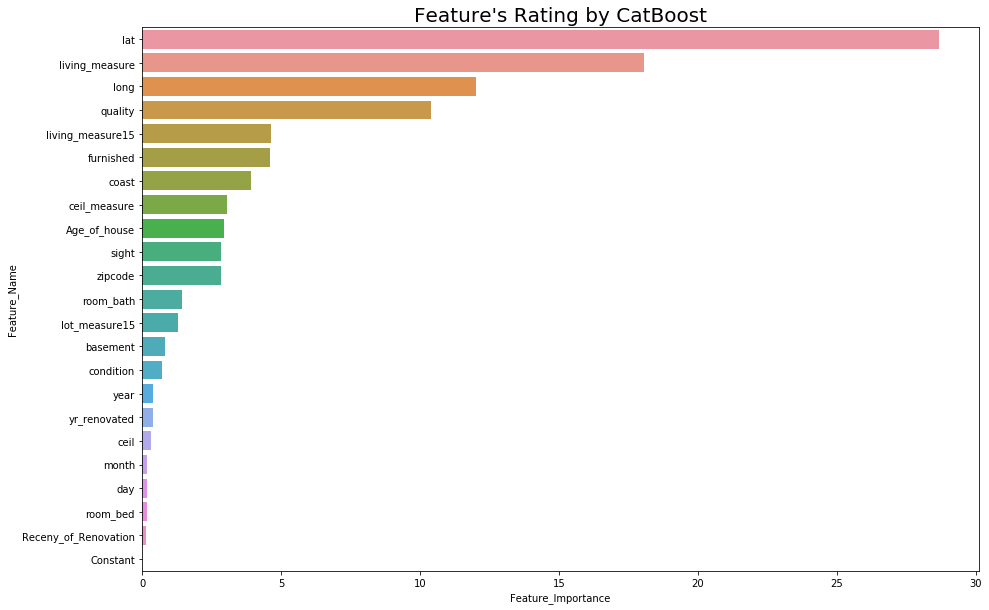

In [238]:
important_features_Catboost = pd.DataFrame(regressor_catboost.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_Catboost.columns = ['Feature_Name','Feature_Importance']
important_features_Catboost = important_features_Catboost.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_Catboost['Feature_Importance'], important_features_Catboost['Feature_Name'])
plt.title('Feature\'s Rating by CatBoost', size = 20)
plt.show()

## Inferences

'lat' is having the highest relevance followed by 'living_measure' and 'long'

## 12. LightGBM

In [239]:
from lightgbm import LGBMRegressor
regressor_LightGBM = LGBMRegressor()

In [240]:
nmse_LightGBM = cross_val_score(regressor_LightGBM, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_LightGBM = np.sqrt(abs(nmse_LightGBM))
rmse_LightGBM

array([129671.81554811, 139265.88764014, 102778.17488274, 118432.41657016,
       110043.69251888, 125196.33627387, 111623.08841532, 111475.84739716,
       101058.990526  , 130987.98793936, 108054.35915594, 115254.15872967,
       111519.71851249, 113239.18982413, 110199.24036879, 153660.72764843,
       117314.07650263, 109566.78571931, 150309.24706857, 140733.262314  ])

In [241]:
r2_score_LightGBM = cross_val_score(regressor_LightGBM, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2_score_LightGBM

array([0.88788524, 0.85962814, 0.90092985, 0.89231878, 0.92548687,
       0.91041024, 0.90155727, 0.90762608, 0.91004031, 0.85490616,
       0.90523069, 0.89477968, 0.89700074, 0.8746819 , 0.88360457,
       0.86551968, 0.89273301, 0.90704892, 0.84995653, 0.89095591])

## Inferences

In [242]:
print ("The LightGBM Regressor model has a mean accuracy of",
       rmse_LightGBM.mean(),'with a standard devition of ',rmse_LightGBM.std())

The LightGBM Regressor model has a mean accuracy of 120519.25017778594 with a standard devition of  14972.250059067637


### Lets Check the Important Features selected by the LightGBM Regressor

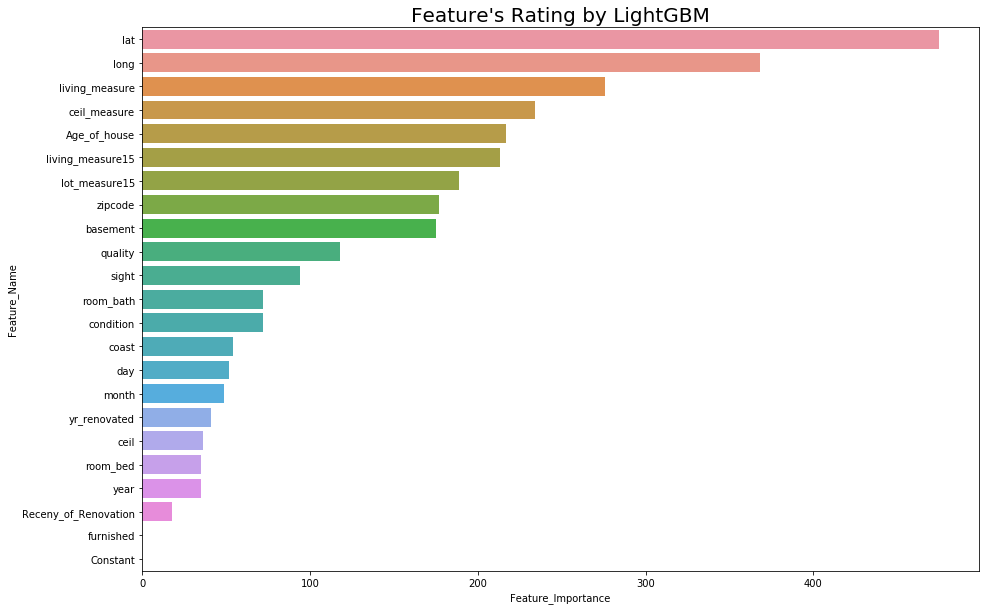

In [243]:
regressor_LightGBM.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_LightGBM = pd.DataFrame(regressor_LightGBM.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_LightGBM.columns = ['Feature_Name','Feature_Importance']
important_features_LightGBM = important_features_LightGBM.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_LightGBM['Feature_Importance'], important_features_LightGBM['Feature_Name'])
plt.title('Feature\'s Rating by LightGBM', size = 20)
plt.show()


## Inference

'lat' is having the highest relevance followed by 'long' and 'living_measure'  

In [244]:
model_accuracies3 = {}

In [245]:
model_accuracies3['Model_Name'] = [' Decision Tree','Random forest','Bagging Regressor','AdaBoost Regressor',
                                 'Gradient Boost Regressor','XGBoost Regressor','CatBoost Regressor','LighGBM Regressor']
model_accuracies3['Accuracies'] = [rmse_Decision.mean(),rmse_forest.mean(), rmse_Bagging.mean(), rmse_Adaboost.mean(),
                                  rmse_Gradient.mean(), rmse_Xgboost.mean(), rmse_catboost.mean(),rmse_LightGBM.mean()]

In [246]:
model_accuracies_ensemble = pd.DataFrame(model_accuracies3)

# Base Model Accuracies Comparison:

## Mean RMSE Comparison:

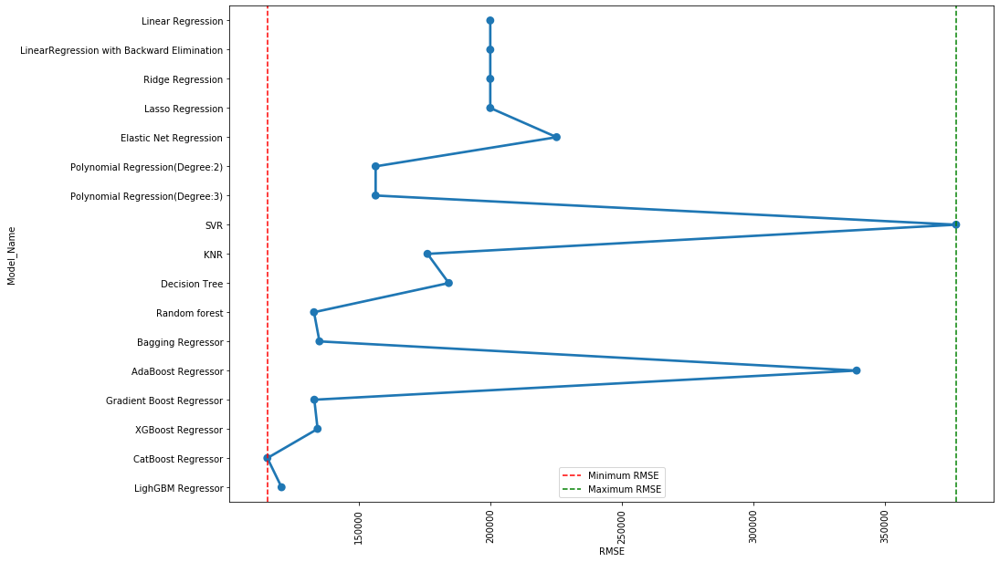

In [249]:
model_accuracies = pd.concat([model_accuracies_simple, model_accuracies_poly, model_accuracies_ensemble],ignore_index= True)
least_rmse = model_accuracies[model_accuracies['Model_Name'] == 'CatBoost Regressor']['Accuracies'].values
max_rmse = model_accuracies[model_accuracies['Model_Name'] == 'SVR']['Accuracies'].values
plt.figure(figsize = (15,10))
sns.pointplot(model_accuracies['Accuracies'],model_accuracies['Model_Name'])
plt.xticks(rotation = 'vertical')
plt.xlabel('RMSE')
plt.axvline(x = least_rmse, ls = '--', color = 'r', label = 'Minimum RMSE')
plt.axvline(x = max_rmse, ls = '--', color = 'green', label = 'Maximum RMSE')
plt.legend()
plt.show()

## Box Plot Comparison of RMSE:

In [250]:
linear = pd.DataFrame(rmse_linear, index = ['Linear Regression']*20)
backward = pd.DataFrame(rmse_backward, index = ['LinearRegression with Backward Elimination']*20)
ridge = pd.DataFrame(rmse_ridge, index = ['Ridge Regression']*20)
Lasso = pd.DataFrame(rmse_lasso, index = ['Lasso Regression']*20)
elastic = pd.DataFrame(rmse_elastic, index = ['Elastic Net Regression']*20)
pol2 = pd.DataFrame(rmse_poly_2, index = ['Polynomial Regression(Degree:2)']*20)
pol3 = pd.DataFrame(rmse_poly_3, index = ['Polynomial Regression(Degree:3)']*20)
SVR = pd.DataFrame(rmse_SVR, index = ['SVR']*20)
KNR = pd.DataFrame(rmse_KNR, index = ['KNR']*20)
Decision = pd.DataFrame(rmse_Decision, index = ['Decision Tree']*20)
forest = pd.DataFrame(rmse_forest, index = ['Random forest']*20)
Bagging = pd.DataFrame(rmse_Bagging, index = ['Bagging Regressor']*20)
adaboost = pd.DataFrame(rmse_Adaboost, index = ['AdaBoost Regressor']*20)
gradient = pd.DataFrame(rmse_Gradient, index = ['Gradient Boost Regressor']*20)
xgboost = pd.DataFrame(rmse_Xgboost, index = ['XGBoost Regressor']*20)
catboost = pd.DataFrame(rmse_catboost, index = ['CatBoost Regressor']*20)
lightgbm = pd.DataFrame(rmse_LightGBM, index = ['LighGBM Regressor']*20)

In [251]:
model_rmse = pd.concat([linear,backward,ridge,Lasso,elastic,pol2,SVR,KNR,Decision,forest,Bagging,adaboost,gradient,
          xgboost,catboost,lightgbm]).reset_index()

In [252]:
model_rmse.columns = ['Model_name','RMSE']

In [253]:
model_rmse.head()

,Model_name,RMSE
0,Linear Regression,217132.580904
1,Linear Regression,191030.405329
2,Linear Regression,183153.665108
3,Linear Regression,190744.371499
4,Linear Regression,211666.954105


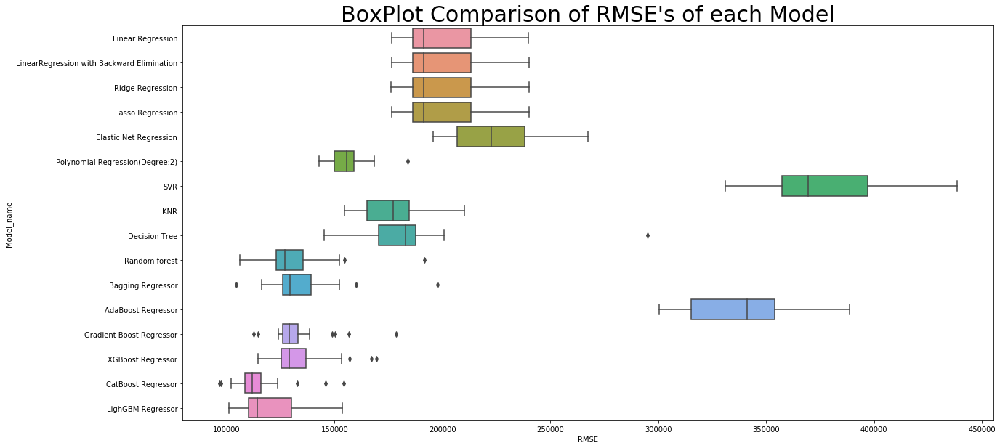

In [254]:
plt.figure(figsize = (20,10))
sns.boxplot(x = model_rmse['RMSE'],y = model_rmse['Model_name'])
plt.xticks()
plt.title('BoxPlot Comparison of RMSE\'s of each Model', size = 30)
plt.show()

## Inference:

We could see that for the base model, catboost is having the least rmse with least variance.

## Box Plot Comparison of R2-Score

In [255]:
linear_r2 = pd.DataFrame(r2_score_linear, index = ['Linear Regression']*20)
backward_r2 = pd.DataFrame(r2_score_backward, index = ['LinearRegression with Backward Elimination']*20)
ridge_r2 = pd.DataFrame(r2_score_Lasso, index = ['Ridge Regression']*20)
Lasso_r2 = pd.DataFrame(r2_score_ridge, index = ['Lasso Regression']*20)
elastic_r2 = pd.DataFrame(r2_score_elastic, index = ['Elastic Net Regression']*20)
pol2_r2 = pd.DataFrame(r2_score_poly_2, index = ['Polynomial Regression(Degree:2)']*20)
pol3_r2 = pd.DataFrame(r2_score_poly_3, index = ['Polynomial Regression(Degree:3)']*20)
SVR_r2 = pd.DataFrame(r2_score_SVR, index = ['SVR']*20)
KNR_r2 = pd.DataFrame(r2_score_KNR, index = ['KNR']*20)
Decision_r2 = pd.DataFrame(r2_score_Decision, index = ['Decision Tree']*20)
forest_r2 = pd.DataFrame(r2_score_forest, index = ['Random forest']*20)
Bagging_r2 = pd.DataFrame(r2_score_Bagging, index = ['Bagging Regressor']*20)
adaboost_r2 = pd.DataFrame(r2_score_Adaboost, index = ['AdaBoost Regressor']*20)
gradient_r2 = pd.DataFrame(r2_score_Gradient, index = ['Gradient Boost Regressor']*20)
xgboost_r2 = pd.DataFrame(r2_score_Xgboost, index = ['XGBoost Regressor']*20)
catboost_r2 = pd.DataFrame(r2_score_catboost, index = ['CatBoost Regressor']*20)
lightgbm_r2 = pd.DataFrame(r2_score_LightGBM, index = ['LighGBM Regressor']*20)

In [256]:
model_r2_score = pd.concat([linear_r2,backward_r2,ridge_r2,Lasso_r2,elastic_r2,pol2_r2,SVR_r2,KNR_r2,
                            Decision_r2,forest_r2,Bagging_r2,adaboost_r2,gradient_r2,
                            xgboost_r2,catboost_r2,lightgbm_r2]).reset_index()

In [257]:
model_r2_score.columns = ['Model_name','R2_score']
model_r2_score.head()

,Model_name,R2_score
0,Linear Regression,0.685644
1,Linear Regression,0.735883
2,Linear Regression,0.685390
3,Linear Regression,0.720680
4,Linear Regression,0.724318


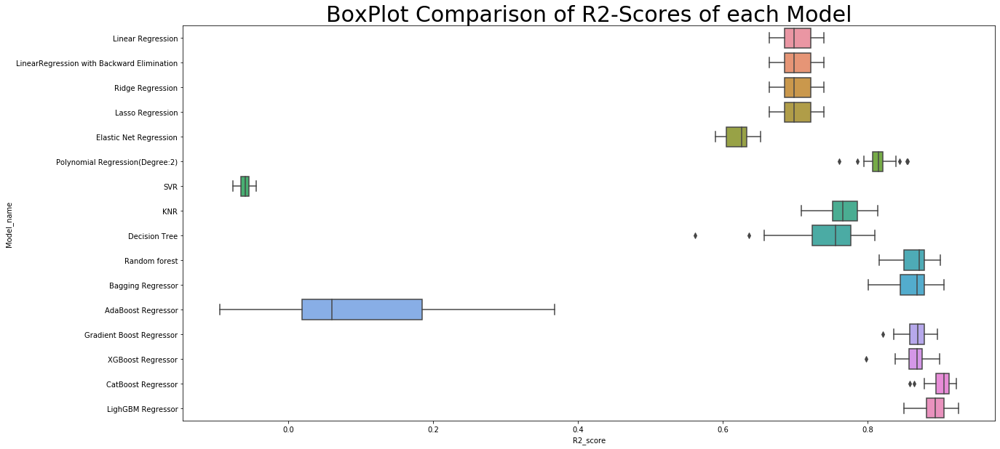

In [258]:
plt.figure(figsize = (20,10))
sns.boxplot(x = model_r2_score['R2_score'],y = model_r2_score['Model_name'])
plt.xticks()
plt.title('BoxPlot Comparison of R2-Scores of each Model', size = 30)
plt.show()

## Inference:

We can see that catboost has the highest r2_score with least variance.

# Models after Transformation

## Linear Regression

In [259]:
x = innercity.drop(['cid','price'], axis = 1)
y = innercity['price']

In [260]:
from sklearn.model_selection import cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score,mean_squared_error

In [261]:
linear_regression = Pipeline([('sc', StandardScaler()),
                     ('lr', LinearRegression()),
])

In [262]:
rsquared_lr = []
rmse_lr = []
for k in range(2,12):
    y_pred = cross_val_predict(linear_regression, X=x, y=y, cv=k)
    rsquared_lr.append(r2_score(y,y_pred))
    rmse_lr.append(np.sqrt(mean_squared_error(np.exp(y),np.exp(y_pred))))
print("Coefficient of Determination after",k-1,"folds:",np.mean(rsquared_lr))
print("Root Mean Squared Error after",k-1,"folds:",np.mean(rmse_lr))

Coefficient of Determination after 10 folds: 0.7758209447857467
Root Mean Squared Error after 10 folds: 181395.67042022324


In [263]:
print ("The Linear Regresion model has a mean rmse of",np.mean(rmse_lr),'with a standard devition of',np.std(rmse_lr))

The Linear Regresion model has a mean rmse of 181395.67042022324 with a standard devition of 90.85084250028802


## Ridge Regression (L2 Regularization)

In [0]:
from sklearn.linear_model import Ridge
regression_ridge = Ridge()

In [0]:
ridge_regression = Pipeline([('sc', StandardScaler()),
                     ('r', Ridge()),
])

In [0]:
rsquared_ridge = []
rmse_ridge = []
for k in range(2,12):
    y_pred_ridge = cross_val_predict(ridge_regression, X=x, y=y, cv=k)
    rsquared_ridge.append(r2_score(y,y_pred_ridge))
    rmse_ridge.append(np.sqrt(mean_squared_error(np.exp(y),np.exp(y_pred_ridge))))
print("Coefficient of Determination after",k-1,"folds:",np.mean(rsquared_ridge))
print("Root Mean Squared Error after",k-1,"folds:",np.mean(rmse_ridge))

Coefficient of Determination after 10 folds: 0.7758212004744889
Root Mean Squared Error after 10 folds: 181396.4749642408


## Inferences

In [0]:
print ("The Linear Regresion model after L2 Regulariztion has a mean rmse of",
       np.mean(rmse_ridge),'with a standard devition of ',np.std(rmse_ridge))

The Linear Regresion model after L2 Regulariztion has a mean rmse of 181396.4749642408 with a standard devition of  90.61072707210947


### Lets see co - efficients that we got in Ridge Regression

In [0]:
regression_ridge.fit(x,y)

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [0]:
predictors_ridge = x.columns

In [0]:
coef_ridge = pd.Series(regression_ridge.coef_,predictors_ridge).sort_values()

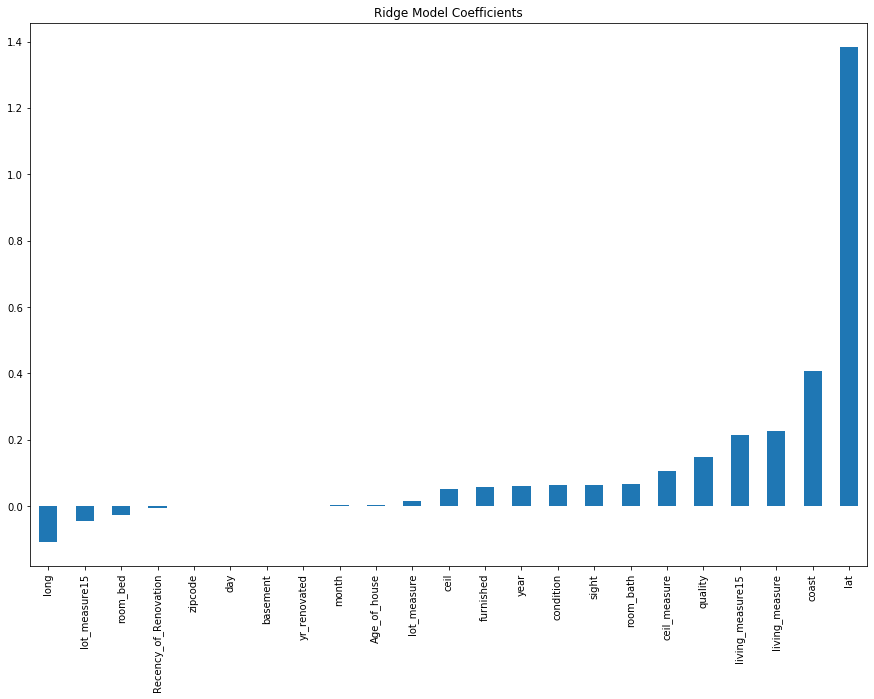

In [0]:
plt.figure(figsize = (15,10))
coef_ridge.plot(kind='bar', title='Ridge Model Coefficients')
plt.show()

## Lasso Regression ( L1 Regularization )

In [0]:
from sklearn.linear_model import Lasso
regressor_lasso = Lasso()

In [0]:
lasso_regression = Pipeline([('sc', StandardScaler()),
                     ('l', Lasso(alpha=0.01)),
])

In [0]:
rsquared_lasso = []
rmse_lasso = []
for k in range(2,12):
    y_pred_lasso = cross_val_predict(lasso_regression, X=x, y=y, cv=k)
    rsquared_lasso.append(r2_score(y,y_pred_lasso))
    rmse_lasso.append(np.sqrt(mean_squared_error(np.exp(y),np.exp(y_pred_lasso))))
print("Coefficient of Determination after",k-1,"folds:",np.mean(rsquared_lasso))
print("Root Mean Squared Error after",k-1,"folds:",np.mean(rmse_lasso))

Coefficient of Determination after 10 folds: 0.7681147938053096
Root Mean Squared Error after 10 folds: 191472.58035872196


## Inferences:

In [0]:
print ("The Linear Regresion model after L1 Regulariztion has a mean rmse of",
       np.mean(rmse_lasso),'with a standard devition of ',np.std(rmse_lasso))

The Linear Regresion model after L1 Regulariztion has a mean rmse of 191472.58035872196 with a standard devition of  64.36418256440697


### Lets see co - efficients that we got in Lasso Regression

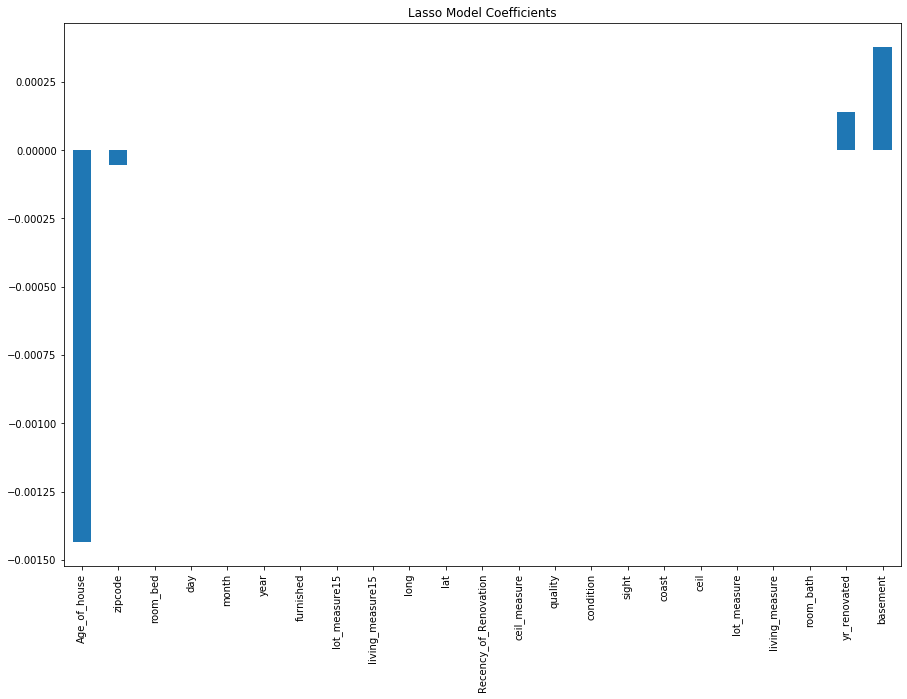

In [0]:
regressor_lasso.fit(x,y)
predictors_lasso = x.columns
coef_lasso = pd.Series(regressor_lasso.coef_,predictors_lasso).sort_values()
plt.figure(figsize = (15,10))
coef_lasso.plot(kind='bar', title='Lasso Model Coefficients')
plt.show()

## Elastic Net

In [0]:
from sklearn.linear_model import ElasticNet
regressor_elastic = ElasticNet()

In [0]:
elastic_regression = Pipeline([('sc', StandardScaler()),
                     ('e', ElasticNet(alpha=0.01)),
])

In [0]:
rsquared_elastic = []
rmse_elastic = []
for k in range(2,12):
    y_pred_elastic = cross_val_predict(elastic_regression, X=x, y=y, cv=k)
    rsquared_elastic.append(r2_score(y,y_pred_elastic))
    rmse_elastic.append(np.sqrt(mean_squared_error(np.exp(y),np.exp(y_pred_elastic))))
print("Coefficient of Determination after",k-1,"folds:",np.mean(rsquared_elastic))
print("Root Mean Squared Error after",k-1,"folds:",np.mean(rmse_elastic))

Coefficient of Determination after 10 folds: 0.7727410368944789
Root Mean Squared Error after 10 folds: 186513.55333365116


## Inferences:

In [0]:
print ("The Elastic Model has a mean accuracy of",
       np.mean(rmse_elastic),'with a standard devition of ',np.std(rmse_elastic))

The Elastic Model has a mean accuracy of 186513.55333365116 with a standard devition of  72.75521904989509


### Lets see co - efficients that we got in Elastic Regression

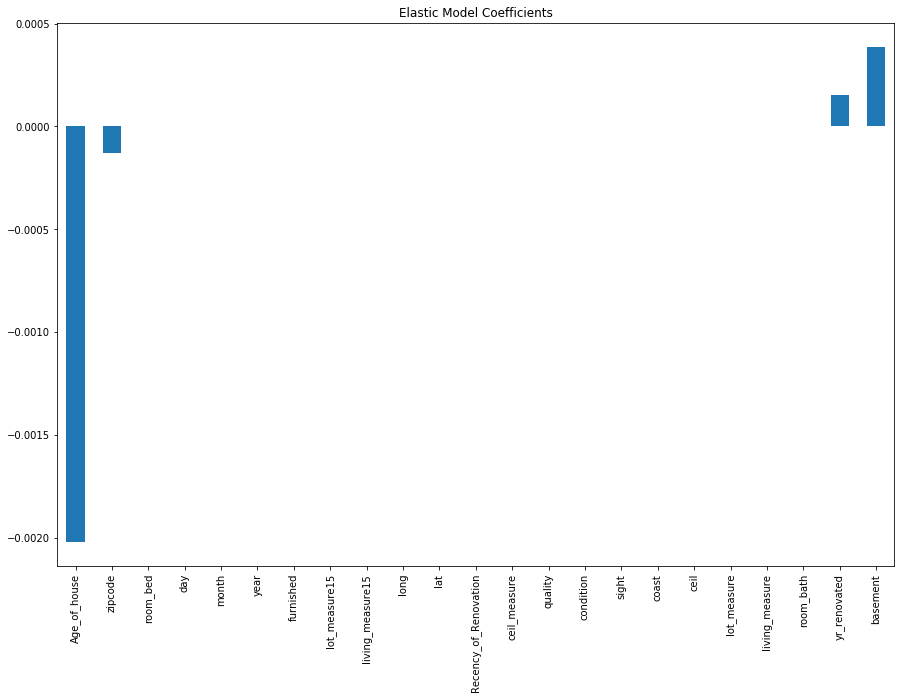

In [0]:
regressor_elastic.fit(x,y)
predictors_elastic = x.columns
coef_elastic = pd.Series(regressor_elastic.coef_,predictors_elastic).sort_values()
plt.figure(figsize = (15,10))
coef_elastic.plot(kind='bar', title='Elastic Model Coefficients')
plt.show()

## Polynomial Regression with Degree 2

In [0]:
from sklearn.preprocessing import PolynomialFeatures 

In [0]:
linear_regression_poly_2 = Pipeline([('sc', StandardScaler()),
                         ('poly', PolynomialFeatures(degree=2)),
                         ('lr', LinearRegression()),
])

In [0]:
rsquared_poly_2 = []
rmse_poly_2 = []
for k in range(2,12):
    y_pred_poly_2 = cross_val_predict(linear_regression_poly_2, X=x, y=y, cv=k)
    rsquared_poly_2.append(r2_score(y,y_pred_poly_2))
    rmse_poly_2.append(np.sqrt(mean_squared_error(np.exp(y),np.exp(y_pred_poly_2))))
print("Coefficient of Determination after",k-1,"folds:",np.mean(rsquared_poly_2))
print("Root Mean Squared Error after",k-1,"folds:",np.mean(rmse_poly_2))

Coefficient of Determination after 10 folds: 0.8312633412446905
Root Mean Squared Error after 10 folds: 152956.81345736285


## Inferences

In [0]:
print ("The Polynomial Regresion model  with degree 2 has a mean rmse of",
       np.mean(rmse_poly_2),'with a standard devition of ',np.std(rmse_poly_2))

The Polynomial Regresion model  with degree 2 has a mean rmse of 152956.81345736285 with a standard devition of  1760.5010140995212


## SVR

In [0]:
from sklearn.svm import SVR

In [0]:
support_vector_regression = Pipeline([('sc', StandardScaler()),
                     ('svr', SVR(kernel='rbf',degree=2)),
])

In [0]:
rsquared_svr = []
rmse_svr = []
for k in range(2,12):
    y_pred_svr = cross_val_predict(support_vector_regression, X=x, y=y, cv=k)
    rsquared_svr.append(r2_score(y,y_pred_svr))
    rmse_svr.append(np.sqrt(mean_squared_error(np.exp(y),np.exp(y_pred_svr))))
print("Coefficient of Determination after",k-1,"folds:",np.mean(rsquared_svr))
print("Root Mean Squared Error after",k-1,"folds:",np.mean(rmse_svr))

Coefficient of Determination after 10 folds: 0.863941423116511
Root Mean Squared Error after 10 folds: 165580.85697040215


### Inferences

In [0]:
print ("The Support Vector Regressor model has a mean accuracy of",
       np.mean(rmse_svr),'with a standard devition of ',np.std(rmse_svr))

The Support Vector Regressor model has a mean accuracy of 165580.85697040215 with a standard devition of  2035.261665647704


# Hyper Parameter Tuning:

## 1. KNR

In [0]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
regressor_KNR_Tune = KNeighborsRegressor()
sc = StandardScaler()

In [0]:
x_scaled = sc.fit_transform(data_refined.drop('price', axis = 1))

In [0]:
param_grid_KNR = {'n_neighbors':[5,6,7,8,9,10],
          'leaf_size':[1,2,3,5],
          'weights':['uniform', 'distance'],
          'algorithm':['auto', 'ball_tree','kd_tree','brute'],
          }

In [0]:
grid_KNR = GridSearchCV(regressor_KNR_Tune, param_grid_KNR)
grid_KNR.fit(x_scaled, data_refined['price'])

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [1, 2, 3, 5],
                         'n_neighbors': [5, 6, 7, 8, 9, 10],
                         'weights': ['uniform', 'distance']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [0]:
grid_KNR.best_params_

{'algorithm': 'auto', 'leaf_size': 1, 'n_neighbors': 7, 'weights': 'distance'}

We got the following as the parameters from gird search:

{'algorithm': 'ball_tree',
 'leaf_size': 2,
 'n_neighbors': 10,
 'weights': 'distance'}

In [0]:
regressor_KNR_Tune = KNeighborsRegressor(algorithm = 'ball_tree',
                                         leaf_size =  2,
                                         n_neighbors = 10,
                                         weights = 'distance')

In [0]:
nmse_grid_KNR = cross_val_score(regressor_KNR_Tune, x_scaled, data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_grid_KNR = np.sqrt(abs(nmse_grid_KNR))
rmse_grid_KNR

array([196630.73135426, 162798.19235782, 151163.98945585, 165176.74826163,
       179860.85566292, 189308.64270499, 180322.91718452, 154980.87436698,
       150622.86210901, 171610.29700221, 161108.93279566, 167060.83814969,
       165992.30670374, 150072.81416896, 149665.24741523, 201642.68527438,
       178103.53453311, 186617.24380545, 182537.04723517, 204309.12787023])

In [0]:
r2_score_grid_KNR = cross_val_score(regressor_KNR_Tune, x_scaled, data_refined['price'],
                           cv = 20)
r2_score_grid_KNR

array([0.74220505, 0.80818184, 0.78569233, 0.79054217, 0.80094376,
       0.7951594 , 0.74309212, 0.82145651, 0.80016118, 0.75095792,
       0.78932046, 0.778927  , 0.77180469, 0.77989782, 0.78530563,
       0.76842168, 0.75276445, 0.73035019, 0.77871716, 0.77018193])

## 2. Decision Tree:

In [0]:
from sklearn.tree import DecisionTreeRegressor
regressor_Decision_Tune = DecisionTreeRegressor()

In [0]:
param_grid_Decision = {"min_samples_split": [10, 20, 40],
              "max_depth": [2, 6, 8],
              "min_samples_leaf": [20, 40, 100],
              "max_leaf_nodes": [5, 20, 100],
              }

In [0]:
grid_decision = GridSearchCV(regressor_Decision, param_grid=param_grid_Decision)

In [0]:
grid_decision.fit(data_refined.drop('price',axis=1),data_refined.price)

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=DecisionTreeRegressor(criterion='mse', max_depth=None,
                                             max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort=False, random_state=None,
                                             splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'max_depth': [2, 6, 8], 'max_leaf_nodes': [5, 20, 100],
                         'min_samples_leaf': [20, 40, 100],
                         'min_samples_split': [10, 20, 40]},
     

In [0]:
grid_decision.best_params_

{'max_depth': 8,
 'max_leaf_nodes': 100,
 'min_samples_leaf': 20,
 'min_samples_split': 10}

# We got the best parameter as :
{'max_depth': 8,
 'max_leaf_nodes': 100,
 'min_samples_leaf': 20,
 'min_samples_split': 10}

In [0]:
regressor_Decision_Tune = DecisionTreeRegressor(max_depth = 8,
                                                max_leaf_nodes = 100,
                                                min_samples_leaf = 20,
                                                min_samples_split = 10)

In [0]:
nmse_grid_decision = cross_val_score(regressor_Decision_Tune, data_refined.drop('price', axis = 1), data_refined['price'], 
                                     scoring='neg_mean_squared_error', cv=20)
rmse_grid_decision = np.sqrt(abs(nmse_grid_decision))
rmse_grid_decision

array([179511.59467532, 204814.80686888, 155714.73967705, 168297.64179005,
       185219.80883401, 198334.78989553, 186515.91471483, 162168.38267021,
       161272.86936384, 170834.32354809, 161327.46142897, 172020.54363459,
       164444.00929187, 169035.79697761, 178251.15108444, 200054.67349927,
       177220.49383923, 182371.91742425, 176176.9220189 , 218219.03263923])

In [0]:
r2_score_grid_decision = cross_val_score(regressor_Decision_Tune, data_refined.drop('price', axis = 1), data_refined['price']
                                         , cv=20)
r2_score_grid_decision

array([0.78513948, 0.69639196, 0.77259475, 0.78255229, 0.7889053 ,
       0.77516032, 0.72514264, 0.80451197, 0.77090232, 0.75320503,
       0.78874854, 0.76560571, 0.77604183, 0.72075998, 0.69546065,
       0.77205485, 0.75520997, 0.74247909, 0.7938688 , 0.73782343])

### Lets Check the Important Features selected by the Decision Tree

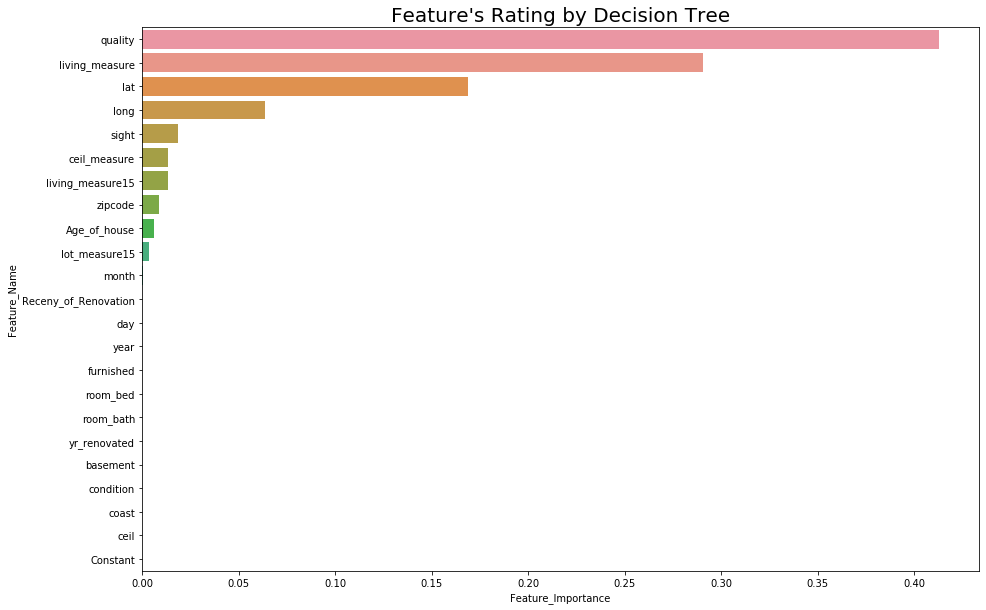

In [0]:
regressor_Decision_Tune.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_decision = pd.DataFrame(regressor_Decision_Tune.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_decision.columns = ['Feature_Name','Feature_Importance']
important_features_decision = important_features_decision.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_decision['Feature_Importance'], important_features_decision['Feature_Name'])
plt.title('Feature\'s Rating by Decision Tree', size = 20)
plt.show()

## Inference:

After tuning, the decision tree has reduced the importance of many features to zero. For eg: Before Tuning 'Coast' was having some feature importance but after tuning it's importance has been reduced to zero.

## 3. Random Forest:

In [0]:
# Parameter assigned after grid search:
from sklearn.ensemble import RandomForestRegressor
regressor_forest_Tune = RandomForestRegressor(max_depth=30, max_features='auto', min_samples_leaf=1, min_samples_split=2, n_estimators=300)

Best params
'max_depth': 30, 
'max_features': 'auto', 
'min_samples_leaf': 1, 
'min_samples_split': 2, 
'n_estimators': 300

In [0]:
nmse_forest_tune = cross_val_score(regressor_forest_Tune, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_forest_tune = np.sqrt(abs(nmse_forest_tune))
rmse_forest_tune

array([115455.75886791, 152131.8173721 ,  99369.58815736, 116648.99505401,
       118166.39070055, 152875.81661046, 116380.73526122, 121339.34961215,
       111409.23531305, 123648.74515062, 114708.83916461, 112725.92944086,
       122695.76888943, 116127.9053144 , 119184.36940788, 138527.72629382,
       125800.60709869, 128281.76136705, 135388.47109766, 177186.59898093])

In [0]:
r2_score_forest_tune = cross_val_score(regressor_forest_Tune, data_refined.drop('price', axis=1), data_refined['price'], cv=20)
r2_score_forest_tune

array([0.91033375, 0.83007048, 0.90494366, 0.89237528, 0.9118383 ,
       0.86849724, 0.89236169, 0.89102582, 0.89496584, 0.86821402,
       0.89360427, 0.89852125, 0.87484355, 0.86728958, 0.86310791,
       0.88814899, 0.87796376, 0.87036372, 0.88290605, 0.83458326])

### Lets Check the Important Features selected by the Random Forest After Tuning:

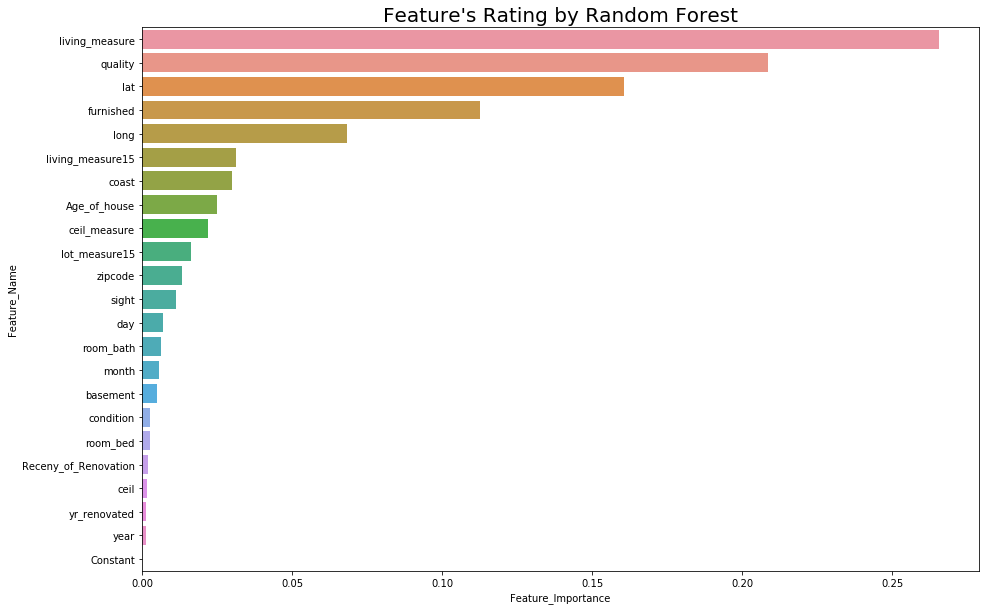

In [0]:
regressor_forest_Tune.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_forest = pd.DataFrame(regressor_forest_Tune.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_forest.columns = ['Feature_Name','Feature_Importance']
important_features_forest = important_features_forest.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_forest['Feature_Importance'], important_features_forest['Feature_Name'])
plt.title('Feature\'s Rating by Random Forest', size = 20)
plt.show()

## Inferences:

Earlier  Random Forest has Chosen 'quality' as the top most important feature , but after tuning 'living_measure' has become the top most feature

## 4. Gradient Boosting Regressor:

In [0]:
from sklearn.ensemble import GradientBoostingRegressor
regressor_Gradient_tune = GradientBoostingRegressor()

In [0]:
param_grid_Gradient ={'n_estimators':[100], 'learning_rate': [0.1, 0.05, 0.02, 0.01,0.5,1], 
                      'max_depth':[6,4,8],'min_samples_leaf':[3,5,9,17], 
                      'max_features':[1.0,0.3,0.5] } 

In [0]:
grid_gradient = GridSearchCV(regressor_Gradient_tune, param_grid_Gradient)

In [0]:
grid_gradient.fit(data_refined.drop('price',axis=1),data_refined.price)

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=GradientBoostingRegressor(alpha=0.9,
                                                 criterion='friedman_mse',
                                                 init=None, learning_rate=0.1,
                                                 loss='ls', max_depth=3,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100,
                                                 n...
                             

In [0]:
grid_gradient.best_params_

{'learning_rate': 0.1,
 'max_depth': 6,
 'max_features': 0.5,
 'min_samples_leaf': 3,
 'n_estimators': 100}

In [0]:
regressor_Gradient_tune = GradientBoostingRegressor(learning_rate = 0.1,
                                                    max_depth = 6,
                                                    max_features = 0.5,
                                                    min_samples_leaf = 3,
                                                    n_estimators = 100)

In [0]:
nmse_Gradient_Tune = cross_val_score(regressor_Gradient_tune, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_Gradient_Tune = np.sqrt(abs(nmse_Gradient_Tune))
rmse_Gradient_Tune

array([107269.05289856, 133534.15828294, 103654.39352226, 121104.70436567,
       112829.92533065, 149987.52347697, 111890.79177052, 111847.82365985,
       103063.84118299, 119025.01495659, 114148.65253981, 107514.91379339,
       114202.73826586, 109527.90712952, 111364.78487387, 130251.38001606,
       112349.03064379, 112171.32548731, 123579.67343015, 163927.9988114 ])

In [0]:
r2_score_Gradient_Tune = cross_val_score(regressor_Gradient_tune, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)

In [0]:
r2_score_Gradient_Tune

array([0.92336796, 0.85063904, 0.90940541, 0.90342696, 0.91651329,
       0.89504704, 0.90439372, 0.90739149, 0.90550798, 0.85376703,
       0.89905156, 0.91044303, 0.89969854, 0.87547439, 0.87626554,
       0.89746663, 0.89813671, 0.90274982, 0.88290776, 0.86881358])

### Lets Check the Important Features selected by the Gradeint Boosint Regressor after Tuning:

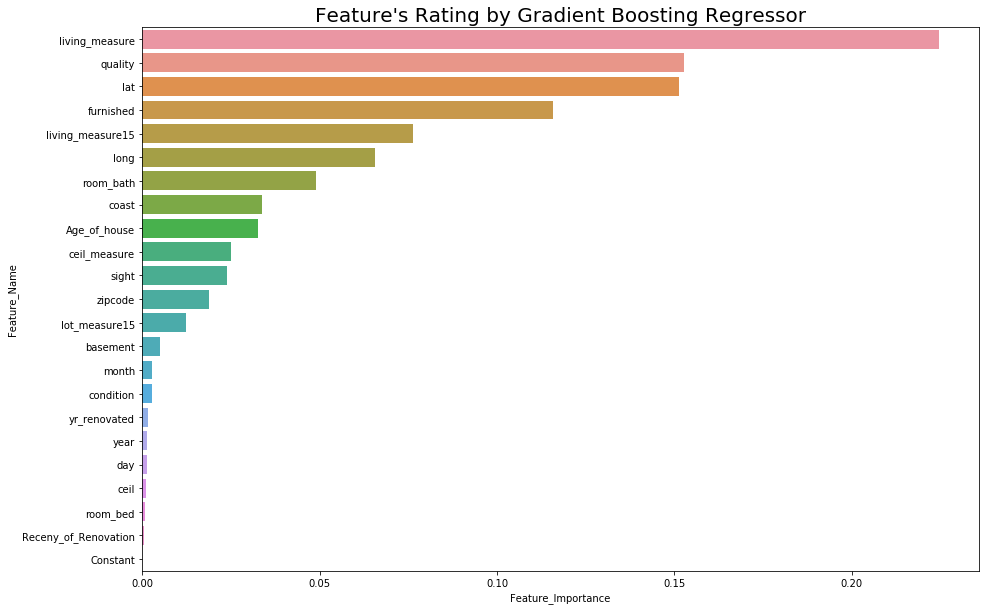

In [0]:
regressor_Gradient_tune.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_gradient = pd.DataFrame(regressor_Gradient_tune.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_gradient.columns = ['Feature_Name','Feature_Importance']
important_features_gradient = important_features_gradient.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_gradient['Feature_Importance'], important_features_gradient['Feature_Name'])
plt.title('Feature\'s Rating by Gradient Boosting Regressor', size = 20)
plt.show()

## 5. XGBoost

In [0]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score,mean_squared_error

In [0]:
params = {'min_child_weight':[4,5], 'gamma':[i/10.0 for i in range(3,6)],  'subsample':[i/10.0 for i in range(6,11)],
'colsample_bytree':[i/10.0 for i in range(6,11)], 'max_depth': [2,3,4]}

In [0]:
regressor_Xgboost_Tune = XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0.3,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=4, min_child_weight=5, missing=None, n_estimators=1000,
             n_jobs=1, nthread=-1, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1.0, verbosity=1)

In [0]:
nmse_Xgboost_Tune = cross_val_score(regressor_Xgboost_Tune, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                            cv = 20)
# While doing the scoring in cross val we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_Xgboost_Tune = np.sqrt(abs(nmse_Xgboost_Tune))
rmse_Xgboost_Tune

[11:16:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:16:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:16:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:17:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:17:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:17:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:18:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:18:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

array([105805.03106044, 130309.19669971,  95795.41351658, 108903.69352114,
       114030.88985691, 140108.54004477, 110025.32284838, 108919.95079762,
        97615.9509702 , 123703.21842224, 108193.51703603, 100060.0201019 ,
       113039.12561767, 109035.37772586, 108630.35920007, 132474.09254279,
       111052.89261628, 112958.41827716, 120844.55417098, 130634.85842528])

In [0]:
r2score_Xgboost_Tune = cross_val_score(regressor_Xgboost_Tune, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2score_Xgboost_Tune

[11:21:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:21:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:22:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:22:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:22:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:23:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:23:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:23:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

array([0.92535783, 0.87710316, 0.91393423, 0.90894915, 0.9199894 ,
       0.88779703, 0.90435531, 0.91181339, 0.91606567, 0.8705959 ,
       0.90498644, 0.92069372, 0.89417498, 0.88381364, 0.88689517,
       0.90004723, 0.90387738, 0.90120527, 0.90301605, 0.90604351])

### Lets Check the Important Features selected by the XGBoost Regressor after tuning:

[11:27:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


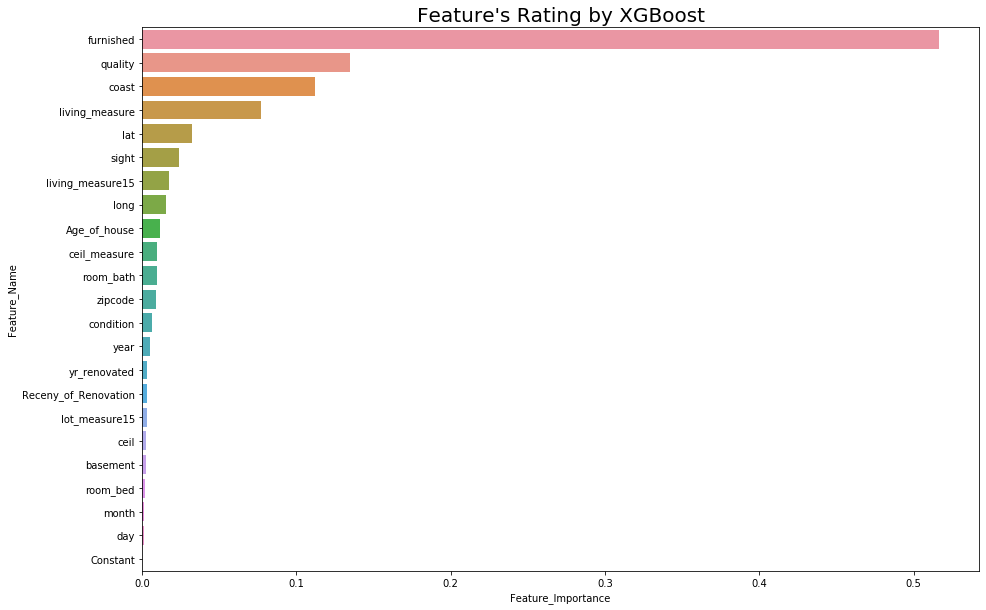

In [0]:
regressor_Xgboost_Tune.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_XGBoost = pd.DataFrame(regressor_Xgboost_Tune.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_XGBoost.columns = ['Feature_Name','Feature_Importance']
important_features_XGBoost = important_features_XGBoost.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_XGBoost['Feature_Importance'], important_features_XGBoost['Feature_Name'])
plt.title('Feature\'s Rating by XGBoost', size = 20)
plt.show()

## 6. CatBoost

In [0]:
from catboost import CatBoostRegressor
regressor_catboost_Tune = CatBoostRegressor()

In [0]:
parameters = {'depth': [6,8],
              'learning_rate':[0.11, 0.4,0.5],
              'iterations':[1000,1100],
#               'subsample':[10,30],
              'random_strength':[20,30]
              }

In [0]:
from sklearn.model_selection import GridSearchCV
grid_cat = GridSearchCV(regressor_catboost,parameters)

In [0]:
grid_cat.fit(data_refined.drop('price',axis=1),data_refined.price)

0:	learn: 342645.5082242	total: 11.2ms	remaining: 11.2s
1:	learn: 328125.4025347	total: 18.4ms	remaining: 9.16s
2:	learn: 314732.7774325	total: 24.9ms	remaining: 8.28s
3:	learn: 303060.3681111	total: 30.8ms	remaining: 7.66s
4:	learn: 292373.3522054	total: 36.7ms	remaining: 7.3s
5:	learn: 282154.8063761	total: 42.9ms	remaining: 7.11s
6:	learn: 273965.0780140	total: 49ms	remaining: 6.96s
7:	learn: 264855.3377584	total: 55.1ms	remaining: 6.84s
8:	learn: 255043.8579098	total: 61.2ms	remaining: 6.73s
9:	learn: 248060.9114479	total: 67.3ms	remaining: 6.66s
10:	learn: 243290.4130160	total: 73.5ms	remaining: 6.61s
11:	learn: 237733.6108249	total: 80.6ms	remaining: 6.63s
12:	learn: 233977.3724521	total: 86.7ms	remaining: 6.58s
13:	learn: 230097.4090188	total: 93ms	remaining: 6.55s
14:	learn: 223297.8941207	total: 98.9ms	remaining: 6.5s
15:	learn: 217883.3917418	total: 105ms	remaining: 6.45s
16:	learn: 213042.5050204	total: 111ms	remaining: 6.44s
17:	learn: 209528.7922013	total: 118ms	remaining:

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=<catboost.core.CatBoostRegressor object at 0x7fbc467770f0>,
             iid='warn', n_jobs=None,
             param_grid={'depth': [6, 8], 'iterations': [1000, 1100],
                         'learning_rate': [0.11, 0.4, 0.5],
                         'random_strength': [20, 30]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [0]:
grid_cat.best_params_
# {'depth': 6, 'iterations': 1000, 'learning_rate': 0.11}: 110634.67680780936
# {'depth': 6, 'iterations': 1100, 'learning_rate': 0.11, 'random_strength': 20}: 109731.15509707699


{'depth': 6, 'iterations': 1100, 'learning_rate': 0.11, 'random_strength': 20}

In [0]:
regressor_catboost_Tune = CatBoostRegressor(depth=6,iterations=1100,learning_rate=0.11, random_strength = 20)

In [0]:
nmse_catboost_Tune = cross_val_score(regressor_catboost_Tune, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)

0:	learn: 346220.9125735	total: 9.44ms	remaining: 10.4s
1:	learn: 331294.2682318	total: 17.5ms	remaining: 9.6s
2:	learn: 318019.8084086	total: 25.6ms	remaining: 9.36s
3:	learn: 305905.0561573	total: 32.9ms	remaining: 9.02s
4:	learn: 295047.7691587	total: 40.3ms	remaining: 8.83s
5:	learn: 283836.2342707	total: 48.3ms	remaining: 8.8s
6:	learn: 275347.1521475	total: 56.1ms	remaining: 8.77s
7:	learn: 266239.4079807	total: 64.1ms	remaining: 8.74s
8:	learn: 256441.6039211	total: 72.1ms	remaining: 8.74s
9:	learn: 249440.1386062	total: 79.7ms	remaining: 8.68s
10:	learn: 240902.8499449	total: 87.5ms	remaining: 8.67s
11:	learn: 233931.9674506	total: 95.5ms	remaining: 8.66s
12:	learn: 229194.3442184	total: 103ms	remaining: 8.61s
13:	learn: 225334.8880138	total: 110ms	remaining: 8.56s
14:	learn: 218923.3741719	total: 118ms	remaining: 8.55s
15:	learn: 213717.9597818	total: 126ms	remaining: 8.54s
16:	learn: 208993.1539443	total: 134ms	remaining: 8.52s
17:	learn: 205237.6280390	total: 142ms	remaining

In [0]:
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_catboost_Tune = np.sqrt(abs(nmse_catboost_Tune))
rmse_catboost_Tune

array([116556.48126416, 109086.37405634,  96019.2117128 , 110348.95689312,
       107903.35899303, 127580.83264872,  98702.02107319, 102733.7548246 ,
        91759.67611891, 118936.31114151, 105189.82551966,  99928.14115798,
       106674.63674855, 103569.80027766, 109528.70912861, 152266.90554008,
       106881.54288864, 109089.51572005, 131711.552112  , 124217.0299752 ])

In [0]:
r2_score_catboost_Tune = cross_val_score(regressor_catboost_Tune, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)

0:	learn: 346220.9125735	total: 7.53ms	remaining: 8.28s
1:	learn: 331294.2682318	total: 14.7ms	remaining: 8.09s
2:	learn: 318019.8084086	total: 21.8ms	remaining: 7.99s
3:	learn: 305905.0561573	total: 28.4ms	remaining: 7.78s
4:	learn: 295047.7691587	total: 35.5ms	remaining: 7.77s
5:	learn: 283836.2342707	total: 42.8ms	remaining: 7.8s
6:	learn: 275347.1521475	total: 49.9ms	remaining: 7.8s
7:	learn: 266239.4079807	total: 57.6ms	remaining: 7.86s
8:	learn: 256441.6039211	total: 65ms	remaining: 7.88s
9:	learn: 249440.1386062	total: 72.3ms	remaining: 7.88s
10:	learn: 240902.8499449	total: 79.5ms	remaining: 7.87s
11:	learn: 233931.9674506	total: 86.6ms	remaining: 7.85s
12:	learn: 229194.3442184	total: 93.7ms	remaining: 7.83s
13:	learn: 225334.8880138	total: 101ms	remaining: 7.81s
14:	learn: 218923.3741719	total: 108ms	remaining: 7.78s
15:	learn: 213717.9597818	total: 114ms	remaining: 7.75s
16:	learn: 208993.1539443	total: 122ms	remaining: 7.75s
17:	learn: 205237.6280390	total: 129ms	remaining:

In [0]:
r2_score_catboost_Tune

array([0.90941747, 0.91387454, 0.91353162, 0.90651644, 0.92835722,
       0.90696507, 0.9230289 , 0.92154618, 0.92583452, 0.88037692,
       0.91018878, 0.92090264, 0.90575612, 0.89516976, 0.88501673,
       0.8679483 , 0.91096285, 0.90785695, 0.88478914, 0.91504853])

### Lets Check the Important Features selected by the CatBoost Regressor after tuning:

In [0]:
regressor_catboost_Tune.fit(data_refined.drop('price', axis = 1), data_refined['price'])

0:	learn: 347331.9563683	total: 8.2ms	remaining: 9.02s
1:	learn: 332477.3344639	total: 15.5ms	remaining: 8.49s
2:	learn: 319200.1201272	total: 22.8ms	remaining: 8.34s
3:	learn: 307000.0195192	total: 29.4ms	remaining: 8.06s
4:	learn: 296106.2412782	total: 36.6ms	remaining: 8.02s
5:	learn: 285302.3993149	total: 47ms	remaining: 8.57s
6:	learn: 276852.0145928	total: 54.3ms	remaining: 8.48s
7:	learn: 266218.0122216	total: 61.2ms	remaining: 8.36s
8:	learn: 256250.4183784	total: 68.5ms	remaining: 8.3s
9:	learn: 248361.0902687	total: 75.7ms	remaining: 8.25s
10:	learn: 239900.8850125	total: 83.1ms	remaining: 8.22s
11:	learn: 232945.1053999	total: 90.3ms	remaining: 8.19s
12:	learn: 228399.4657500	total: 97ms	remaining: 8.11s
13:	learn: 224532.2322767	total: 104ms	remaining: 8.06s
14:	learn: 218381.3180435	total: 112ms	remaining: 8.1s
15:	learn: 213357.2051353	total: 119ms	remaining: 8.07s
16:	learn: 208906.1817053	total: 126ms	remaining: 8.04s
17:	learn: 205230.5821492	total: 133ms	remaining: 8.

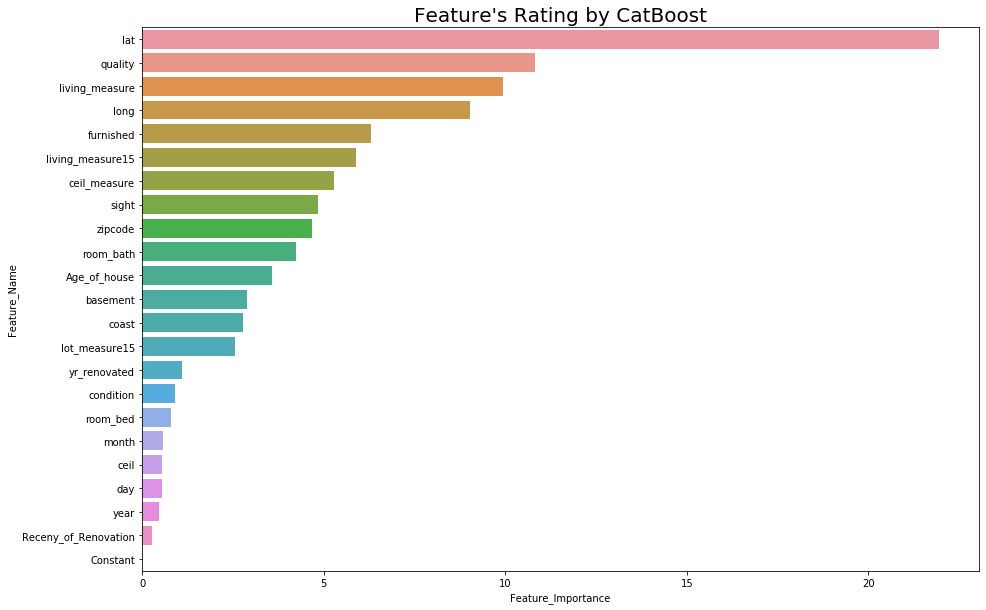

In [0]:
important_features_Catboost = pd.DataFrame(regressor_catboost_Tune.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_Catboost.columns = ['Feature_Name','Feature_Importance']
important_features_Catboost = important_features_Catboost.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_Catboost['Feature_Importance'], important_features_Catboost['Feature_Name'])
plt.title('Feature\'s Rating by CatBoost', size = 20)
plt.show()

## Inference:

'quality' has gained more importance after tuning.

## 7. Bagging Regressor:

In [0]:
from sklearn.ensemble import BaggingRegressor
regressor_Bagging_Tune = BaggingRegressor()

In [0]:
param_Bagging = { "n_estimators":[200,400],
         "max_samples":[100,300],
          "max_features":[20,22],
         'bootstrap_features':[True, False],
          'oob_score':[True, False]
        }

In [0]:
grid_Bagging = GridSearchCV(regressor_Bagging_Tune,param_Bagging)

In [0]:
grid_Bagging.fit(data_refined.drop('price',axis =1), data_refined['price'])

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=BaggingRegressor(base_estimator=None, bootstrap=True,
                                        bootstrap_features=False,
                                        max_features=1.0, max_samples=1.0,
                                        n_estimators=10, n_jobs=None,
                                        oob_score=False, random_state=None,
                                        verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'bootstrap_features': [True, False],
                         'max_features': [20, 22], 'max_samples': [100, 300],
                         'n_estimators': [200, 400],
                         'oob_score': [True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

grid_Bagging.best_params_
{'bootstrap_features': False,
 'max_features': 22,
 'max_samples': 300,
 'n_estimators': 400,
 'oob_score': False}

In [0]:
regressor_Bagging_Tune = BaggingRegressor(bootstrap_features = False,
                                     max_features = 22,
                                     max_samples = 300,
                                     n_estimators = 400,
                                     oob_score = False)

In [0]:
nmse_Bagging_Tune = cross_val_score(regressor_Bagging_Tune, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_Bagging_Tune = np.sqrt(abs(nmse_Bagging_Tune))
rmse_Bagging_Tune

array([199854.23380881, 178272.64914548, 148678.53076042, 160810.93069629,
       197327.16963789, 212111.9337413 , 169882.11960964, 166896.87044453,
       144468.1767413 , 154876.29540661, 152769.96920411, 166459.76000519,
       158921.24233829, 151167.71207589, 153842.26882299, 230765.37284201,
       178667.10037254, 177144.64183323, 212974.64395445, 219780.39535203])

In [0]:
r2_sore_Bagging_Tune = cross_val_score(regressor_Bagging_Tune, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
r2_sore_Bagging_Tune

array([-3.98575741e+10, -3.11944493e+10, -2.17829835e+10, -2.56031701e+10,
       -3.99907425e+10, -4.47374835e+10, -2.85024773e+10, -2.80727919e+10,
       -2.04652765e+10, -2.50942881e+10, -2.33949417e+10, -2.84277643e+10,
       -2.50906401e+10, -2.22962564e+10, -2.38105198e+10, -5.33212453e+10,
       -3.31206651e+10, -3.14046767e+10, -4.53116640e+10, -4.83206956e+10])

## 8. AdaBoost Regressor:

In [0]:
from sklearn.ensemble import AdaBoostRegressor
regressor_Adaboost_Tune = AdaBoostRegressor()

In [0]:
from sklearn.tree import DecisionTreeRegressor
regressor_Decision_Tune = DecisionTreeRegressor()

In [0]:
param_Adaboost = {
    'n_estimators':[80,100],
    'learning_rate':[1.2,1.5]}

In [0]:
grid_Adaboost = GridSearchCV(regressor_Adaboost_Tune, param_grid= param_Adaboost)

In [0]:
grid_Adaboost.fit(data_refined.drop('price',axis =1), data_refined['price'])

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0,
                                         loss='linear', n_estimators=50,
                                         random_state=None),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': [1.2, 1.5],
                         'n_estimators': [80, 100]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [0]:
grid_Adaboost.best_params_

# {'learning_rate': 1.5, 'loss': 'linear', 'n_estimators': 100}
# {'learning_rate': 1.2, 'n_estimators': 80}

{'learning_rate': 1.2, 'n_estimators': 80}

In [0]:
regressor_Adaboost_Tune = AdaBoostRegressor(base_estimator= regressor_Decision_Tune,
                                        learning_rate = 1.2, 
                                        loss = 'linear',
                                        n_estimators = 80)

In [0]:
nmse_Adaboost_Tune = cross_val_score(regressor_Adaboost_Tune, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_Adaboost_Tune = np.sqrt(abs(nmse_Adaboost_Tune))
rmse_Adaboost_Tune

array([155536.52972858, 149351.57019145,  98493.7250192 , 122610.5078296 ,
       119613.28026871, 157519.48831834, 107084.71389567, 128180.40737516,
       107664.14407852, 118273.79596844, 114623.135184  , 111543.50558507,
       120975.11519056, 115469.38422688, 118767.67761148, 131665.77123498,
       126386.2004704 , 122019.71583196, 149342.28989518, 205750.74787304])

In [0]:
r2_score_Adaboost_Tune = cross_val_score(regressor_Adaboost_Tune, data_refined.drop('price', axis = 1), data_refined['price'],
                           cv = 20)
r2_score_Adaboost_Tune

array([0.90449153, 0.85048096, 0.90691629, 0.88650968, 0.90918099,
       0.85947186, 0.90328219, 0.88626877, 0.88486929, 0.88015768,
       0.89160136, 0.898768  , 0.87201662, 0.88000968, 0.85914286,
       0.91576189, 0.87927641, 0.87838829, 0.8842454 , 0.75074391])

### Lets Check the Important Features selected by the Adaboost after tuning

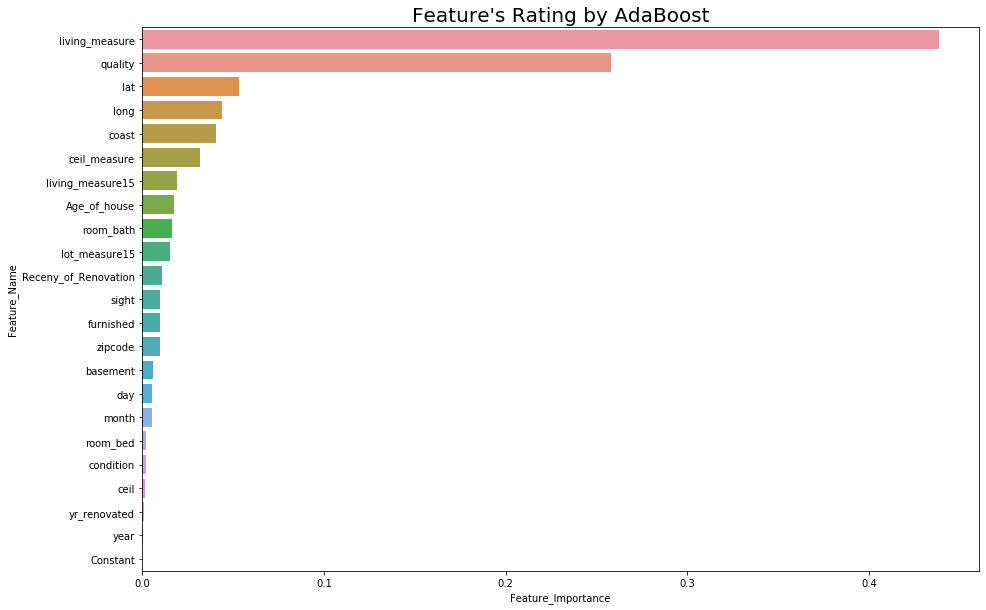

In [0]:
regressor_Adaboost_Tune.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_adaboost = pd.DataFrame(regressor_Adaboost_Tune.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_adaboost.columns = ['Feature_Name','Feature_Importance']
important_features_adaboost = important_features_adaboost.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_adaboost['Feature_Importance'], important_features_adaboost['Feature_Name'])
plt.title('Feature\'s Rating by AdaBoost', size = 20)
plt.show()

## 9.LightGBM:

In [0]:
from lightgbm import LGBMRegressor
regressor_Lightgbm_Tune = LGBMRegressor()

In [0]:
param_LightGBM = { 'boosting_type':['gbdt','dart','goss'],
                  'num_leaves':[10,15],
                  'learning_rate':[0.1,0.2,0.3],
                  'n_estimators':[600,800]
    }

In [0]:
grid_LightGBM = GridSearchCV(regressor_Lightgbm_Tune,param_LightGBM)

In [0]:
grid_LightGBM.fit(data_refined.drop('price',axis =1), data_refined['price'])

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=LGBMRegressor(boosting_type='gbdt', class_weight=None,
                                     colsample_bytree=1.0,
                                     importance_type='split', learning_rate=0.1,
                                     max_depth=-1, min_child_samples=20,
                                     min_child_weight=0.001, min_split_gain=0.0,
                                     n_estimators=100, n_jobs=-1, num_leaves=31,
                                     objective=None, random_state=None,
                                     reg_alpha=0.0, reg_lambda=0.0, silent=True,
                                     subsample=1.0, subsample_for_bin=200000,
                                     subsample_freq=0),
             iid='warn', n_jobs=None,
             param_grid={'boosting_type': ['gbdt', 'dart', 'goss'],
                         'learning_rate': [0.1, 0.2, 0.3],
                         'n_estimators

In [0]:
grid_LightGBM.best_params_
#{'boosting_type': 'dart', 'learning_rate': 0.3, 'num_leaves': 40} : 118392.16885627515
# {'boosting_type': 'dart','learning_rate': 0.3,'n_estimators': 200,'num_leaves': 35} : 116779.328443638
# {'boosting_type': 'dart','learning_rate': 0.3,'n_estimators': 300,'num_leaves': 30}
# {'boosting_type': 'dart','learning_rate': 0.2,'n_estimators': 400,'num_leaves': 25} : 112457.20980872927
# {'boosting_type': 'dart','learning_rate': 0.2,'n_estimators': 600,'num_leaves': 15} : 110088.96268360445
# {'boosting_type': 'dart','learning_rate': 0.3,'n_estimators': 800,'num_leaves': 10} : 110170.88967004193

{'boosting_type': 'dart',
 'learning_rate': 0.3,
 'n_estimators': 800,
 'num_leaves': 10}

In [0]:
from lightgbm import LGBMRegressor
regressor_Lightgbm_Tune = LGBMRegressor( boosting_type = 'dart', 
                                   learning_rate = 0.3,
                                   num_leaves = 10,
                                   n_estimators = 800)

In [0]:
nmse_LightGBM_Tune = cross_val_score(regressor_Lightgbm_Tune, data_refined.drop('price', axis = 1), data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_LightGBM_Tune = np.sqrt(abs(nmse_LightGBM_Tune))
rmse_LightGBM_Tune

array([113790.45763794, 123251.35190924, 101383.45185151, 109075.73014479,
       101494.10652206, 127212.49992951, 109878.70676944, 110948.54332537,
        93411.6182203 , 123720.57345983, 101391.55195683, 102096.05632974,
       103193.92084742, 103654.59753381, 108559.78142867, 144457.90122394,
       104176.48534273, 105082.51128791, 130077.77848715, 119789.01470603])

In [0]:
r2_score_LightGBM_Tune = cross_val_score(regressor_Lightgbm_Tune, data_refined.drop('price', axis = 1), data_refined['price'], 
                           cv = 20)
r2_score_LightGBM_Tune

array([0.91366571, 0.89005539, 0.90360041, 0.90866126, 0.93661535,
       0.90750149, 0.90461004, 0.90849791, 0.92314009, 0.87055959,
       0.91655763, 0.91743341, 0.911806  , 0.89499803, 0.88704209,
       0.88114552, 0.91541268, 0.9145017 , 0.8876296 , 0.92099718])

### Lets Check the Important Features selected by the LightGBM Regressor After Tuning:

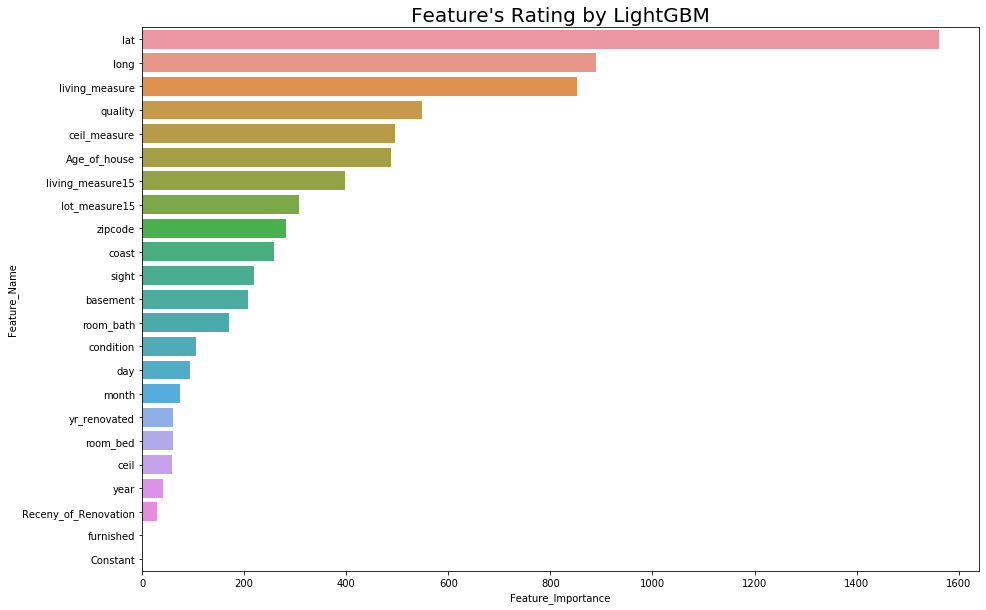

In [0]:
regressor_Lightgbm_Tune.fit(data_refined.drop('price', axis = 1), data_refined['price'])
important_features_LightGBM = pd.DataFrame(regressor_Lightgbm_Tune.feature_importances_, data_refined.drop('price', axis = 1).columns).reset_index()
important_features_LightGBM.columns = ['Feature_Name','Feature_Importance']
important_features_LightGBM = important_features_LightGBM.sort_values(by = 'Feature_Importance',ascending = False )
plt.figure(figsize = (15,10))
sns.barplot(important_features_LightGBM['Feature_Importance'], important_features_LightGBM['Feature_Name'])
plt.title('Feature\'s Rating by LightGBM', size = 20)
plt.show()


## Inference:

After tuning,'quality' has gain more importance than before tuning.

# Hyper Parameter Tuned Model Accuraceis Comparison:

## Box Plot Comparison of RMSE:

In [0]:
KNR_Tune = pd.DataFrame(rmse_grid_KNR, index = ['KNR']*20)
Decision_Tune = pd.DataFrame(rmse_grid_decision, index = ['Decision Tree']*20)
forest_Tune = pd.DataFrame(rmse_forest_tune, index = ['Random forest']*20)
Bagging_Tune = pd.DataFrame(rmse_Bagging_Tune, index = ['Bagging Regressor']*20)
adaboost_Tune = pd.DataFrame(rmse_Adaboost_Tune, index = ['AdaBoost Regressor']*20)
gradient_Tune = pd.DataFrame(rmse_Gradient_Tune, index = ['Gradient Boost Regressor']*20)
xgboost_Tune = pd.DataFrame(rmse_Xgboost_Tune, index = ['XGBoost Regressor']*20)
catboost_Tune = pd.DataFrame(rmse_catboost_Tune, index = ['CatBoost Regressor']*20)
lightgbm_Tune = pd.DataFrame(rmse_LightGBM_Tune, index = ['LighGBM Regressor']*20)

In [0]:
model_rmse_Tune = pd.concat([KNR_Tune,Decision_Tune,forest_Tune,Bagging_Tune,adaboost_Tune,gradient_Tune,
          xgboost_Tune,catboost_Tune,lightgbm_Tune]).reset_index()

In [0]:
model_rmse_Tune.columns = ['Model_name','RMSE']

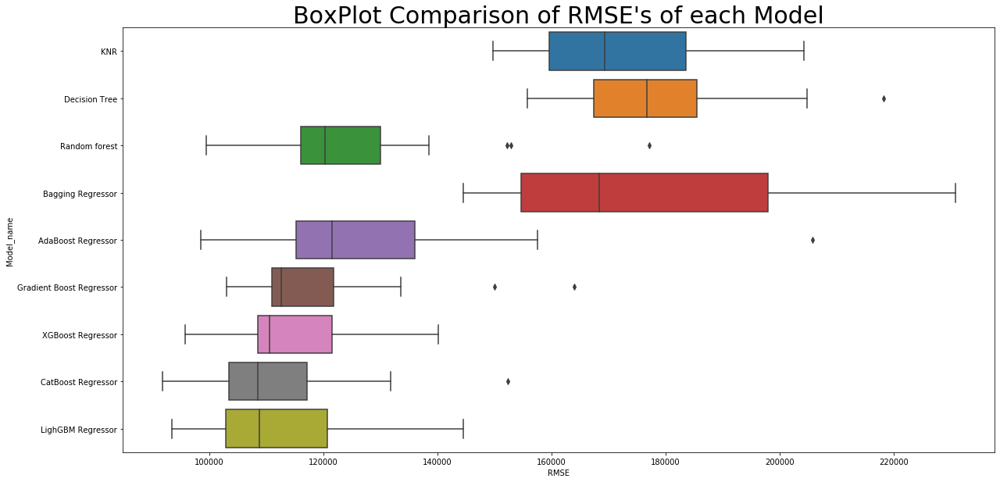

In [0]:
plt.figure(figsize = (20,10))
sns.boxplot(x = model_rmse_Tune['RMSE'],y = model_rmse_Tune['Model_name'])
plt.xticks()
plt.title('BoxPlot Comparison of RMSE\'s of each Model', size = 30)
plt.show()

## Inference:

Even though the catboost and lightgbm have same median rmse and are perfoming somewhat the same but we will go with LightGBM as out best model since the rmse calculated shows less variance in comparison to rmse calculated by catboost, thus indicating a more consistent nature of the model.

## Box Plot Comparison of R2 Score:

In [0]:
KNR_Tune_r2 = pd.DataFrame(r2_score_grid_KNR, index = ['KNR']*20)
Decision_Tune_r2 = pd.DataFrame(r2_score_grid_decision, index = ['Decision Tree']*20)
forest_Tune_r2 = pd.DataFrame(r2_score_forest_tune, index = ['Random forest']*20)
Bagging_Tune_r2 = pd.DataFrame(r2_sore_Bagging_Tune, index = ['Bagging Regressor']*20)
adaboost_Tune_r2 = pd.DataFrame(r2_score_Adaboost_Tune, index = ['AdaBoost Regressor']*20)
gradient_Tune_r2 = pd.DataFrame(r2_score_Gradient_Tune, index = ['Gradient Boost Regressor']*20)
xgboost_Tune_r2 = pd.DataFrame(r2score_Xgboost_Tune, index = ['XGBoost Regressor']*20)
catboost_Tune_r2 = pd.DataFrame(r2_score_catboost_Tune, index = ['CatBoost Regressor']*20)
lightgbm_Tune_r2 = pd.DataFrame(r2_score_LightGBM_Tune, index = ['LighGBM Regressor']*20)

In [0]:
model_r2_Tune = pd.concat([KNR_Tune_r2,Decision_Tune_r2,forest_Tune_r2,adaboost_Tune_r2,gradient_Tune_r2,
          xgboost_Tune_r2,catboost_Tune_r2,lightgbm_Tune_r2]).reset_index()

In [0]:
model_r2_Tune.columns = ['Model_name','R2_score']

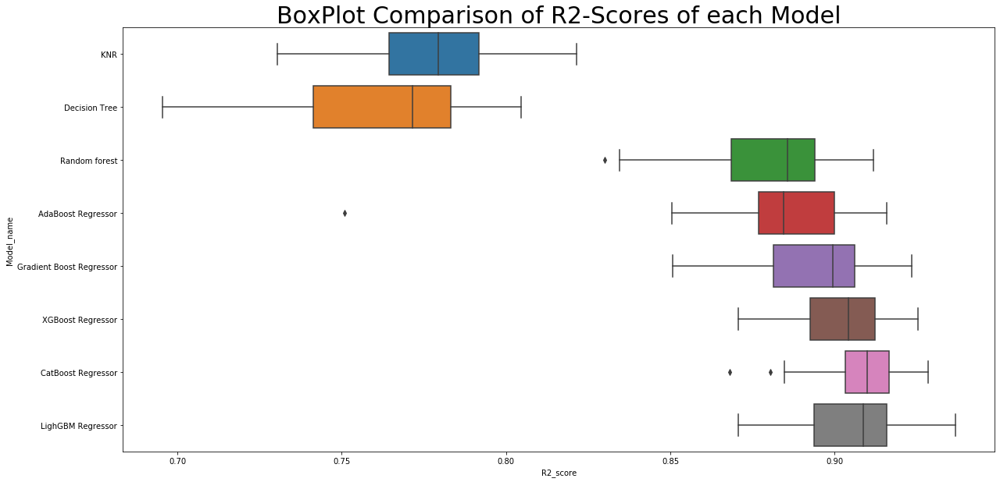

In [0]:
# We have excluded the Bagging regressor as it was giving the negative r2_score.
plt.figure(figsize = (20,10))
sns.boxplot(x = model_r2_Tune['R2_score'],y = model_r2_Tune['Model_name'])
plt.xticks()
plt.title('BoxPlot Comparison of R2-Scores of each Model', size = 30)
plt.show()

## Inference:

LightGBM and Catboost are very close contender in terms the highest r2_score shown, but we can say LightGBM is better due to it's less variance

# Feautre Extraction:

In [0]:
import statsmodels.api as stats

In [0]:
model = stats.OLS(endog = data_refined['price'], exog = data_refined.drop('price', axis =1 )).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.703
Model:                            OLS   Adj. R-squared:                  0.703
Method:                 Least Squares   F-statistic:                     2433.
Date:                Wed, 20 Nov 2019   Prob (F-statistic):               0.00
Time:                        12:39:44   Log-Likelihood:            -2.9450e+05
No. Observations:               21613   AIC:                         5.890e+05
Df Residuals:                   21591   BIC:                         5.892e+05
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
room_bed             -3.556e+04   1886.207    -18.852      0.000   -3.93e+04   -3.19e+04
room_bath             4.236e+04   3252.138     13.026      0.000     3.6e+04    4.87e+04
living_measure         109.9324      2.262     48.606      0.000     105.499     114.366
ceil                  8006.5851   3580.419      2.236      0.025     988.699     1.5e+04
coast                 5.908e+05   1.73e+04     34.152      0.000    5.57e+05    6.25e+05
sight                 5.277e+04   2130.074     24.773      0.000    4.86e+04    5.69e+04
condition             2.926e+04   2349.462     12.453      0.000    2.47e+04    3.39e+04
quality               8.536e+04   2556.499     33.388      0.000    8.03e+04    9.04e+04
ceil_measure            69.7099      2.263     30.810      0.000      65.275      74.145
basement                40.2201      2.641     15.231      0.000      35.044      45.396
yr_renovated            54.4370      5.471      9.951      0.000      43.714      65.160
zipcode               -594.6040     32.865    -18.092      0.000    -659.022    -530.186
lat                   6.069e+05   1.07e+04     56.789      0.000    5.86e+05    6.28e+05
long                 -2.164e+05   1.31e+04    -16.574      0.000   -2.42e+05   -1.91e+05
living_measure15        20.0868      3.436      5.846      0.000      13.352      26.822
lot_measure15           -0.2518      0.053     -4.762      0.000      -0.356      -0.148
furnished             4.173e+04   5755.427      7.250      0.000    3.04e+04     5.3e+04
year                  3.693e+04   4711.807      7.838      0.000    2.77e+04    4.62e+04
month                 1218.9456    707.176      1.724      0.085    -167.171    2605.062
day                   -358.6318    158.805     -2.258      0.024    -669.902     -47.362
Age_of_house          2592.5999     72.427     35.796      0.000    2450.638    2734.562
Receny_of_Renovation -3486.1462    426.563     -8.173      0.000   -4322.241   -2650.051
Constant             -7.212e+07   9.94e+06     -7.257      0.000   -9.16e+07   -5.26e+07
==============================================================================
Omnibus:                    18630.373   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          2023588.452
Skew:                           3.624   Prob(JB):                         0.00
Kurtosis:                      49.846   Cond. No.                     3.36e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.88e-21. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [0]:
explain_variable = list(data_refined.drop('price', axis =1 ).columns)
explain_variable

['room_bed',
 'room_bath',
 'living_measure',
 'ceil',
 'coast',
 'sight',
 'condition',
 'quality',
 'ceil_measure',
 'basement',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'living_measure15',
 'lot_measure15',
 'furnished',
 'year',
 'month',
 'day',
 'Age_of_house',
 'Receny_of_Renovation',
 'Constant']

In [0]:
while(True):
    model = stats.OLS(endog = data_refined['price'], exog = data_refined[explain_variable]).fit()
    pvals = model.pvalues
    max_pval = pvals[(pvals == pvals.max()) & (pvals > 0.05)]
    if(max_pval.empty == False):
        explain_variable.remove(max_pval.index[0])
        continue
    else:
        break

###  Explainatory Variable chosen using Backward elimination:

In [0]:
explain_variable
# It has removed recency_of_renovation

['room_bed',
 'room_bath',
 'living_measure',
 'ceil',
 'coast',
 'sight',
 'condition',
 'quality',
 'ceil_measure',
 'basement',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'living_measure15',
 'lot_measure15',
 'furnished',
 'year',
 'day',
 'Age_of_house',
 'Receny_of_Renovation',
 'Constant']

In [0]:
explain_variable.remove('Constant')# Removing the constant as it is no loger needed.

In [0]:
len(explain_variable)

21

## Let Apply the best tuned model on the above features:

In [0]:
from lightgbm import LGBMRegressor
regressor_Lightgbm_feature = LGBMRegressor( boosting_type = 'dart', 
                                   learning_rate = 0.3,
                                   num_leaves = 10,
                                   n_estimators = 800)

In [0]:
nmse_LightGBM_Feature = cross_val_score(regressor_Lightgbm_feature, data_refined[explain_variable], data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_LightGBM_Feature = np.sqrt(abs(nmse_LightGBM_Feature))
rmse_LightGBM_Feature

array([116944.32352529, 123819.9895138 ,  99371.28815458, 107394.427736  ,
       101701.18085965, 127113.83286759, 110487.63336682, 112911.18689088,
        94809.68501917, 124951.9003383 , 103691.15721181, 104889.23859957,
       106872.91756918, 103669.7852286 , 108211.21671083, 144029.52131013,
       105360.91886719, 105171.69859373, 125666.59138808, 116344.44235939])

In [0]:
r2_score_LightGBM_Feature = cross_val_score(regressor_Lightgbm_feature, data_refined[explain_variable], data_refined['price'],
                           cv = 20)
r2_score_LightGBM_Feature

array([0.90881363, 0.88903856, 0.90738894, 0.91145536, 0.93635644,
       0.90764492, 0.90354985, 0.90523199, 0.92082219, 0.86797026,
       0.91272968, 0.91285384, 0.90540545, 0.89496726, 0.8877663 ,
       0.88184939, 0.91347832, 0.91435651, 0.89512176, 0.92547536])

In [0]:
print ("The LightGBM Regressor model has a mean rmse of",
       rmse_LightGBM_Feature.mean(),'with a standard devition of ',rmse_LightGBM_Feature.std())
print ("The LightGBM Regressor model has a mean R2_Score of",
       r2_score_LightGBM_Feature.mean(),'with a standard devition of ',r2_score_LightGBM_Feature.std())

The LightGBM Regressor model has a mean rmse of 112170.64680552832 with a standard devition of  11612.533930125051
The LightGBM Regressor model has a mean R2_Score of 0.9051138004480419 with a standard devition of  0.015267288179501475


## Using sklearn.Kbest feature

In [0]:
from sklearn.feature_selection import SelectKBest, f_regression

In [0]:
k_best  = SelectKBest(f_regression, k = 15)
k_best_data  = k_best.fit_transform(data_refined.drop('price', axis =1 ), data_refined['price'])
k_best.get_support()

array([ True,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True, False,  True, False,  True,  True,  True, False,
       False, False, False,  True, False])

In [0]:
predictors = data_refined.drop('price', axis =1)
predictors.head()

,room_bed,room_bath,living_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,year,month,day,Age_of_house,Receny_of_Renovation,Constant
0,4,3.25,3020,1.0,0,0,5,9,3020,0,0,98133,47.7174,-122.336,2120,7553,1,2014,11,7,59,0,1
1,4,2.50,2550,1.0,0,0,3,8,1750,800,0,98023,47.3165,-122.386,2260,8800,0,2014,12,4,39,0,1
2,3,2.50,2370,2.0,0,0,3,8,2370,0,0,98038,47.3515,-121.999,2370,4348,0,2015,4,20,9,0,1
3,2,1.00,820,1.0,0,0,4,6,820,0,0,98133,47.7049,-122.349,1520,3844,0,2014,5,29,99,0,1
4,2,1.50,1400,1.0,0,0,4,8,1400,0,0,98115,47.6768,-122.269,1900,5940,0,2015,4,24,61,0,1


In [0]:
mask = k_best.get_support()
selected_features = predictors.columns[mask]
selected_features

Index(['room_bed', 'room_bath', 'living_measure', 'ceil', 'coast', 'sight',
       'quality', 'ceil_measure', 'basement', 'yr_renovated', 'lat',
       'living_measure15', 'lot_measure15', 'furnished',
       'Receny_of_Renovation'],
      dtype='object')

In [0]:
selected_features_dataframe = predictors[selected_features]
selected_features_dataframe.head()

,room_bed,room_bath,living_measure,ceil,coast,sight,quality,ceil_measure,basement,yr_renovated,lat,living_measure15,lot_measure15,furnished,Receny_of_Renovation
0,4,3.25,3020,1.0,0,0,9,3020,0,0,47.7174,2120,7553,1,0
1,4,2.50,2550,1.0,0,0,8,1750,800,0,47.3165,2260,8800,0,0
2,3,2.50,2370,2.0,0,0,8,2370,0,0,47.3515,2370,4348,0,0
3,2,1.00,820,1.0,0,0,6,820,0,0,47.7049,1520,3844,0,0
4,2,1.50,1400,1.0,0,0,8,1400,0,0,47.6768,1900,5940,0,0


### Lets Apply the best model on the above the dataframe of selected features from SelectKbest

In [0]:
from lightgbm import LGBMRegressor
regressor_Lightgbm_KBest = LGBMRegressor( boosting_type = 'dart', 
                                   learning_rate = 0.3,
                                   num_leaves = 10,
                                   n_estimators = 800)

In [0]:
nmse_LightGBM_KBest = cross_val_score(regressor_Lightgbm_KBest, selected_features_dataframe, data_refined['price'], scoring= 'neg_mean_squared_error',
                           cv = 20)
# While doing the scoring in cross vall we chose the parameter as 'neg_mean_squared_error' so we have to take the absolute
# then followed by the square root to get the equivalent rmse
rmse_LightGBM_KBest = np.sqrt(abs(nmse_LightGBM_KBest))
rmse_LightGBM_KBest

array([174822.0808784 , 133895.64852988, 136998.94961001, 129893.37786784,
       127340.3832699 , 150345.16001558, 146047.6881305 , 145647.6718511 ,
       123709.82969894, 162557.16263042, 133464.74290722, 141640.39881031,
       135072.51553938, 131565.04348889, 135613.33522822, 158845.20988798,
       133770.54603453, 138689.31430951, 144061.22094095, 159195.80666464])

In [0]:
r2_score_LightGBM_KBest = cross_val_score(regressor_Lightgbm_KBest, data_refined[explain_variable], data_refined['price'],
                           cv = 20)
r2_score_LightGBM_KBest

array([0.90881363, 0.88903856, 0.90738894, 0.91145536, 0.93635644,
       0.90764492, 0.90354985, 0.90523199, 0.92082219, 0.86797026,
       0.91272968, 0.91285384, 0.90540545, 0.89496726, 0.8877663 ,
       0.88184939, 0.91347832, 0.91435651, 0.89512176, 0.92547536])

In [0]:
print ("The LightGBM Regressor model has a mean rmse of",
       rmse_LightGBM_KBest.mean(),'with a standard devition of ',rmse_LightGBM_KBest.std())
print ("The LightGBM Regressor model has a mean R2_Score of",
       r2_score_LightGBM_KBest.mean(),'with a standard devition of ',r2_score_LightGBM_KBest.std())

The LightGBM Regressor model has a mean rmse of 142158.8043147097 with a standard devition of  12881.083738830699
The LightGBM Regressor model has a mean R2_Score of 0.9051138004480419 with a standard devition of  0.015267288179501475


# Multivariate Adaptive Ragression Splines (MARS)

MARS builds a model of the from

<img src='Picture3.png'>
  
where 'x' is a sample vector, 'Bi' is a function from a set of basis functions (later called terms) and 'Ci' the associated coefficient.

The basis functions are one of the following:
1. Constant 1, the so called intercept to reduce bias,

2. A hinge function h(x) = max(0,x-t) or max(0,t-x) (also called rectifier functions),
where  is a constant, to model non-linearities,

3. A product of two or more hinge functions to automatically model interactions between features.

<img src='Picture4.png'>

In [267]:
from sklearn.model_selection import cross_val_score
from pyearth import Earth
def rmse_cv(model):
    rmse= np.sqrt(-cross_val_score(model,data_refined.drop('price', axis = 1), data_refined['price'], scoring="neg_mean_squared_error", cv = 20))
    return(rmse)

def r2score_cv(model):
    r2score_mars= cross_val_score(model,data_refined.drop('price', axis = 1), data_refined['price'], cv = 20)
    return(r2score_mars)

In [265]:
mars = Earth(max_degree=2, penalty=1.0, minspan_alpha = 0.01, endspan_alpha = 0.01, endspan=5)

In [0]:
rmse_mars = rmse_cv(mars)
rmse_mars


array([143185.09739512, 168383.2758121 , 155070.58307892, 154136.47130416,
       160355.34868432, 182205.91753381, 170653.63487582, 165616.51643654,
       152738.76447029, 172674.89697481, 156579.10780513, 160363.93463471,
       156887.24997859, 295972.19243433, 157615.72261161, 171695.46721167,
       152210.03759703, 164503.96337587, 172409.33634973, 270830.58412548])

In [0]:
print ("The MARS model has a mean RMSE of",
       rmse_mars.mean(),'with a standard devition of ',rmse_mars.std())

The MARS model has a mean RMSE of 174204.40513450027 with a standard devition of  37682.130971288694


In [268]:
r2score_mars = r2score_cv(mars)
r2score_mars

array([0.8633003 , 0.79476643, 0.77447237, 0.81760656, 0.84177531,
       0.81024183, 0.76990516, 0.80326924, 0.79450566, 0.74738703,
       0.80100107, 0.79629786, 0.79615227, 0.14391424, 0.76189277,
       0.83207769, 0.81942314, 0.79046786, 0.80258615, 0.6017592 ])

### Inference:- Although MARS is good way to deal with non-linear data, but in case of our data, it's performance is average.

## Comparison of metrics of all models.

## Mean RMSE’s for 20 Cross Folds for the Models
<img src='Picture1.png'>

## Mean R2Score’s for 20 Cross Folds for the Models
<img src='Picture2.png'>

# Conclusion:

### We are choosing CatBoost Regressor as our Best Model which is exhibiting a Mean RMSE of 109049.09 and is having a Mean R2Score of 0.9103093.

### Range Estimate of RMSE Score:
### Range estimate is calculated by adding and subtracting the Standard Deviation(12293.05) from the Mean value of the RMSE:

### Lower Limit :  96,756.03  
### Upper Limit :  1,21,342.14


 

### Range Estimate of R2 Score: 

### Lower Limit:  0.8945
### Upper Limit:  0.9260

### Note : Our Metrics Values are more likely to lie in the Range Estimated calculated above.